In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import shapiro, kstest, anderson
import seaborn as sns
from datetime import timedelta
from IPython.display import display

In [2]:
# Preprocessing with Dask
df = pd.read_csv('../input/power_data.csv')

In [3]:
# Convert 'date' column to datetime for easy manipulation
df['date'] = pd.to_datetime(df['date'])

In [4]:
# Add a 'year' column to simplify annual analysis
df['year'] = df['date'].dt.year

In [5]:
# Extract additional time-based features
def extract_time_features(data: pd.DataFrame) -> pd.DataFrame:
    """
    Adds additional time-based features to the DataFrame. Assumes 'date' column is present.
    """
    features = ['hour', 'day_of_week', 'month', 'week_of_year', 'time_delta']
    if all(f in data.columns for f in features):
        return data  # Avoid duplicating work if features already exist

    data['hour'] = data['date'].dt.hour
    data['day_of_week'] = data['date'].dt.dayofweek
    data['month'] = data['date'].dt.month
    data['week_of_year'] = data['date'].dt.isocalendar().week
    data['time_delta'] = data['date'].diff().dt.total_seconds().fillna(0)
    return data

In [6]:
# Split the DataFrame by year
def split_by_year(data: pd.DataFrame):
    """
    Splits the DataFrame by year and returns a dictionary {year: df_for_year}.
    """
    return {yr: group for yr, group in data.groupby(data['year'])}

In [7]:
# Generic method to plot price action
def plot_price_action(data: pd.DataFrame, year: int = None):
    """
    Plots the 'close' price for the given DataFrame.

    If a year is provided, the plot focuses on that year's input.
    If no year is provided, the plot spans the entire period in the DataFrame.
    """
    title = (
        f"Price Action for the Year {year}" if year
        else f"Price Action for the Period {data['date'].min().strftime('%m/%Y')} - {data['date'].max().strftime('%m/%Y')}"
    )

    # Filter by year if provided
    filtered_data = data[data['year'] == year] if year else data

    # Plotting
    plt.figure(figsize=(21, 7))
    plt.plot(filtered_data['date'], filtered_data['close'], label='Close Price', color='blue')
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Close Price')
    plt.grid(True)
    plt.legend()
    plt.show()

    # Clear the plot after display
    plt.clf()  # Clear the current figure
    plt.close()  # Close the figure completely to free memory

In [8]:
# Analyze input symmetry, skewness, and outliers
def analyze_data_distribution(data, columns=None):
    """
    Analyze input symmetry, skewness, and outliers for specified columns.

    Args:
    input (pd.DataFrame): The DataFrame containing the input.
    columns (list, optional): List of column names to analyze. Analyzes all numeric columns by default.

    Returns:
    pd.DataFrame: Summary of symmetry, skewness, and outlier presence for each column.
    """
    columns = columns or data.select_dtypes(include=[np.number]).columns.tolist()
    summary = []

    for column in columns:
        col_data = data[column].dropna()  # Remove NaN values for analysis

        # Calculate metrics
        mean, median, std = col_data.mean(), col_data.median(), col_data.std()
        skewness = col_data.skew()
        symmetry = "Symmetric" if np.isclose(mean, median, atol=std * 0.1) else "Skewed"
        skew_type = "Right-Skewed" if skewness > 0 else "Left-Skewed" if skewness < 0 else "Symmetric"

        # Outliers using IQR
        Q1, Q3 = col_data.quantile(0.25), col_data.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound, upper_bound = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
        outliers = col_data[(col_data < lower_bound) | (col_data > upper_bound)].count()

        summary.append({
            "Column": column,
            "Mean": mean,
            "Median": median,
            "Skewness": skewness,
            "Skew Type": skew_type,
            "Symmetry": symmetry,
            "Outliers Count": outliers,
            "Lower Bound": lower_bound,
            "Upper Bound": upper_bound
        })

    return pd.DataFrame(summary)

In [9]:
# Handle missing values
def handle_missing_values(data, threshold=5, fill_method='median', rolling_window_days=90, date_column='date'):
    """
    Handles missing values in a DataFrame based on a specified threshold and filling method.

    Args:
    input (pd.DataFrame): The DataFrame to process.
    threshold (float): Percentage threshold to decide whether to fill or drop columns.
    fill_method (str): Method to fill missing values ('mean', 'median', or 'rolling_median').
    rolling_window_days (int): Rolling window size in days (used only if fill_method='rolling_median').
    date_column (str): The column name containing datetime information.

    Returns:
    pd.DataFrame: Processed DataFrame with missing values handled.
    """
    total_rows = len(data)
    for column in data.columns:
        missing_count = data[column].isna().sum()
        missing_percentage = (missing_count / total_rows) * 100

        if missing_percentage == 0:
            continue  # No missing values to handle

        print(f"Column: {column}, Missing Percentage: {missing_percentage:.2f}%")

        if missing_percentage < threshold:
            if fill_method == 'mean':
                fill_value = data[column].mean()
                data[column] = data[column].fillna(fill_value)
                print(f"Filled missing values in '{column}' with mean ({fill_value:.2f})")
            elif fill_method == 'median':
                fill_value = data[column].median()
                data[column] = data[column].fillna(fill_value)
                print(f"Filled missing values in '{column}' with median ({fill_value:.2f})")
            elif fill_method == 'rolling_median':
                # Use rolling median strategy
                data[column] = fill_missing_with_rolling_median(data, date_column, column, rolling_window_days)
                print(f"Filled missing values in '{column}' with rolling median over {rolling_window_days} days")
            else:
                raise ValueError("Invalid fill method. Choose 'mean', 'median', or 'rolling_median'.")
        else:
            # Drop the column if missing percentage is above the threshold
            data.drop(columns=[column], inplace=True)
            print(f"Dropped column '{column}' due to high missing percentage ({missing_percentage:.2f}%)")

    return data

In [10]:
# Specialized function for rolling median
def fill_missing_with_rolling_median(data, date_column, target_column, rolling_window_days):
    """
    Fills missing values in a target column using the median of a rolling window.

    Args:
    input (pd.DataFrame): The DataFrame containing the input.
    date_column (str): The column name for the datetime information.
    target_column (str): The column with missing values to fill.
    rolling_window_days (int): Number of days for the rolling window.

    Returns:
    pd.Series: A series with filled missing values.
    """
    filled_column = data[target_column].copy()

    for index, row in data.iterrows():
        if pd.isna(row[target_column]):
            # Define the rolling window timeframe
            start_date = row[date_column] - timedelta(days=rolling_window_days)
            end_date = row[date_column]

            # Filter the input to the rolling window
            window_data = data[
                (data[date_column] >= start_date) &
                (data[date_column] <= end_date)
            ][target_column].dropna()

            # Compute the median and fill the missing value
            if not window_data.empty:
                filled_column.at[index] = window_data.median()

    return filled_column

In [11]:
# Print the price trend for the entire dataset or a specific year
def print_price_trend(data: pd.DataFrame, year: int = None):
    """
    Prints the price trend for the entire dataset or a specific year.

    Args:
    input (pd.DataFrame): The dataset containing 'date' and 'close' columns.
    year (int, optional): The specific year to analyze. Defaults to None.
    """
    # Filter input for the specified year if provided
    filtered_data = data[data['year'] == year] if year else data

    # Calculate starting and ending prices
    start_price = filtered_data['close'].iloc[0]
    end_price = filtered_data['close'].iloc[-1]

    # Determine the trend
    trend = "increased" if end_price > start_price else "decreased" if end_price < start_price else "remained the same"
    percentage_change = ((end_price - start_price) / start_price) * 100

    # Print the trend
    if year:
        print(f"Price trend for the year {year}:")
    else:
        print("Price trend for the entire dataset:")

    print(f"Start Price: {start_price:.2f}")
    print(f"End Price: {end_price:.2f}")
    print(f"Trend: The price {trend} by {percentage_change:.2f}%.\n")

In [12]:
def perform_normality_tests(data, columns=None, shapiro_sample_size=5000):
    """
    Perform normality tests (Shapiro-Wilk, Kolmogorov-Smirnov, Anderson-Darling)
    for specified columns in a DataFrame.

    Args:
    input (pd.DataFrame): The DataFrame containing the input.
    columns (list, optional): List of column names to test. Defaults to all numeric columns.
    shapiro_sample_size (int): Maximum sample size for the Shapiro-Wilk test.

    Returns:
    pd.DataFrame: Summary of normality test results.
    """
    columns = columns or data.select_dtypes(include=[np.number]).columns
    results = []

    for column in columns:
        col_data = data[column].dropna()  # Drop missing values

        # Skip columns with insufficient input or zero range
        if len(col_data) < 3:
            print(f"Skipping column '{column}' due to insufficient input.")
            continue

        if col_data.max() - col_data.min() == 0:
            print(f"Skipping column '{column}' due to zero range (all values are identical).")
            continue

        # Subsample for Shapiro-Wilk
        shapiro_data = col_data.sample(min(len(col_data), shapiro_sample_size), random_state=42)

        # Check range for the subsample
        if shapiro_data.max() - shapiro_data.min() == 0:
            print(f"Skipping column '{column}' (Subsample has zero range).")
            continue

        # Shapiro-Wilk Test
        shapiro_stat, shapiro_p = shapiro(shapiro_data)
        shapiro_result = "Normal" if shapiro_p > 0.05 else "Not Normal"

        # Kolmogorov-Smirnov Test
        ks_stat, ks_p = kstest(col_data, 'norm', args=(col_data.mean(), col_data.std()))
        ks_result = "Normal" if ks_p > 0.05 else "Not Normal"

        # Anderson-Darling Test
        ad_result = anderson(col_data, dist='norm')
        ad_stat = ad_result.statistic
        ad_critical = ad_result.critical_values[2]  # 5% significance level
        ad_result_final = "Normal" if ad_stat < ad_critical else "Not Normal"

        # Append results
        results.append({
            "Column": column,
            "Shapiro-Wilk": shapiro_result,
            "Shapiro p-value": shapiro_p,
            "Kolmogorov-Smirnov": ks_result,
            "KS p-value": ks_p,
            "Anderson-Darling": ad_result_final,
            "AD Statistic": ad_stat,
            "AD Critical Value (5%)": ad_critical
        })

    # Convert results to a DataFrame
    results_df = pd.DataFrame(results)
    return results_df

In [13]:
# Check for missing values
print("Missing values before dropping rows:")
print(df.isna().sum())

Missing values before dropping rows:
date             0
symbol           0
open             0
high             0
low              0
close            0
Volume USDT      0
tradecount       0
token            0
hour             0
day              0
ema_5            0
ema_15           0
ema_30           0
ema_60           0
ema_100          0
ema_200          0
WMA             13
MACD            25
MACD_Signal     33
MACD_Hist       33
ATR             14
HMA             11
KAMA             9
CMO             14
Z-Score        154
QStick           9
year             0
dtype: int64


In [14]:
# Analyze the distribution for numeric columns
distribution_summary = analyze_data_distribution(df)

# Display the summary
print("Distribution Analysis Summary (Entire Dataset):")
display(distribution_summary)

Distribution Analysis Summary (Entire Dataset):


,Column,Mean,Median,Skewness,Skew Type,Symmetry,Outliers Count,Lower Bound,Upper Bound
0,open,2.834777e+04,2.675128e+04,0.491224,Right-Skewed,Skewed,0,-1.713382e+04,7.318862e+04
1,high,2.836410e+04,2.675846e+04,0.491263,Right-Skewed,Skewed,0,-1.716511e+04,7.325628e+04
2,low,2.833144e+04,2.674433e+04,0.491139,Right-Skewed,Skewed,0,-1.710287e+04,7.312216e+04
3,close,2.834778e+04,2.675128e+04,0.491224,Right-Skewed,Skewed,0,-1.713381e+04,7.318861e+04
4,Volume USDT,1.943680e+06,1.084630e+06,7.597379,Right-Skewed,Skewed,161625,-2.120176e+06,4.872645e+06
5,tradecount,1.510783e+03,7.650000e+02,4.900996,Right-Skewed,Skewed,196526,-1.573500e+03,3.702500e+03
6,hour,1.150389e+01,1.200000e+01,-0.000802,Left-Skewed,Symmetric,0,-1.200000e+01,3.600000e+01
7,ema_5,2.834779e+04,2.675206e+04,0.491212,Right-Skewed,Skewed,0,-1.713296e+04,7.318649e+04
8,ema_15,2.834782e+04,2.675294e+04,0.491189,Right-Skewed,Skewed,0,-1.713484e+04,7.318890e+04
9,ema_30,2.834787e+04,2.675294e+04,0.491156,Right-Skewed,Skewed,0,-1.713815e+04,7.319366e+04


In [15]:
# Process the dataset for statistical analysis
df = extract_time_features(df)
df = handle_missing_values(df)

Column: WMA, Missing Percentage: 0.00%
Filled missing values in 'WMA' with median (26752.13)
Column: MACD, Missing Percentage: 0.00%
Filled missing values in 'MACD' with median (-0.08)
Column: MACD_Signal, Missing Percentage: 0.00%
Filled missing values in 'MACD_Signal' with median (0.00)
Column: MACD_Hist, Missing Percentage: 0.00%
Filled missing values in 'MACD_Hist' with median (-0.10)
Column: ATR, Missing Percentage: 0.00%
Filled missing values in 'ATR' with median (25.15)
Column: HMA, Missing Percentage: 0.00%
Filled missing values in 'HMA' with median (26751.02)
Column: KAMA, Missing Percentage: 0.00%
Filled missing values in 'KAMA' with median (26751.57)
Column: CMO, Missing Percentage: 0.00%
Filled missing values in 'CMO' with median (-0.12)
Column: Z-Score, Missing Percentage: 0.01%
Filled missing values in 'Z-Score' with median (-0.01)
Column: QStick, Missing Percentage: 0.00%
Filled missing values in 'QStick' with median (0.01)


In [16]:
# Verify results
print("\nProcessed Data Summary:")
print(df.info())


Processed Data Summary:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1997210 entries, 0 to 1997209
Data columns (total 32 columns):
 #   Column        Dtype         
---  ------        -----         
 0   date          datetime64[ns]
 1   symbol        object        
 2   open          float64       
 3   high          float64       
 4   low           float64       
 5   close         float64       
 6   Volume USDT   int64         
 7   tradecount    int64         
 8   token         object        
 9   hour          int32         
 10  day           object        
 11  ema_5         float64       
 12  ema_15        float64       
 13  ema_30        float64       
 14  ema_60        float64       
 15  ema_100       float64       
 16  ema_200       float64       
 17  WMA           float64       
 18  MACD          float64       
 19  MACD_Signal   float64       
 20  MACD_Hist     float64       
 21  ATR           float64       
 22  HMA           float64       
 23  KAMA   

In [17]:
# Split the dataset by year and analyze each year's input
yearly_data = split_by_year(df)
for year, data in yearly_data.items():
    print(f"\nDistribution Analysis Summary (Year {year}):")
    yearly_summary = analyze_data_distribution(data)
    display(yearly_summary)  # Use display for better formatting


Distribution Analysis Summary (Year 2020):


,Column,Mean,Median,Skewness,Skew Type,Symmetry,Outliers Count,Lower Bound,Upper Bound
0,open,1.106489e+04,9692.440000,1.792518,Right-Skewed,Skewed,71844,4.698100e+03,1.579122e+04
1,high,1.107059e+04,9696.130000,1.794272,Right-Skewed,Skewed,71863,4.705435e+03,1.579276e+04
2,low,1.105896e+04,9688.550000,1.790685,Right-Skewed,Skewed,71811,4.692450e+03,1.578773e+04
3,close,1.106493e+04,9692.420000,1.792549,Right-Skewed,Skewed,71847,4.698145e+03,1.579115e+04
4,Volume USDT,1.356381e+06,712573.000000,13.255836,Right-Skewed,Skewed,46227,-1.250797e+06,3.023739e+06
5,tradecount,5.806934e+02,379.000000,7.397680,Right-Skewed,Skewed,36420,-5.410000e+02,1.435000e+03
6,hour,1.149996e+01,11.000000,0.000272,Right-Skewed,Symmetric,0,-1.450000e+01,3.750000e+01
7,ema_5,1.106501e+04,9692.536258,1.792598,Right-Skewed,Skewed,71848,4.698677e+03,1.579076e+04
8,ema_15,1.106522e+04,9692.508614,1.792725,Right-Skewed,Skewed,71874,4.699420e+03,1.578937e+04
9,ema_30,1.106553e+04,9692.381077,1.792918,Right-Skewed,Skewed,71866,4.700083e+03,1.578853e+04



Distribution Analysis Summary (Year 2021):


,Column,Mean,Median,Skewness,Skew Type,Symmetry,Outliers Count,Lower Bound,Upper Bound
0,open,4.735781e+04,4.789814e+04,-0.044405,Left-Skewed,Symmetric,0,1.083860e+04,8.342458e+04
1,high,4.739365e+04,4.792999e+04,-0.044783,Left-Skewed,Symmetric,0,1.087829e+04,8.346951e+04
2,low,4.732203e+04,4.786696e+04,-0.044059,Left-Skewed,Symmetric,0,1.079332e+04,8.338442e+04
3,close,4.735784e+04,4.789814e+04,-0.044405,Left-Skewed,Symmetric,0,1.083838e+04,8.342477e+04
4,Volume USDT,2.199850e+06,1.449567e+06,7.083396,Right-Skewed,Skewed,40790,-1.621944e+06,5.002266e+06
5,tradecount,1.278538e+03,9.840000e+02,7.274845,Right-Skewed,Skewed,32985,-5.730000e+02,2.731000e+03
6,hour,1.151315e+01,1.200000e+01,-0.003343,Left-Skewed,Symmetric,0,-1.200000e+01,3.600000e+01
7,ema_5,4.735776e+04,4.789932e+04,-0.044412,Left-Skewed,Symmetric,0,1.083729e+04,8.342501e+04
8,ema_15,4.735755e+04,4.789771e+04,-0.044499,Left-Skewed,Symmetric,0,1.084066e+04,8.341767e+04
9,ema_30,4.735724e+04,4.789764e+04,-0.044639,Left-Skewed,Symmetric,1,1.085172e+04,8.340988e+04



Distribution Analysis Summary (Year 2022):


,Column,Mean,Median,Skewness,Skew Type,Symmetry,Outliers Count,Lower Bound,Upper Bound
0,open,2.822646e+04,2.314820e+04,0.445932,Right-Skewed,Skewed,0,-9.712028e+03,6.824451e+04
1,high,2.824132e+04,2.316019e+04,0.445486,Right-Skewed,Skewed,0,-9.717170e+03,6.827899e+04
2,low,2.821182e+04,2.313561e+04,0.446356,Right-Skewed,Skewed,0,-9.707934e+03,6.821396e+04
3,close,2.822640e+04,2.314795e+04,0.445938,Right-Skewed,Skewed,0,-9.712107e+03,6.824451e+04
4,Volume USDT,2.281915e+06,1.427310e+06,5.800340,Right-Skewed,Skewed,37603,-2.464308e+06,5.934434e+06
5,tradecount,2.284043e+03,1.563000e+03,3.508150,Right-Skewed,Skewed,22759,-3.215500e+03,6.956500e+03
6,hour,1.150000e+01,1.150000e+01,0.000000,Symmetric,Symmetric,0,-1.150000e+01,3.450000e+01
7,ema_5,2.822634e+04,2.314866e+04,0.445943,Right-Skewed,Skewed,0,-9.710992e+03,6.824252e+04
8,ema_15,2.822617e+04,2.314816e+04,0.445957,Right-Skewed,Skewed,0,-9.713436e+03,6.824666e+04
9,ema_30,2.822592e+04,2.314786e+04,0.445978,Right-Skewed,Skewed,0,-9.713956e+03,6.824823e+04



Distribution Analysis Summary (Year 2023):


,Column,Mean,Median,Skewness,Skew Type,Symmetry,Outliers Count,Lower Bound,Upper Bound
0,open,2.642933e+04,27003.235000,-1.072032,Left-Skewed,Skewed,16898,1.851178e+04,3.525594e+04
1,high,2.643648e+04,27010.005000,-1.073062,Left-Skewed,Skewed,16897,1.853248e+04,3.526155e+04
2,low,2.642214e+04,26996.725000,-1.070974,Left-Skewed,Skewed,16898,1.849231e+04,3.525008e+04
3,close,2.642937e+04,27003.240000,-1.072023,Left-Skewed,Skewed,16897,1.851205e+04,3.525579e+04
4,Volume USDT,1.936919e+06,686671.500000,6.006053,Right-Skewed,Skewed,40002,-2.608447e+06,5.061919e+06
5,tradecount,1.999181e+03,625.000000,3.925960,Right-Skewed,Skewed,35202,-3.139000e+03,6.141000e+03
6,hour,1.150212e+01,12.000000,0.000020,Right-Skewed,Symmetric,0,-1.200000e+01,3.600000e+01
7,ema_5,2.642951e+04,27003.695017,-1.071600,Left-Skewed,Skewed,16897,1.851411e+04,3.525485e+04
8,ema_15,2.642986e+04,27004.008458,-1.070209,Left-Skewed,Skewed,16900,1.851329e+04,3.525427e+04
9,ema_30,2.643040e+04,27003.987380,-1.068072,Left-Skewed,Skewed,16904,1.851819e+04,3.524944e+04


Displaying price action for the entire dataset...


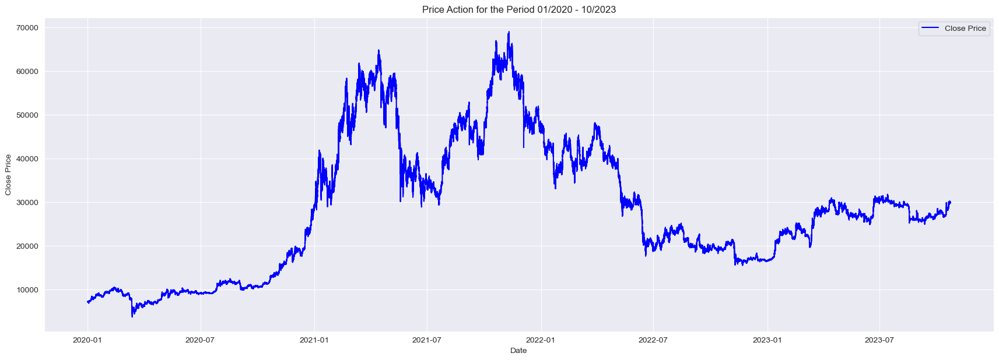

In [18]:
# Display price action for the entire dataset
print("Displaying price action for the entire dataset...")
plot_price_action(df)

Displaying price action for each year...


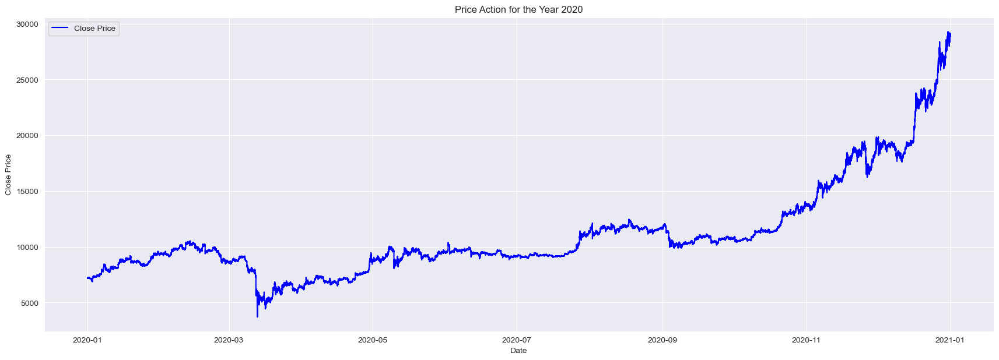

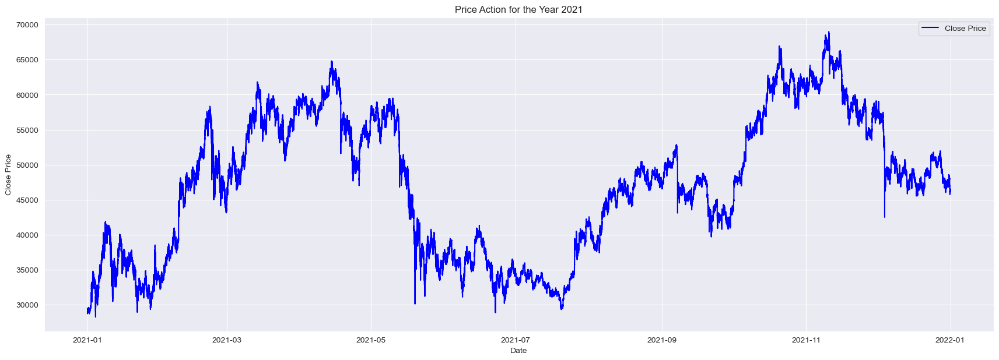

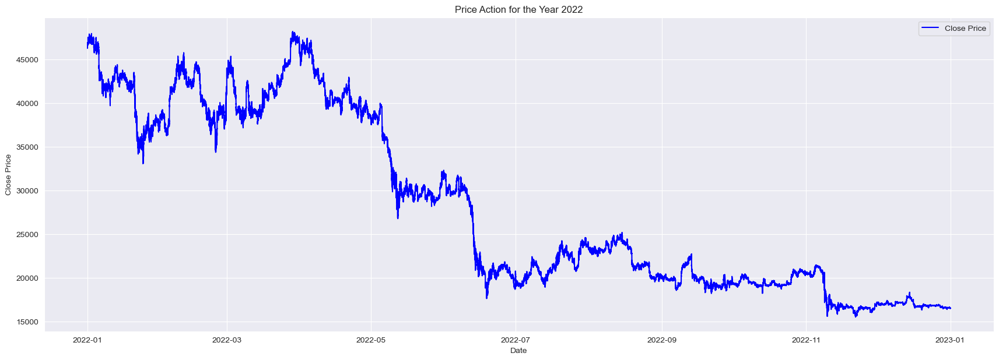

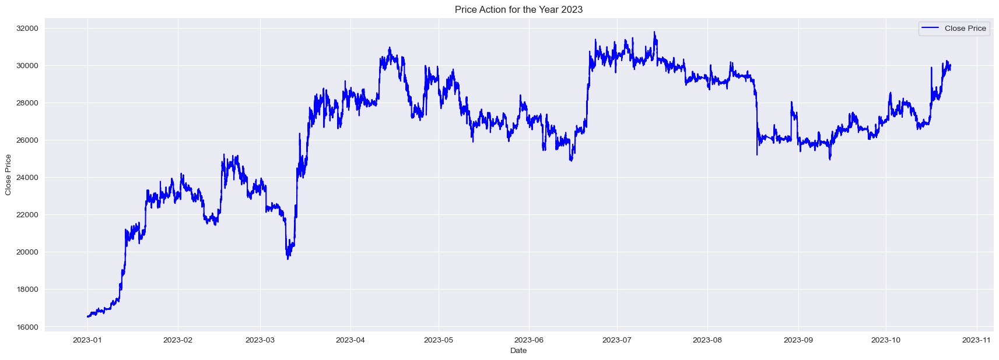

In [19]:
# Display price action for each year
print("Displaying price action for each year...")
yearly_data = split_by_year(df)  # Split the dataset by year
for year, yearly_df in yearly_data.items():
    plot_price_action(yearly_df, year)

In [20]:
# Print price trend for the entire dataset
print_price_trend(df)

Price trend for the entire dataset:
Start Price: 7179.01
End Price: 29992.46
Trend: The price increased by 317.78%.



In [21]:
# Print price trend for each year
yearly_data = split_by_year(df)  # Split the dataset by year
for year, yearly_df in yearly_data.items():
    print_price_trend(yearly_df, year)

Price trend for the year 2020:
Start Price: 7179.01
End Price: 28923.63
Trend: The price increased by 302.89%.

Price trend for the year 2021:
Start Price: 28961.66
End Price: 46216.93
Trend: The price increased by 59.58%.

Price trend for the year 2022:
Start Price: 46250.00
End Price: 16542.40
Trend: The price decreased by -64.23%.

Price trend for the year 2023:
Start Price: 16543.67
End Price: 29992.46
Trend: The price increased by 81.29%.



In [22]:
from IPython.display import display

# General Overview and Structure
print("=" * 50)
print("GENERAL OVERVIEW AND STRUCTURE")
print("=" * 50)

print(f"Total Rows: {len(df)}")
print(f"Total Columns: {len(df.columns)}")
print(f"Date Range: {df['date'].min()} to {df['date'].max()}\n")

print("Dataset Structure:")
print("-" * 50)
display(df.info())  # df.info() prints directly; we leave this as it does not return a DataFrame.

print("\nDescriptive Statistics (Entire Dataset):")
print("-" * 50)
display(df.describe(include='all'))  # Use display for better formatting

GENERAL OVERVIEW AND STRUCTURE
Total Rows: 1997210
Total Columns: 32
Date Range: 2020-01-01 00:01:00 to 2023-10-22 23:59:00

Dataset Structure:
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1997210 entries, 0 to 1997209
Data columns (total 32 columns):
 #   Column        Dtype         
---  ------        -----         
 0   date          datetime64[ns]
 1   symbol        object        
 2   open          float64       
 3   high          float64       
 4   low           float64       
 5   close         float64       
 6   Volume USDT   int64         
 7   tradecount    int64         
 8   token         object        
 9   hour          int32         
 10  day           object        
 11  ema_5         float64       
 12  ema_15        float64       
 13  ema_30        float64       
 14  ema_60        float64       
 15  ema_100       float64       
 16  ema_200       float64       
 17  WMA           float64       
 18  MACD   

None


Descriptive Statistics (Entire Dataset):
--------------------------------------------------


,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
count,1997210,1997210,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1997210,1.997210e+06,...,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1.997210e+06,1997210.0,1.997210e+06
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
top,NaN,BTCUSDT,NaN,NaN,NaN,NaN,NaN,NaN,BTC,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
freq,NaN,1470521,NaN,NaN,NaN,NaN,NaN,NaN,1997210,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
mean,2021-11-25 05:55:32.246686464,NaN,2.834777e+04,2.836410e+04,2.833144e+04,2.834778e+04,1.943680e+06,1.510783e+03,NaN,1.150389e+01,...,2.834777e+04,2.834718e+04,-4.089449e-01,-1.446718e-02,1.115378e-02,2.021420e+03,3.004968e+00,6.278287e+00,25.595482,6.017508e+01
min,2020-01-01 00:01:00,NaN,3.706960e+03,3.779000e+03,3.621810e+03,3.706960e+03,0.000000e+00,0.000000e+00,NaN,0.000000e+00,...,3.710075e+03,0.000000e+00,-9.851256e+01,-5.294722e+00,-6.405370e+02,2.020000e+03,0.000000e+00,1.000000e+00,1.0,0.000000e+00
25%,2020-12-12 18:43:15,NaN,1.673710e+04,1.674291e+04,1.673151e+04,1.673710e+04,5.021320e+05,4.050000e+02,NaN,6.000000e+00,...,1.673706e+04,1.673693e+04,-1.634124e+01,-1.070748e+00,-2.402000e+00,2.020000e+03,1.000000e+00,3.000000e+00,13.0,6.000000e+01
50%,2021-11-25 09:48:30,NaN,2.675128e+04,2.675846e+04,2.674433e+04,2.675128e+04,1.084630e+06,7.650000e+02,NaN,1.200000e+01,...,2.675102e+04,2.675157e+04,-1.232780e-01,-8.871890e-03,9.000000e-03,2.021000e+03,3.000000e+00,6.000000e+00,25.0,6.000000e+01
75%,2022-11-07 03:30:45,NaN,3.931771e+04,3.934826e+04,3.928777e+04,3.931770e+04,2.250337e+06,1.724000e+03,NaN,1.800000e+01,...,3.931876e+04,3.931787e+04,1.568401e+01,1.047175e+00,2.437000e+00,2.022000e+03,5.000000e+00,9.000000e+00,38.0,6.000000e+01
max,2023-10-22 23:59:00,NaN,6.900000e+04,6.900000e+04,6.878670e+04,6.900000e+04,1.609358e+08,1.073150e+05,NaN,2.300000e+01,...,6.887801e+04,6.863613e+04,9.992688e+01,5.316525e+00,5.377490e+02,2.023000e+03,6.000000e+00,1.200000e+01,53.0,1.729200e+05


In [23]:
# Overview for each year
print("\n" + "="*50)
print("BASIC STATISTICS BY YEAR")
print("="*50)
yearly_data = split_by_year(df)

for year, yearly_df in yearly_data.items():
    print(f"\nYear {year}:")
    print(f"Rows: {len(yearly_df)}")
    print(f"Date Range: {yearly_df['date'].min()} to {yearly_df['date'].max()}")
    print(f"Descriptive Statistics for {year}:")
    print("-"*50)
    display(yearly_df.describe(include='all'))


BASIC STATISTICS BY YEAR

Year 2020:
Rows: 526689
Date Range: 2020-01-01 00:01:00 to 2020-12-31 23:59:00
Descriptive Statistics for 2020:
--------------------------------------------------


,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
count,526689,526689,526689.000000,526689.000000,526689.000000,526689.000000,5.266890e+05,526689.000000,526689,526689.000000,...,526689.000000,526689.000000,526689.000000,526689.000000,526689.000000,526689.0,526689.000000,526689.000000,526689.0,526689.000000
unique,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
top,NaN,BTC/USDT,NaN,NaN,NaN,NaN,NaN,NaN,BTC,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
freq,NaN,526689,NaN,NaN,NaN,NaN,NaN,NaN,526689,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
mean,2020-07-01 21:17:42.939799040,NaN,11064.888930,11070.590997,11058.959931,11064.932102,1.356381e+06,580.693386,NaN,11.499955,...,11064.899723,11064.013238,-0.959261,-0.037204,0.043243,2020.0,2.998806,6.510140,26.912692,60.039758
min,2020-01-01 00:01:00,NaN,3706.960000,3779.000000,3621.810000,3706.960000,0.000000e+00,0.000000,NaN,0.000000,...,3710.075374,0.000000,-94.333210,-5.294643,-145.597000,2020.0,0.000000,1.000000,1.0,0.000000
25%,2020-04-01 10:33:00,NaN,8858.020000,8863.180000,8853.180000,8858.020000,3.521540e+05,200.000000,NaN,5.000000,...,8858.226808,8857.978925,-16.291146,-1.081533,-1.061000,2020.0,1.000000,4.000000,14.0,60.000000
50%,2020-07-01 21:05:00,NaN,9692.440000,9696.130000,9688.550000,9692.420000,7.125730e+05,379.000000,NaN,11.000000,...,9692.599091,9691.970879,-0.502966,-0.035587,0.028000,2020.0,3.000000,7.000000,27.0,60.000000
75%,2020-10-01 07:37:00,NaN,11631.300000,11635.010000,11627.000000,11631.270000,1.420788e+06,694.000000,NaN,18.000000,...,11631.391697,11630.667214,14.628633,1.012996,1.141000,2020.0,5.000000,10.000000,40.0,60.000000
max,2020-12-31 23:59:00,NaN,29290.000000,29300.000000,29249.840000,29293.140000,1.609358e+08,29025.000000,NaN,23.000000,...,29301.398364,29187.550781,69.144459,4.743345,90.429000,2020.0,6.000000,12.000000,53.0,13860.000000



Year 2021:
Rows: 524607
Date Range: 2021-01-01 00:00:00 to 2021-12-31 23:59:00
Descriptive Statistics for 2021:
--------------------------------------------------


,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
count,524607,524607,524607.000000,524607.000000,524607.000000,524607.000000,5.246070e+05,524607.000000,524607,524607.000000,...,524607.000000,524607.000000,524607.000000,524607.000000,524607.000000,524607.0,524607.000000,524607.000000,524607.0,524607.000000
unique,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
top,NaN,BTCUSDT,NaN,NaN,NaN,NaN,NaN,NaN,BTC,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
freq,NaN,524607,NaN,NaN,NaN,NaN,NaN,NaN,524607,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
mean,2021-07-02 13:22:38.476918528,NaN,47357.809055,47393.651627,47322.028206,47357.839908,2.199850e+06,1278.537999,NaN,11.513146,...,47357.826010,47356.462888,-0.300910,-0.006288,0.030789,2021.0,3.001064,6.528079,26.587316,60.113571
min,2021-01-01 00:00:00,NaN,28241.950000,28764.230000,28130.000000,28235.470000,0.000000e+00,0.000000,NaN,0.000000,...,16642.295596,24505.641355,-80.307978,-4.756327,-640.537000,2021.0,0.000000,1.000000,1.0,60.000000
25%,2021-04-02 04:40:30,NaN,38058.340000,38100.000000,38014.980000,38058.275000,8.621350e+05,666.000000,NaN,6.000000,...,38058.179611,38054.104975,-15.728092,-1.064421,-8.036000,2021.0,1.000000,4.000000,14.0,60.000000
50%,2021-07-02 13:46:00,NaN,47898.140000,47929.990000,47866.960000,47898.140000,1.449567e+06,984.000000,NaN,12.000000,...,47899.013434,47898.715876,0.169248,0.012799,-0.088000,2021.0,3.000000,7.000000,27.0,60.000000
75%,2021-10-01 22:07:30,NaN,56204.835000,56247.805000,56162.755000,56204.875000,2.518188e+06,1492.000000,NaN,18.000000,...,56204.820530,56195.781741,15.493760,1.063037,8.024000,2021.0,5.000000,10.000000,40.0,60.000000
max,2021-12-31 23:59:00,NaN,69000.000000,69000.000000,68786.700000,69000.000000,1.155494e+08,55181.000000,NaN,23.000000,...,68878.012101,68636.128490,99.926881,5.294810,537.749000,2021.0,6.000000,12.000000,53.0,17100.000000



Year 2022:
Rows: 525600
Date Range: 2022-01-01 00:00:00 to 2022-12-31 23:59:00
Descriptive Statistics for 2022:
--------------------------------------------------


,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
count,525600,525600,525600.000000,525600.000000,525600.000000,525600.000000,5.256000e+05,525600.000000,525600,525600.000000,...,525600.000000,525600.000000,525600.000000,525600.000000,525600.000000,525600.0,525600.000000,525600.000000,525600.0,525600.0
unique,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
top,NaN,BTCUSDT,NaN,NaN,NaN,NaN,NaN,NaN,BTC,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
freq,NaN,525600,NaN,NaN,NaN,NaN,NaN,NaN,525600,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
mean,2022-07-02 11:59:29.999999232,NaN,28226.460083,28241.320202,28211.818542,28226.401720,2.281915e+06,2284.043409,NaN,11.500000,...,28226.391011,28226.524774,0.079761,-0.001592,-0.058569,2022.0,3.005479,6.526027,26.569863,60.0
min,2022-01-01 00:00:00,NaN,15513.840000,15544.470000,15476.000000,15513.840000,1.122100e+04,89.000000,NaN,0.000000,...,13584.206333,15612.932532,-96.896262,-5.291539,-137.259000,2022.0,0.000000,1.000000,1.0,60.0
25%,2022-04-02 05:59:45,NaN,19521.675000,19531.390000,19512.775000,19521.625000,6.852200e+05,599.000000,NaN,5.750000,...,19521.661952,19522.282018,-15.975816,-1.060152,-2.851000,2022.0,1.000000,4.000000,14.0,60.0
50%,2022-07-02 11:59:30,NaN,23148.200000,23160.185000,23135.610000,23147.950000,1.427310e+06,1563.000000,NaN,11.500000,...,23148.597000,23149.311336,0.051614,-0.000135,0.007000,2022.0,3.000000,7.000000,27.0,60.0
75%,2022-10-01 17:59:15,NaN,39010.810000,39030.430000,38993.247500,39010.780000,2.784906e+06,3142.000000,NaN,17.250000,...,39010.659836,39011.188329,16.078940,1.056238,2.805250,2022.0,5.000000,10.000000,40.0,60.0
max,2022-12-31 23:59:00,NaN,48164.320000,48189.840000,48120.010000,48164.320000,9.739113e+07,69114.000000,NaN,23.000000,...,48165.899283,48062.587912,74.011506,4.796966,208.459000,2022.0,6.000000,12.000000,52.0,60.0



Year 2023:
Rows: 420314
Date Range: 2023-01-01 00:00:00 to 2023-10-22 23:59:00
Descriptive Statistics for 2023:
--------------------------------------------------


,date,symbol,open,high,low,close,Volume USDT,tradecount,token,hour,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
count,420314,420314,420314.000000,420314.000000,420314.000000,420314.000000,4.203140e+05,420314.000000,420314,420314.000000,...,420314.000000,420314.000000,420314.000000,420314.000000,420314.000000,420314.0,420314.000000,420314.000000,420314.0,420314.000000
unique,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
top,NaN,BTCUSDT,NaN,NaN,NaN,NaN,NaN,NaN,BTC,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
freq,NaN,420314,NaN,NaN,NaN,NaN,NaN,NaN,420314,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
mean,2023-05-27 16:32:24.860271104,NaN,26429.334724,26436.481508,26422.143658,26429.368001,1.936919e+06,1999.180534,NaN,11.502115,...,26429.391302,26429.266399,-0.465318,-0.012284,0.033623,2023.0,3.016923,5.366186,21.488511,60.640378
min,2023-01-01 00:00:00,NaN,16506.040000,16508.730000,16499.010000,16505.870000,0.000000e+00,0.000000,NaN,0.000000,...,16507.074475,16512.619444,-98.512559,-5.294722,-252.684000,2023.0,0.000000,1.000000,1.0,60.000000
25%,2023-03-14 23:18:15,NaN,24790.837500,24805.877500,24776.470000,24790.952500,2.679400e+05,341.000000,NaN,6.000000,...,24791.040654,24789.503610,-17.709191,-1.078394,-1.646000,2023.0,1.000000,3.000000,11.0,60.000000
50%,2023-05-26 23:56:30,NaN,27003.235000,27010.005000,26996.725000,27003.240000,6.866715e+05,625.000000,NaN,12.000000,...,27002.779758,27002.653488,-0.240206,-0.011726,0.003000,2023.0,3.000000,5.000000,21.0,60.000000
75%,2023-08-08 23:27:45,NaN,28976.877500,28988.145000,28965.912500,28976.887500,2.185532e+06,2661.000000,NaN,18.000000,...,28976.622144,28976.195198,16.881446,1.056823,1.702000,2023.0,5.000000,8.000000,32.0,60.000000
max,2023-10-22 23:59:00,NaN,31798.010000,31804.200000,31723.970000,31798.000000,1.459557e+08,107315.000000,NaN,23.000000,...,42318.067980,39404.615551,96.449769,5.316525,194.468000,2023.0,6.000000,10.000000,52.0,172920.000000



CORRELATIONS AND RELATIONSHIPS

Correlation Matrix (Entire Dataset):
--------------------------------------------------


,open,high,low,close,Volume USDT,tradecount,hour,ema_5,ema_15,ema_30,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
open,1.000000,0.999998,0.999998,0.999998,0.020577,-0.041412,0.001115,0.999994,0.999983,0.999967,...,0.999993,0.999984,0.013225,0.011752,-0.004112,0.222582,-0.002157,-0.017614,-0.030041,0.000167
high,0.999998,1.000000,0.999997,0.999998,0.021273,-0.040932,0.001166,0.999995,0.999984,0.999968,...,0.999994,0.999985,0.013246,0.011769,-0.003713,0.222338,-0.002251,-0.017761,-0.030181,0.000169
low,0.999998,0.999997,1.000000,0.999998,0.019827,-0.041917,0.001064,0.999995,0.999984,0.999968,...,0.999994,0.999985,0.013279,0.011810,-0.003776,0.222832,-0.002063,-0.017474,-0.029908,0.000166
close,0.999998,0.999998,0.999998,1.000000,0.020551,-0.041424,0.001116,0.999996,0.999985,0.999969,...,0.999996,0.999987,0.013285,0.011809,-0.003429,0.222581,-0.002157,-0.017615,-0.030041,0.000168
Volume USDT,0.020577,0.021273,0.019827,0.020551,1.000000,0.818687,0.030709,0.020576,0.020617,0.020655,...,0.020562,0.020589,-0.008449,-0.010933,0.009006,0.073384,-0.081176,-0.066191,-0.068525,-0.000078
tradecount,-0.041412,-0.040932,-0.041917,-0.041424,0.818687,1.000000,0.029523,-0.041406,-0.041378,-0.041347,...,-0.041415,-0.041395,-0.004418,-0.006668,0.006411,0.280445,-0.072149,-0.000794,-0.004343,-0.000230
hour,0.001115,0.001166,0.001064,0.001116,0.030709,0.029523,1.000000,0.001117,0.001120,0.001129,...,0.001115,0.001097,-0.012427,-0.012221,0.001232,-0.000097,0.000280,-0.000103,-0.000118,-0.001721
ema_5,0.999994,0.999995,0.999995,0.999996,0.020576,-0.041406,0.001117,1.000000,0.999994,0.999980,...,0.999998,0.999992,0.012325,0.010814,-0.002080,0.222583,-0.002157,-0.017617,-0.030042,0.000171
ema_15,0.999983,0.999984,0.999984,0.999985,0.020617,-0.041378,0.001120,0.999994,1.000000,0.999995,...,0.999987,0.999991,0.010742,0.009342,-0.000080,0.222588,-0.002155,-0.017624,-0.030046,0.000173
ema_30,0.999967,0.999968,0.999968,0.999969,0.020655,-0.041347,0.001129,0.999980,0.999995,1.000000,...,0.999970,0.999980,0.009372,0.008266,0.000987,0.222596,-0.002153,-0.017634,-0.030052,0.000174


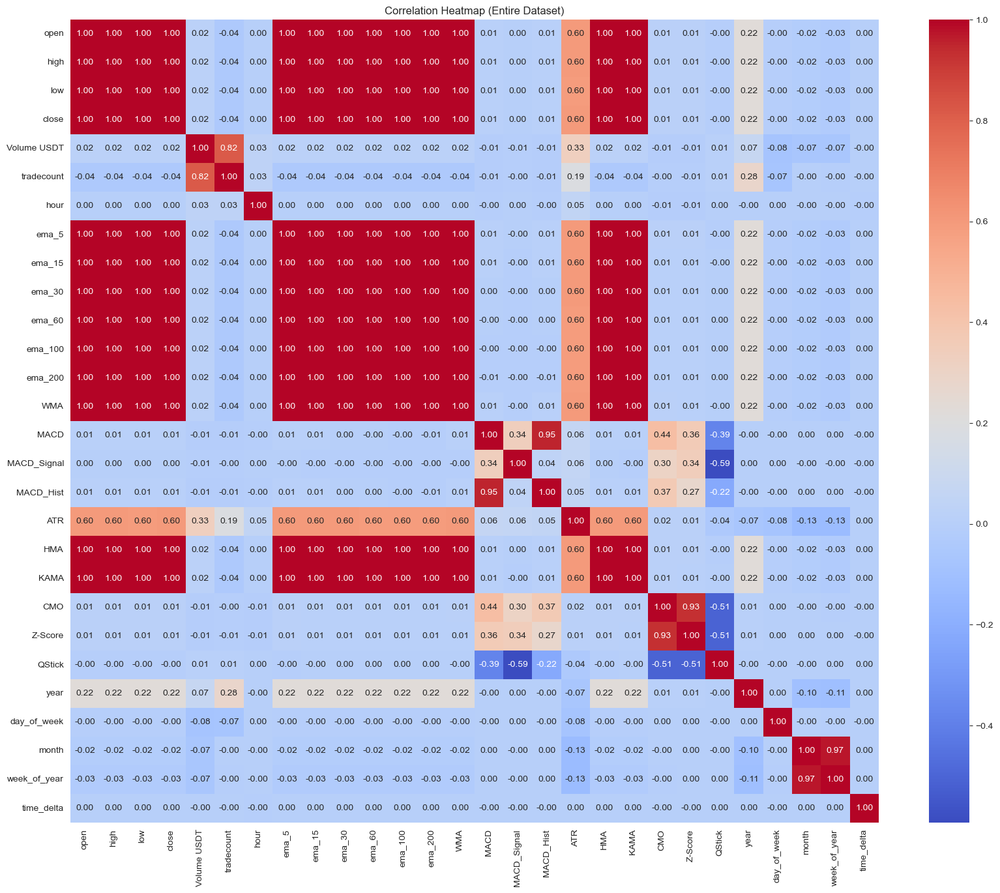


Correlation Matrix (Year 2020):
--------------------------------------------------


,open,high,low,close,Volume USDT,tradecount,hour,ema_5,ema_15,ema_30,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
open,1.000000,0.999997,0.999997,0.999996,-0.032387,0.226796,0.004450,0.999993,0.999985,0.999973,...,0.999990,0.999773,-0.018944,-0.008744,0.014683,NaN,-0.009416,0.768378,0.776067,0.005143
high,0.999997,1.000000,0.999994,0.999998,-0.031530,0.227848,0.004504,0.999995,0.999986,0.999974,...,0.999991,0.999775,-0.018894,-0.008707,0.015149,NaN,-0.009486,0.768246,0.775940,0.005172
low,0.999997,0.999994,1.000000,0.999997,-0.033618,0.225387,0.004397,0.999994,0.999986,0.999973,...,0.999991,0.999774,-0.018833,-0.008625,0.015159,NaN,-0.009353,0.768516,0.776200,0.005118
close,0.999996,0.999998,0.999997,1.000000,-0.032558,0.226667,0.004456,0.999997,0.999988,0.999976,...,0.999994,0.999777,-0.018824,-0.008633,0.015534,NaN,-0.009423,0.768376,0.776065,0.005165
Volume USDT,-0.032387,-0.031530,-0.033618,-0.032558,1.000000,0.866663,0.029773,-0.032532,-0.032497,-0.032473,...,-0.032548,-0.032569,-0.017288,-0.021838,-0.008562,NaN,-0.046253,-0.053967,-0.053793,0.001667
tradecount,0.226796,0.227848,0.225387,0.226667,0.866663,1.000000,0.046588,0.226712,0.226765,0.226803,...,0.226702,0.226711,-0.026493,-0.028188,0.006481,NaN,-0.058182,0.207535,0.210692,0.006456
hour,0.004450,0.004504,0.004397,0.004456,0.029773,0.046588,1.000000,0.004467,0.004489,0.004522,...,0.004443,0.004276,-0.026079,-0.022928,0.005513,NaN,0.000326,-0.000047,-0.000039,0.000590
ema_5,0.999993,0.999995,0.999994,0.999997,-0.032532,0.226712,0.004467,1.000000,0.999996,0.999985,...,0.999995,0.999784,-0.020063,-0.009915,0.017184,NaN,-0.009435,0.768375,0.776065,0.005175
ema_15,0.999985,0.999986,0.999986,0.999988,-0.032497,0.226765,0.004489,0.999996,1.000000,0.999996,...,0.999987,0.999788,-0.022033,-0.011771,0.019608,NaN,-0.009462,0.768372,0.776064,0.005175
ema_30,0.999973,0.999974,0.999973,0.999976,-0.032473,0.226803,0.004522,0.999985,0.999996,1.000000,...,0.999974,0.999783,-0.023683,-0.013107,0.020885,NaN,-0.009499,0.768366,0.776062,0.005173


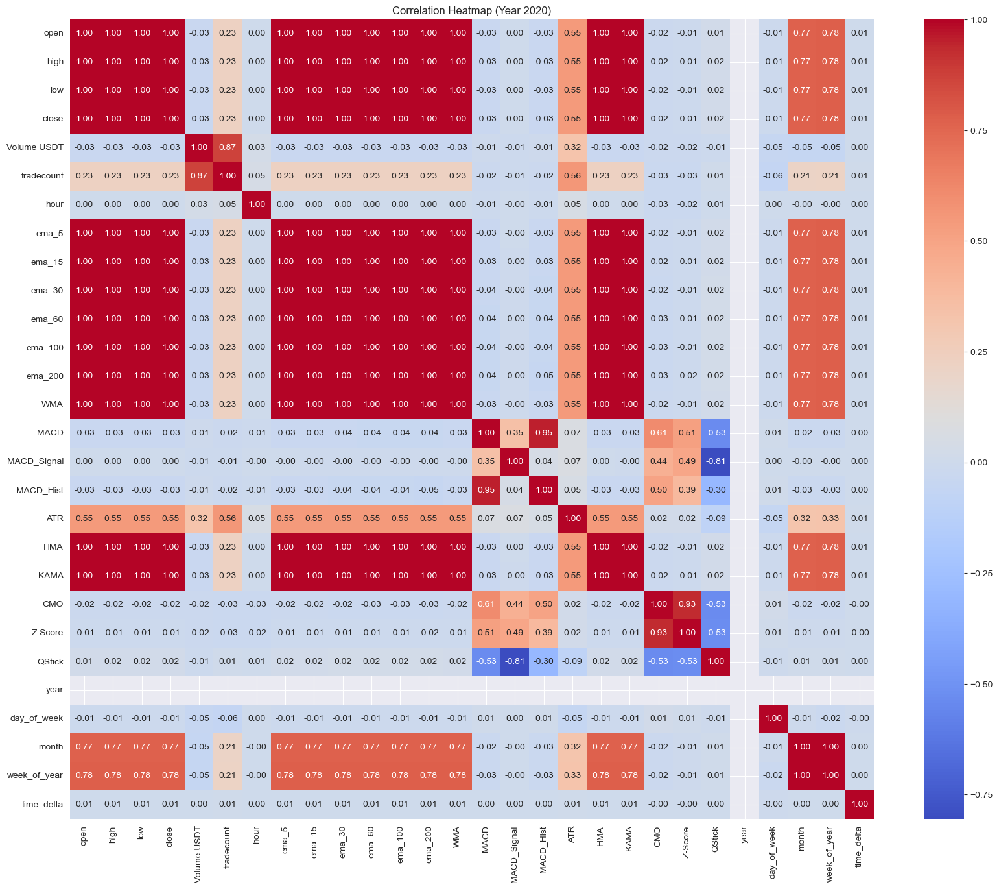


Correlation Matrix (Year 2021):
--------------------------------------------------


,open,high,low,close,Volume USDT,tradecount,hour,ema_5,ema_15,ema_30,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
open,1.000000,0.999988,0.999988,0.999982,0.000192,-0.025024,0.001809,0.999957,0.999880,0.999766,...,0.999952,0.999919,0.019363,0.021310,-0.010403,NaN,-0.006700,0.317055,0.264965,0.000124
high,0.999988,1.000000,0.999979,0.999990,0.002528,-0.022663,0.001869,0.999964,0.999888,0.999775,...,0.999960,0.999927,0.019417,0.021347,-0.009338,NaN,-0.006935,0.316426,0.264337,0.000176
low,0.999988,0.999979,1.000000,0.999990,-0.002301,-0.027559,0.001752,0.999963,0.999885,0.999771,...,0.999959,0.999925,0.019551,0.021509,-0.009536,NaN,-0.006456,0.317687,0.265592,0.000110
close,0.999982,0.999990,0.999990,1.000000,0.000114,-0.025123,0.001814,0.999974,0.999897,0.999782,...,0.999970,0.999936,0.019557,0.021492,-0.008598,NaN,-0.006696,0.317049,0.264962,0.000171
Volume USDT,0.000192,0.002528,-0.002301,0.000114,1.000000,0.906750,-0.001297,0.000270,0.000508,0.000729,...,0.000180,0.000329,-0.016870,-0.018544,0.023292,NaN,-0.075613,-0.170979,-0.167892,0.004730
tradecount,-0.025024,-0.022663,-0.027559,-0.025123,0.906750,1.000000,0.023800,-0.024953,-0.024697,-0.024438,...,-0.025043,-0.024894,-0.021269,-0.022427,0.023145,NaN,-0.067906,-0.209327,-0.205394,0.004895
hour,0.001809,0.001869,0.001752,0.001814,-0.001297,0.023800,1.000000,0.001796,0.001758,0.001721,...,0.001814,0.001768,-0.012949,-0.013232,0.001777,NaN,0.000745,-0.000698,-0.000740,-0.002290
ema_5,0.999957,0.999964,0.999963,0.999974,0.000270,-0.024953,0.001796,1.000000,0.999960,0.999862,...,0.999985,0.999976,0.016324,0.018211,-0.005040,NaN,-0.006696,0.317018,0.264932,0.000206
ema_15,0.999880,0.999888,0.999885,0.999897,0.000508,-0.024697,0.001758,0.999960,1.000000,0.999962,...,0.999907,0.999964,0.011002,0.013326,0.000230,NaN,-0.006699,0.316933,0.264852,0.000225
ema_30,0.999766,0.999775,0.999771,0.999782,0.000729,-0.024438,0.001721,0.999862,0.999962,1.000000,...,0.999786,0.999886,0.006449,0.009775,0.003015,NaN,-0.006697,0.316805,0.264731,0.000232


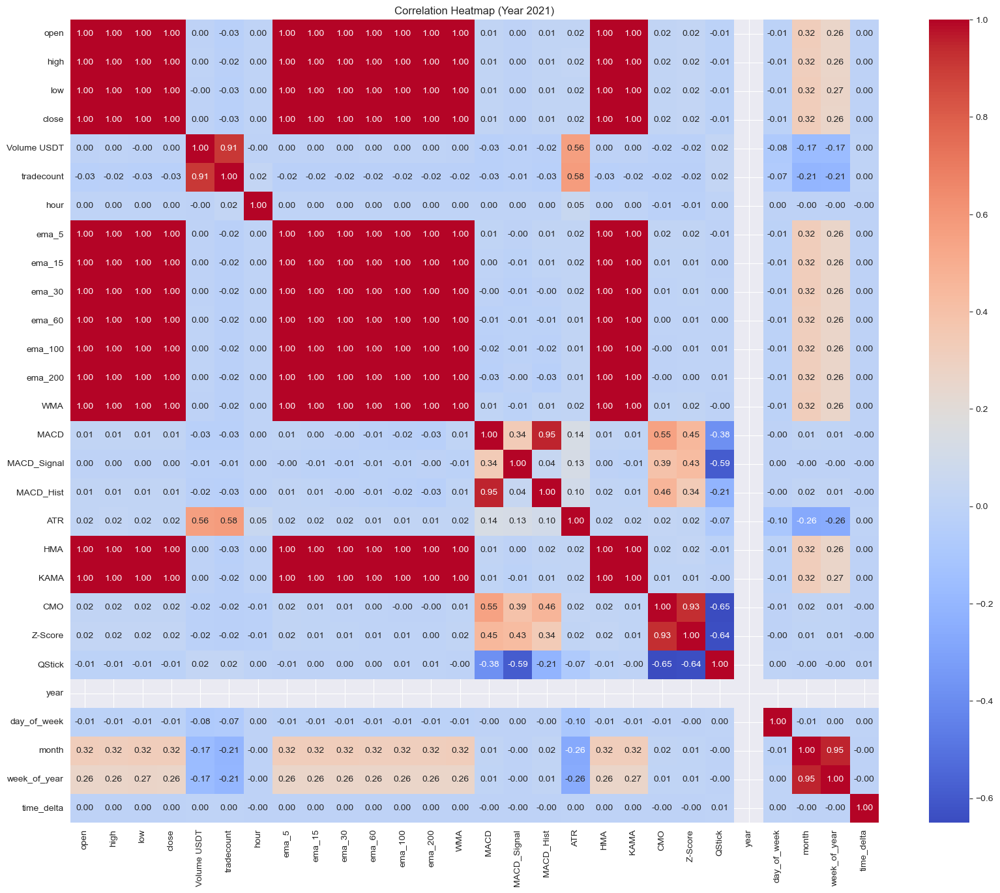


Correlation Matrix (Year 2022):
--------------------------------------------------


,open,high,low,close,Volume USDT,tradecount,hour,ema_5,ema_15,ema_30,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
open,1.000000,0.999997,0.999998,0.999997,-0.269610,-0.501310,-1.635535e-03,0.999993,0.999981,0.999963,...,0.999992,0.999984,0.008818,0.005008,-0.006230,NaN,-2.980676e-03,-9.079611e-01,-8.785204e-01,NaN
high,0.999997,1.000000,0.999996,0.999998,-0.268769,-0.500724,-1.501030e-03,0.999994,0.999982,0.999964,...,0.999993,0.999986,0.008872,0.005061,-0.005776,NaN,-3.176726e-03,-9.081237e-01,-8.786872e-01,NaN
low,0.999998,0.999996,1.000000,0.999998,-0.270468,-0.501906,-1.764512e-03,0.999994,0.999982,0.999964,...,0.999993,0.999986,0.008850,0.005037,-0.005794,NaN,-2.794562e-03,-9.078096e-01,-8.783628e-01,NaN
close,0.999997,0.999998,0.999998,1.000000,-0.269620,-0.501314,-1.635735e-03,0.999996,0.999984,0.999966,...,0.999995,0.999988,0.008891,0.005075,-0.005412,NaN,-2.983344e-03,-9.079610e-01,-8.785190e-01,NaN
Volume USDT,-0.269610,-0.268769,-0.270468,-0.269620,1.000000,0.858917,3.668407e-02,-0.269636,-0.269661,-0.269680,...,-0.269625,-0.269640,0.001611,0.002768,-0.005404,NaN,-1.278438e-01,2.796406e-01,2.706452e-01,NaN
tradecount,-0.501310,-0.500724,-0.501906,-0.501314,0.858917,1.000000,1.856723e-02,-0.501329,-0.501352,-0.501370,...,-0.501317,-0.501343,-0.000189,0.001531,-0.003441,NaN,-1.167457e-01,5.247284e-01,5.151569e-01,NaN
hour,-0.001636,-0.001501,-0.001765,-0.001636,0.036684,0.018567,1.000000e+00,-0.001630,-0.001612,-0.001586,...,-0.001634,-0.001631,0.003387,0.004049,-0.001095,NaN,1.074958e-17,-1.447911e-15,-1.001371e-15,NaN
ema_5,0.999993,0.999994,0.999994,0.999996,-0.269636,-0.501329,-1.629686e-03,1.000000,0.999994,0.999979,...,0.999998,0.999995,0.007559,0.003713,-0.003784,NaN,-2.984537e-03,-9.079613e-01,-8.785160e-01,NaN
ema_15,0.999981,0.999982,0.999982,0.999984,-0.269661,-0.501352,-1.612409e-03,0.999994,1.000000,0.999994,...,0.999986,0.999996,0.005345,0.001700,-0.001362,NaN,-2.990126e-03,-9.079596e-01,-8.785063e-01,NaN
ema_30,0.999963,0.999964,0.999964,0.999966,-0.269680,-0.501370,-1.585753e-03,0.999979,0.999994,1.000000,...,0.999967,0.999985,0.003404,0.000208,-0.000031,NaN,-3.001969e-03,-9.079569e-01,-8.784918e-01,NaN


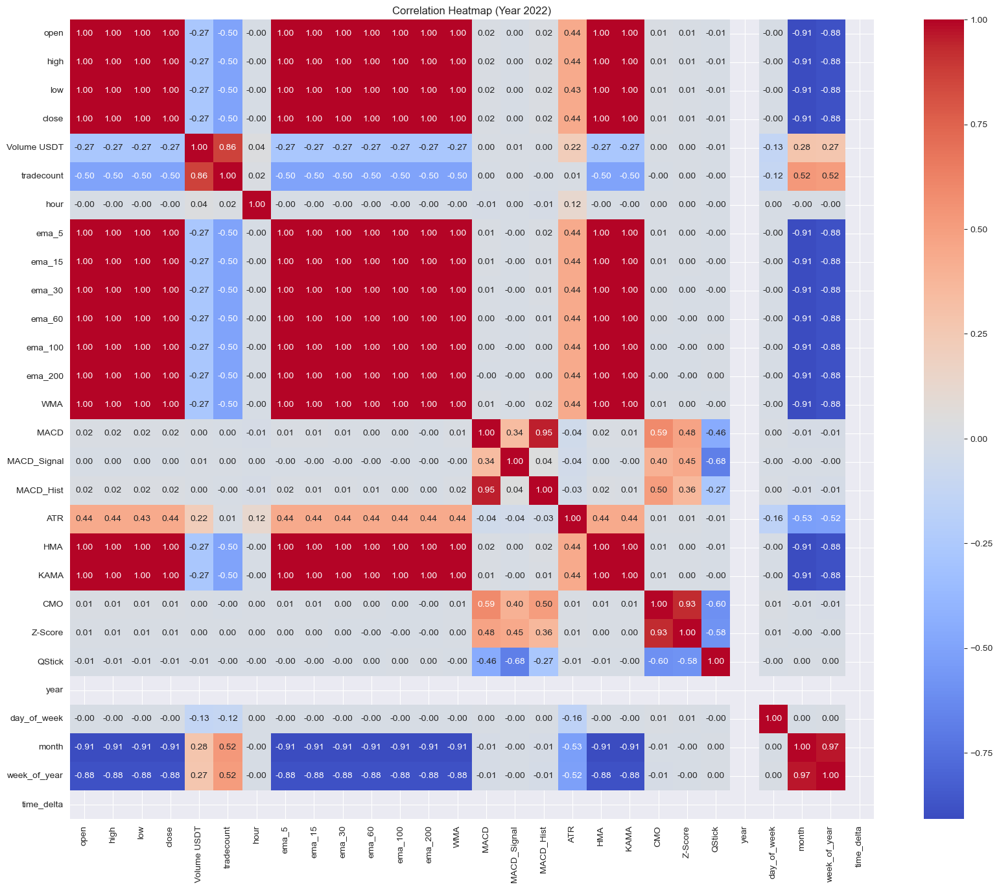


Correlation Matrix (Year 2023):
--------------------------------------------------


,open,high,low,close,Volume USDT,tradecount,hour,ema_5,ema_15,ema_30,...,HMA,KAMA,CMO,Z-Score,QStick,year,day_of_week,month,week_of_year,time_delta
open,1.000000,0.999992,0.999992,0.999989,-0.318120,-0.488418,0.003511,0.999956,0.999855,0.999702,...,0.999951,0.999937,0.019921,0.018638,-0.013873,NaN,0.001351,0.599839,0.564870,0.000475
high,0.999992,1.000000,0.999984,0.999993,-0.316097,-0.486667,0.003822,0.999960,0.999859,0.999706,...,0.999955,0.999942,0.019978,0.018690,-0.013057,NaN,0.001021,0.599359,0.564390,0.000473
low,0.999992,0.999984,1.000000,0.999993,-0.320212,-0.490183,0.003199,0.999960,0.999859,0.999705,...,0.999955,0.999941,0.020037,0.018776,-0.013067,NaN,0.001690,0.600331,0.565362,0.000473
close,0.999989,0.999993,0.999993,1.000000,-0.318133,-0.488395,0.003513,0.999967,0.999866,0.999713,...,0.999963,0.999949,0.020057,0.018782,-0.012390,NaN,0.001354,0.599836,0.564867,0.000469
Volume USDT,-0.318120,-0.316097,-0.320212,-0.318133,1.000000,0.939897,0.057940,-0.318087,-0.317966,-0.317830,...,-0.318115,-0.318069,-0.010835,-0.013155,0.014247,NaN,-0.076635,-0.408955,-0.406469,-0.000837
tradecount,-0.488418,-0.486667,-0.490183,-0.488395,0.939897,1.000000,0.052775,-0.488350,-0.488232,-0.488085,...,-0.488369,-0.488353,-0.010553,-0.012977,0.015416,NaN,-0.072557,-0.534205,-0.527959,-0.001044
hour,0.003511,0.003822,0.003199,0.003513,0.057940,0.052775,1.000000,0.003555,0.003669,0.003853,...,0.003519,0.003554,-0.014987,-0.018059,0.001832,NaN,-0.000006,0.000445,0.000437,-0.003491
ema_5,0.999956,0.999960,0.999960,0.999967,-0.318087,-0.488350,0.003555,1.000000,0.999948,0.999816,...,0.999981,0.999984,0.017836,0.016353,-0.009404,NaN,0.001395,0.599848,0.564882,0.000482
ema_15,0.999855,0.999859,0.999859,0.999866,-0.317966,-0.488232,0.003669,0.999948,1.000000,0.999949,...,0.999879,0.999942,0.014083,0.012796,-0.004935,NaN,0.001497,0.599866,0.564907,0.000494
ema_30,0.999702,0.999706,0.999705,0.999713,-0.317830,-0.488085,0.003853,0.999816,0.999949,1.000000,...,0.999718,0.999820,0.010695,0.010178,-0.002462,NaN,0.001645,0.599891,0.564943,0.000498


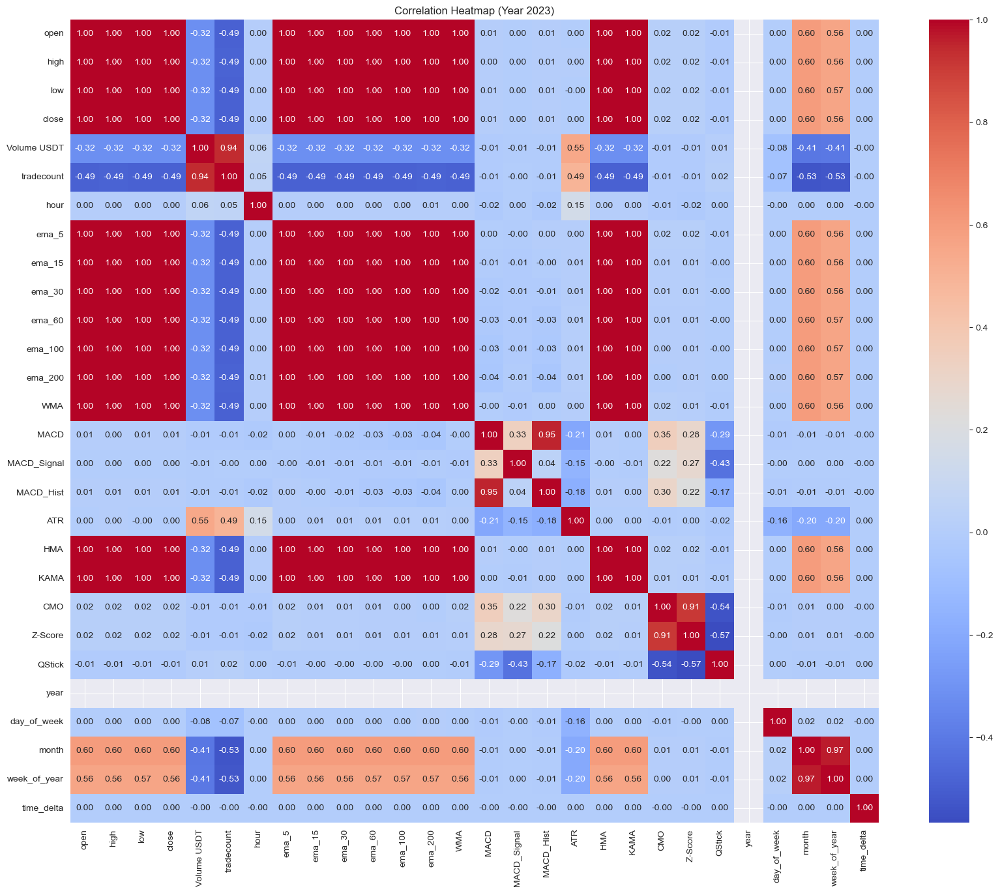

In [24]:
# Correlations and Relationships
print("\n" + "="*50)
print("CORRELATIONS AND RELATIONSHIPS")
print("="*50)

# Filter numeric columns
numeric_columns = df.select_dtypes(include=[np.number])

# Entire dataset correlation
print("\nCorrelation Matrix (Entire Dataset):")
print("-"*50)
correlation_matrix = numeric_columns.corr()
display(correlation_matrix)  # Use display for better formatting

# Correlation heatmap for the entire dataset
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
plt.title("Correlation Heatmap (Entire Dataset)")
plt.show()

# Clear the plot after display
plt.clf()  # Clear the current figure
plt.close()  # Close the figure completely to free memory

# Per year correlation and heatmap
for year, yearly_df in yearly_data.items():
    print(f"\nCorrelation Matrix (Year {year}):")
    print("-"*50)
    yearly_numeric = yearly_df.select_dtypes(include=[np.number])
    yearly_correlation = yearly_numeric.corr()
    display(yearly_correlation)  # Use display for yearly correlations

    plt.figure(figsize=(20, 16))
    sns.heatmap(yearly_correlation, annot=True, fmt=".2f", cmap="coolwarm", cbar=True)
    plt.title(f"Correlation Heatmap (Year {year})")
    plt.show()

    # Clear the plot after display
    plt.clf()  # Clear the current figure
    plt.close()  # Close the figure completely to free memory


DISTRIBUTIONS AND OUTLIERS

Distribution of open (Entire Dataset):


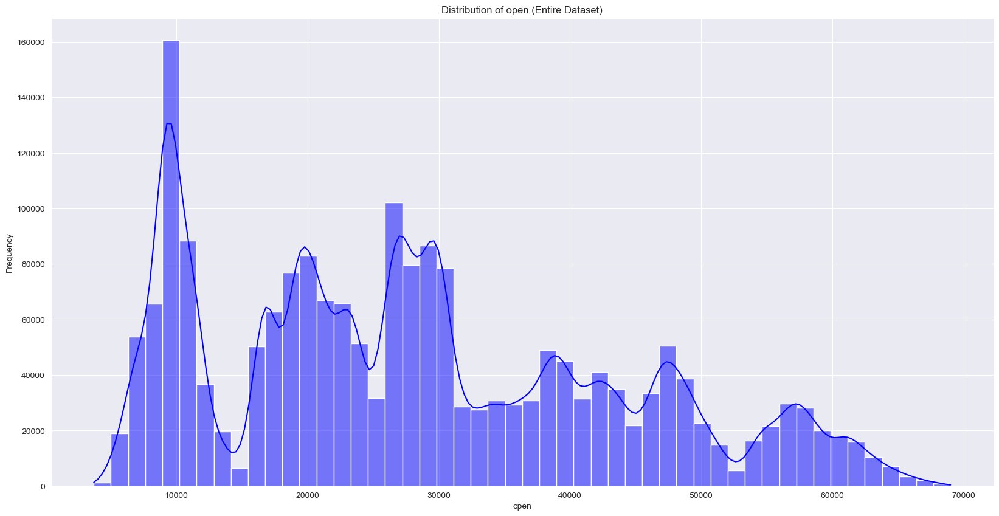


Distribution of high (Entire Dataset):


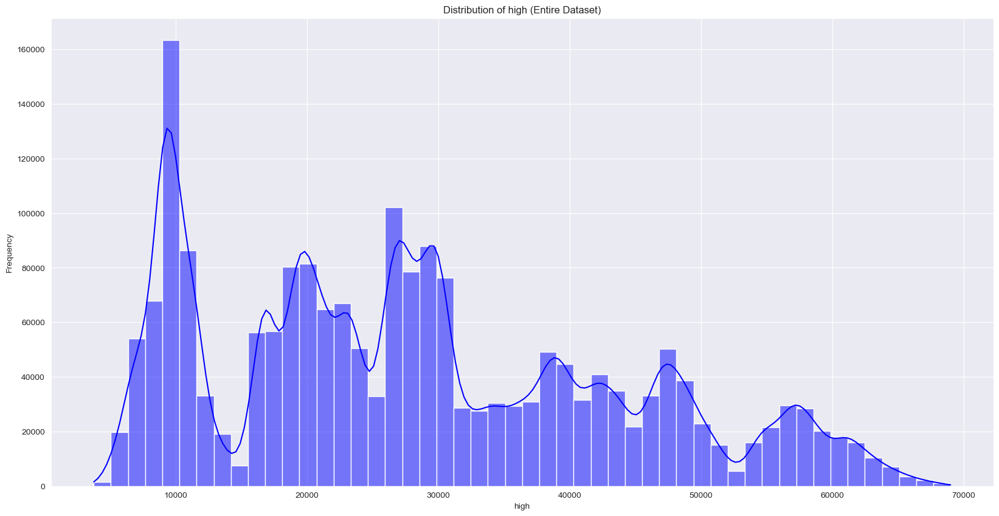


Distribution of low (Entire Dataset):


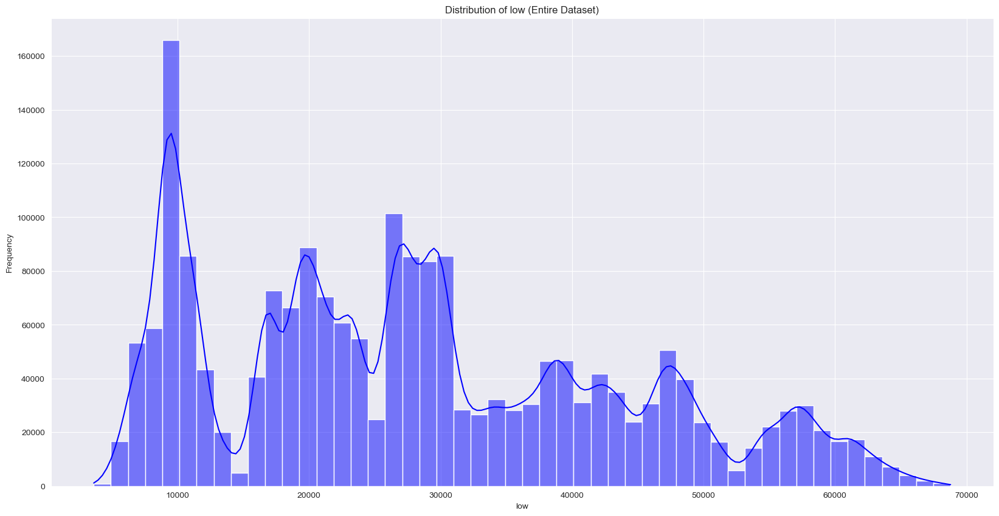


Distribution of close (Entire Dataset):


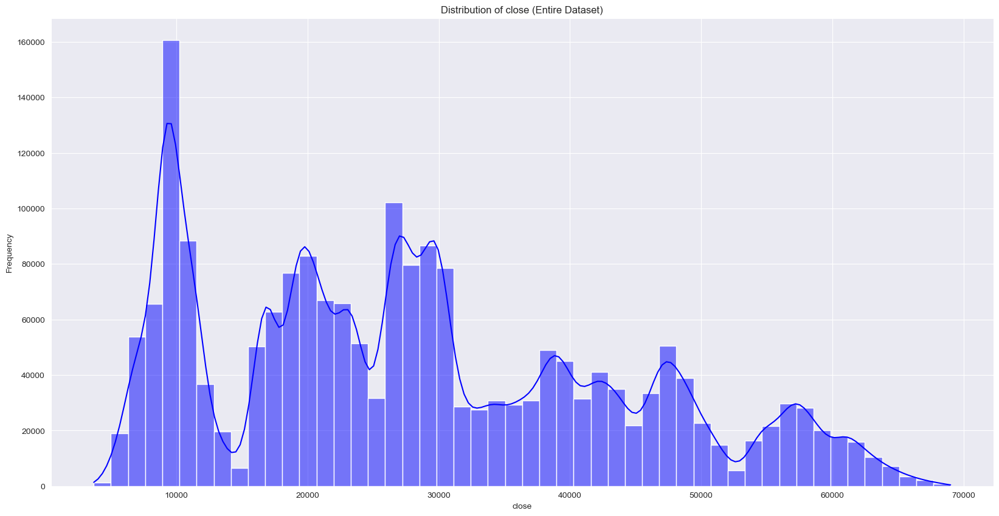


Distribution of Volume USDT (Entire Dataset):


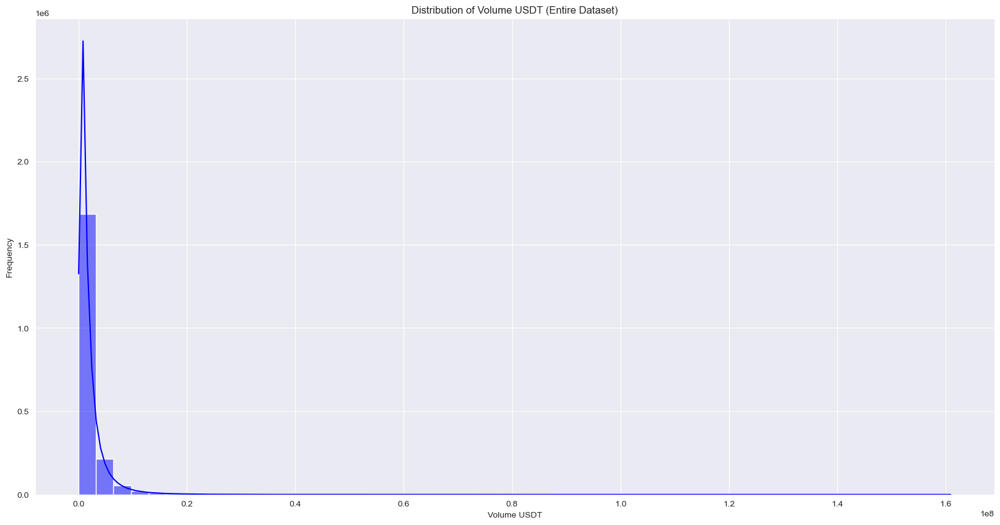


Distribution of tradecount (Entire Dataset):


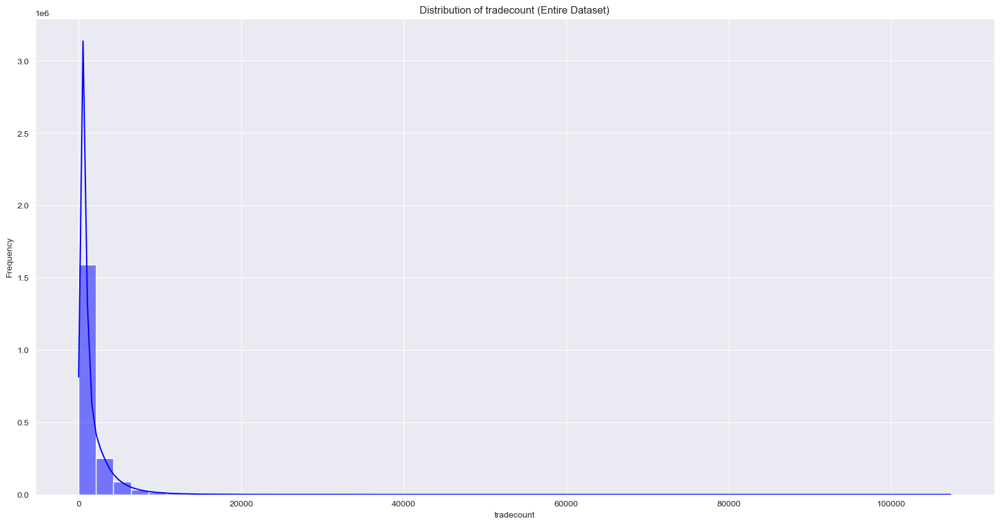


Distribution of hour (Entire Dataset):


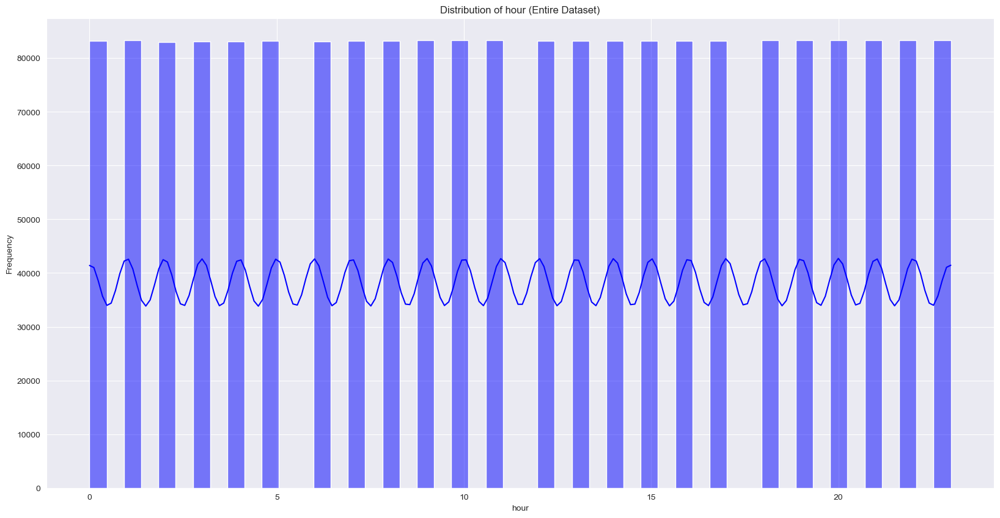


Distribution of ema_5 (Entire Dataset):


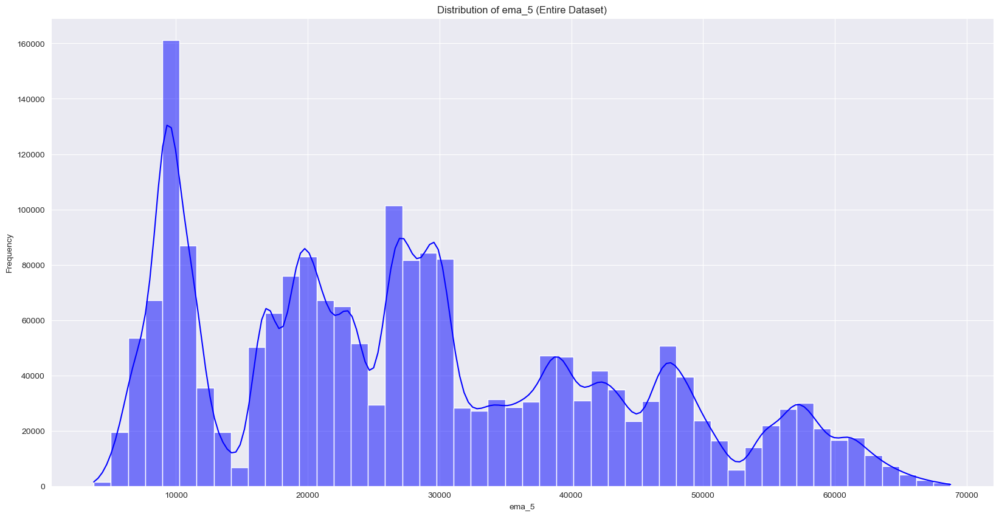


Distribution of ema_15 (Entire Dataset):


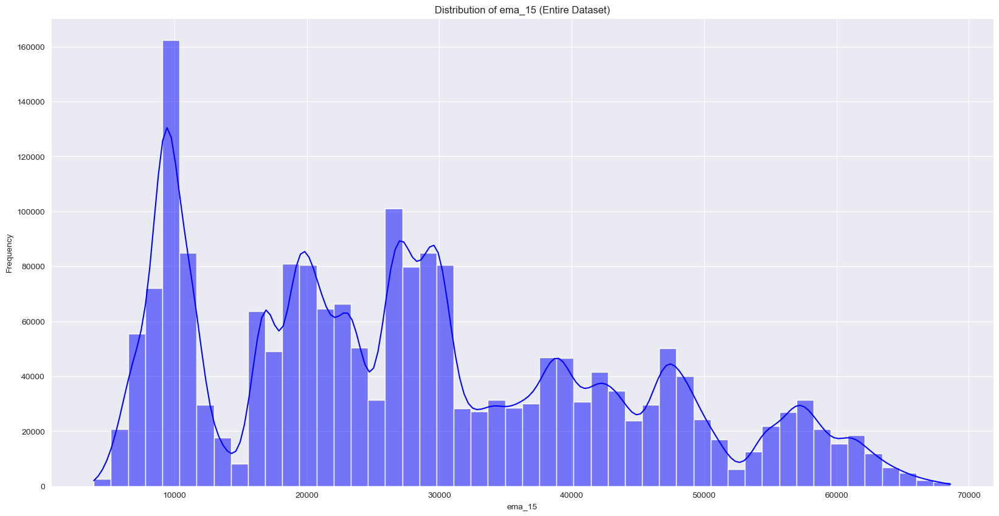


Distribution of ema_30 (Entire Dataset):


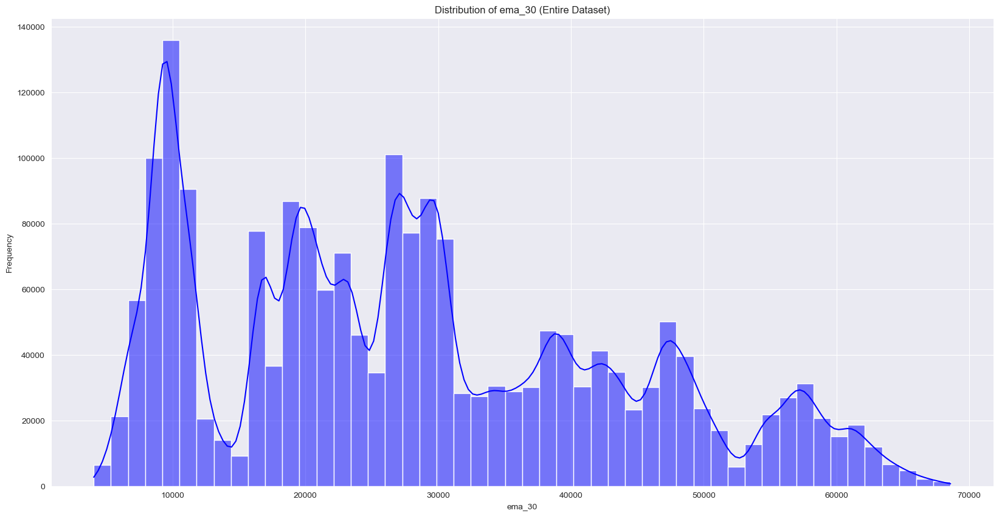


Distribution of ema_60 (Entire Dataset):


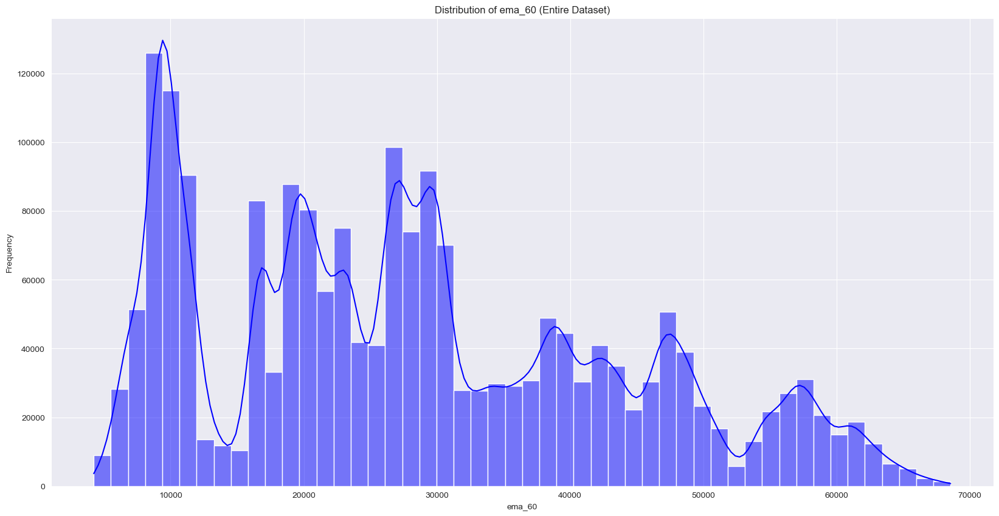


Distribution of ema_100 (Entire Dataset):


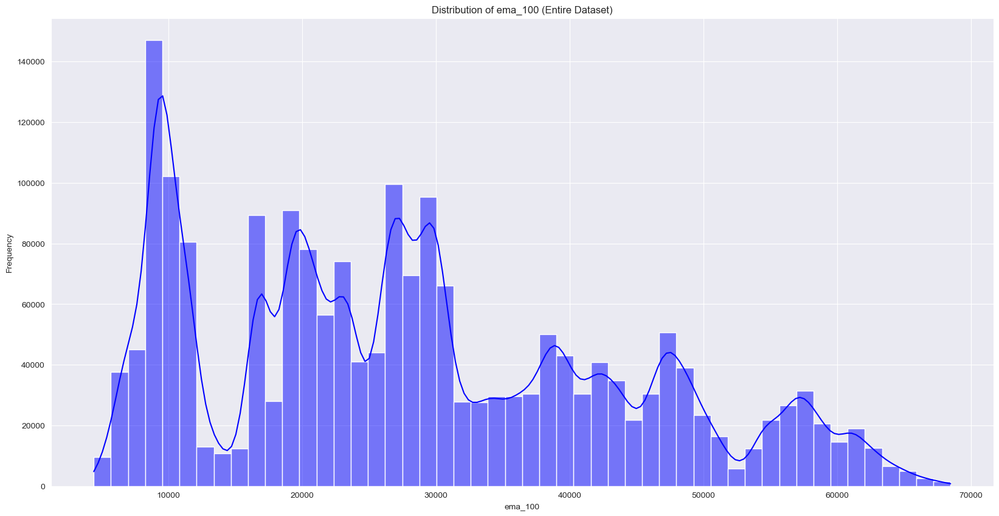


Distribution of ema_200 (Entire Dataset):


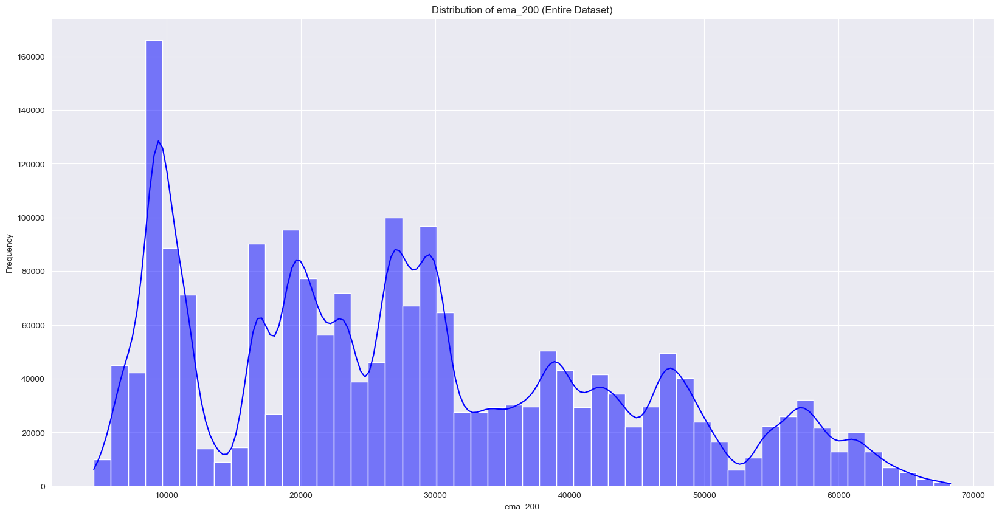


Distribution of WMA (Entire Dataset):


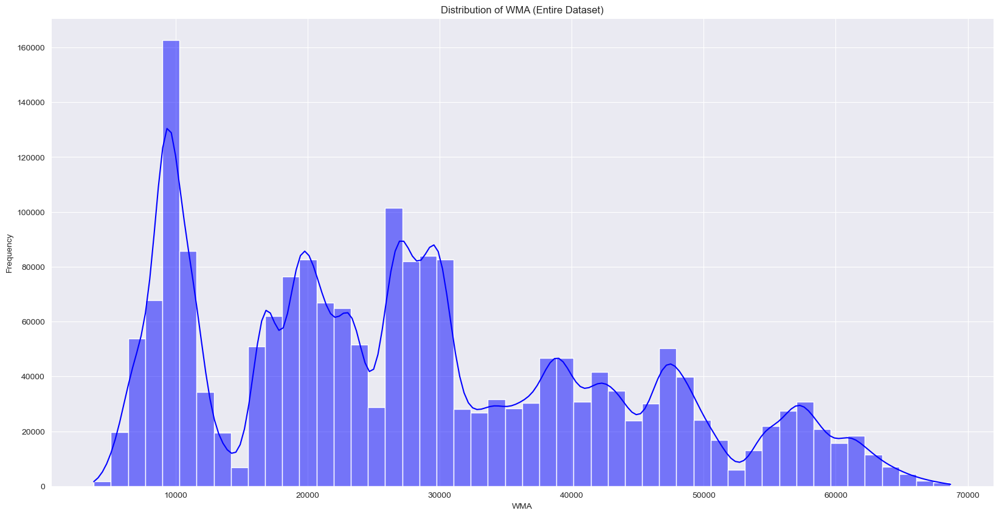


Distribution of MACD (Entire Dataset):


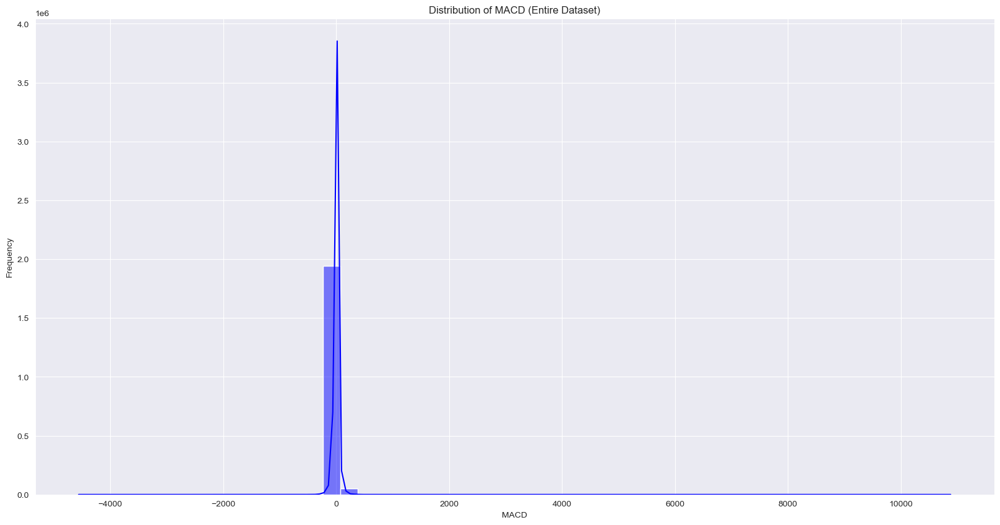


Distribution of MACD_Signal (Entire Dataset):


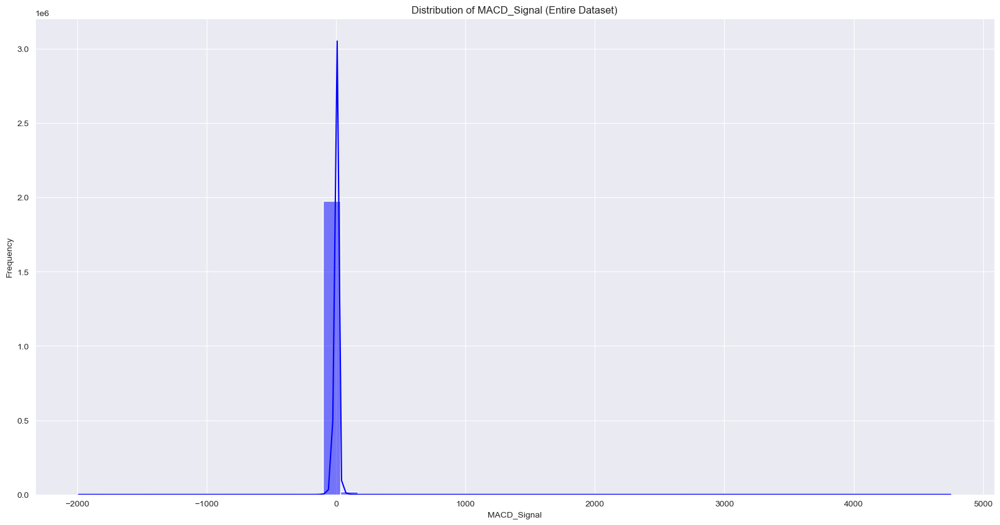


Distribution of MACD_Hist (Entire Dataset):


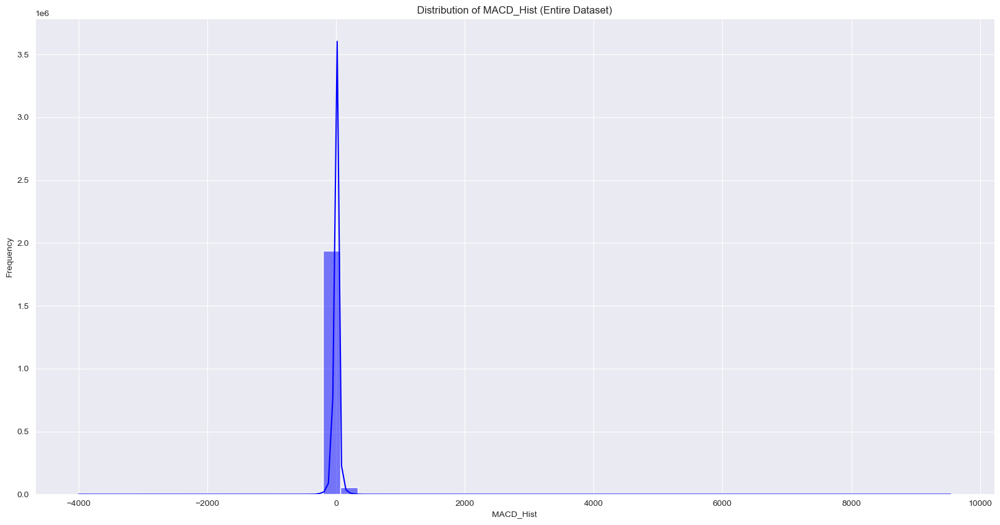


Distribution of ATR (Entire Dataset):


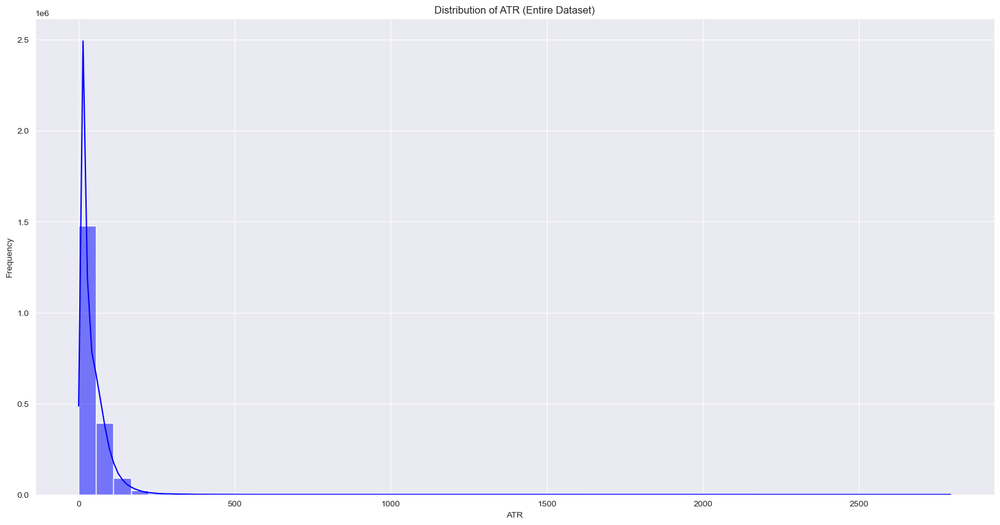


Distribution of HMA (Entire Dataset):


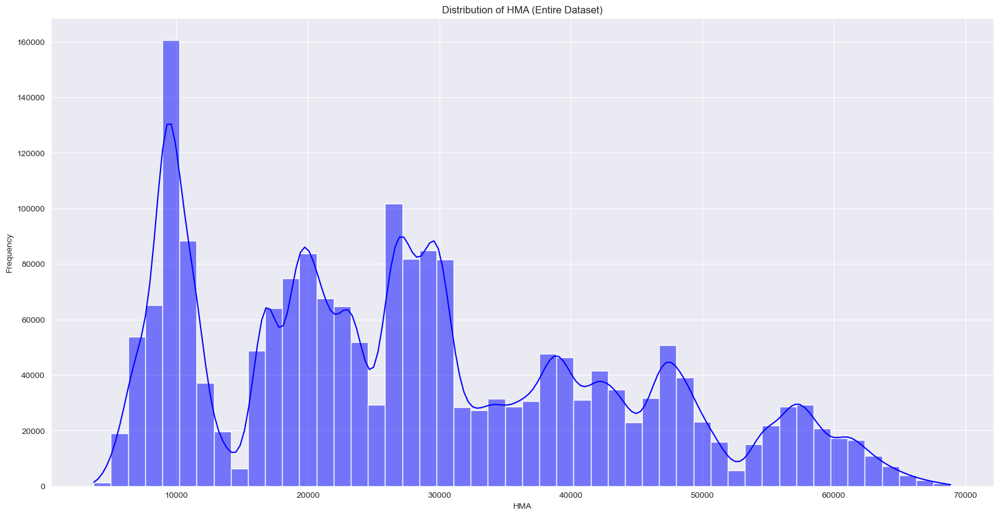


Distribution of KAMA (Entire Dataset):


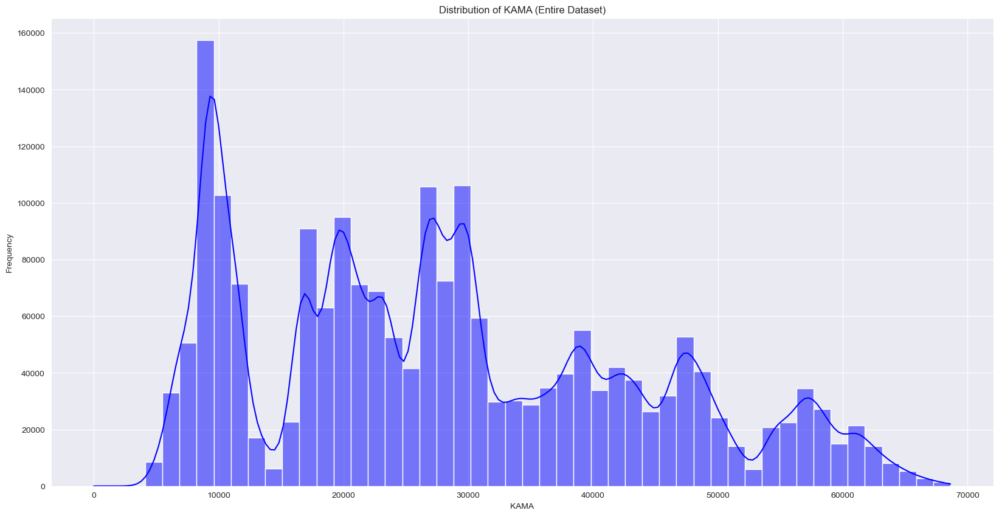


Distribution of CMO (Entire Dataset):


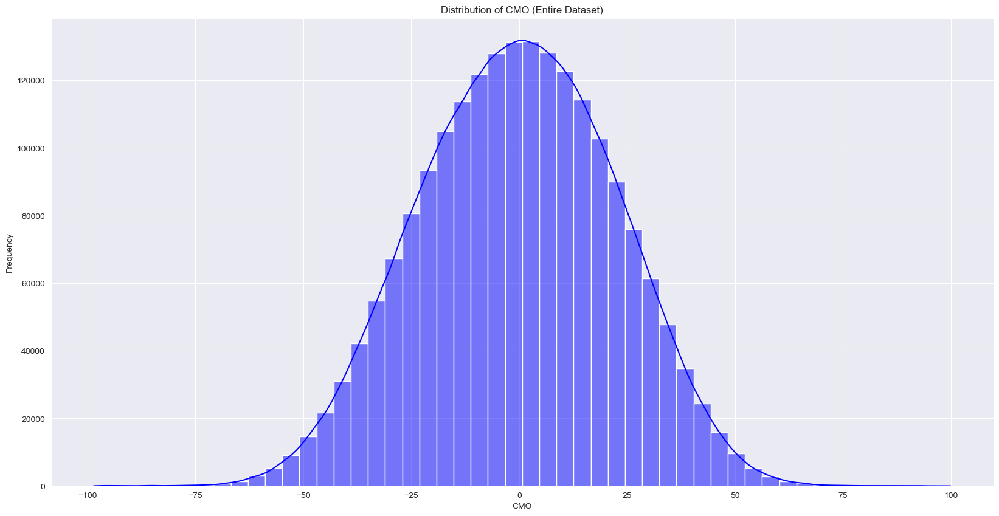


Distribution of Z-Score (Entire Dataset):


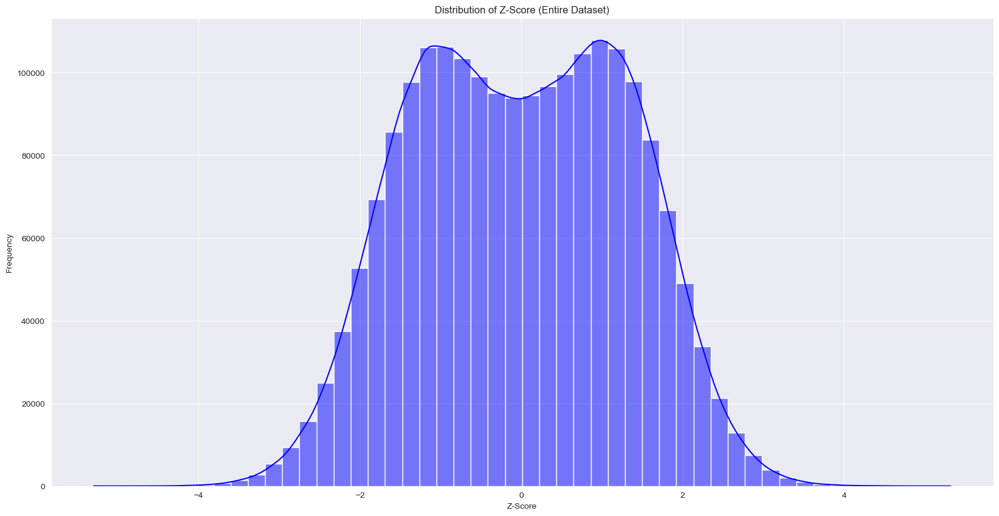


Distribution of QStick (Entire Dataset):


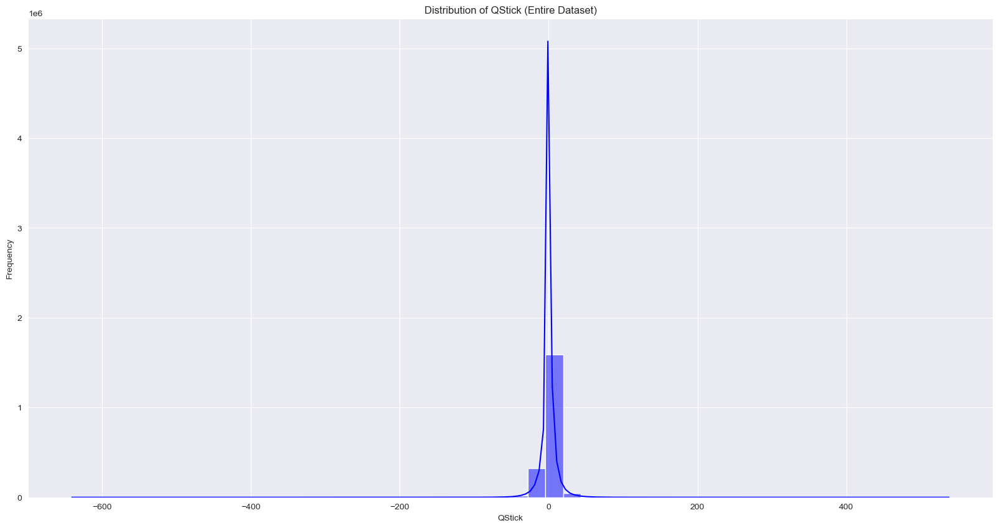


Distribution of year (Entire Dataset):


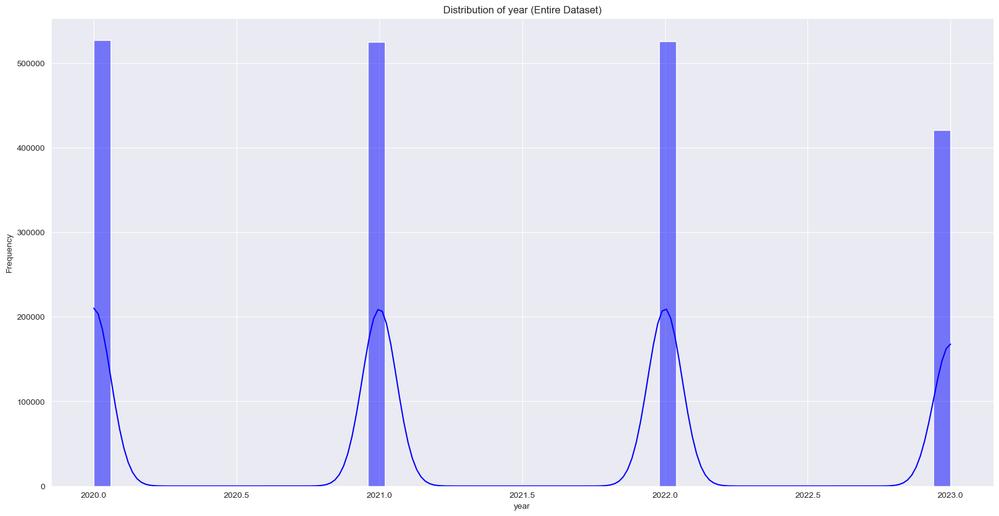


Distribution of day_of_week (Entire Dataset):


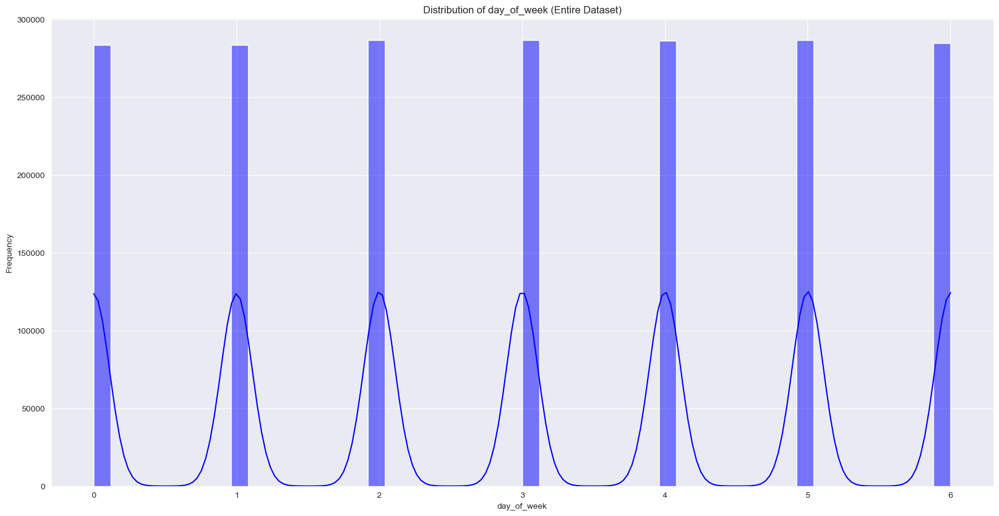


Distribution of month (Entire Dataset):


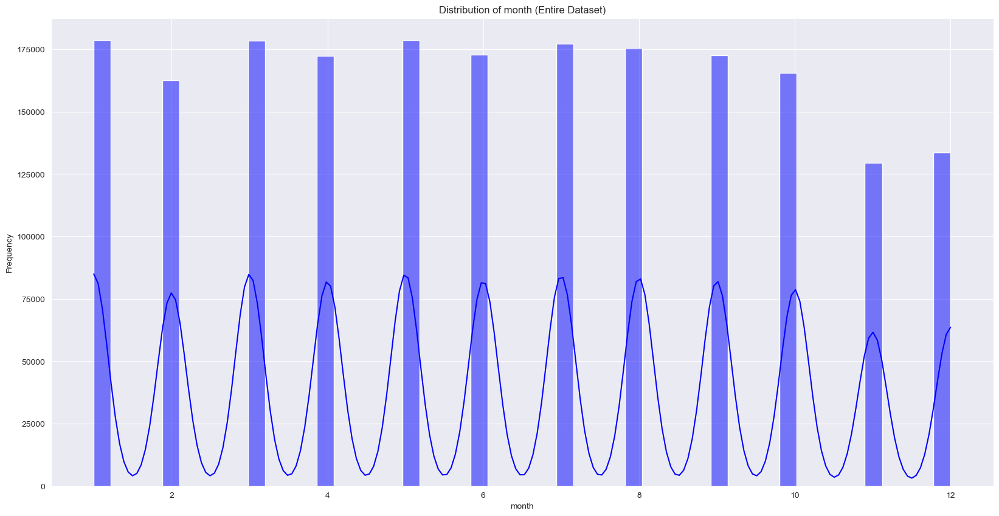


Distribution of week_of_year (Entire Dataset):


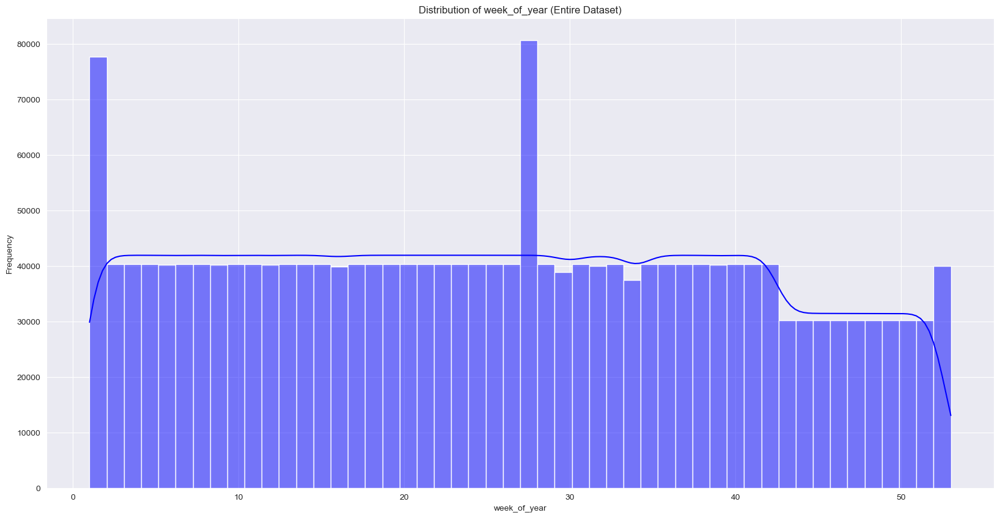


Distribution of time_delta (Entire Dataset):


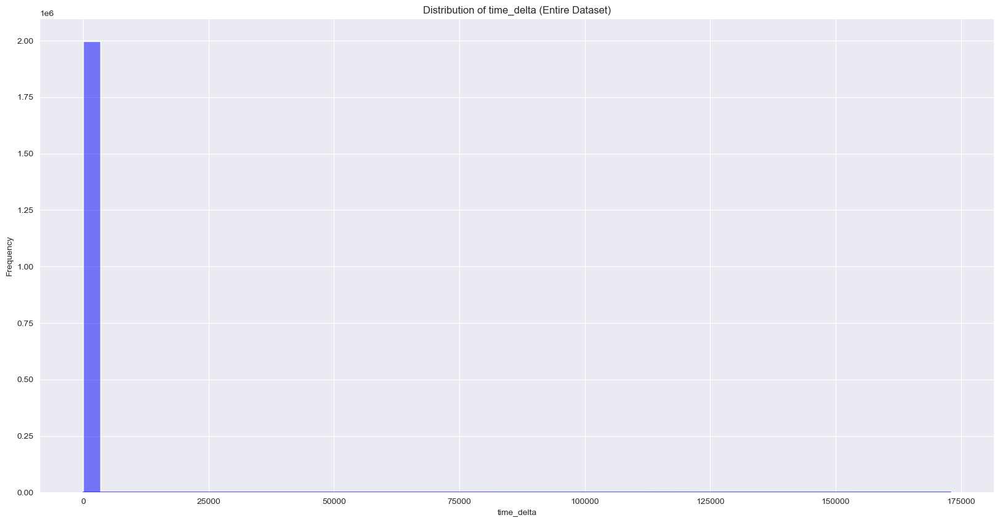


Distribution of open (Year 2020):


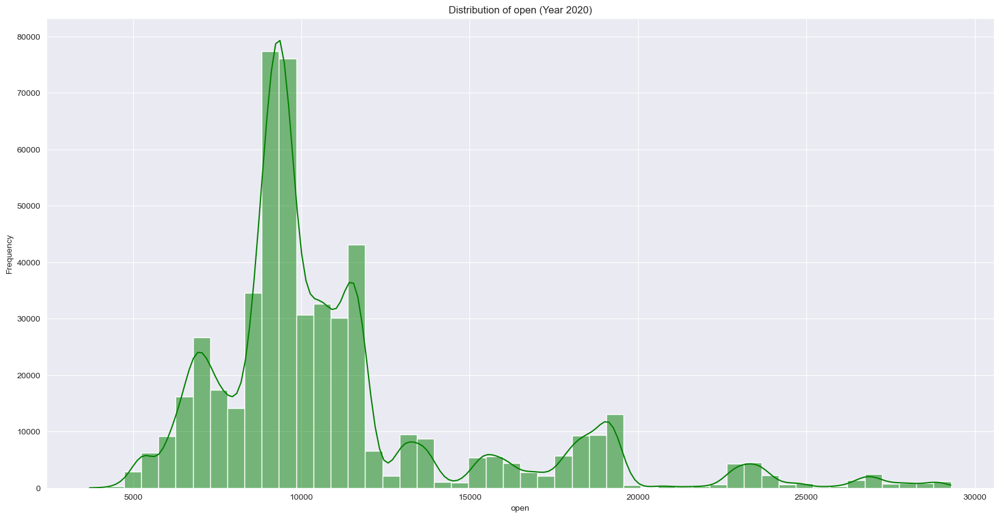


Boxplot of open (Year 2020):


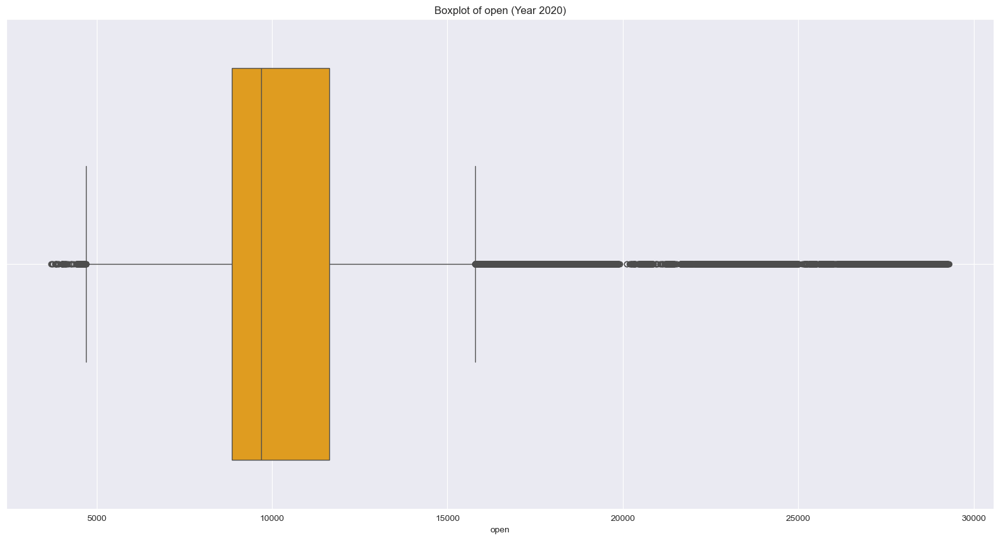


Distribution of high (Year 2020):


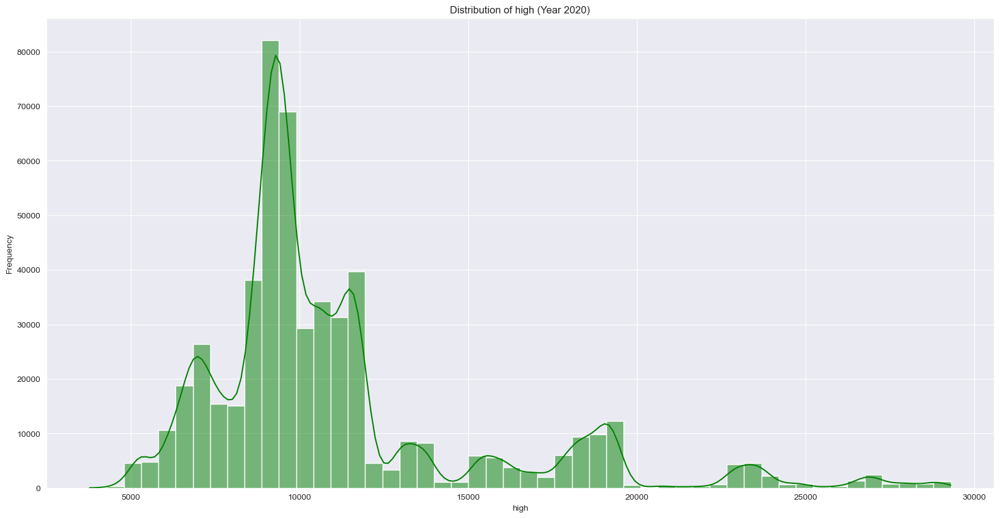


Boxplot of high (Year 2020):


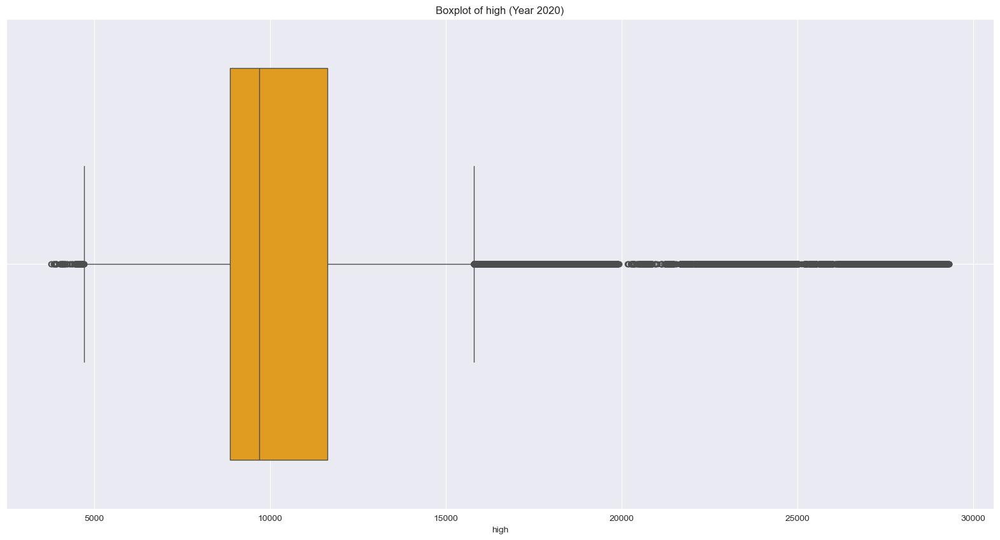


Distribution of low (Year 2020):


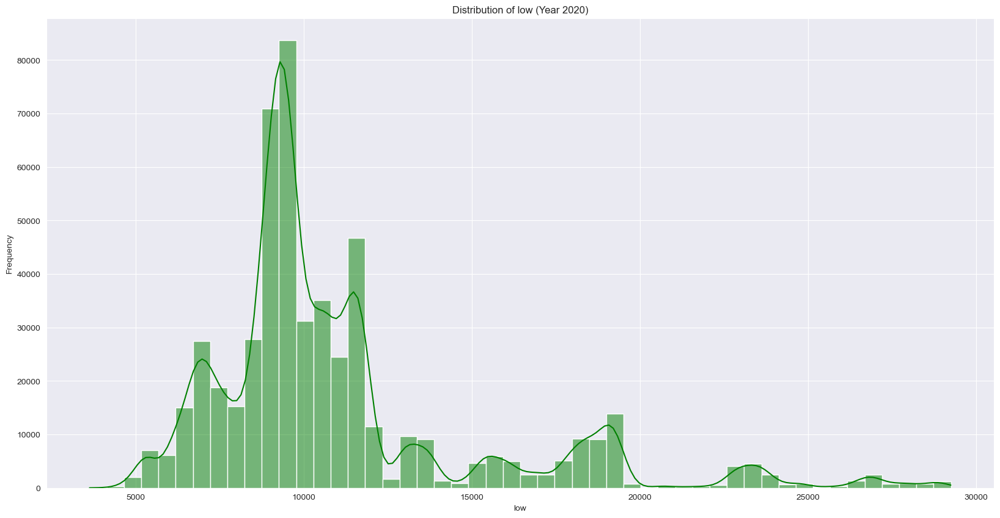


Boxplot of low (Year 2020):


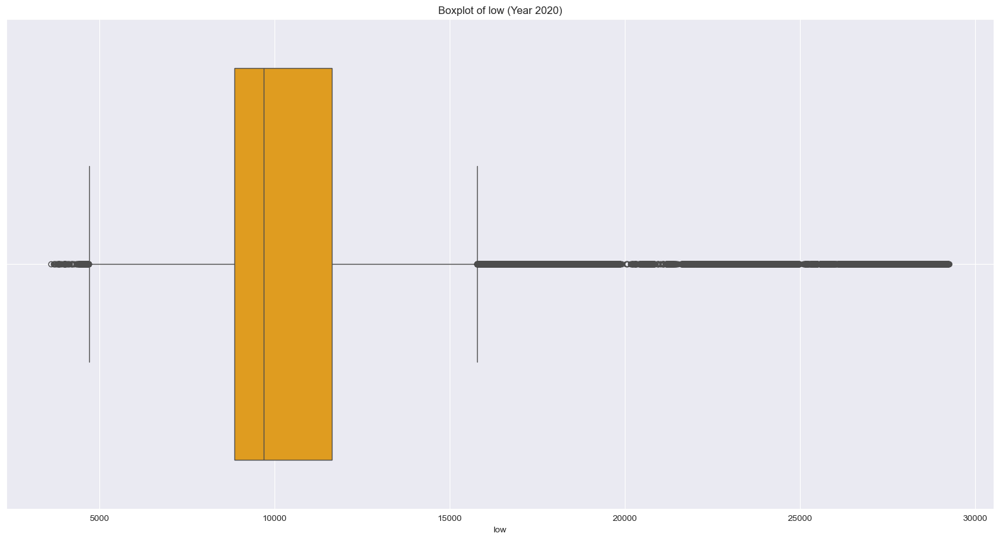


Distribution of close (Year 2020):


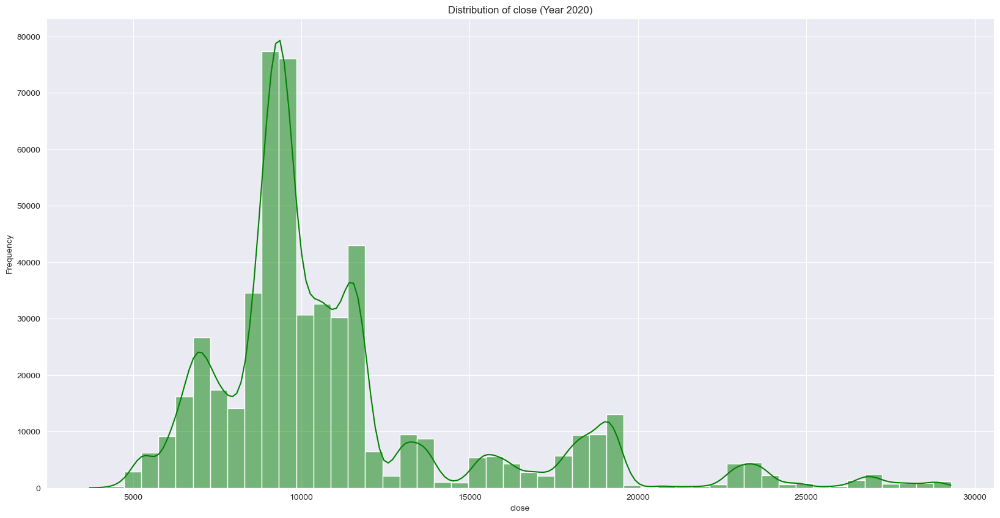


Boxplot of close (Year 2020):


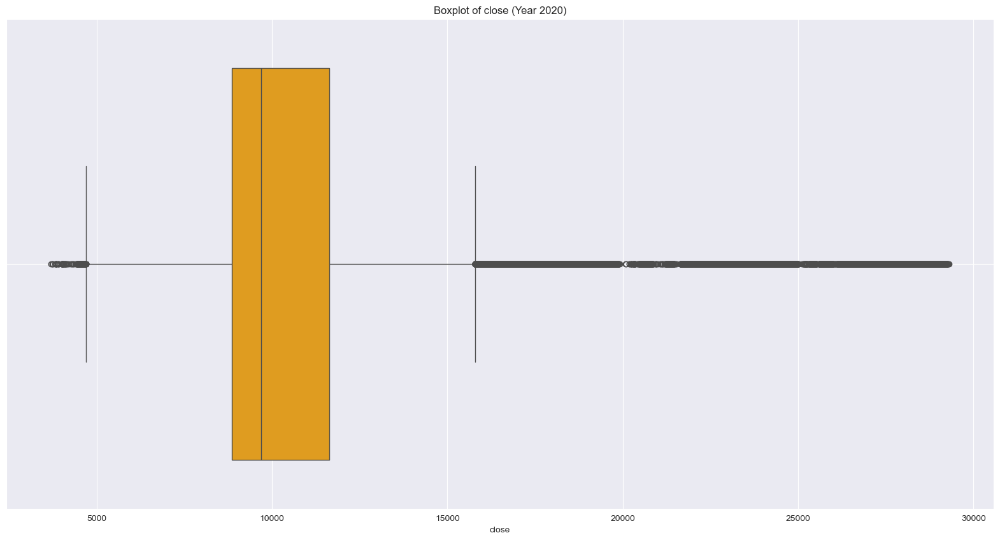


Distribution of Volume USDT (Year 2020):


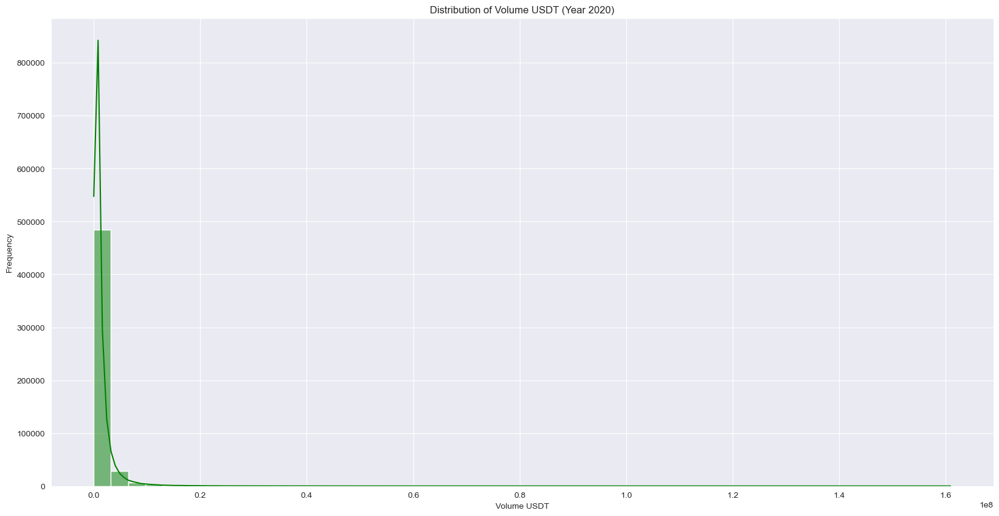


Boxplot of Volume USDT (Year 2020):


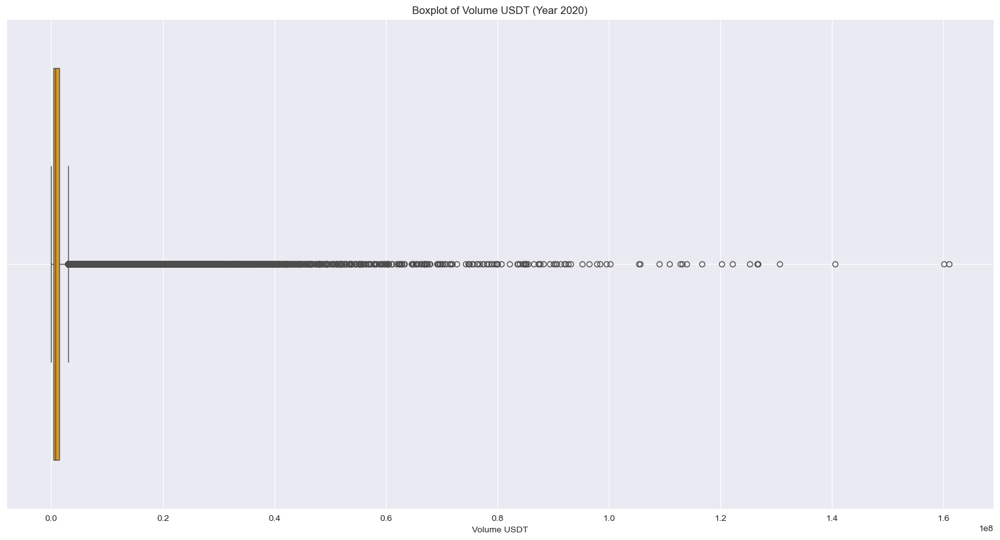


Distribution of tradecount (Year 2020):


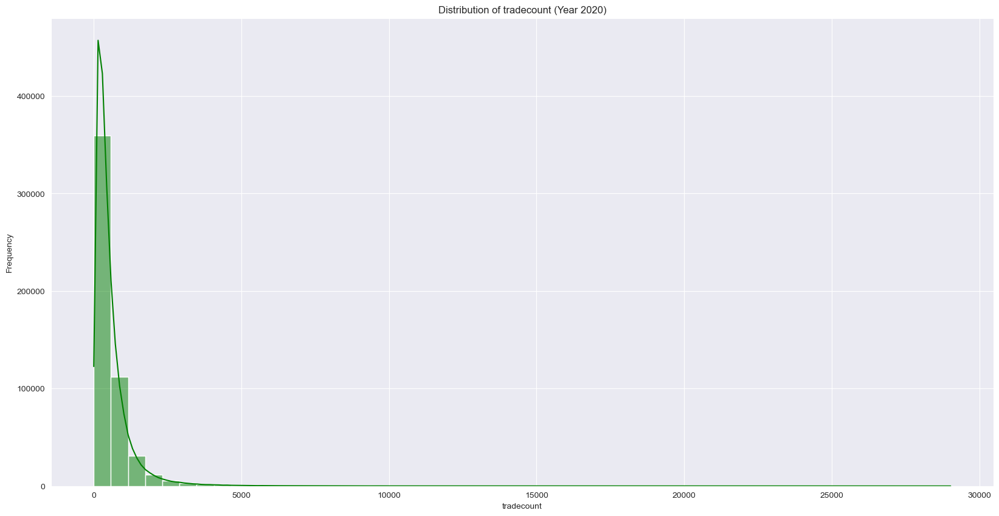


Boxplot of tradecount (Year 2020):


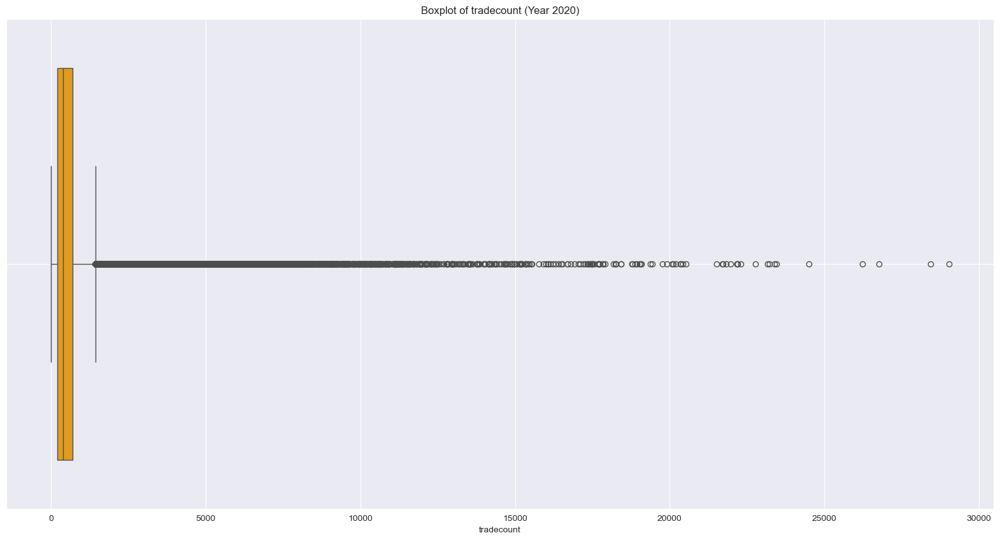


Distribution of hour (Year 2020):


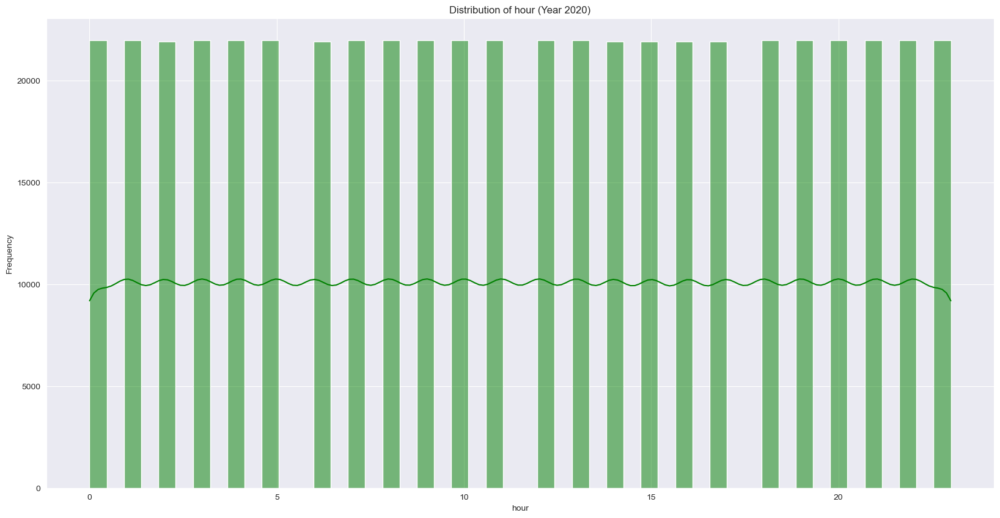


Boxplot of hour (Year 2020):


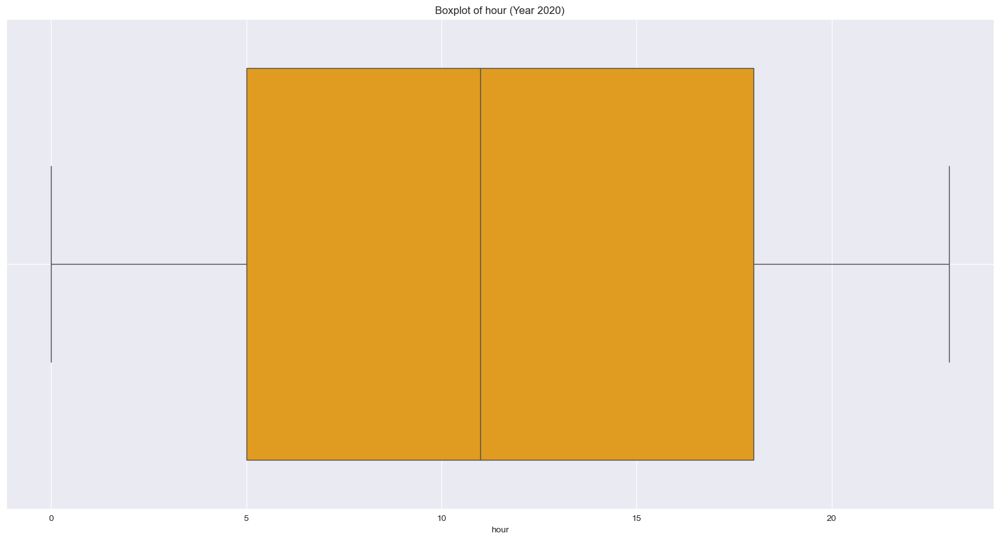


Distribution of ema_5 (Year 2020):


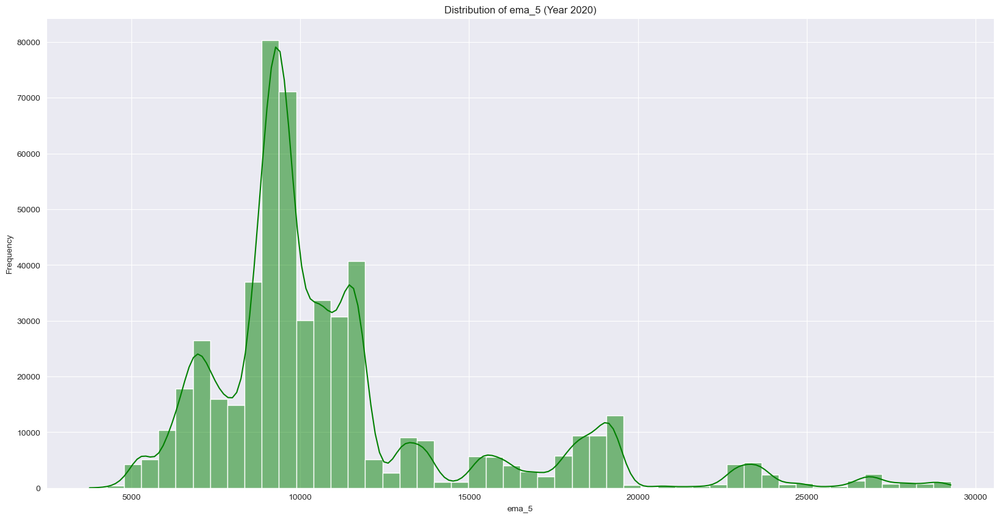


Boxplot of ema_5 (Year 2020):


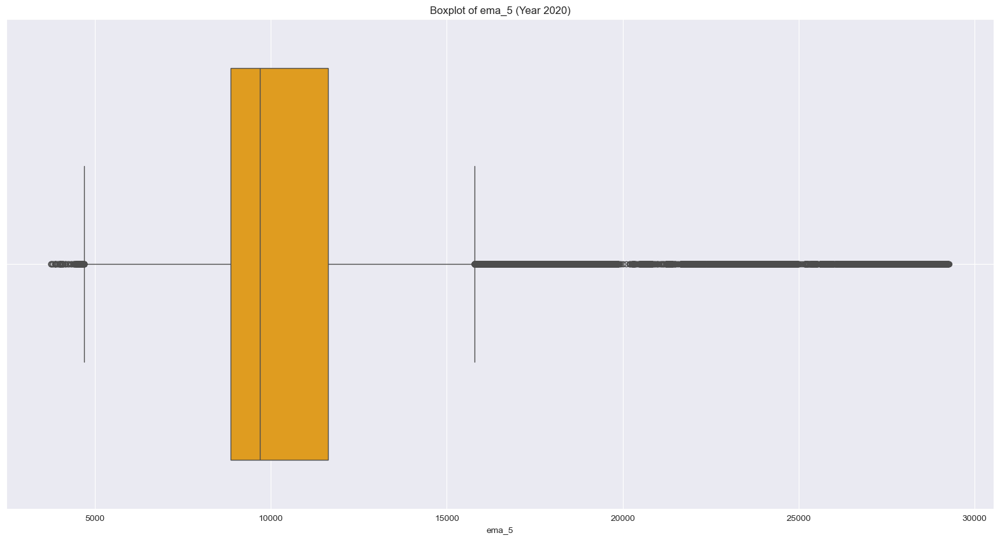


Distribution of ema_15 (Year 2020):


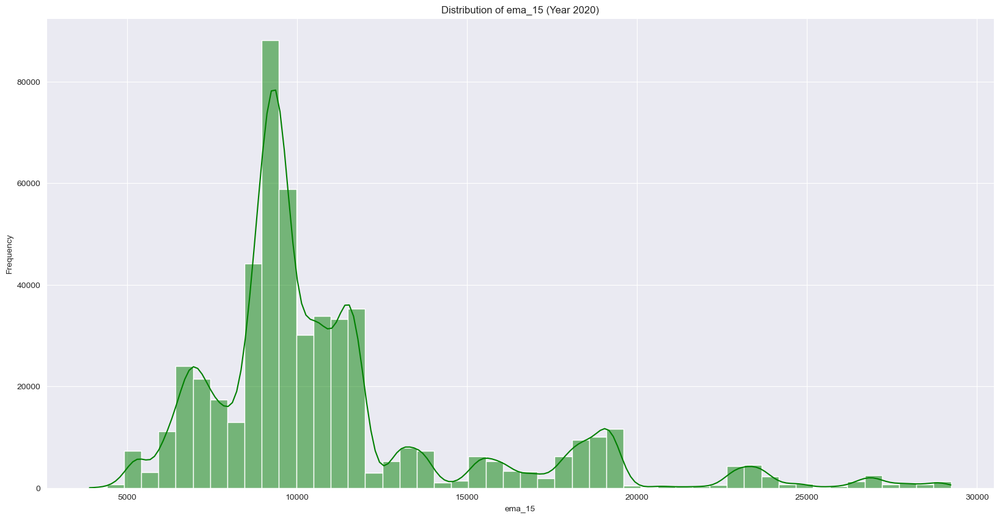


Boxplot of ema_15 (Year 2020):


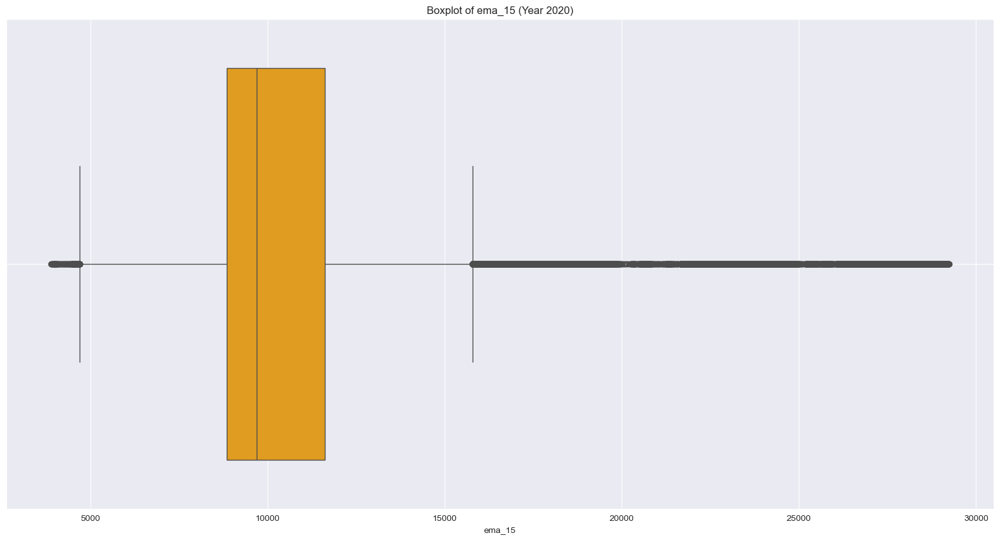


Distribution of ema_30 (Year 2020):


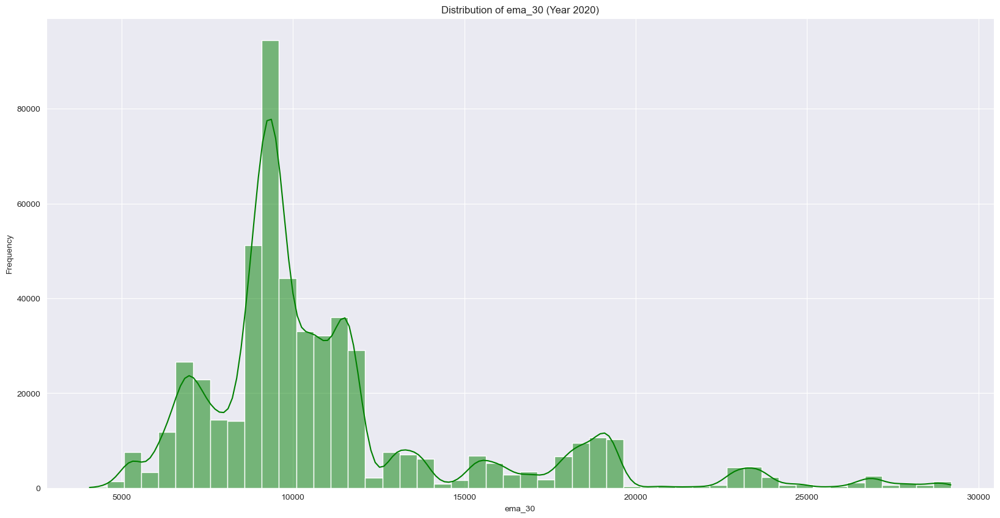


Boxplot of ema_30 (Year 2020):


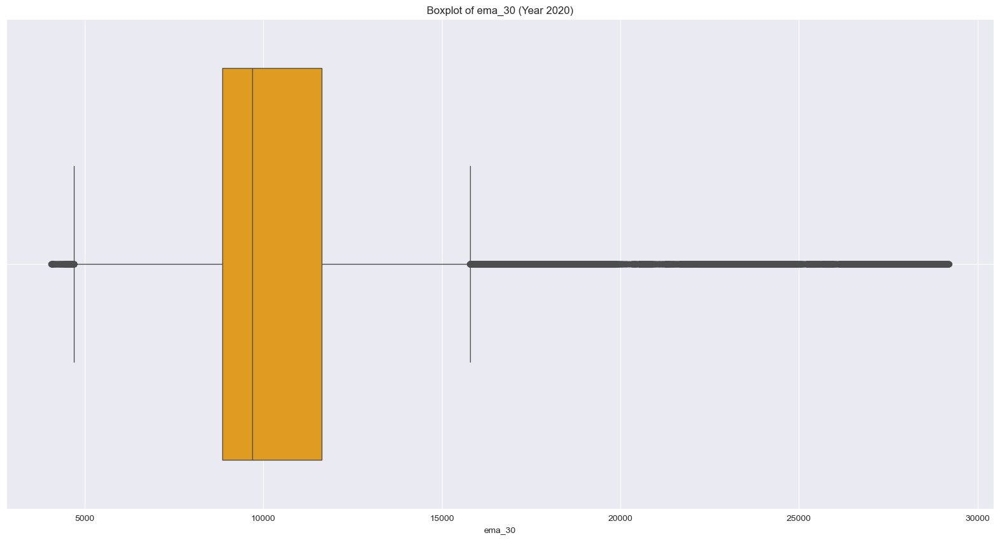


Distribution of ema_60 (Year 2020):


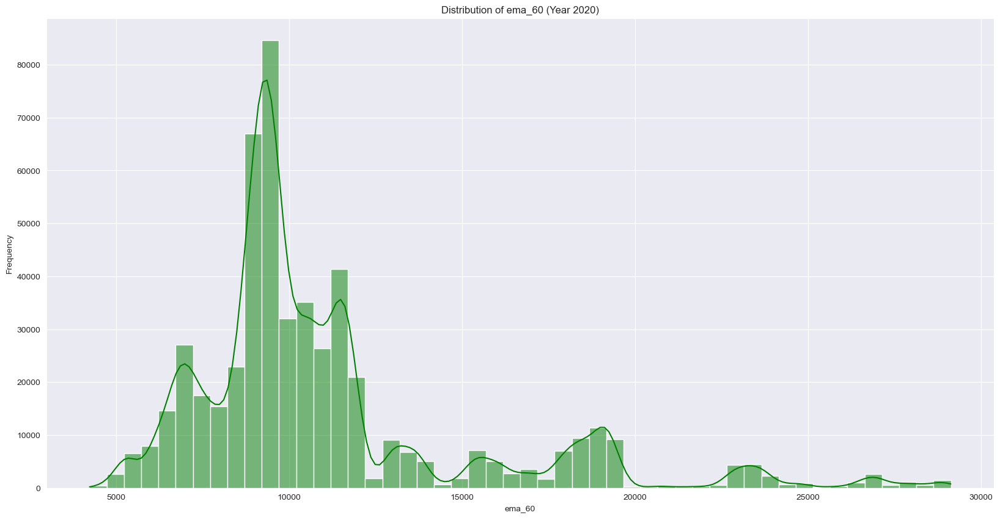


Boxplot of ema_60 (Year 2020):


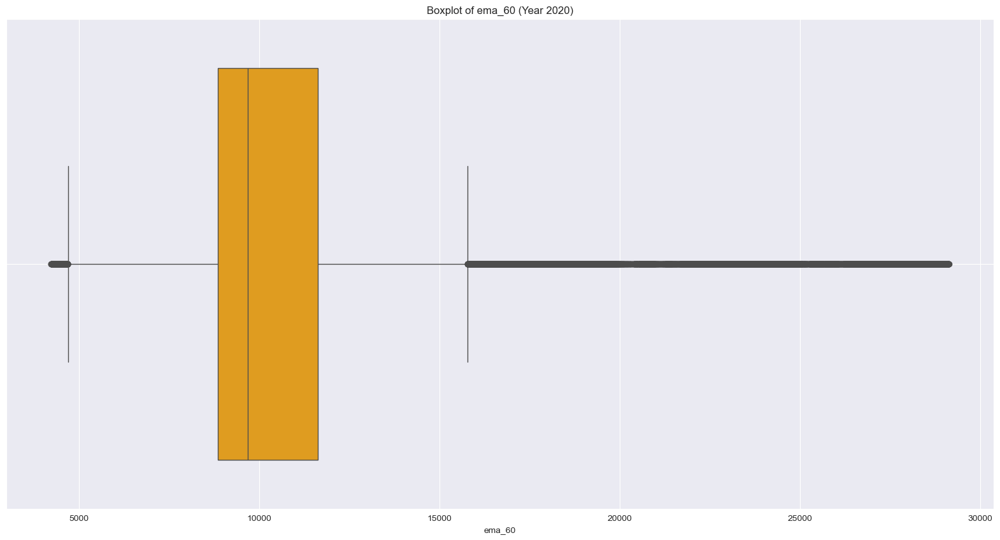


Distribution of ema_100 (Year 2020):


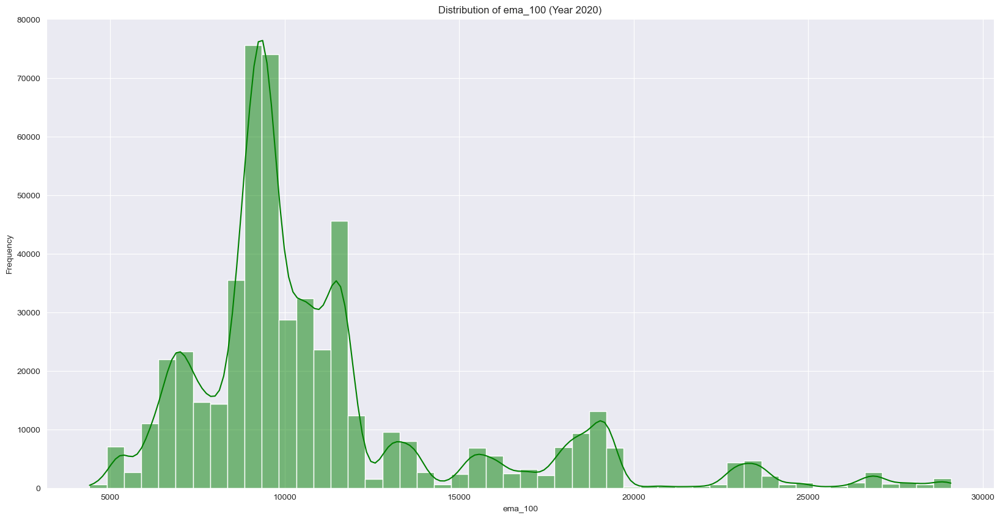


Boxplot of ema_100 (Year 2020):


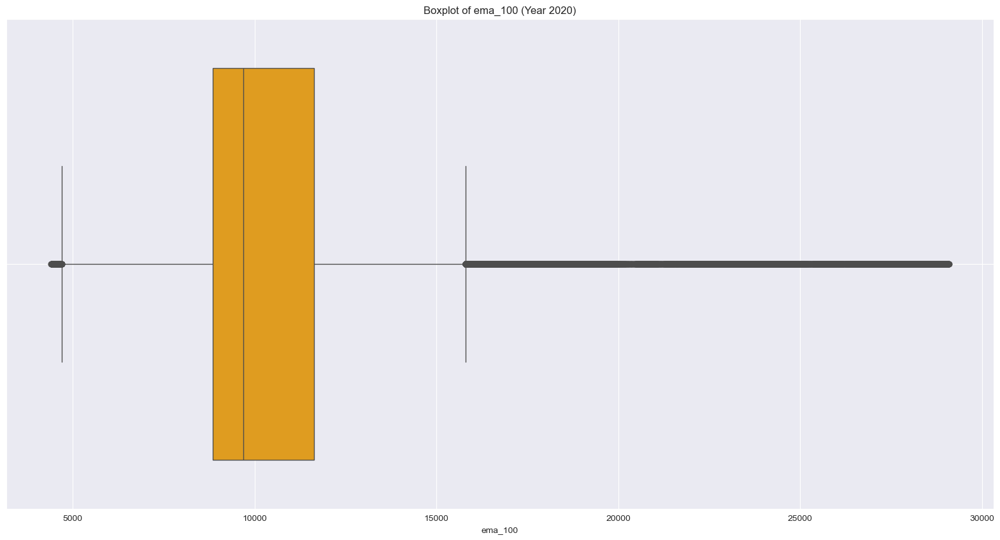


Distribution of ema_200 (Year 2020):


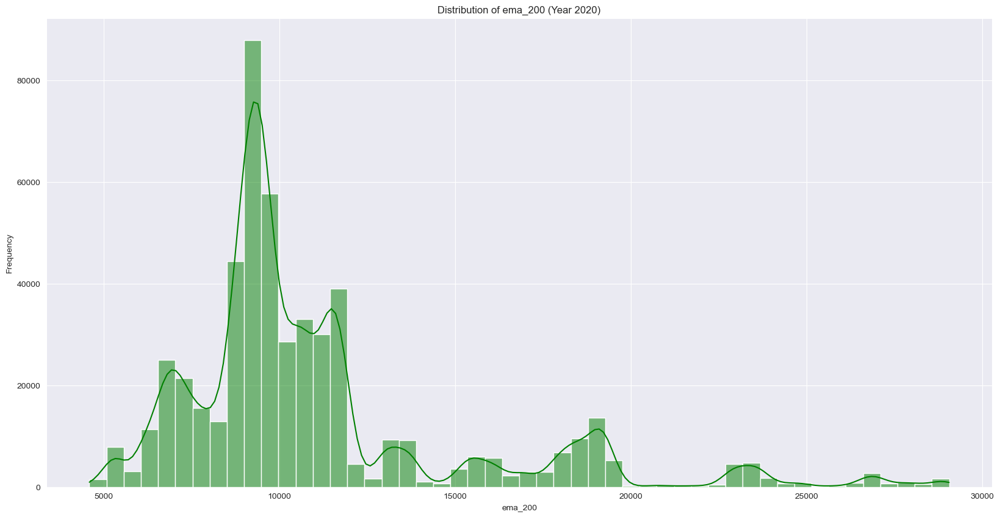


Boxplot of ema_200 (Year 2020):


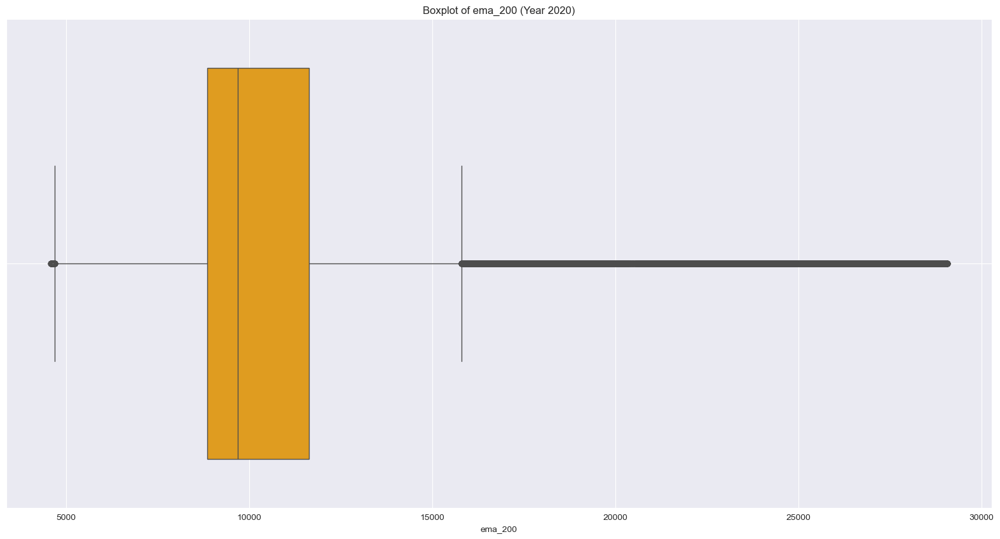


Distribution of WMA (Year 2020):


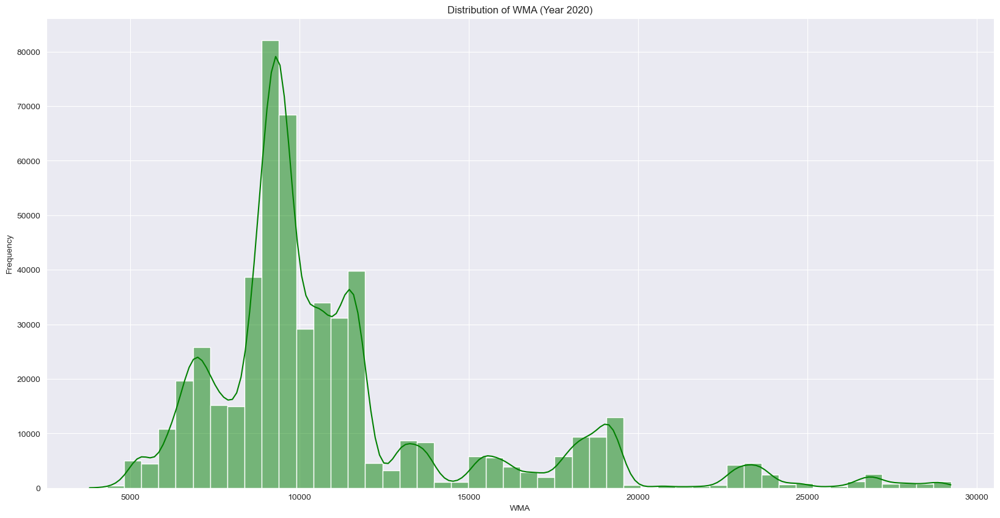


Boxplot of WMA (Year 2020):


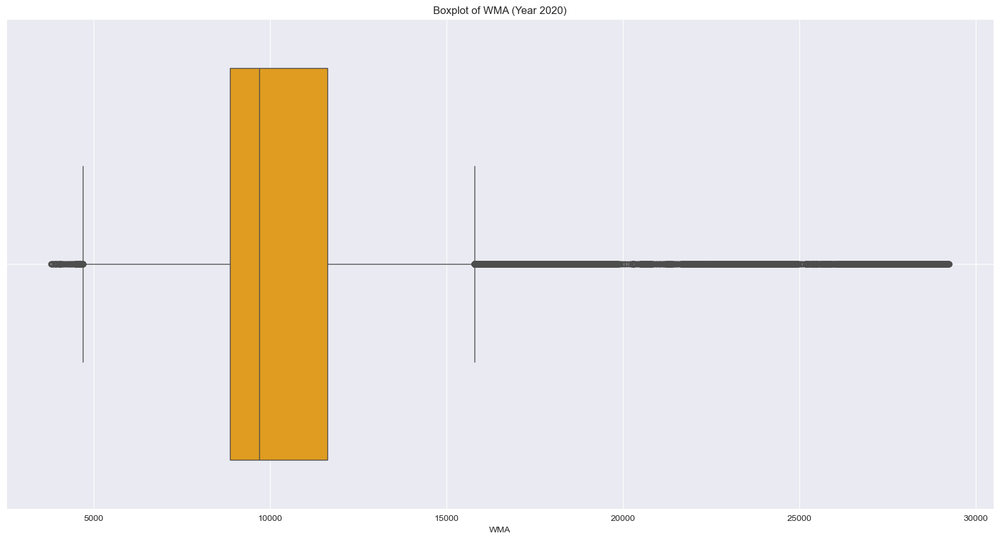


Distribution of MACD (Year 2020):


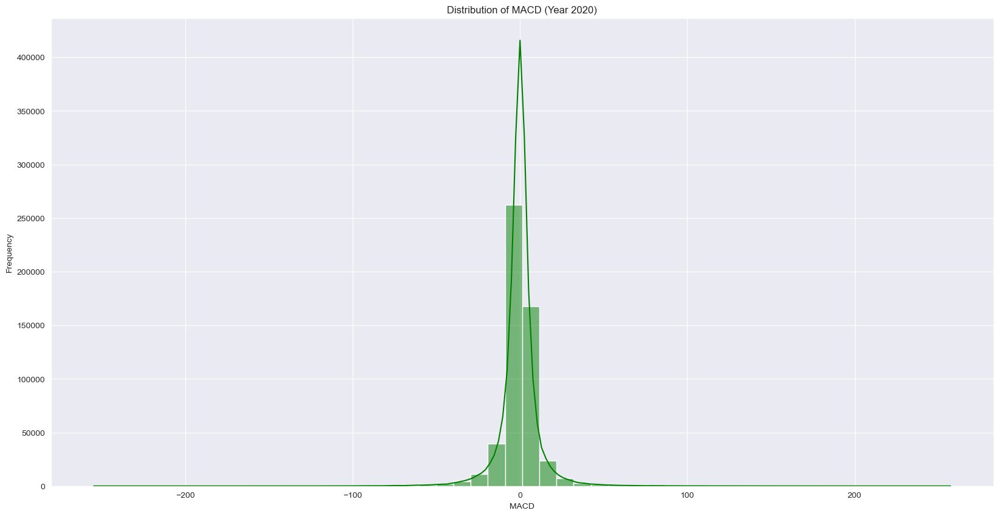


Boxplot of MACD (Year 2020):


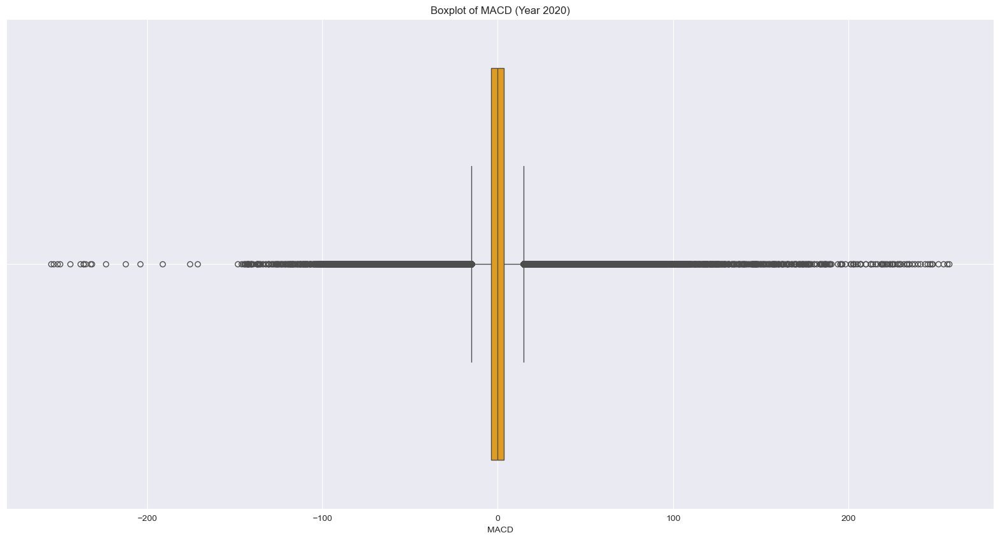


Distribution of MACD_Signal (Year 2020):


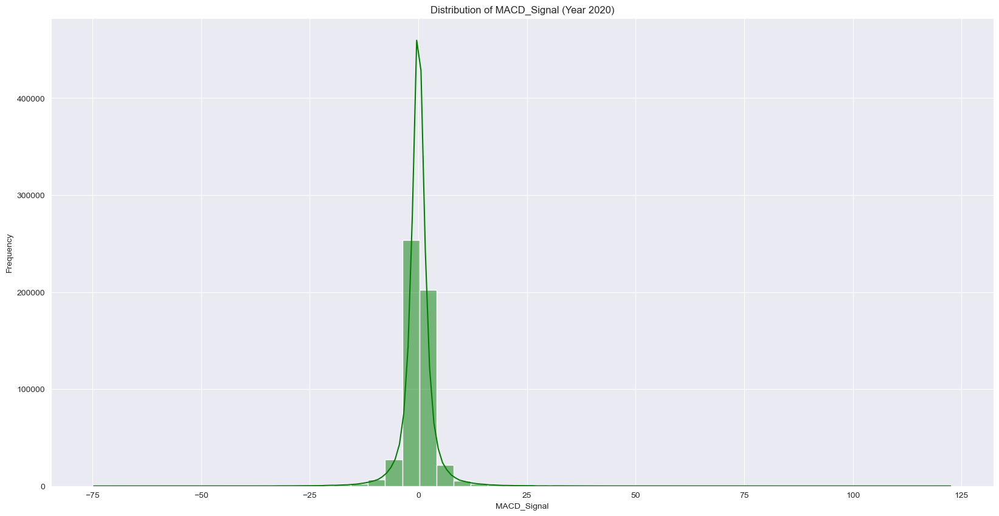


Boxplot of MACD_Signal (Year 2020):


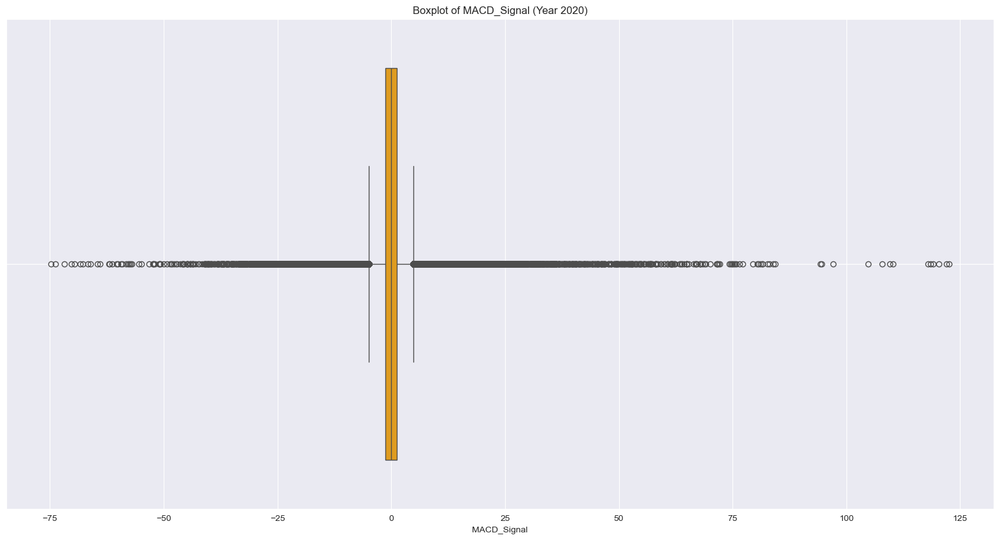


Distribution of MACD_Hist (Year 2020):


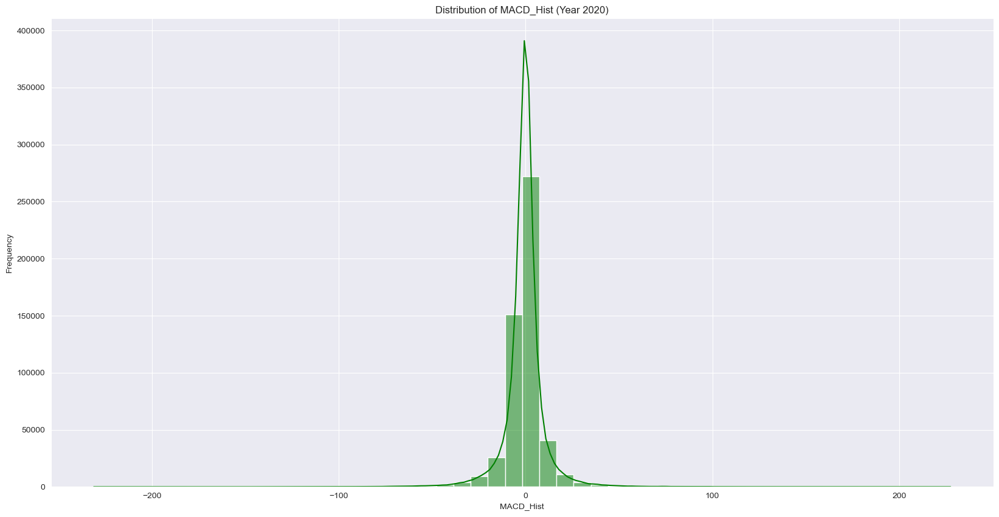


Boxplot of MACD_Hist (Year 2020):


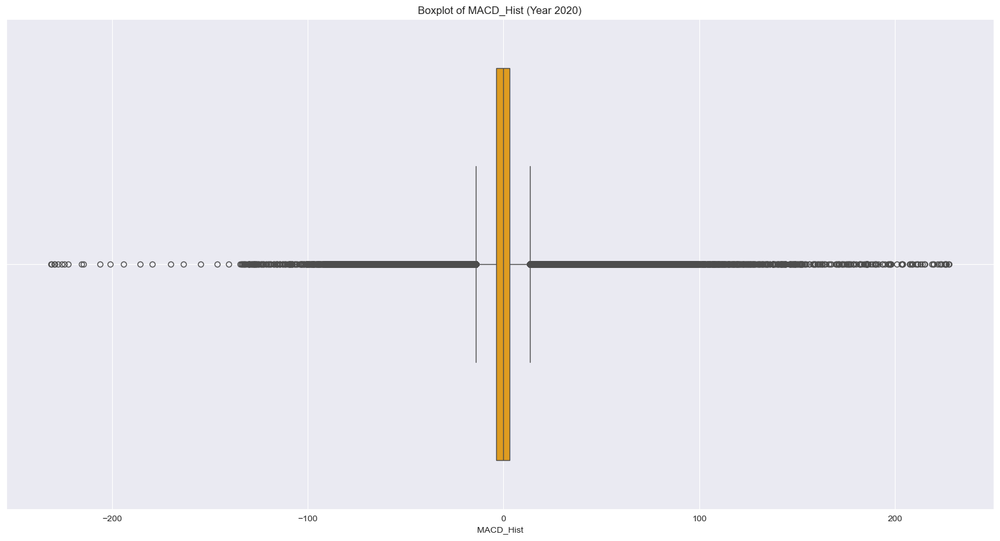


Distribution of ATR (Year 2020):


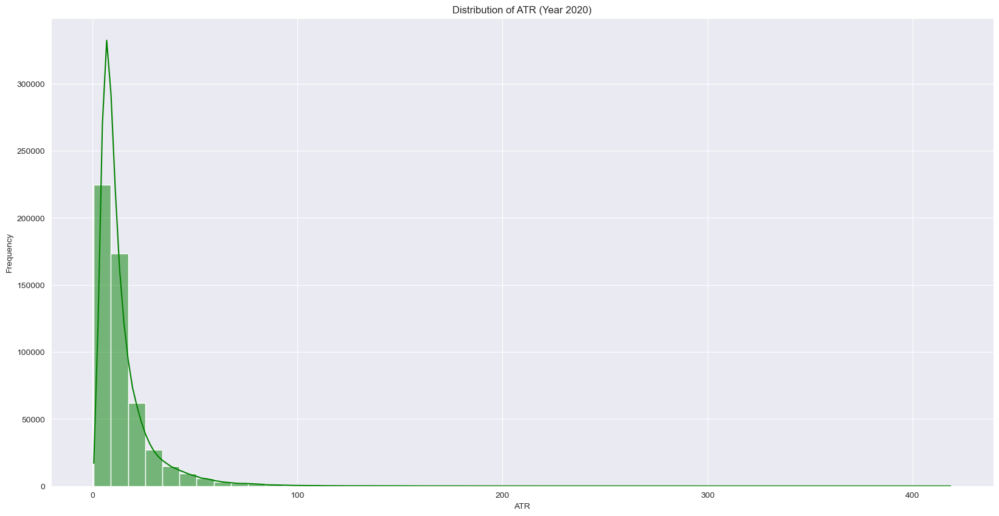


Boxplot of ATR (Year 2020):


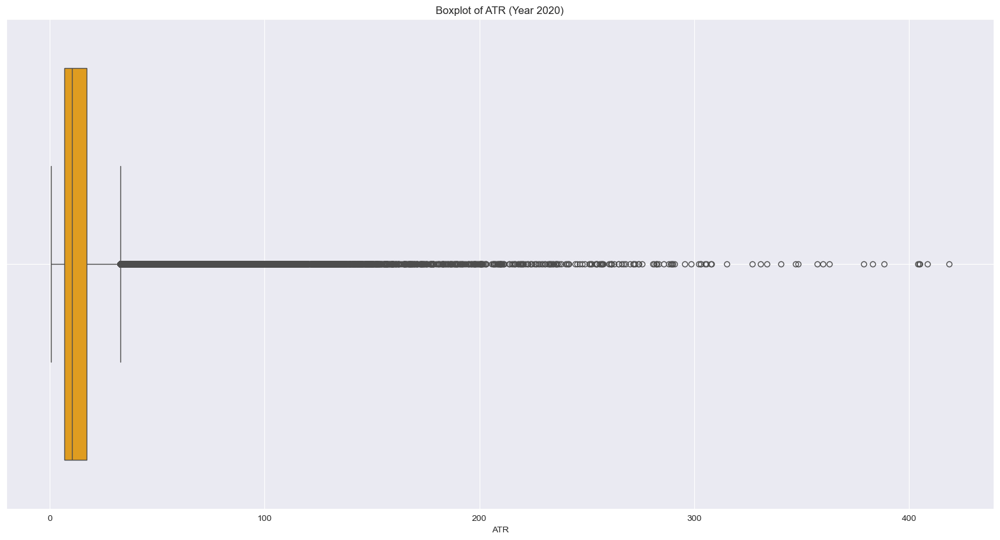


Distribution of HMA (Year 2020):


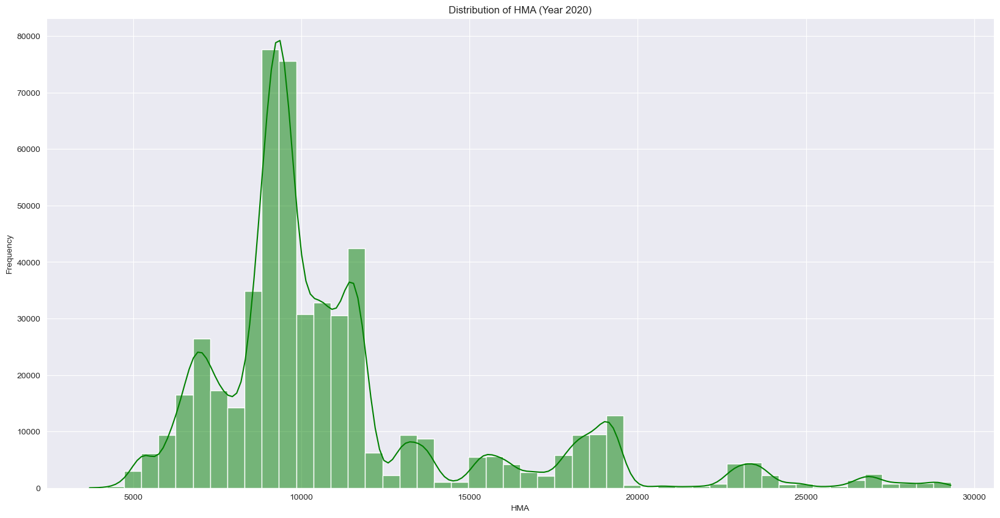


Boxplot of HMA (Year 2020):


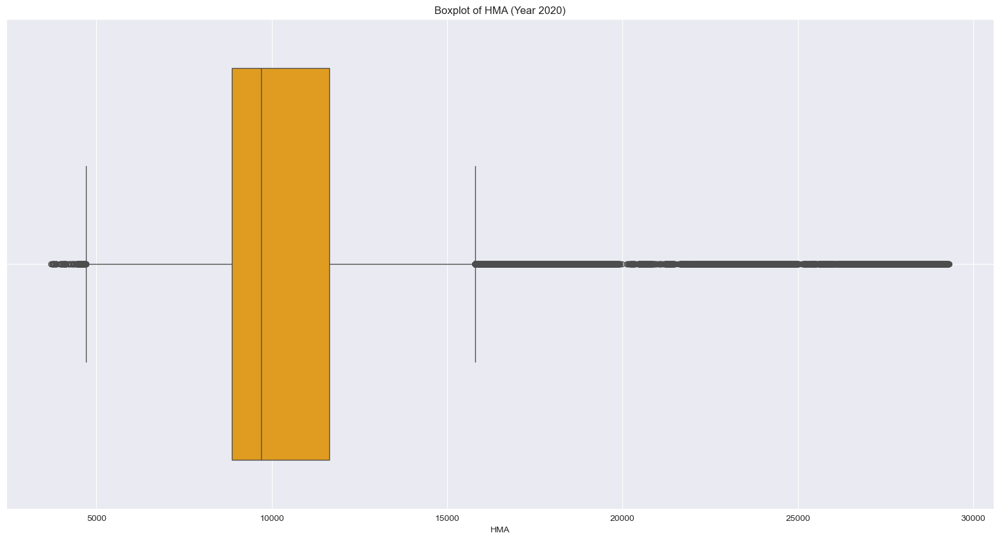


Distribution of KAMA (Year 2020):


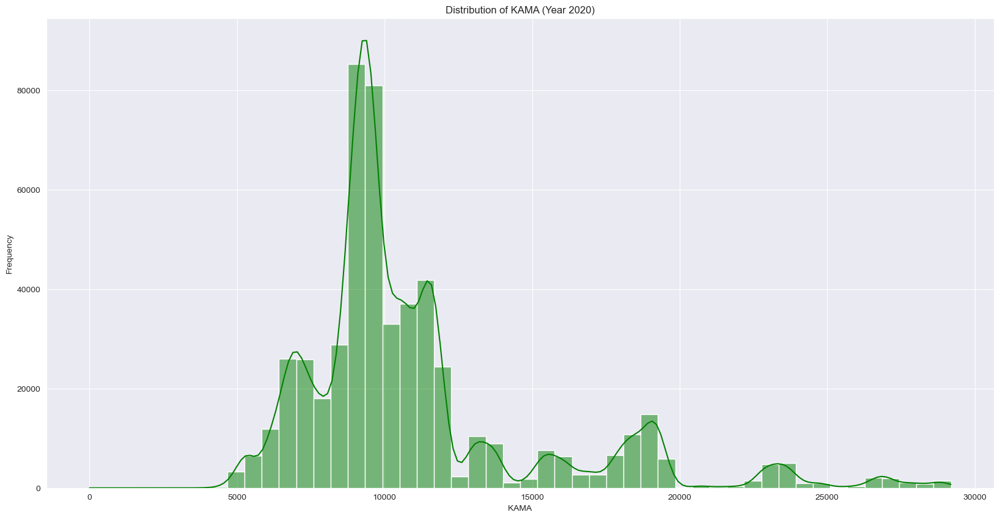


Boxplot of KAMA (Year 2020):


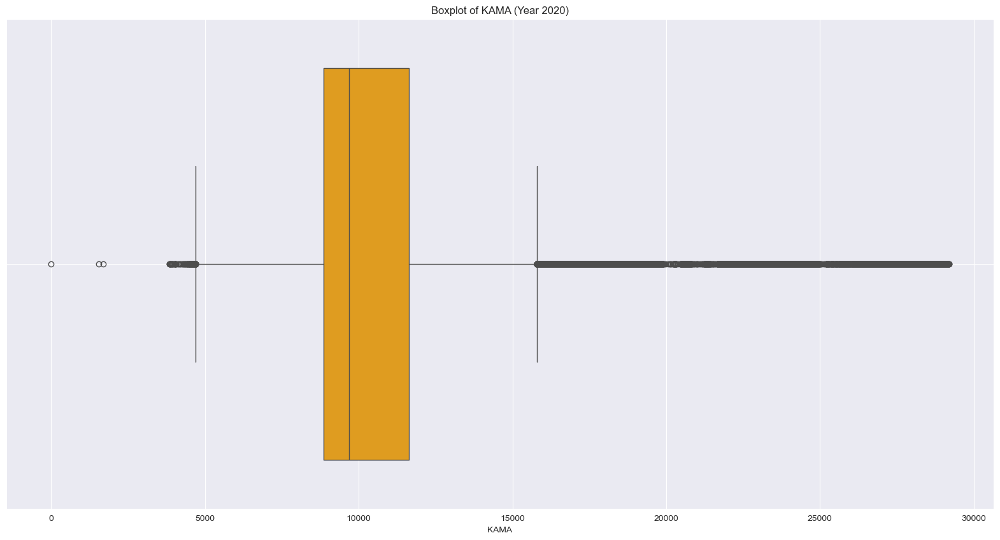


Distribution of CMO (Year 2020):


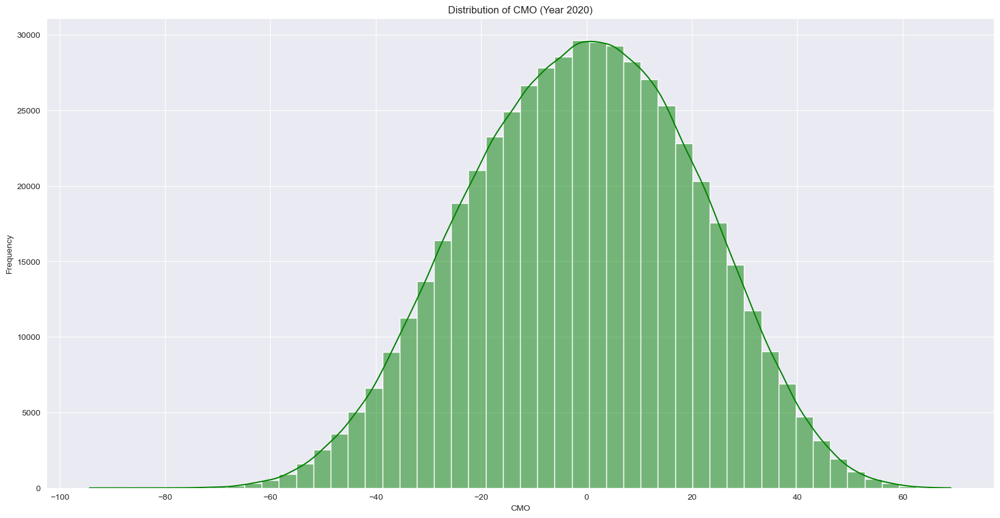


Boxplot of CMO (Year 2020):


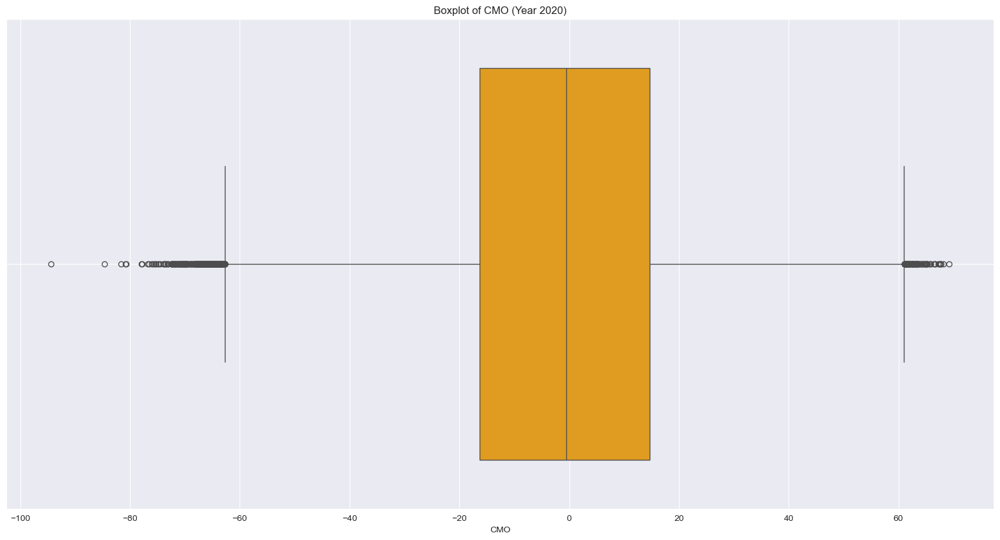


Distribution of Z-Score (Year 2020):


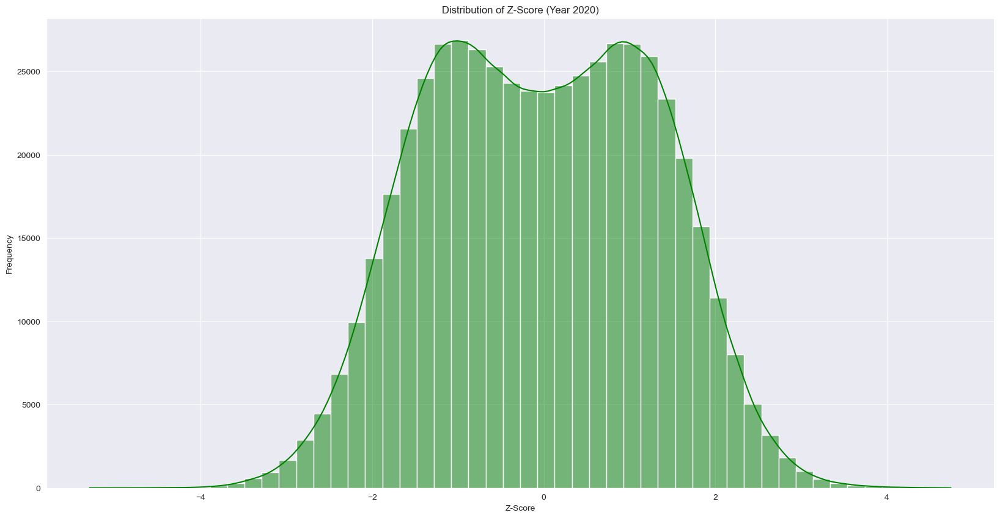


Boxplot of Z-Score (Year 2020):


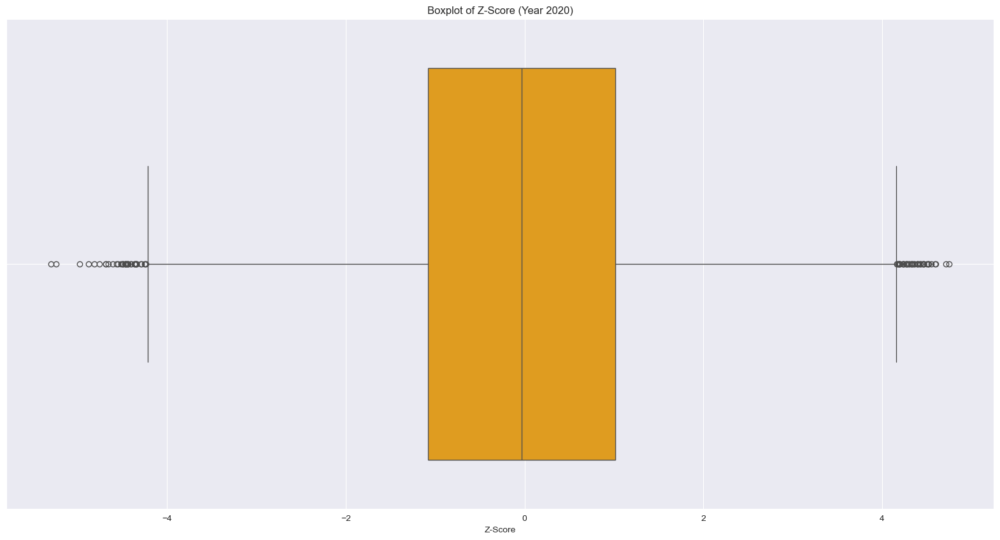


Distribution of QStick (Year 2020):


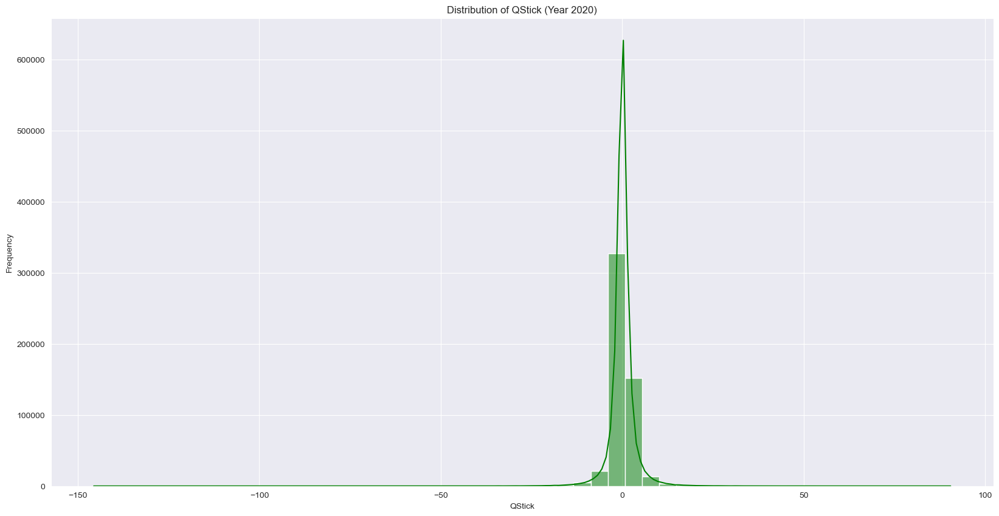


Boxplot of QStick (Year 2020):


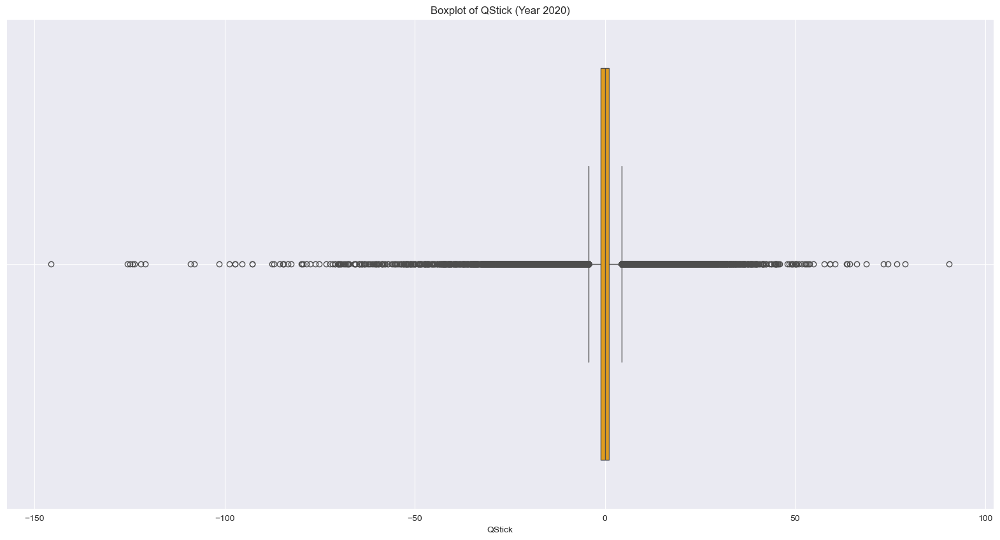


Distribution of year (Year 2020):


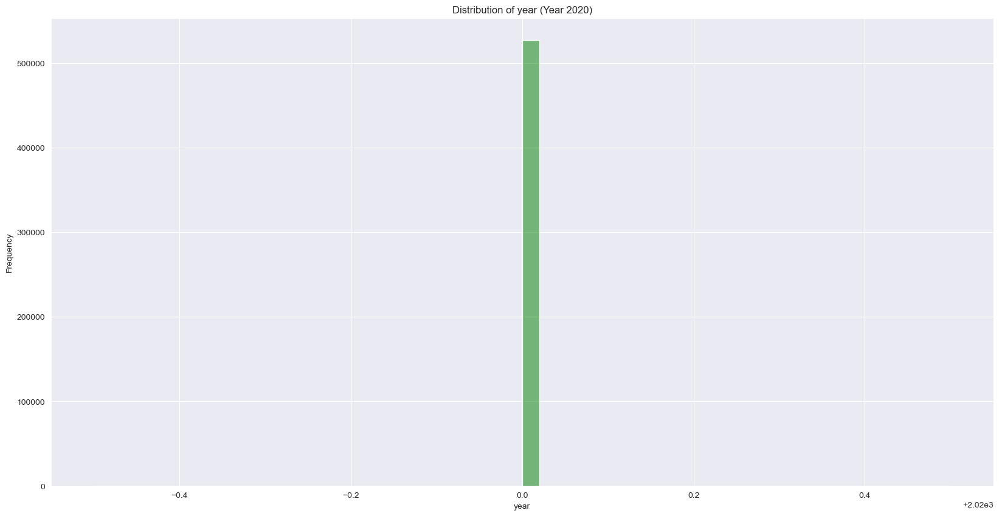


Boxplot of year (Year 2020):


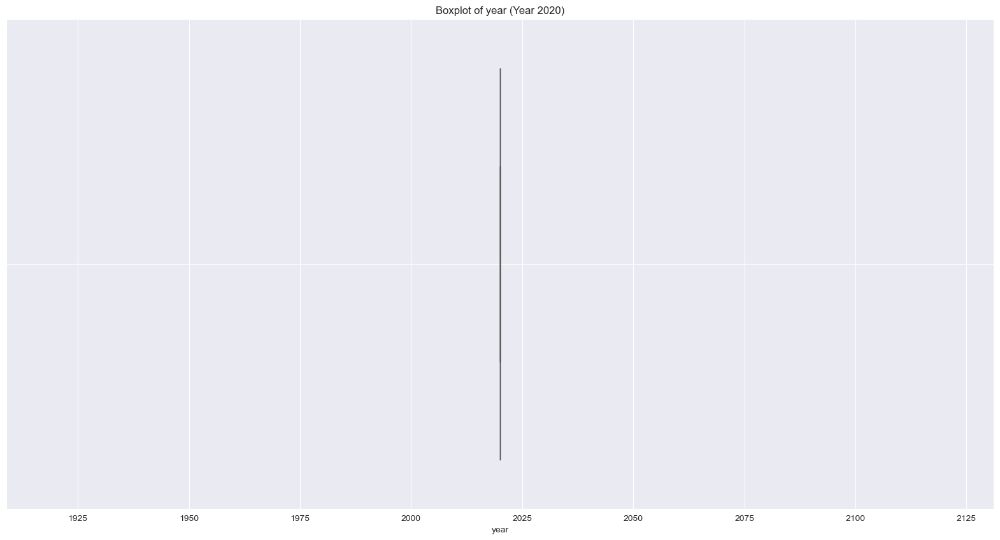


Distribution of day_of_week (Year 2020):


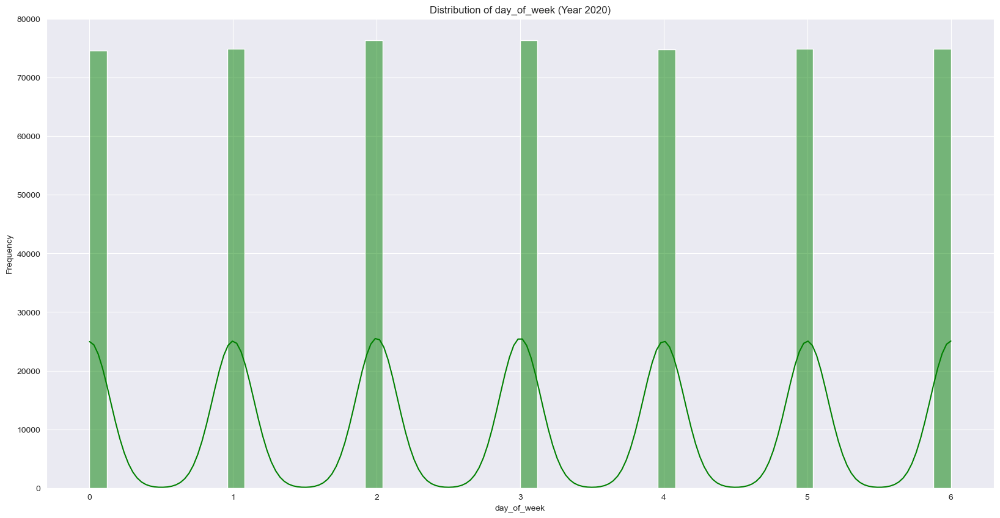


Boxplot of day_of_week (Year 2020):


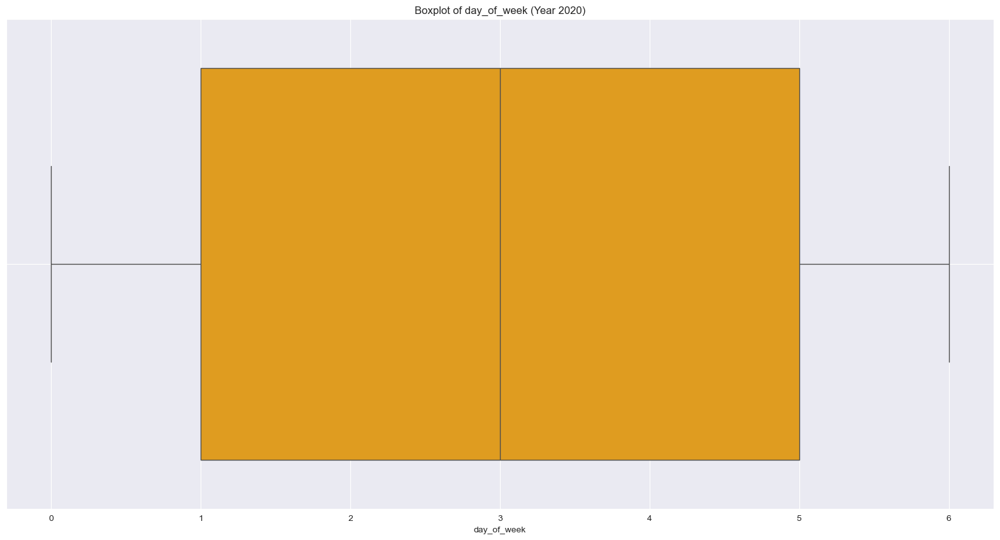


Distribution of month (Year 2020):


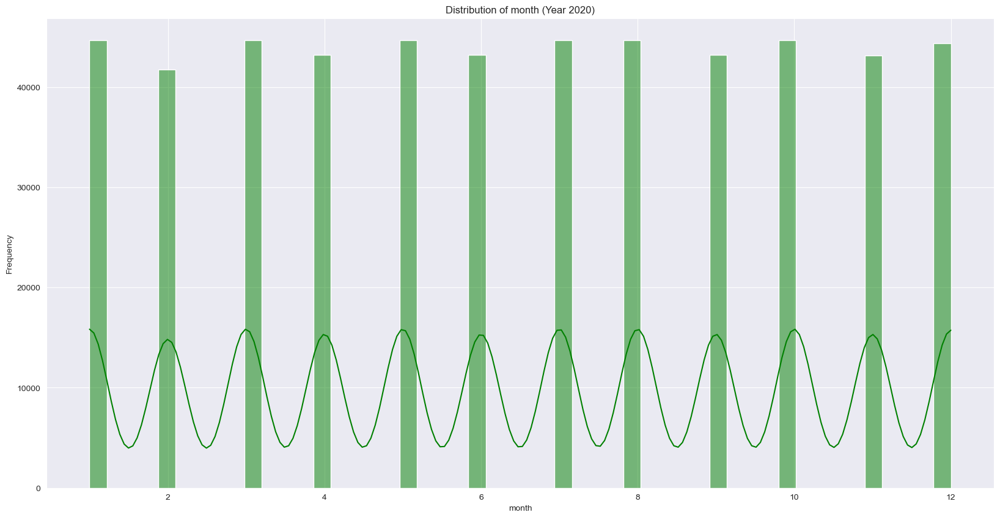


Boxplot of month (Year 2020):


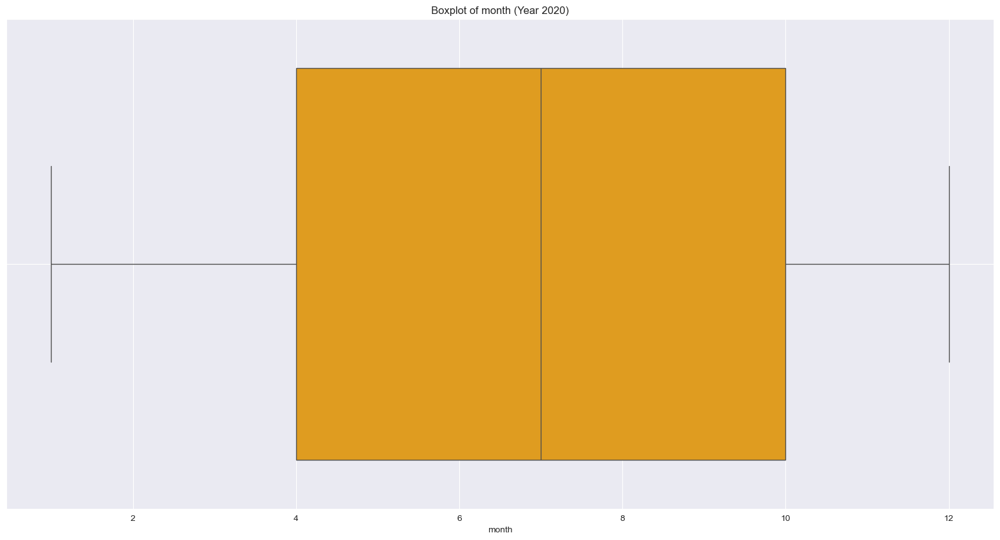


Distribution of week_of_year (Year 2020):


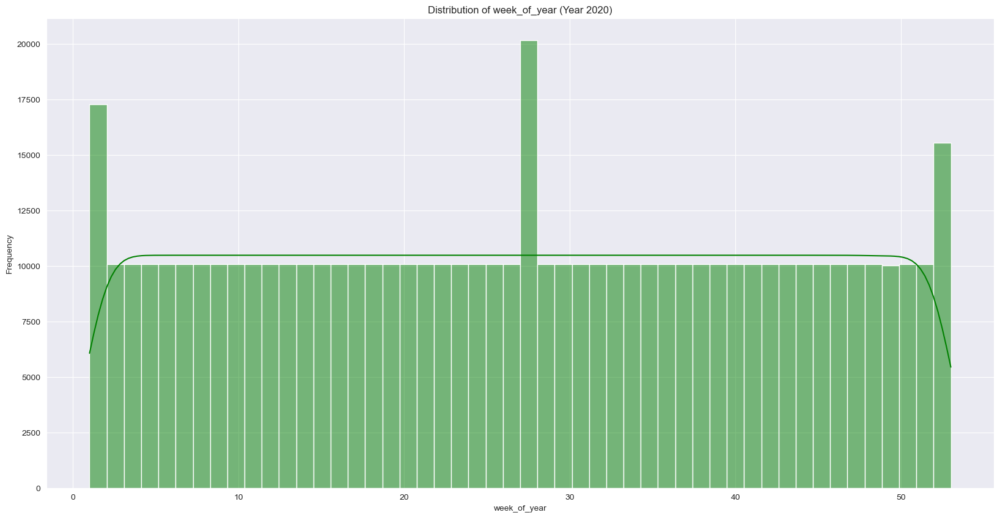


Boxplot of week_of_year (Year 2020):


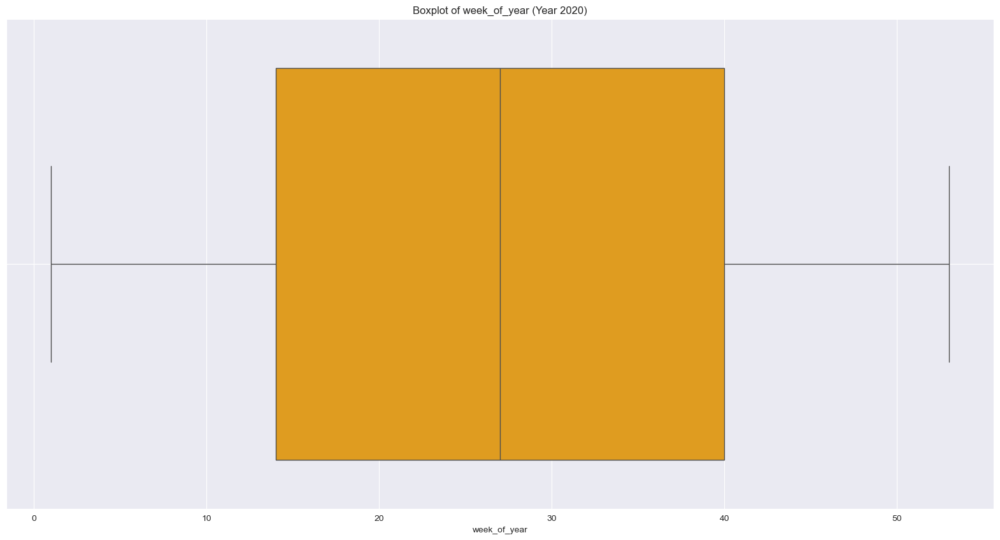


Distribution of time_delta (Year 2020):


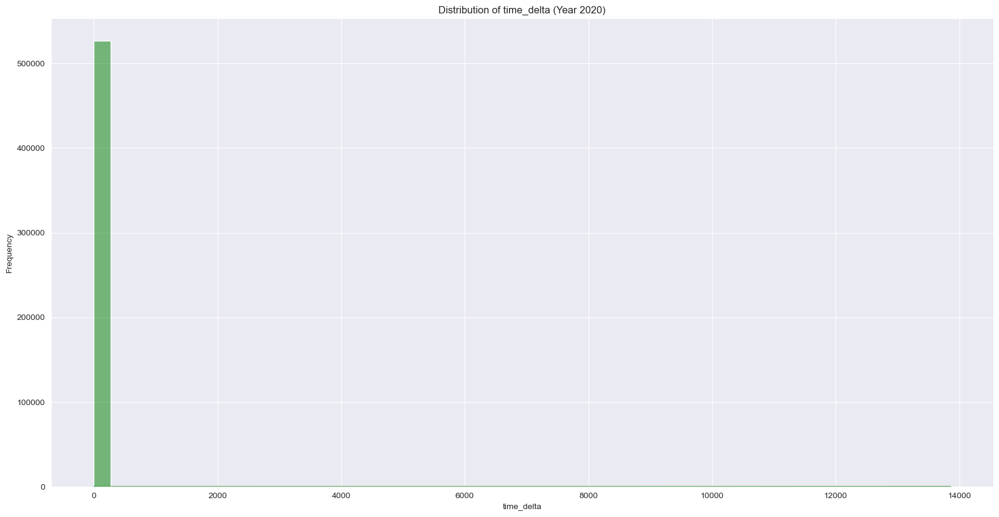


Boxplot of time_delta (Year 2020):


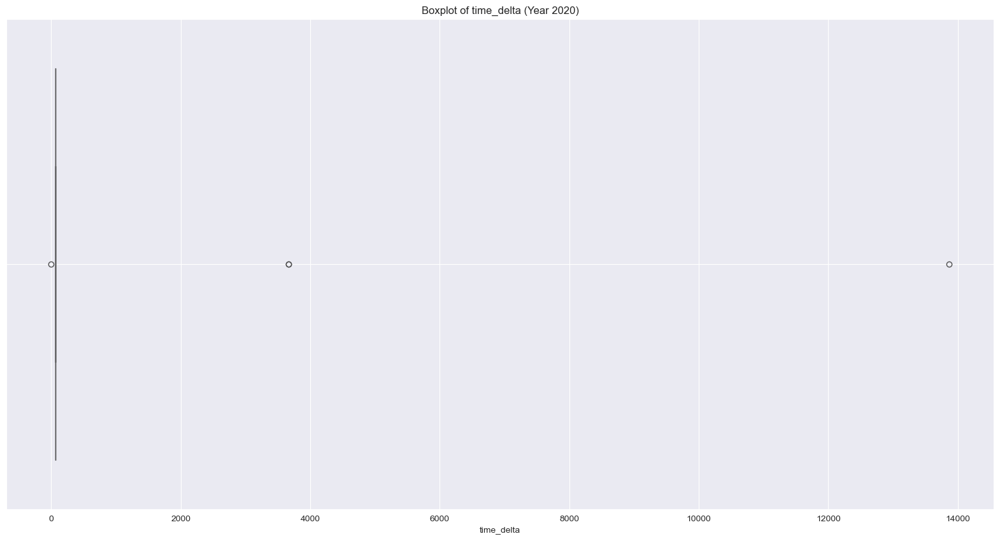


Distribution of open (Year 2021):


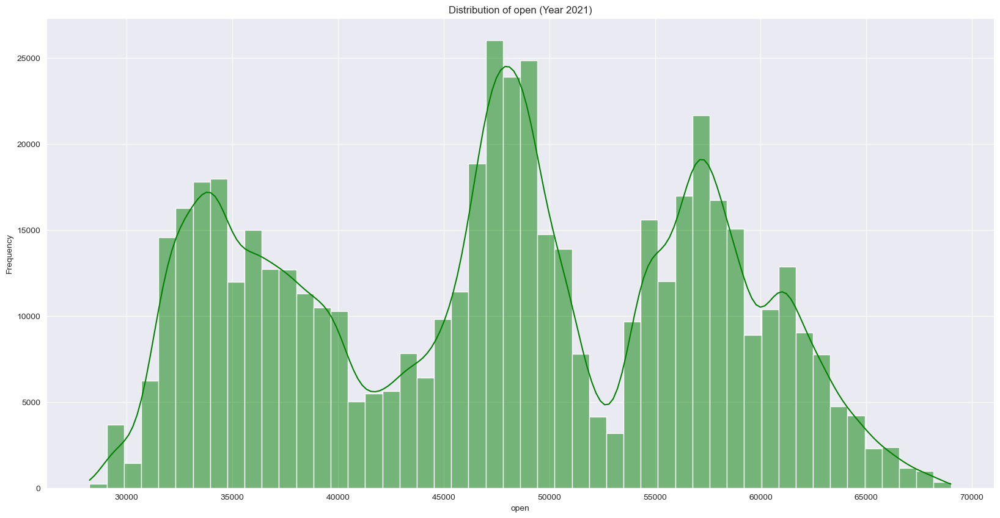


Boxplot of open (Year 2021):


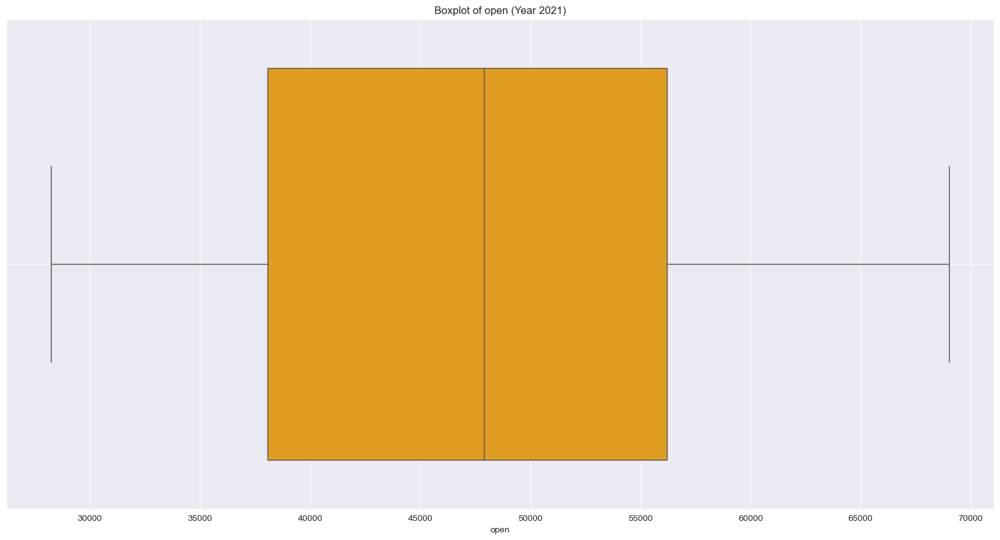


Distribution of high (Year 2021):


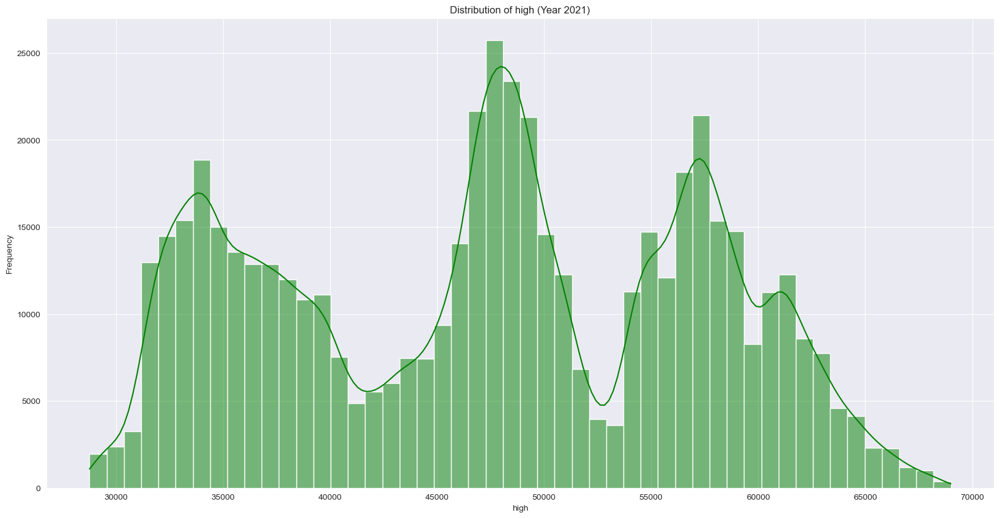


Boxplot of high (Year 2021):


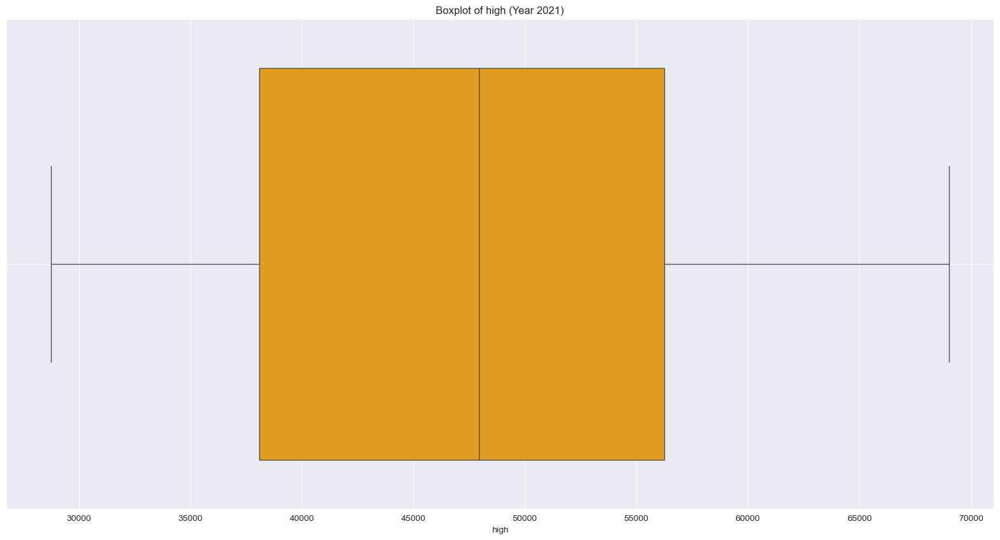


Distribution of low (Year 2021):


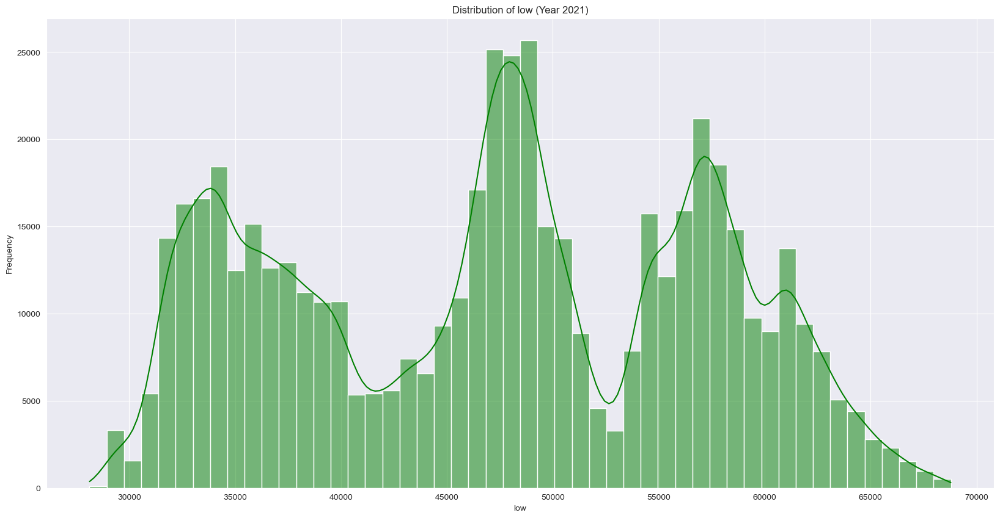


Boxplot of low (Year 2021):


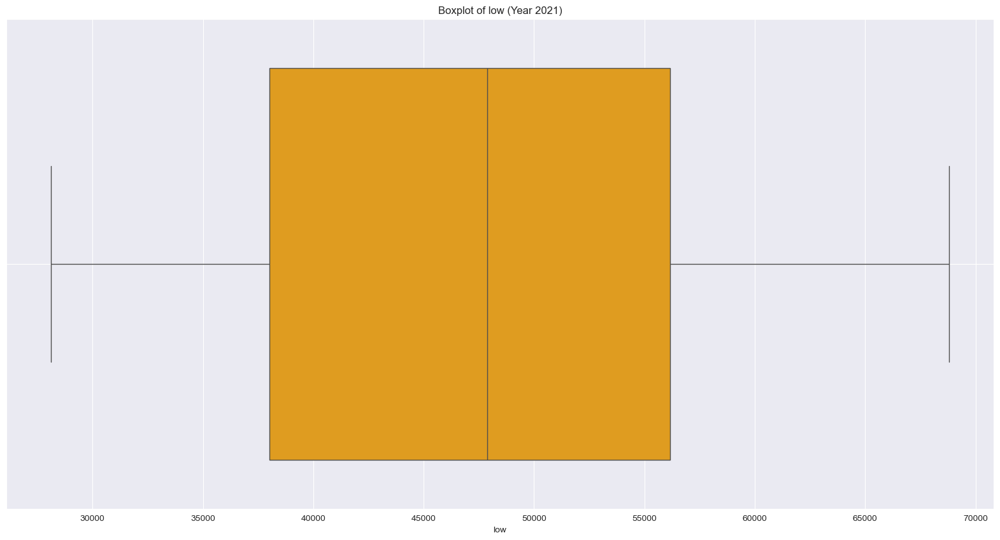


Distribution of close (Year 2021):


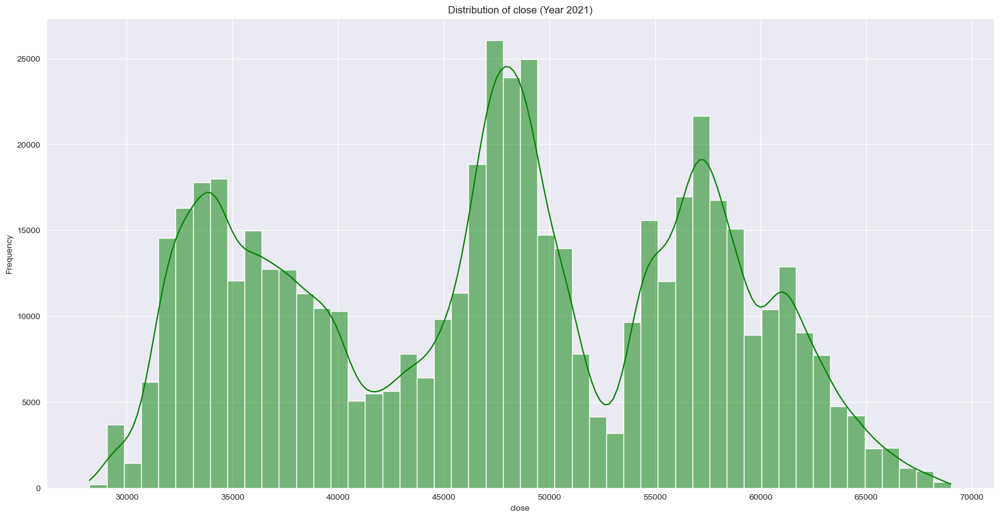


Boxplot of close (Year 2021):


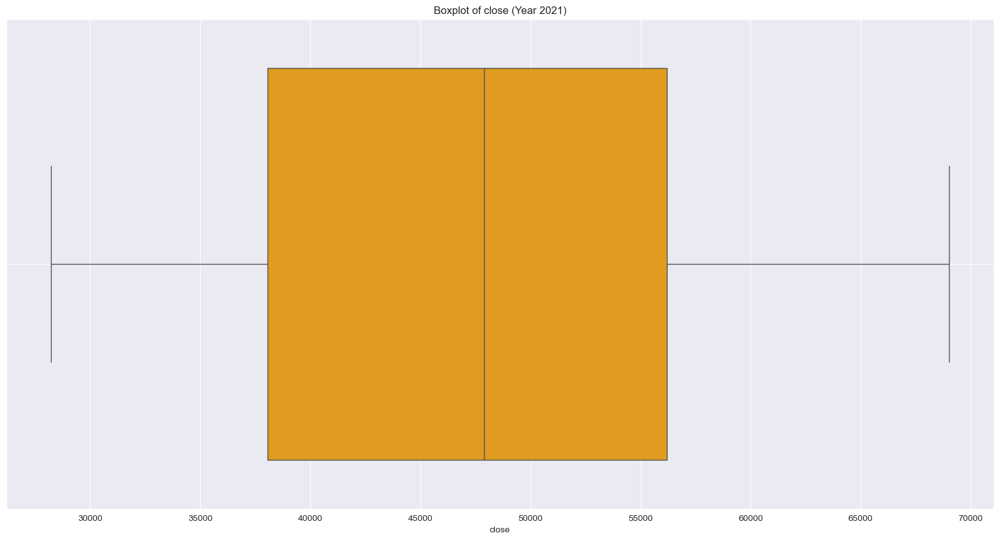


Distribution of Volume USDT (Year 2021):


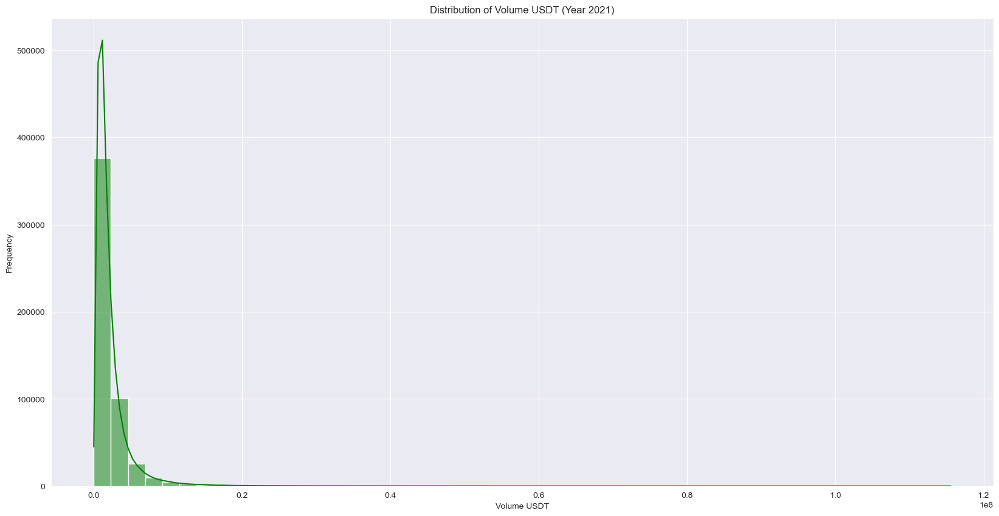


Boxplot of Volume USDT (Year 2021):


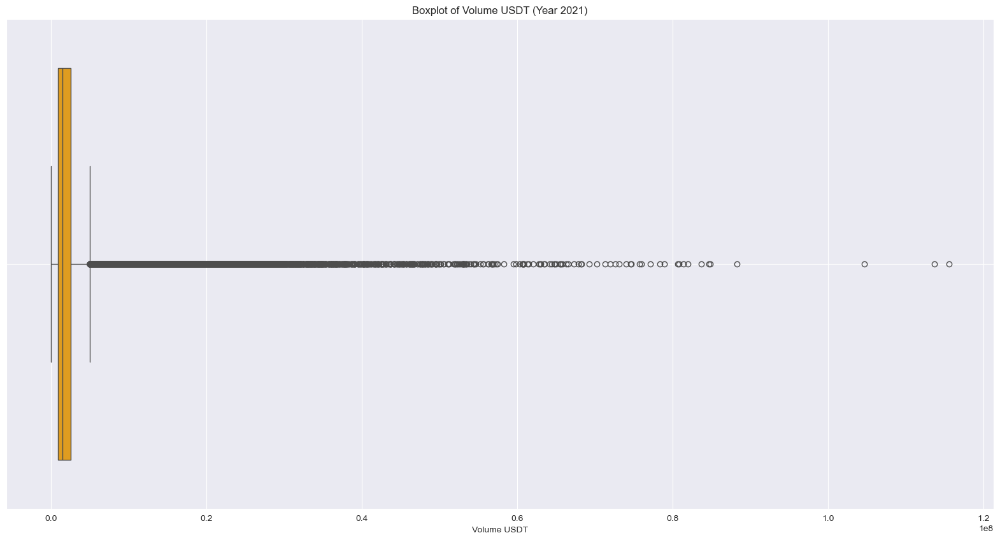


Distribution of tradecount (Year 2021):


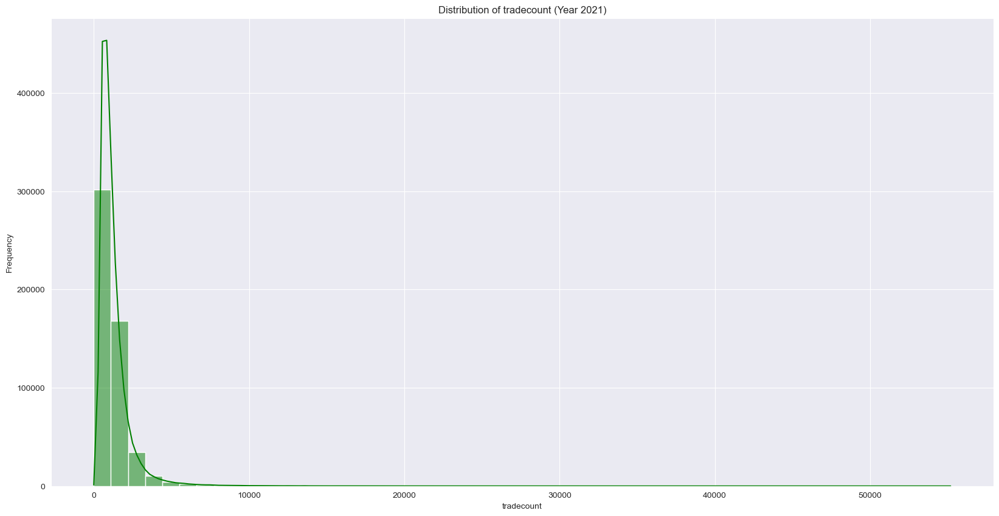


Boxplot of tradecount (Year 2021):


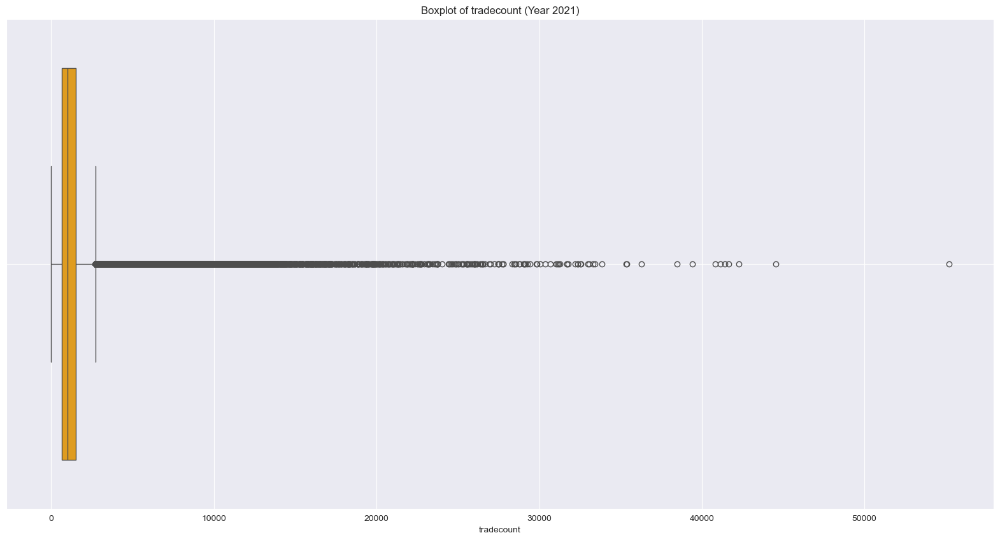


Distribution of hour (Year 2021):


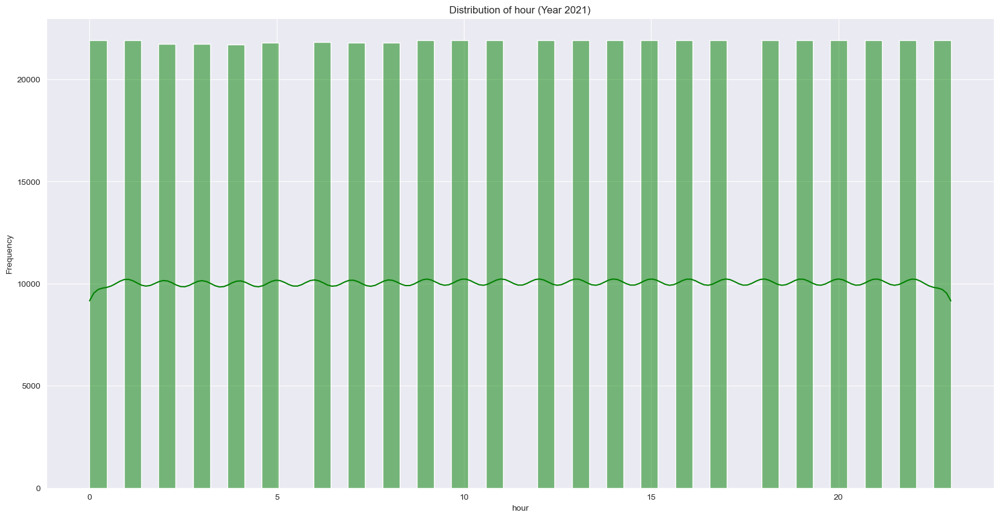


Boxplot of hour (Year 2021):


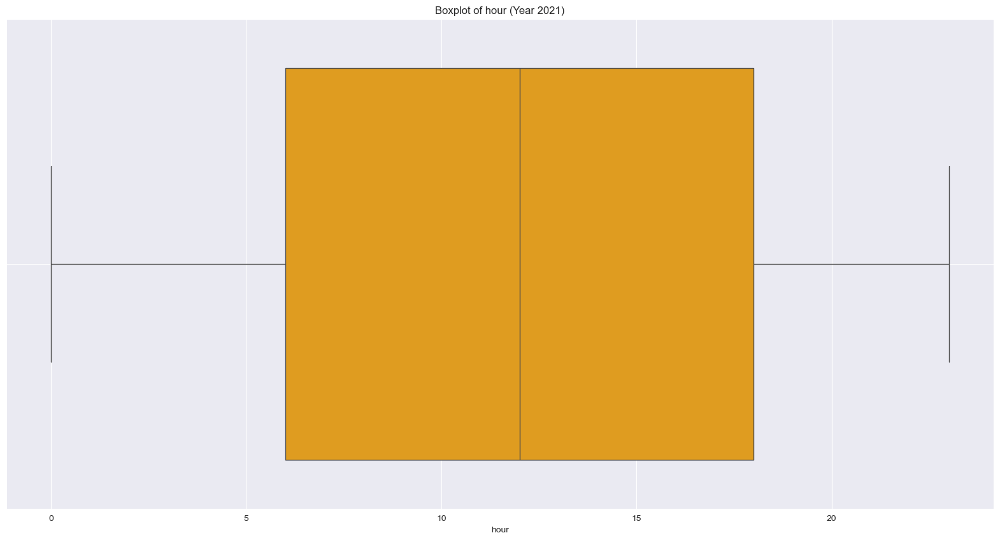


Distribution of ema_5 (Year 2021):


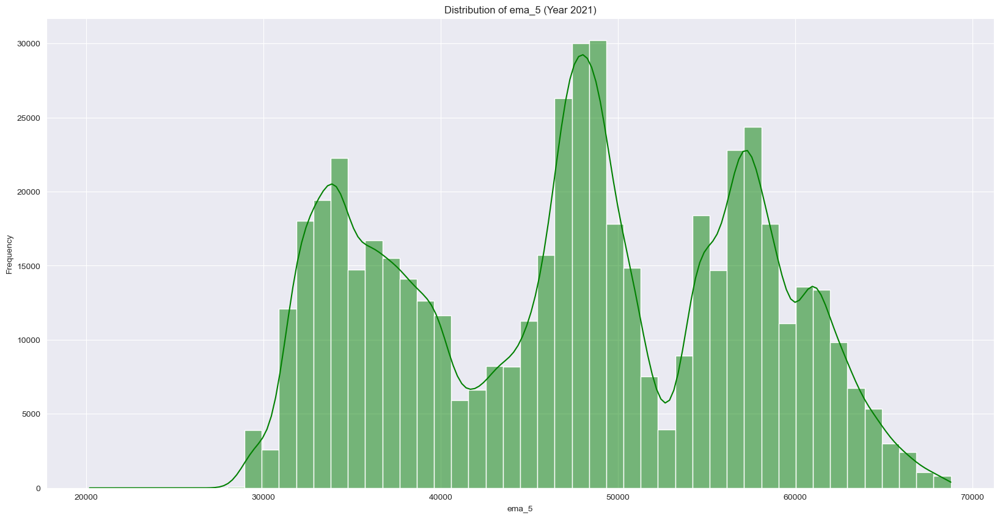


Boxplot of ema_5 (Year 2021):


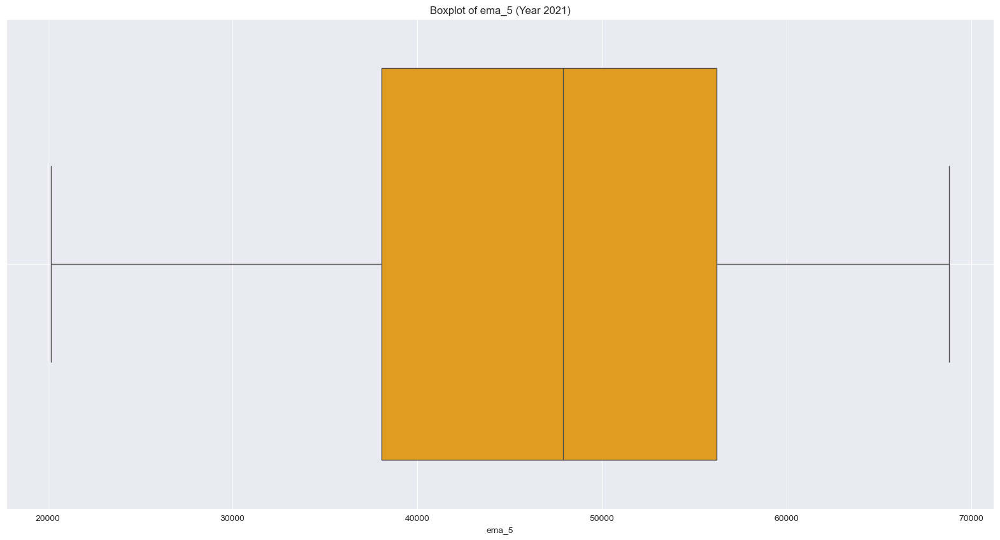


Distribution of ema_15 (Year 2021):


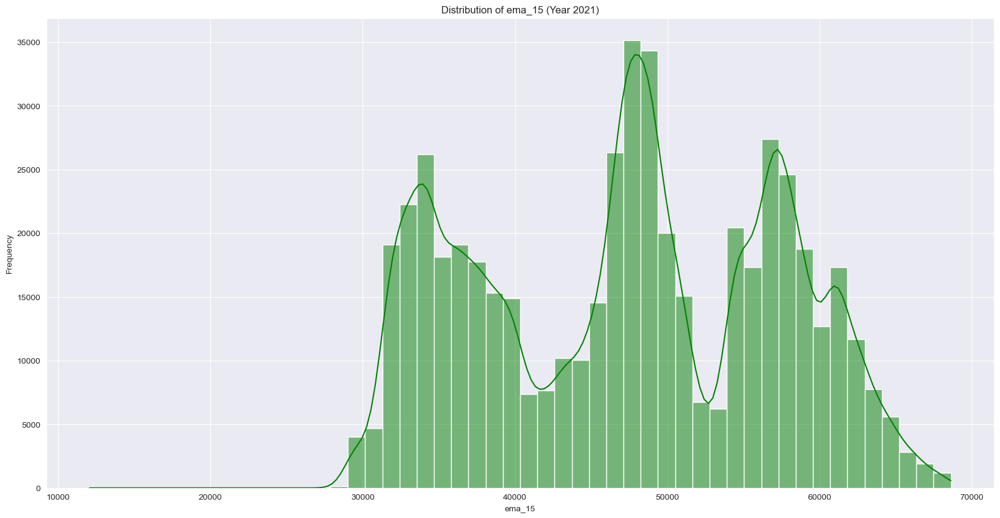


Boxplot of ema_15 (Year 2021):


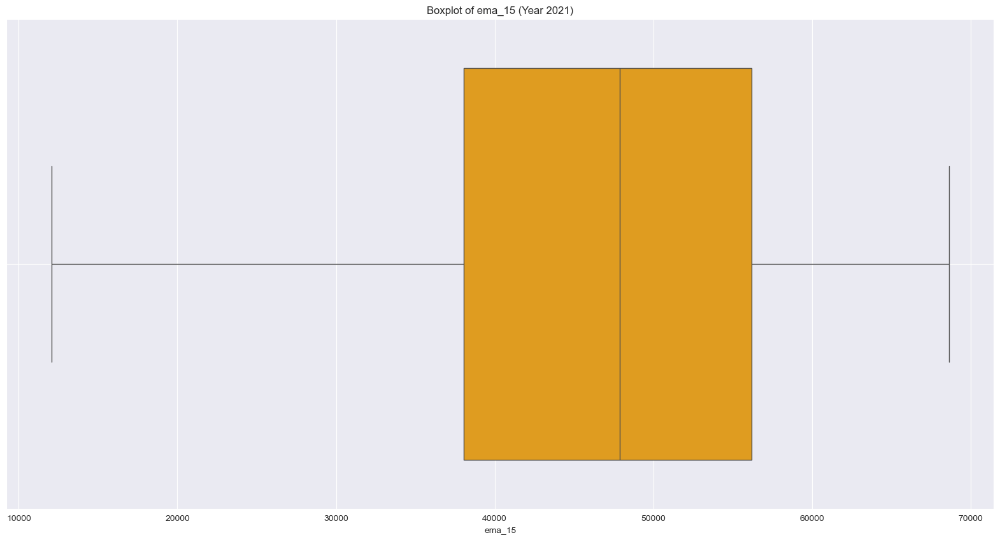


Distribution of ema_30 (Year 2021):


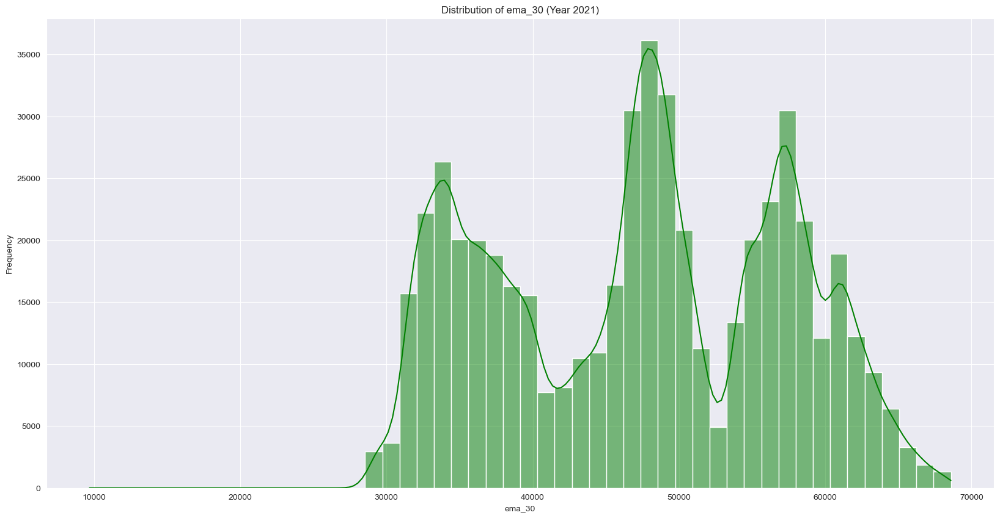


Boxplot of ema_30 (Year 2021):


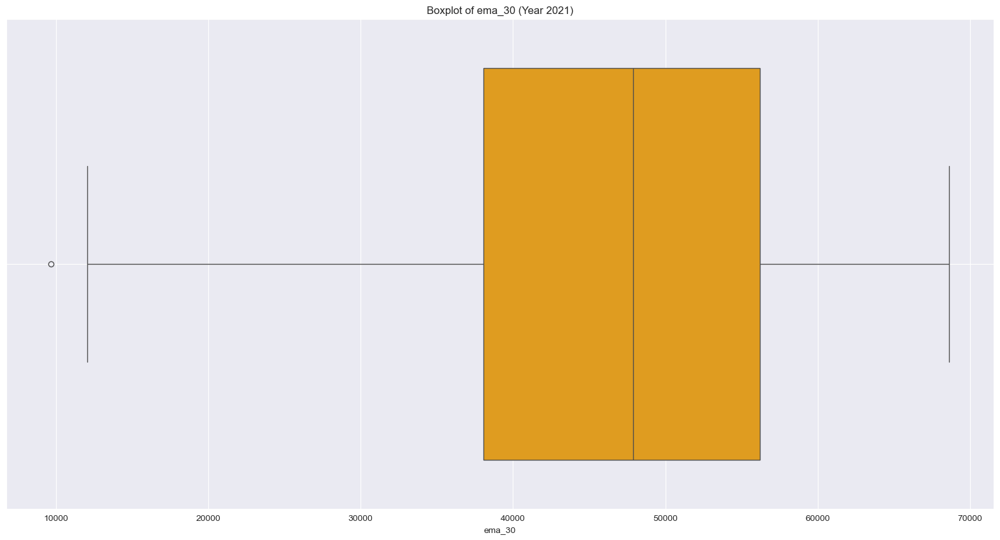


Distribution of ema_60 (Year 2021):


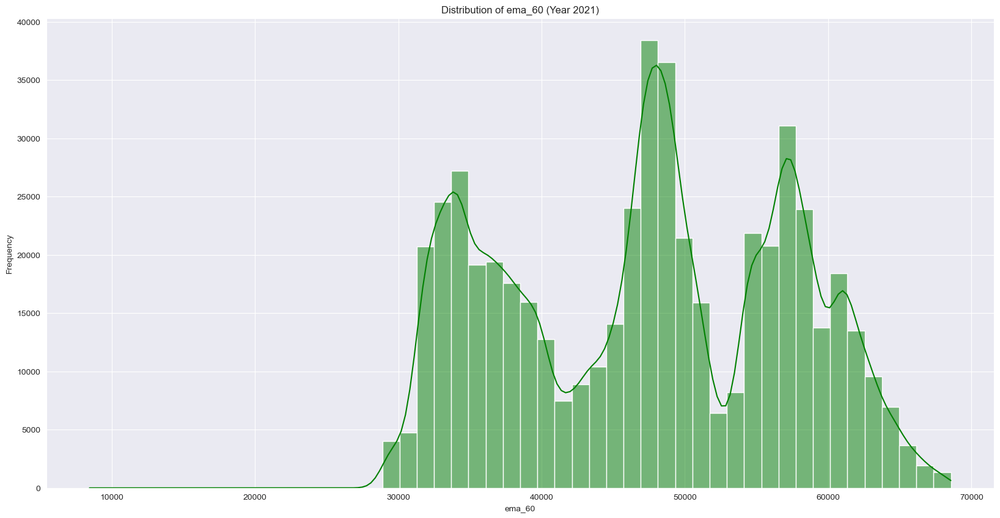


Boxplot of ema_60 (Year 2021):


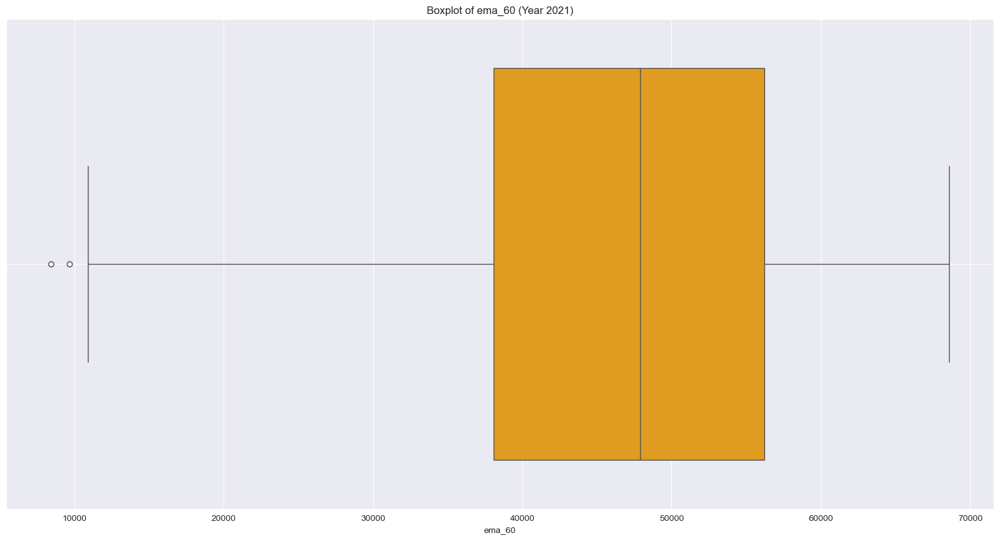


Distribution of ema_100 (Year 2021):


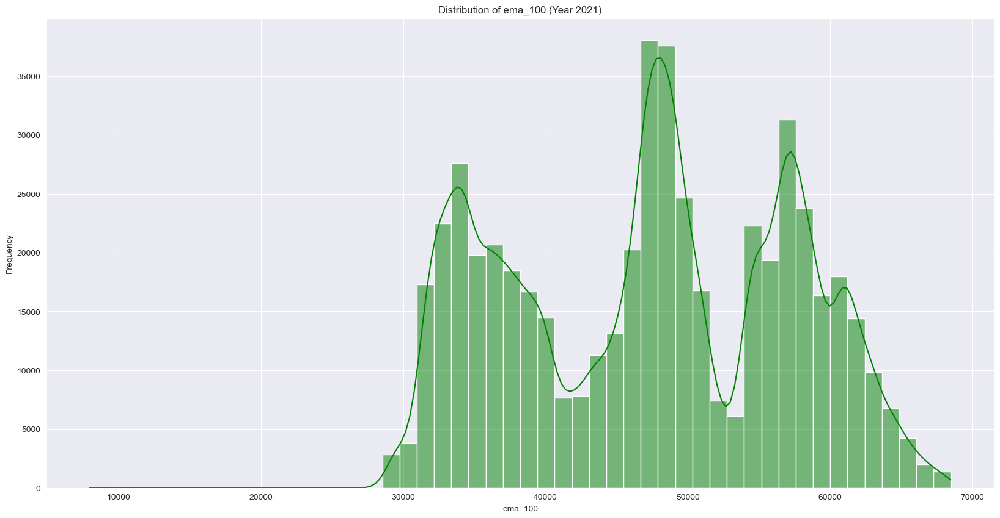


Boxplot of ema_100 (Year 2021):


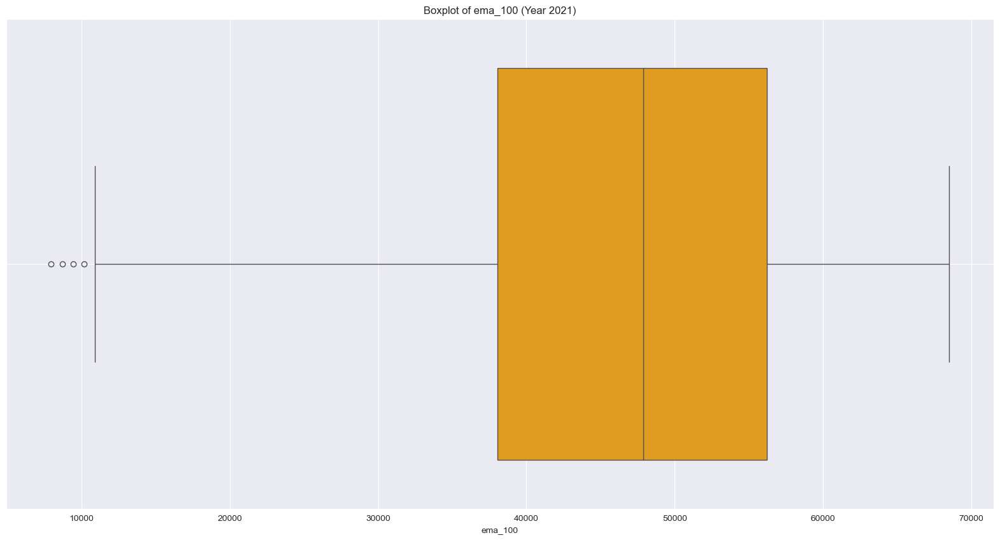


Distribution of ema_200 (Year 2021):


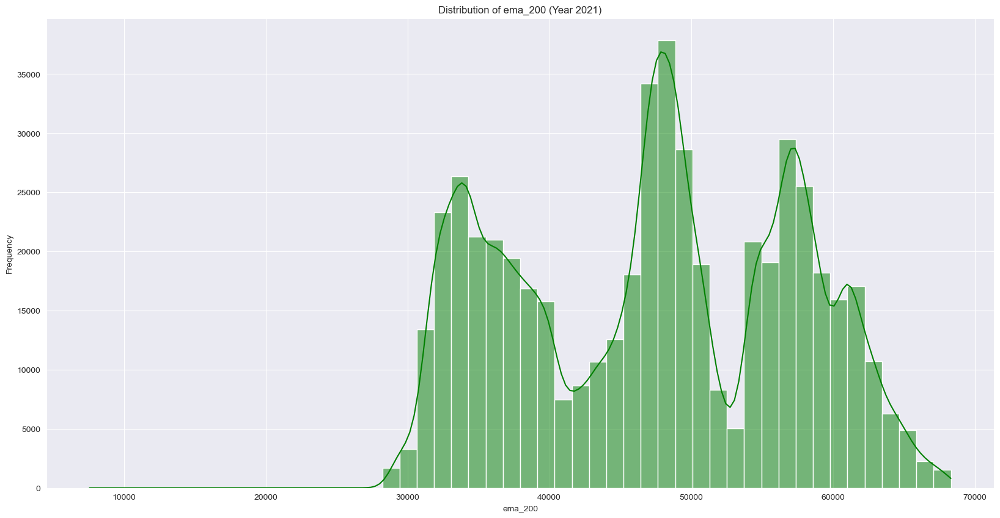


Boxplot of ema_200 (Year 2021):


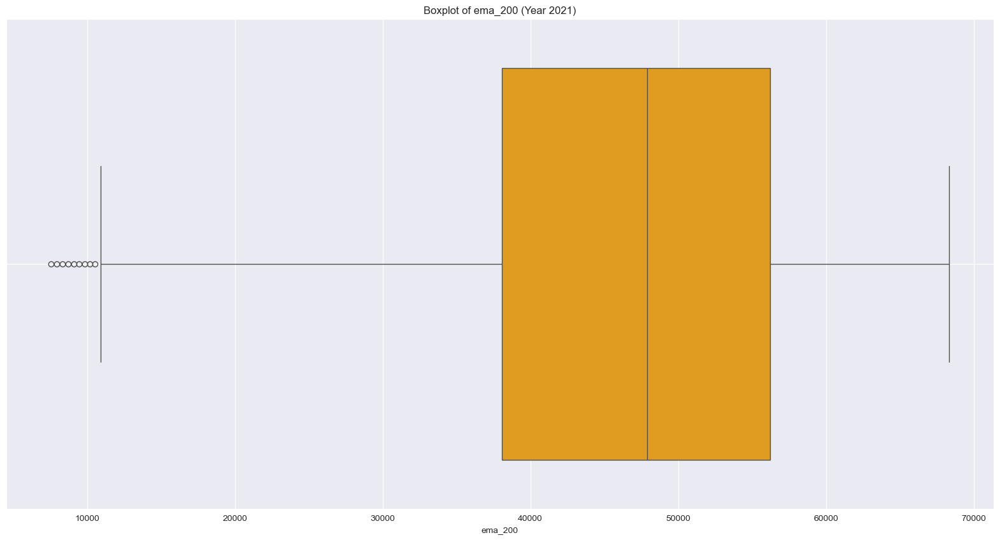


Distribution of WMA (Year 2021):


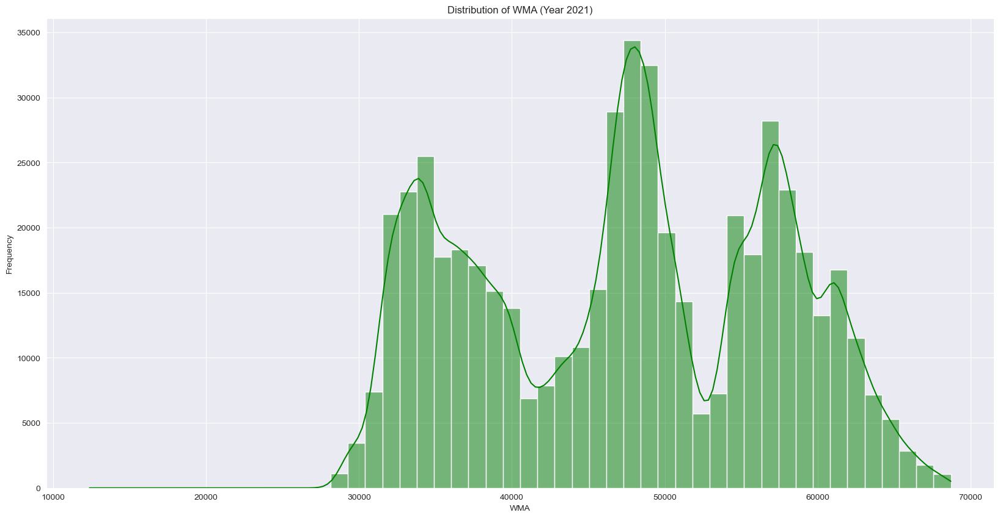


Boxplot of WMA (Year 2021):


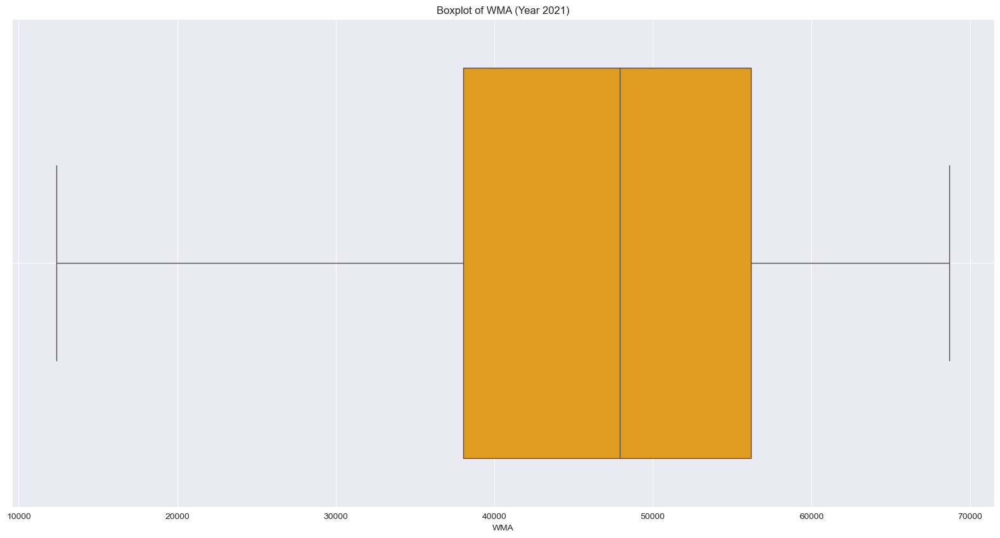


Distribution of MACD (Year 2021):


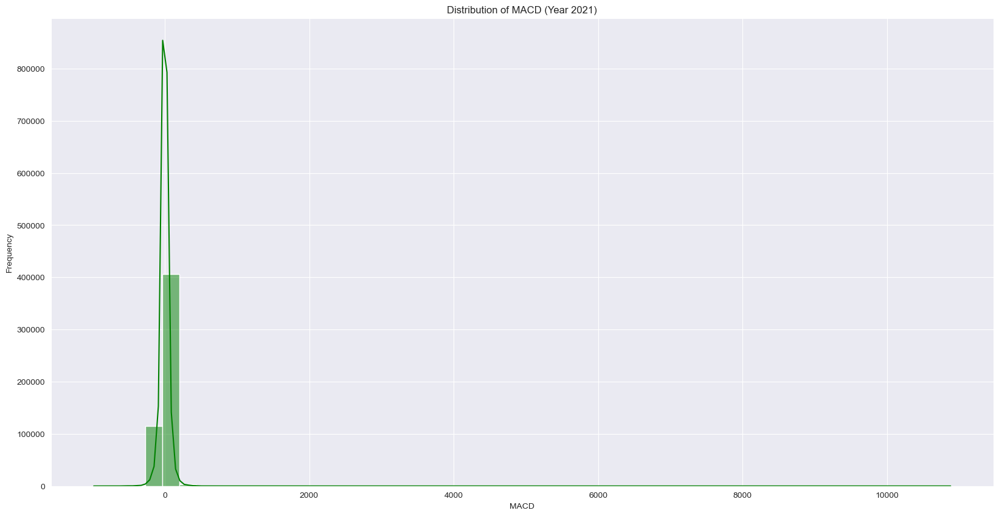


Boxplot of MACD (Year 2021):


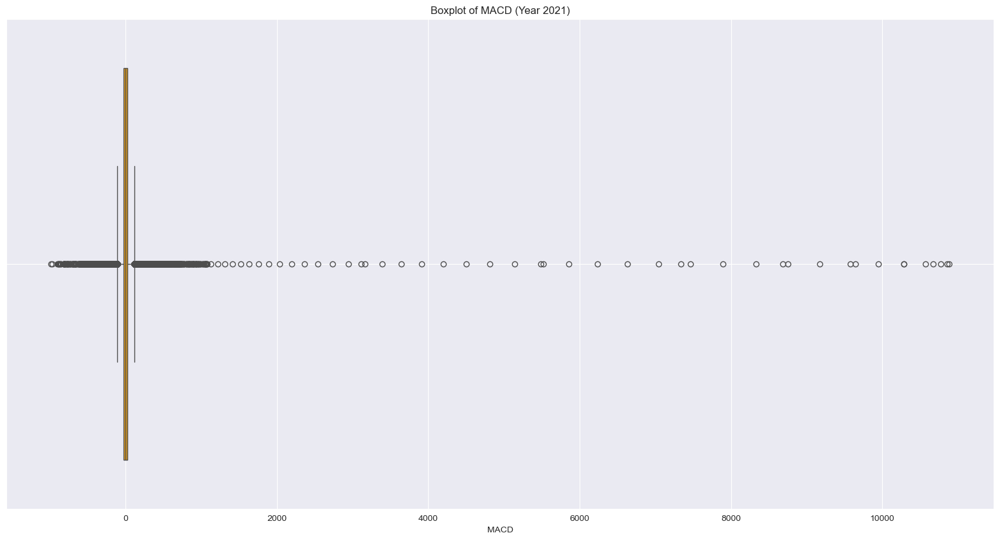


Distribution of MACD_Signal (Year 2021):


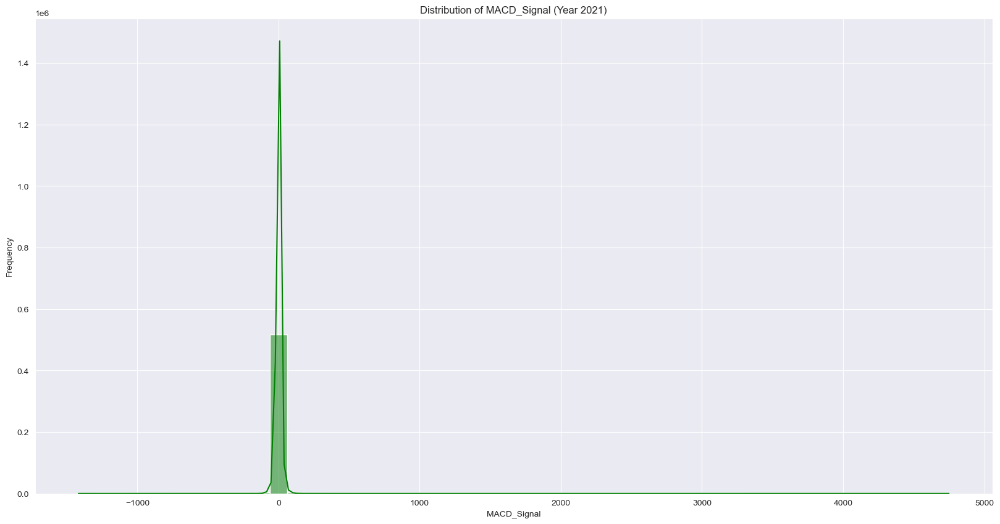


Boxplot of MACD_Signal (Year 2021):


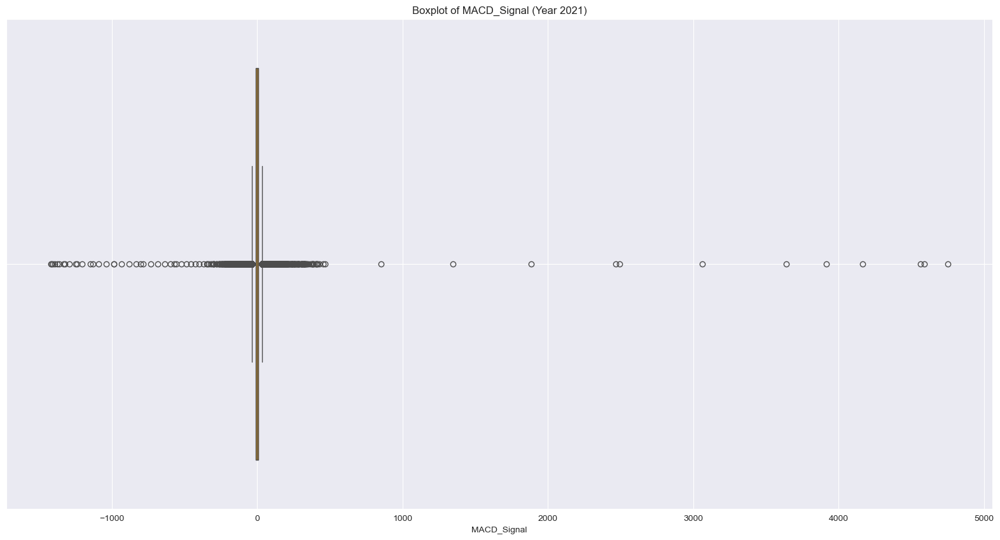


Distribution of MACD_Hist (Year 2021):


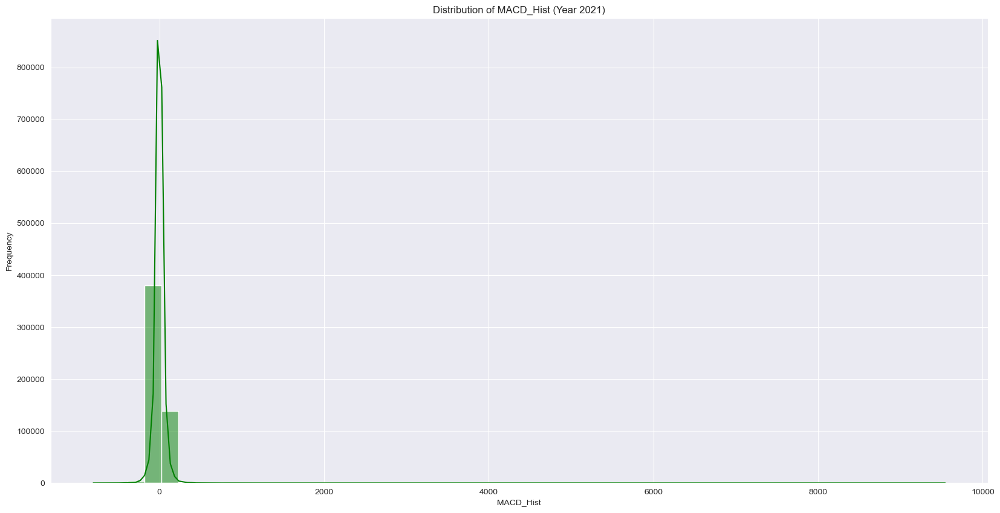


Boxplot of MACD_Hist (Year 2021):


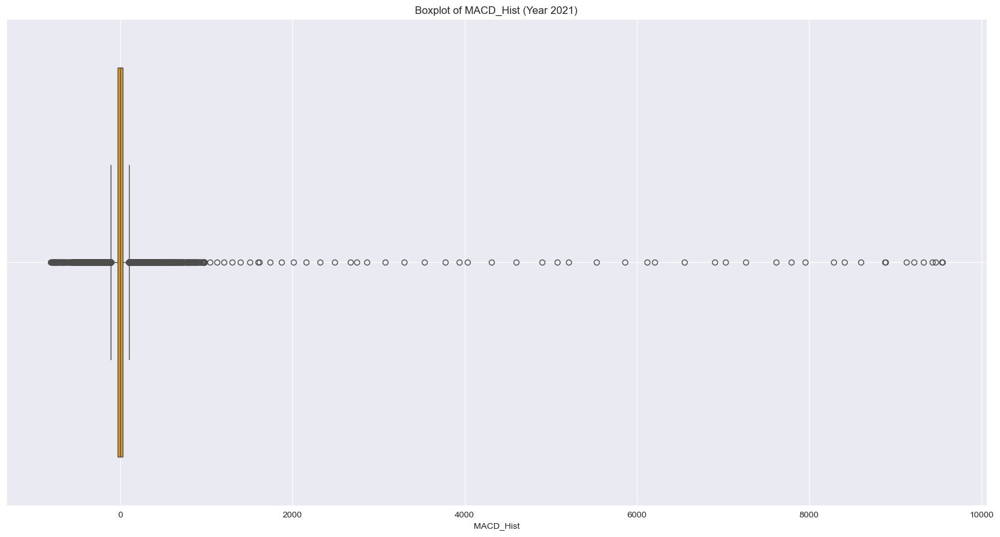


Distribution of ATR (Year 2021):


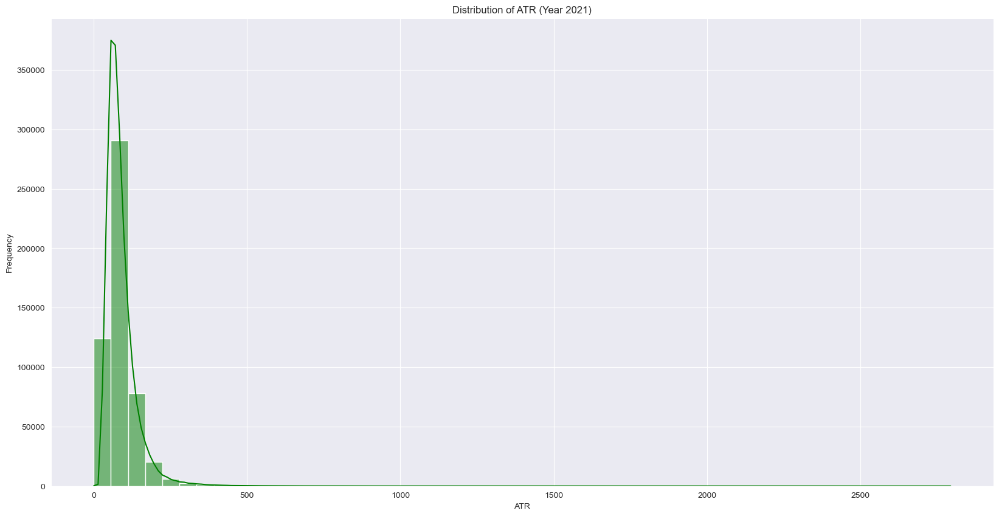


Boxplot of ATR (Year 2021):


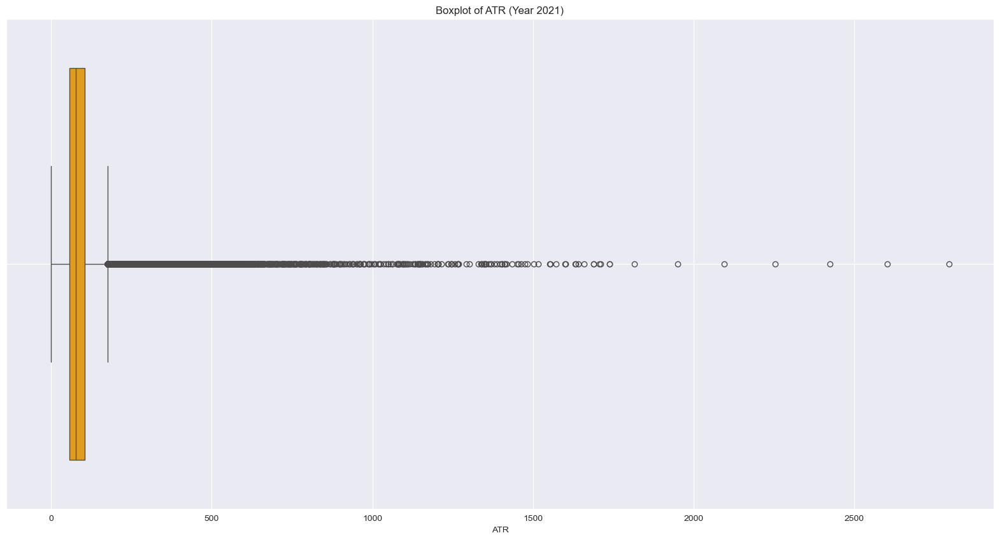


Distribution of HMA (Year 2021):


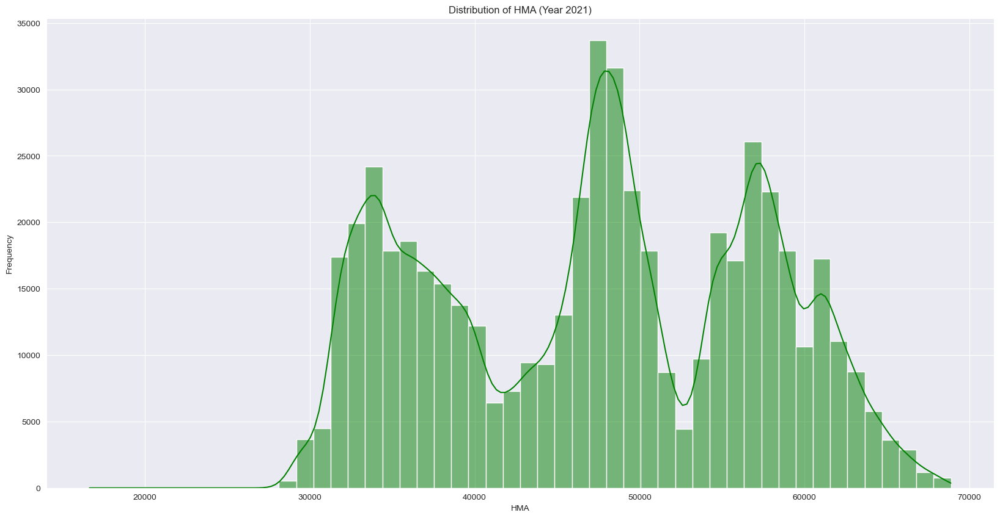


Boxplot of HMA (Year 2021):


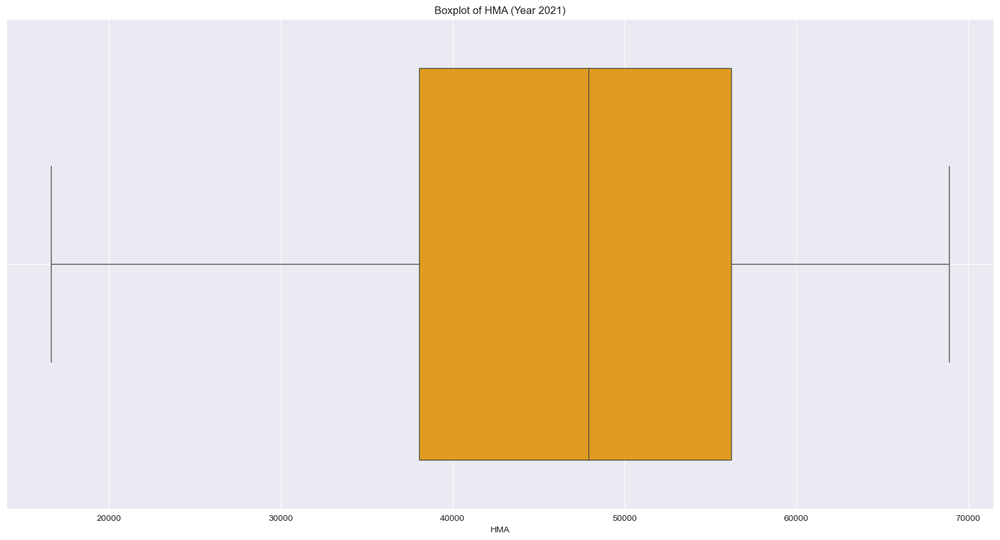


Distribution of KAMA (Year 2021):


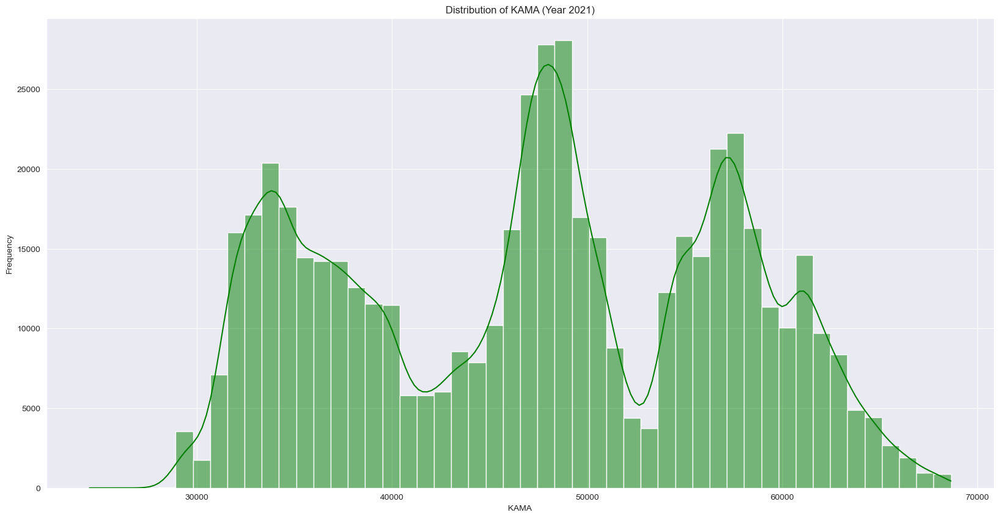


Boxplot of KAMA (Year 2021):


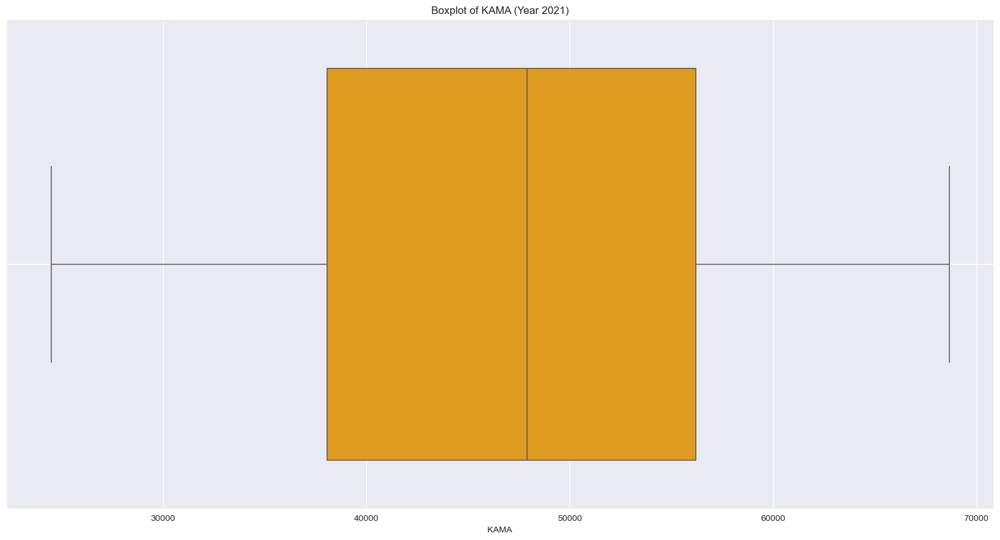


Distribution of CMO (Year 2021):


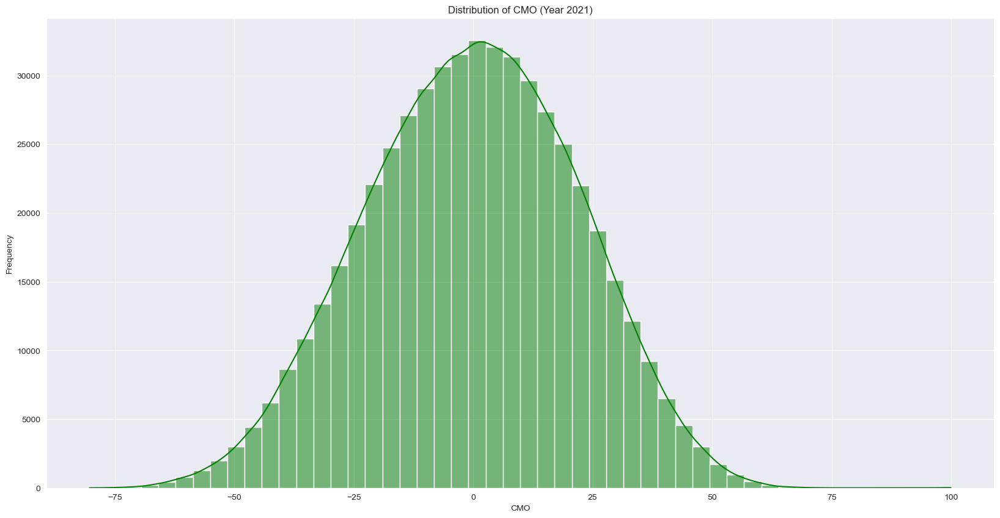


Boxplot of CMO (Year 2021):


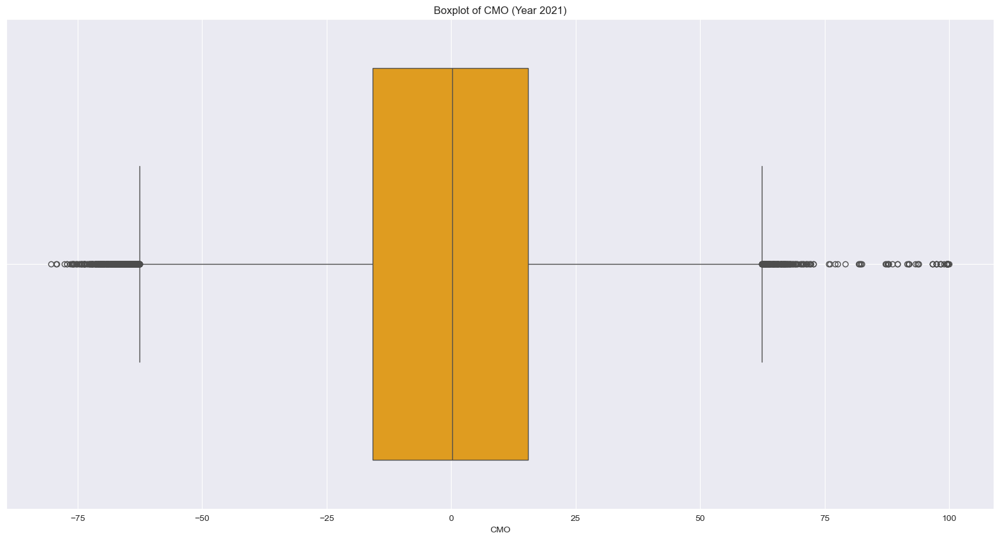


Distribution of Z-Score (Year 2021):


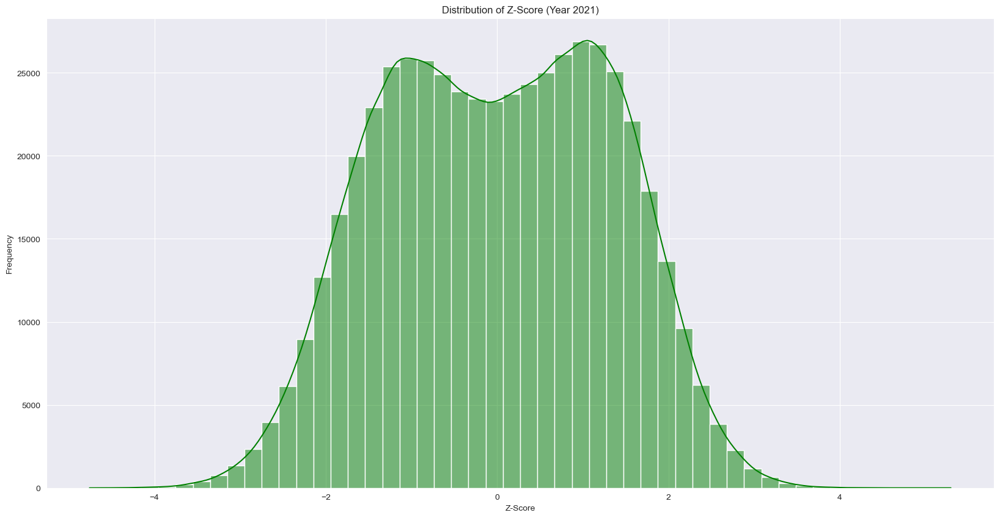


Boxplot of Z-Score (Year 2021):


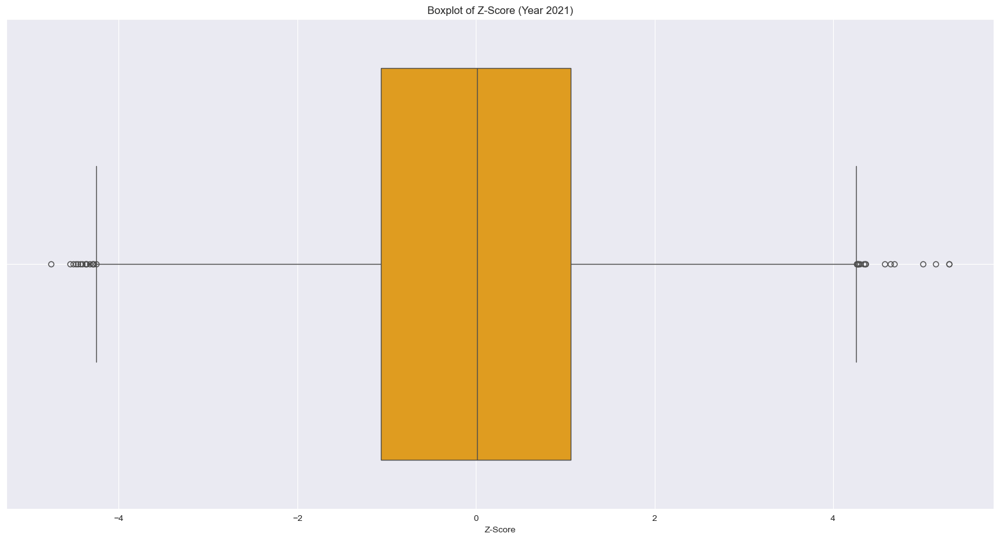


Distribution of QStick (Year 2021):


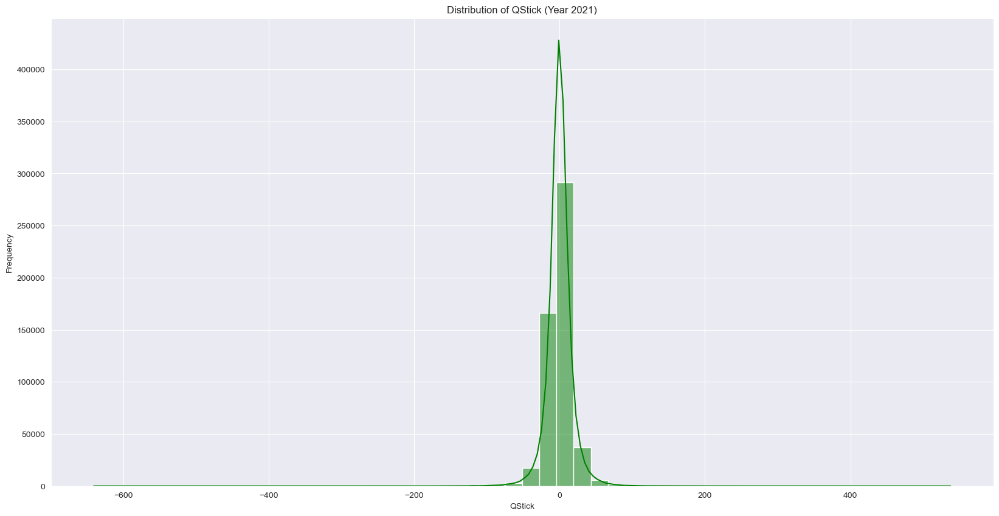


Boxplot of QStick (Year 2021):


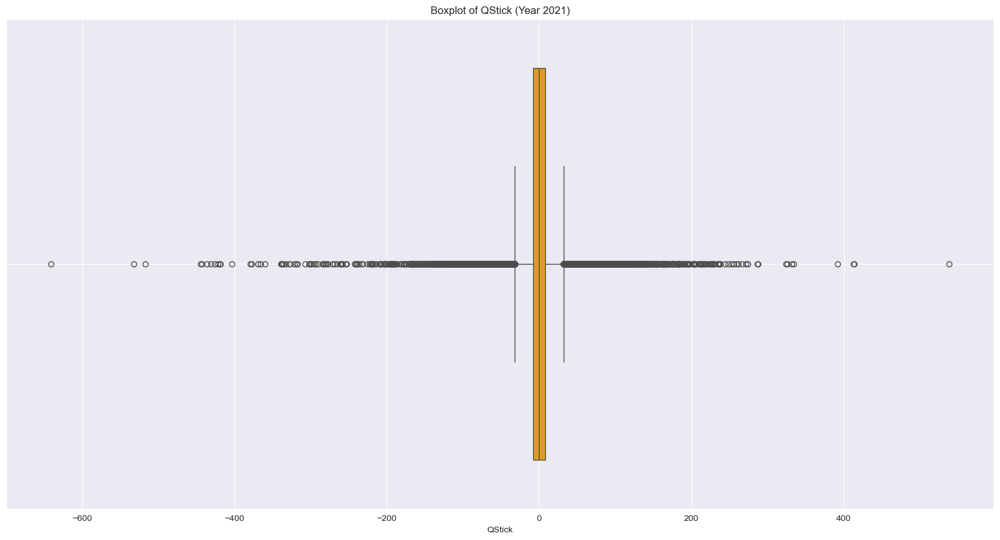


Distribution of year (Year 2021):


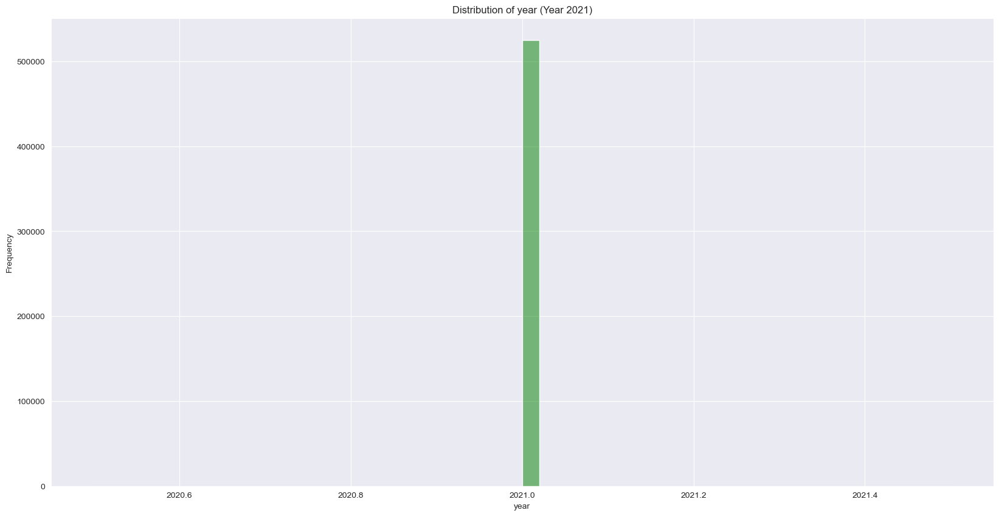


Boxplot of year (Year 2021):


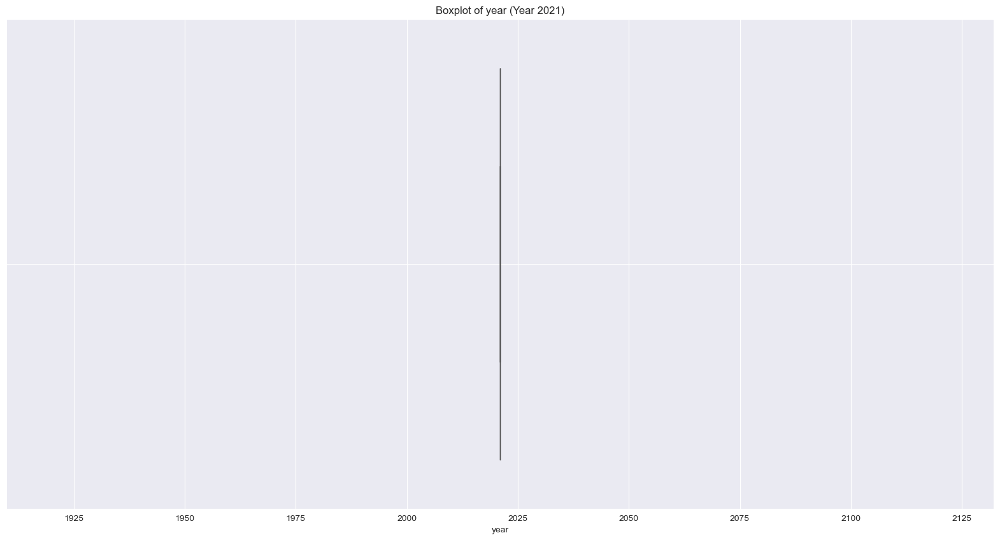


Distribution of day_of_week (Year 2021):


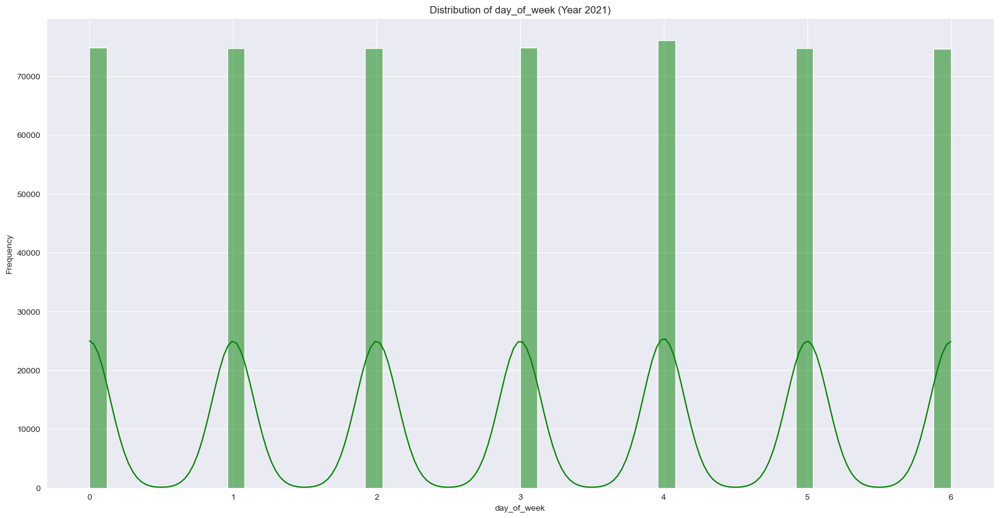


Boxplot of day_of_week (Year 2021):


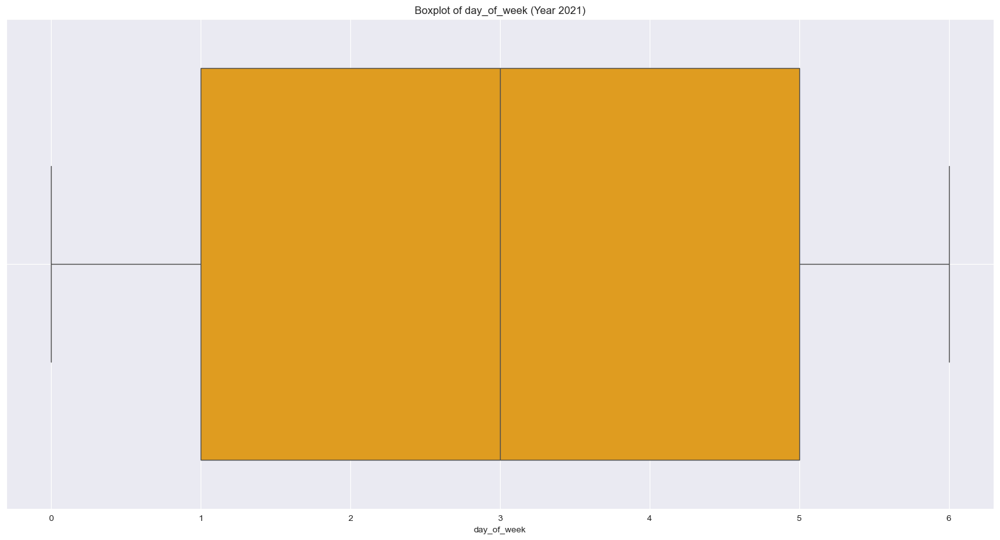


Distribution of month (Year 2021):


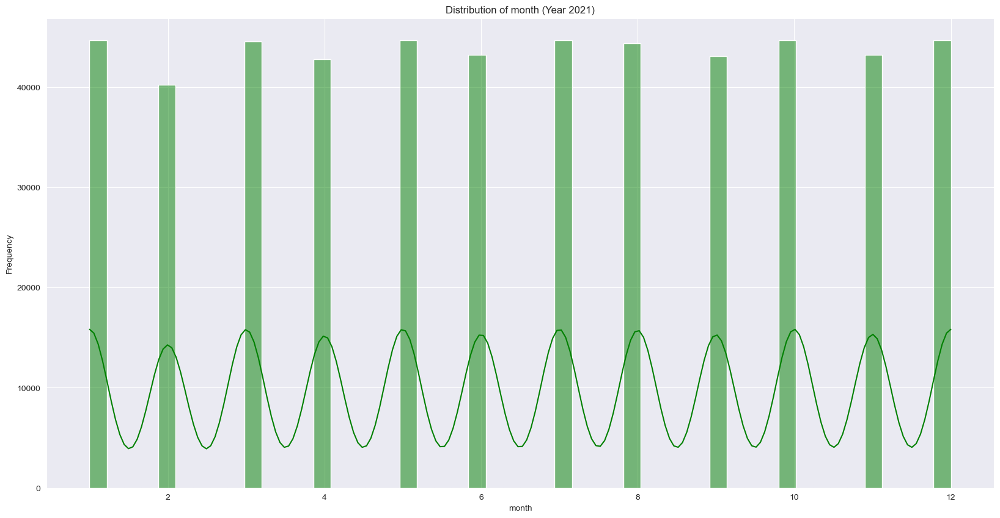


Boxplot of month (Year 2021):


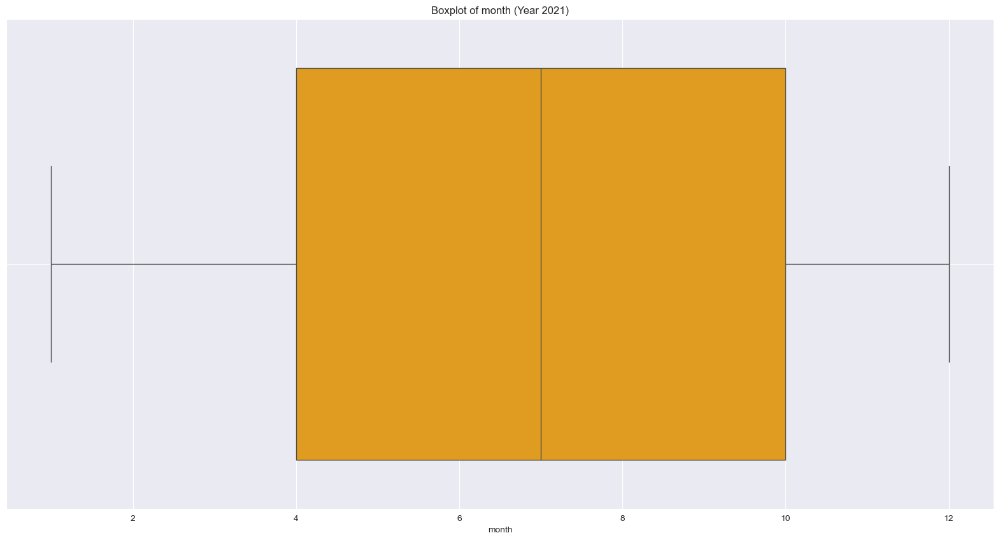


Distribution of week_of_year (Year 2021):


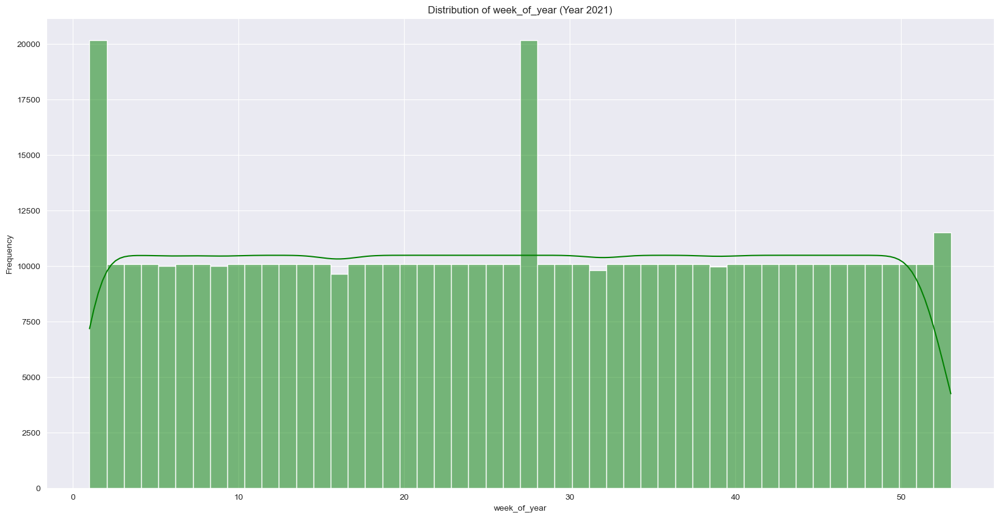


Boxplot of week_of_year (Year 2021):


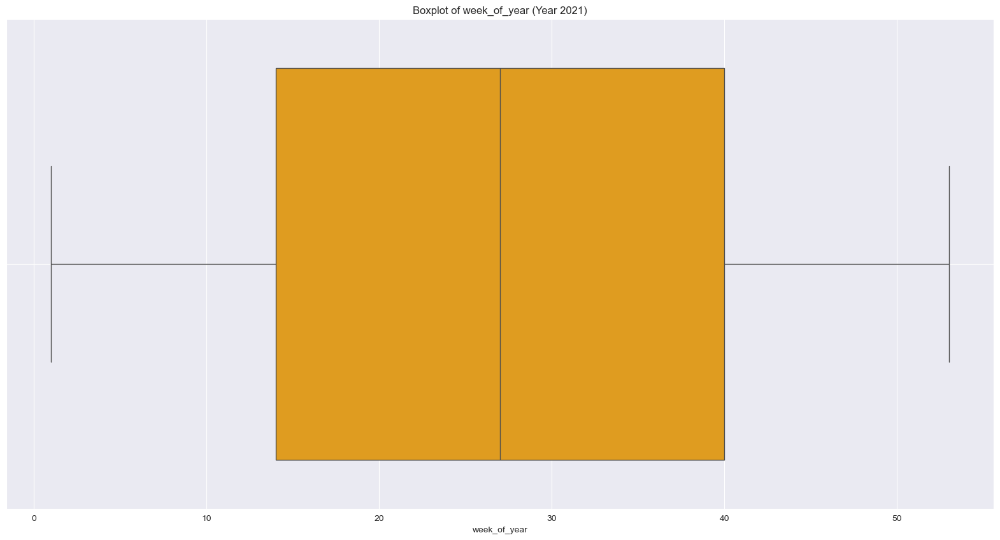


Distribution of time_delta (Year 2021):


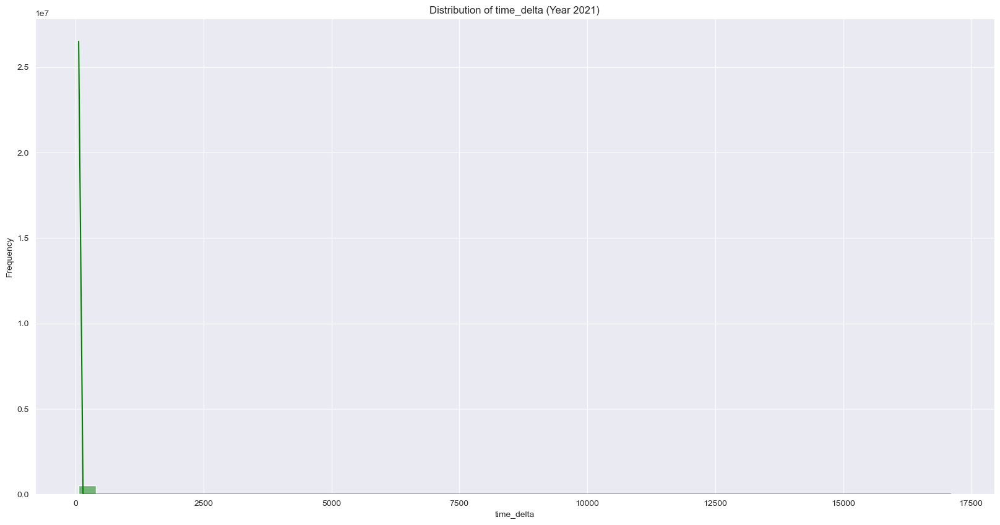


Boxplot of time_delta (Year 2021):


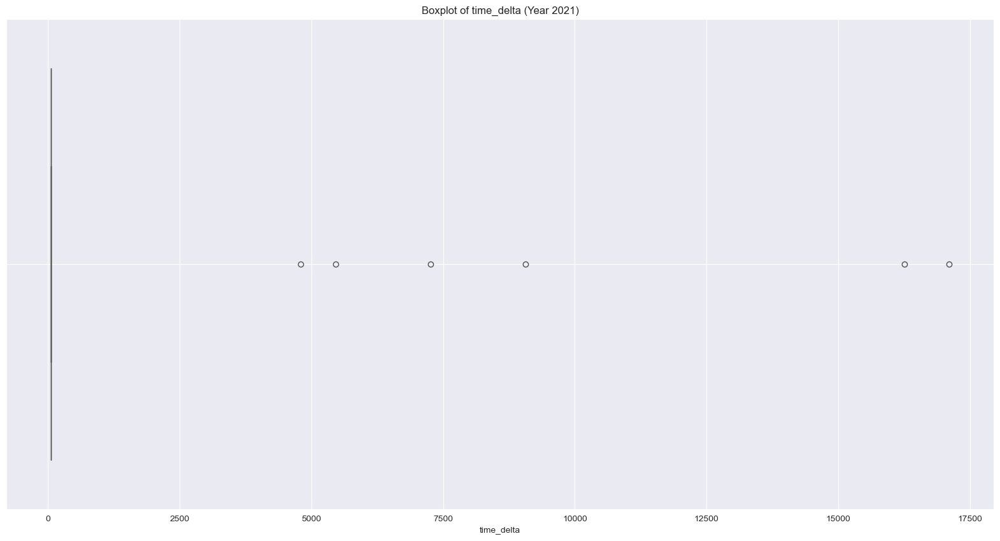


Distribution of open (Year 2022):


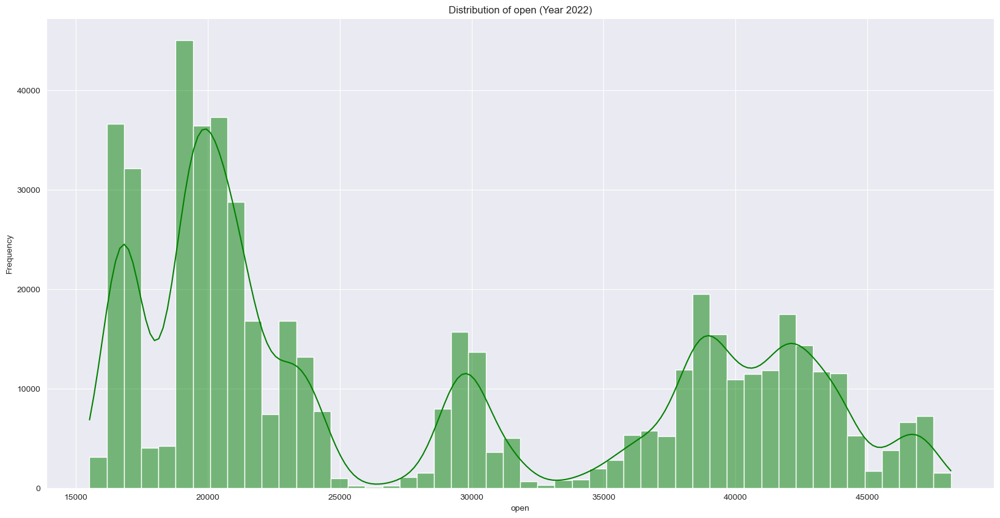


Boxplot of open (Year 2022):


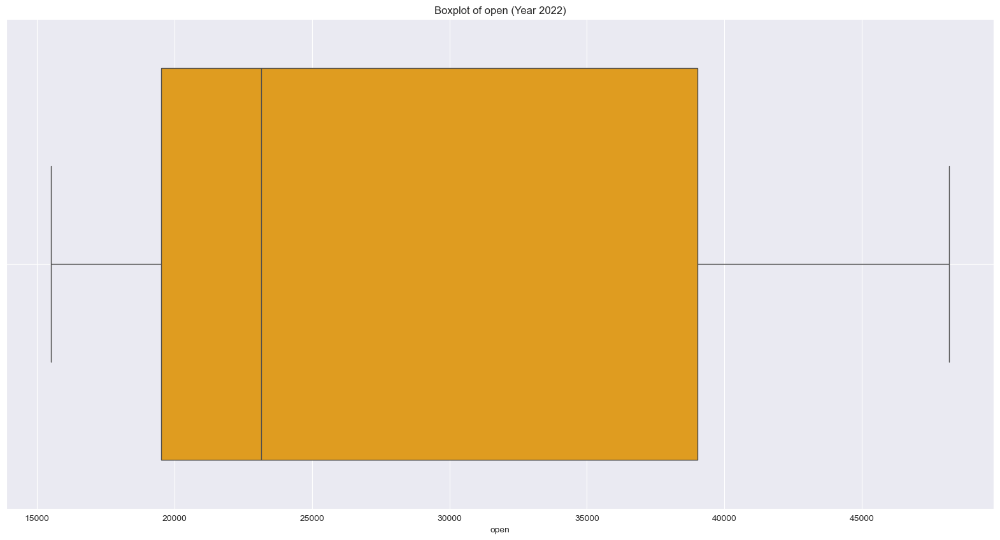


Distribution of high (Year 2022):


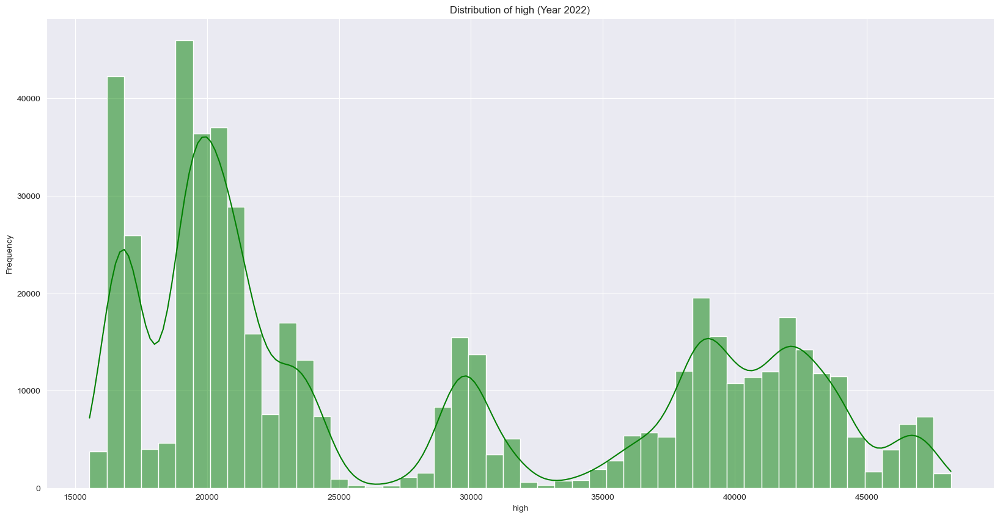


Boxplot of high (Year 2022):


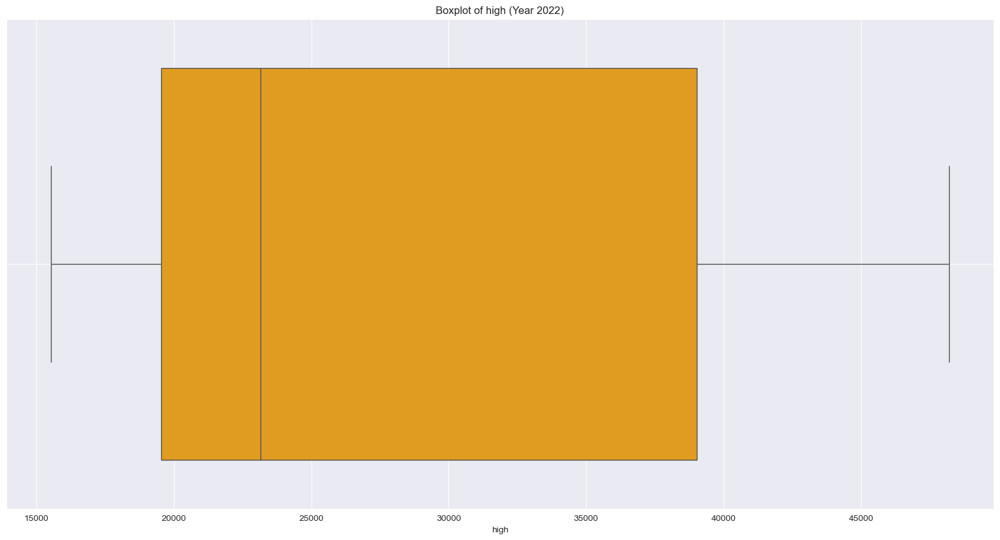


Distribution of low (Year 2022):


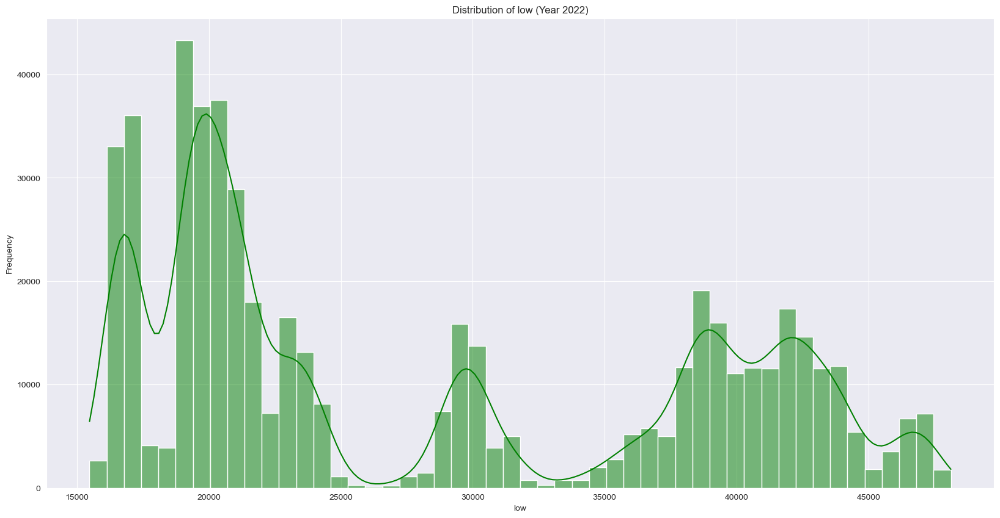


Boxplot of low (Year 2022):


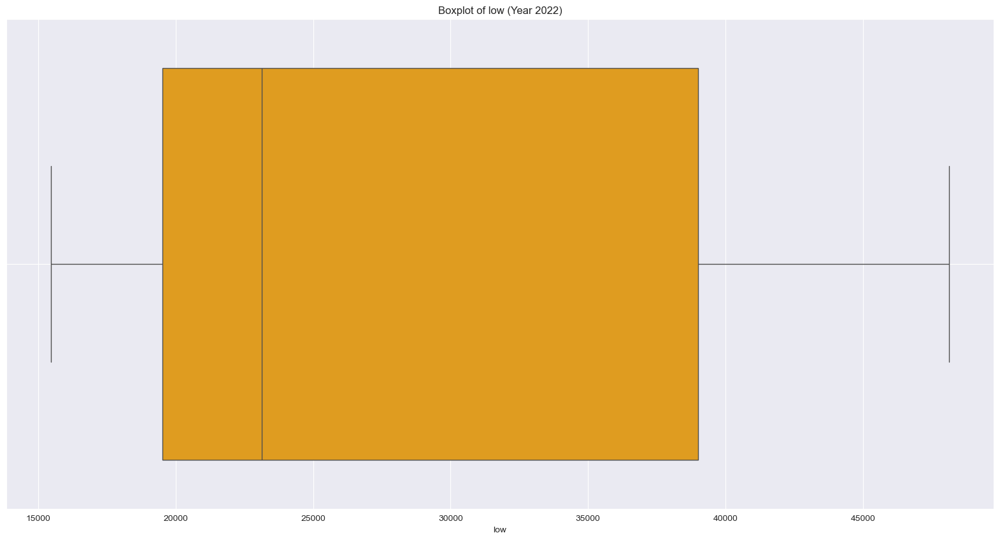


Distribution of close (Year 2022):


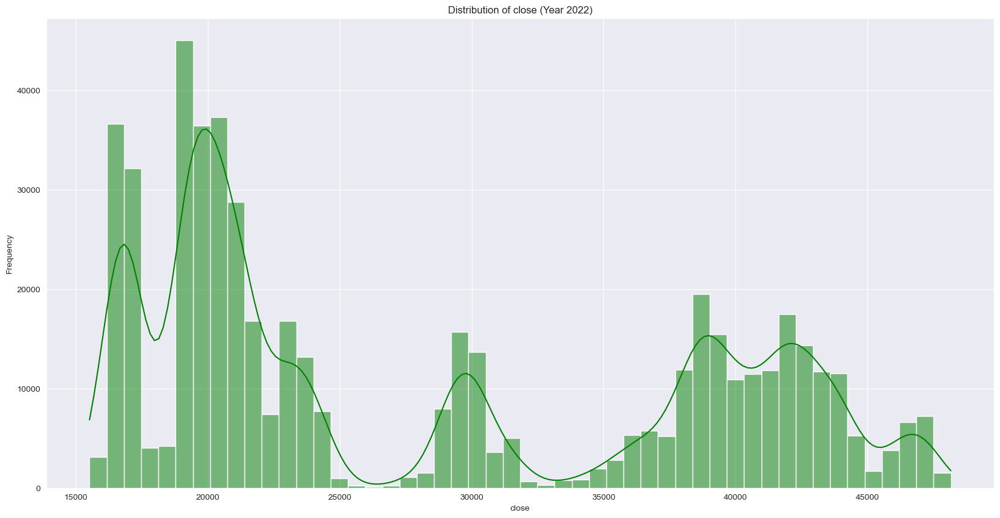


Boxplot of close (Year 2022):


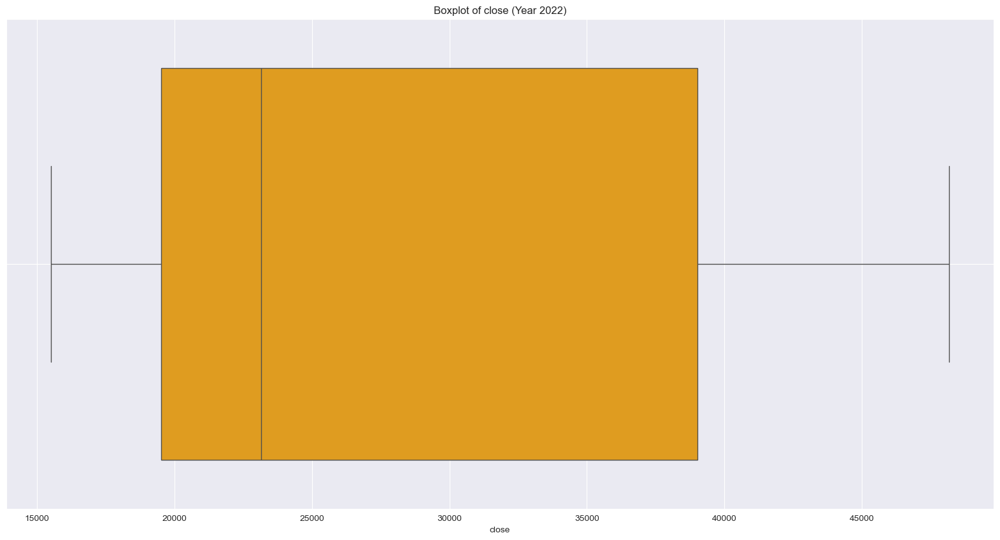


Distribution of Volume USDT (Year 2022):


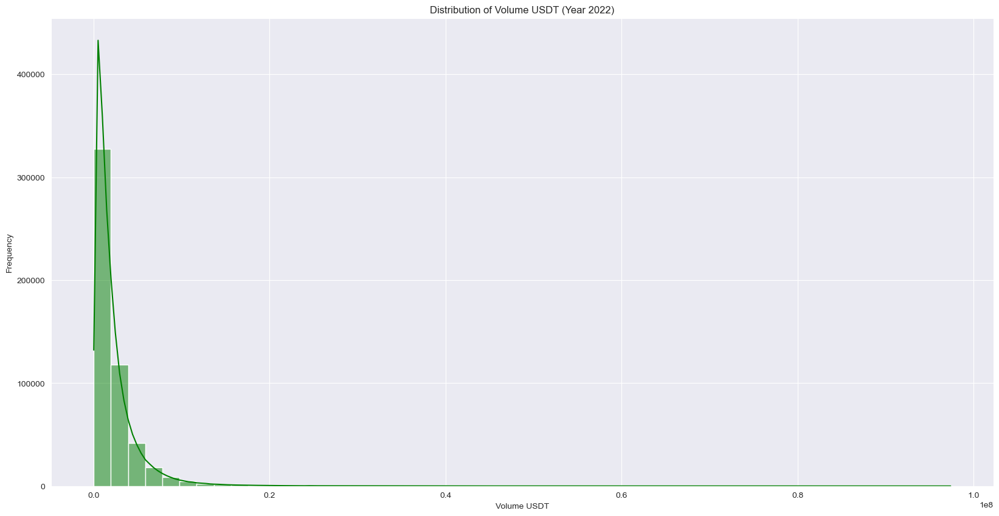


Boxplot of Volume USDT (Year 2022):


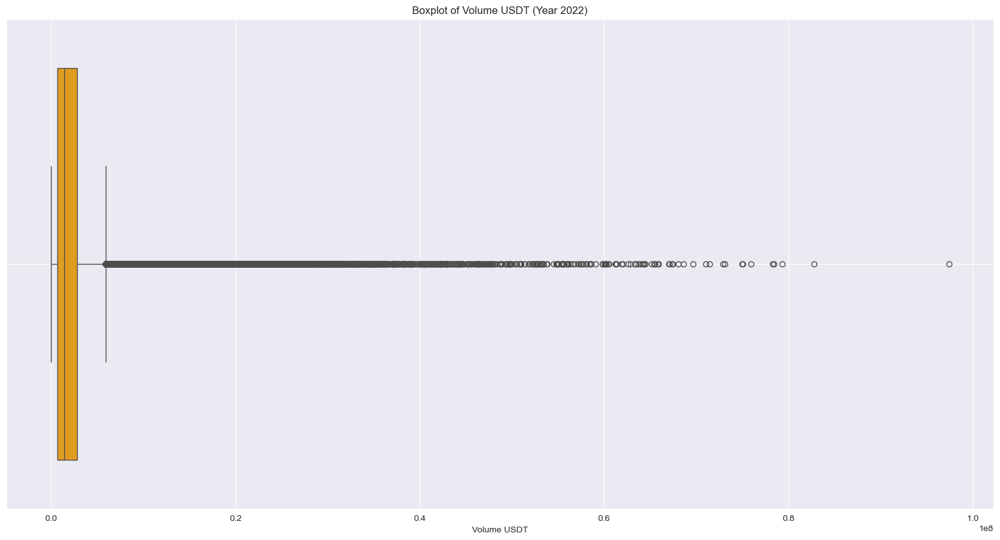


Distribution of tradecount (Year 2022):


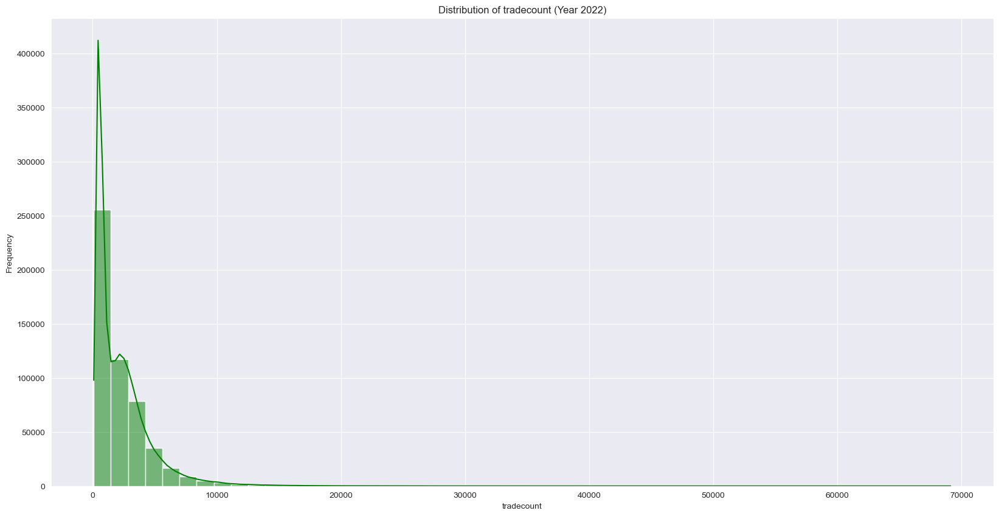


Boxplot of tradecount (Year 2022):


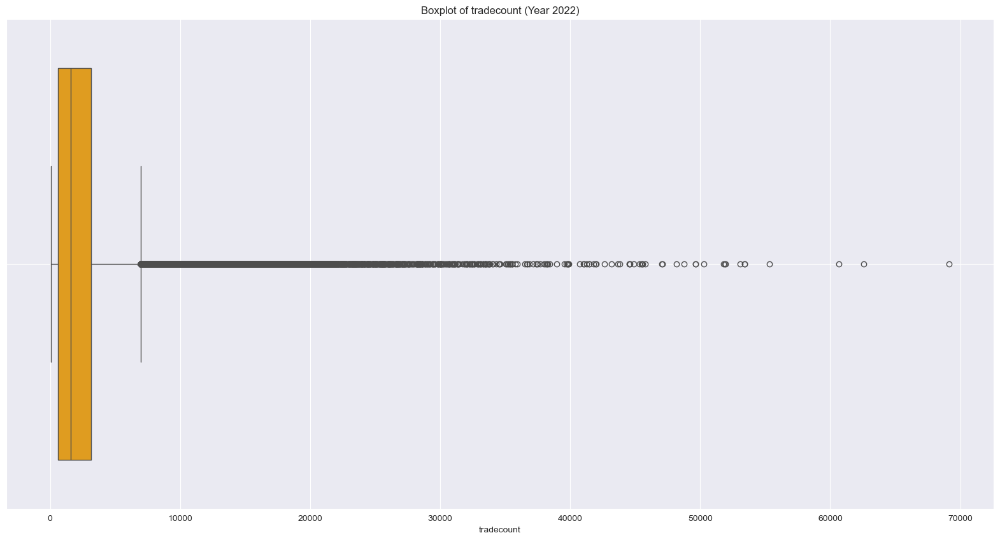


Distribution of hour (Year 2022):


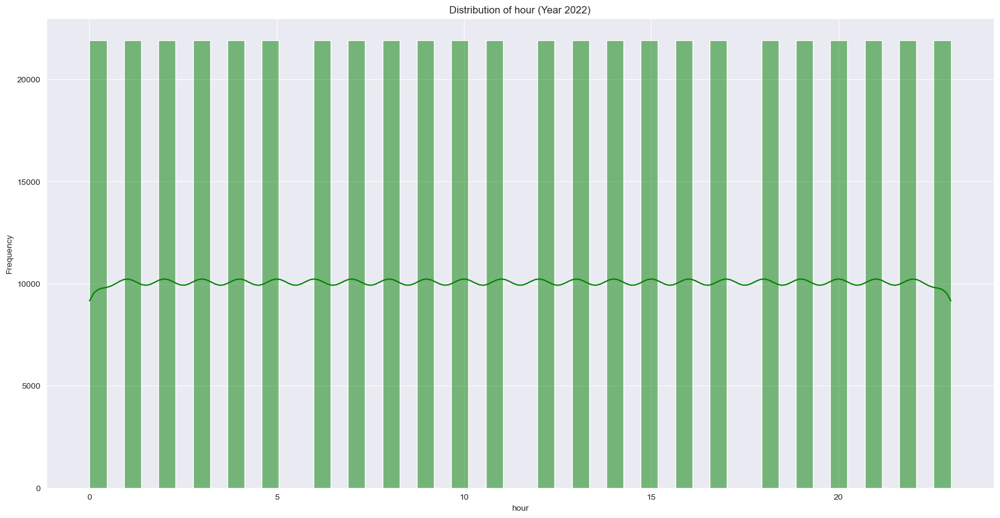


Boxplot of hour (Year 2022):


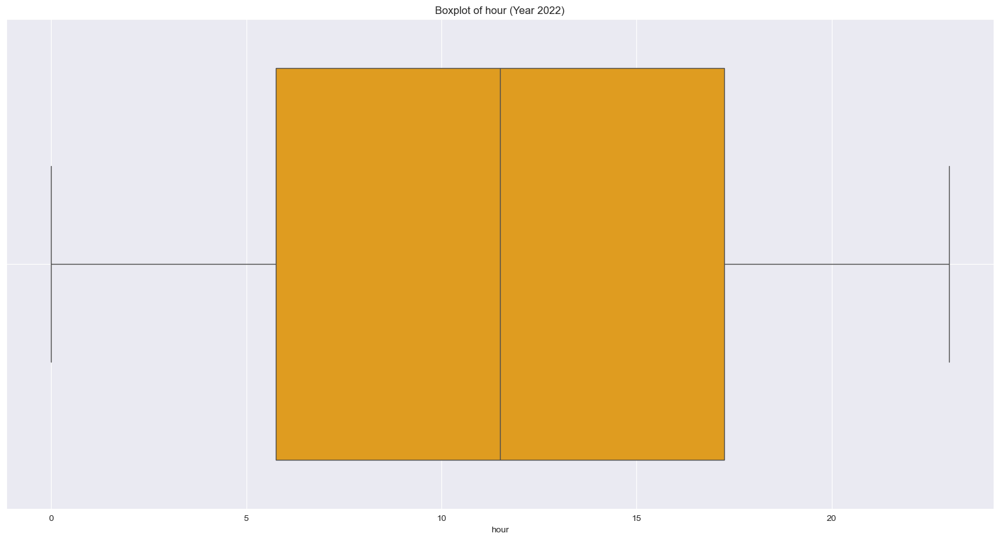


Distribution of ema_5 (Year 2022):


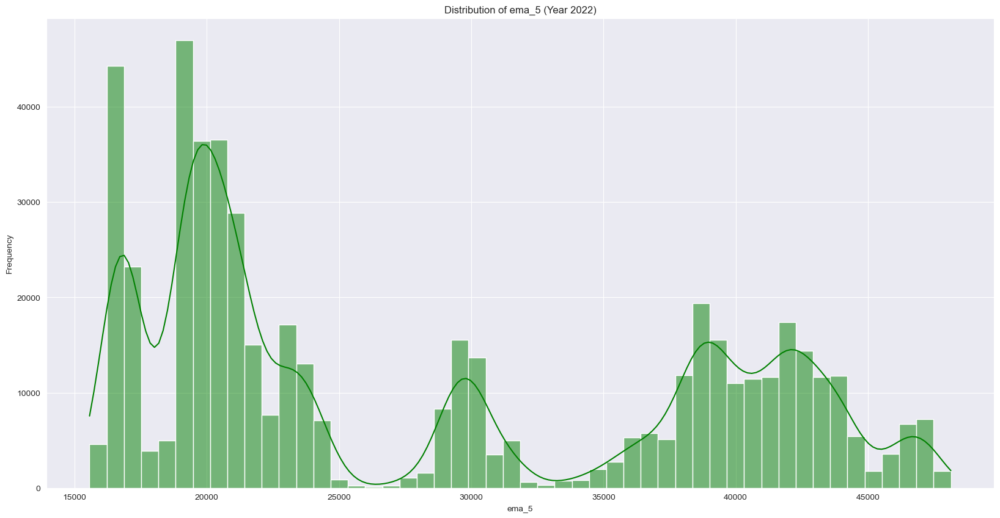


Boxplot of ema_5 (Year 2022):


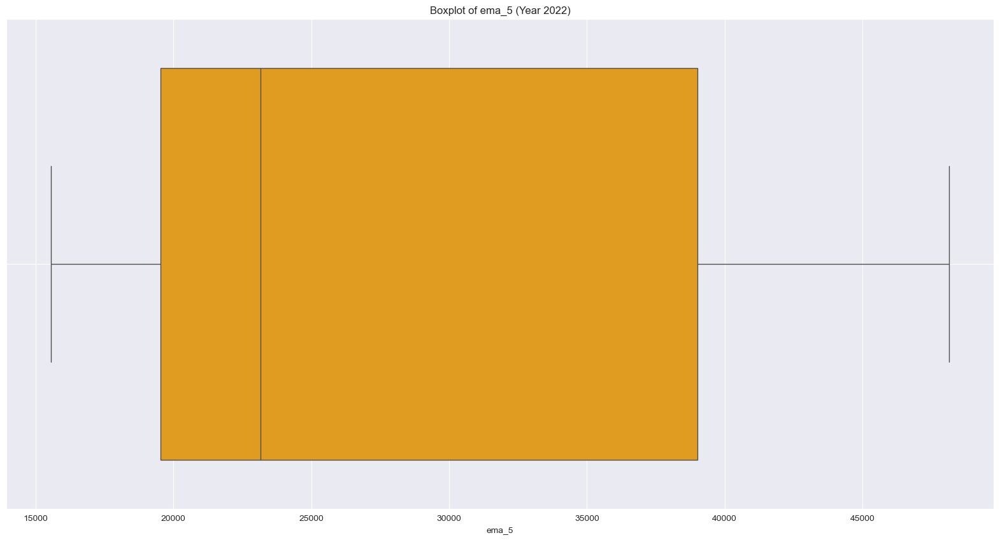


Distribution of ema_15 (Year 2022):


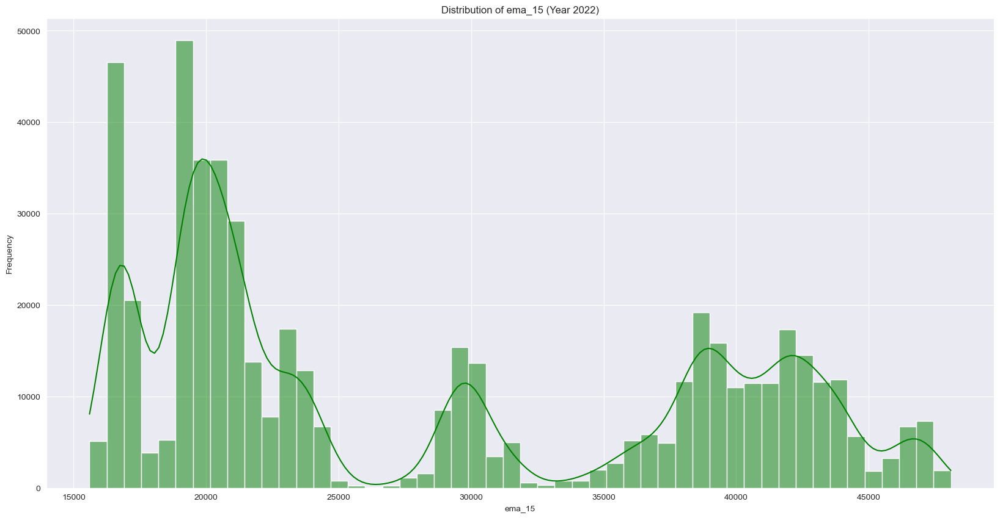


Boxplot of ema_15 (Year 2022):


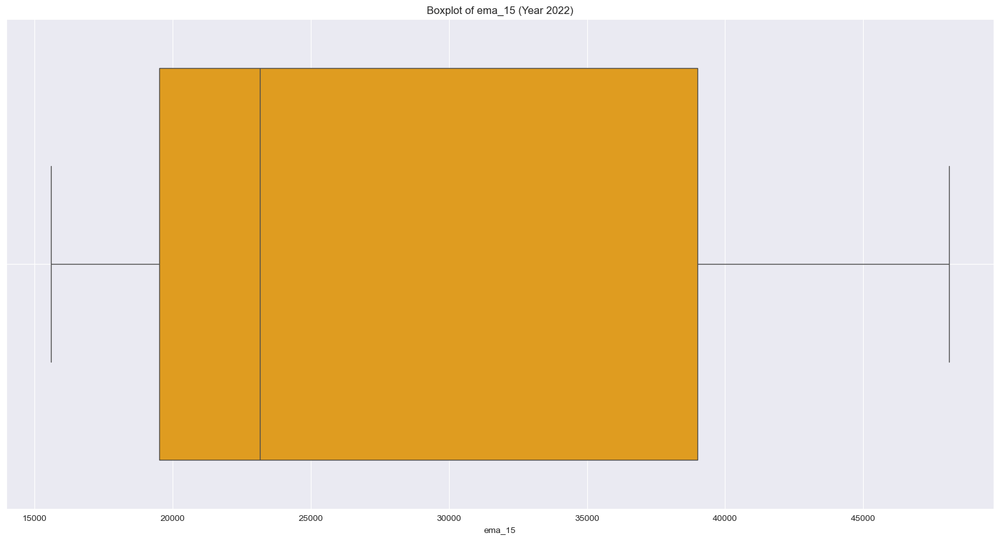


Distribution of ema_30 (Year 2022):


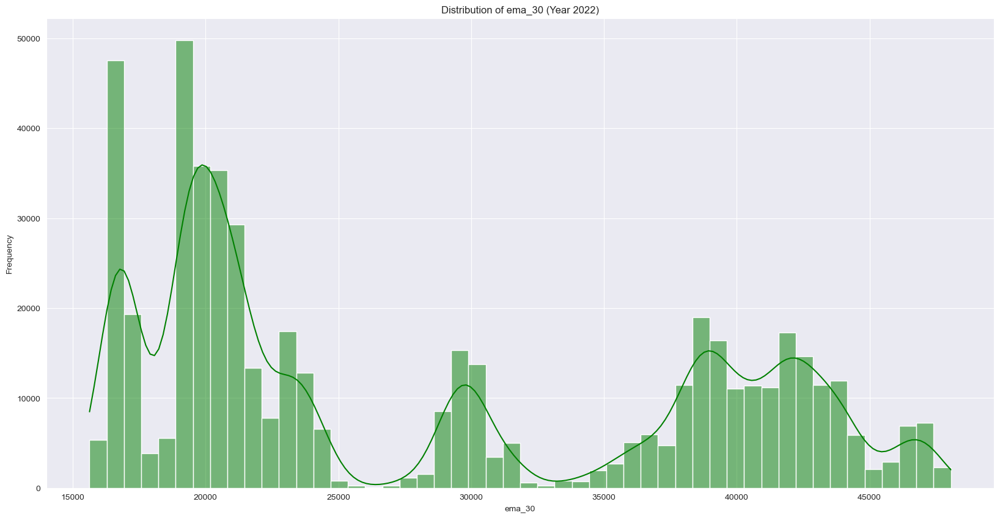


Boxplot of ema_30 (Year 2022):


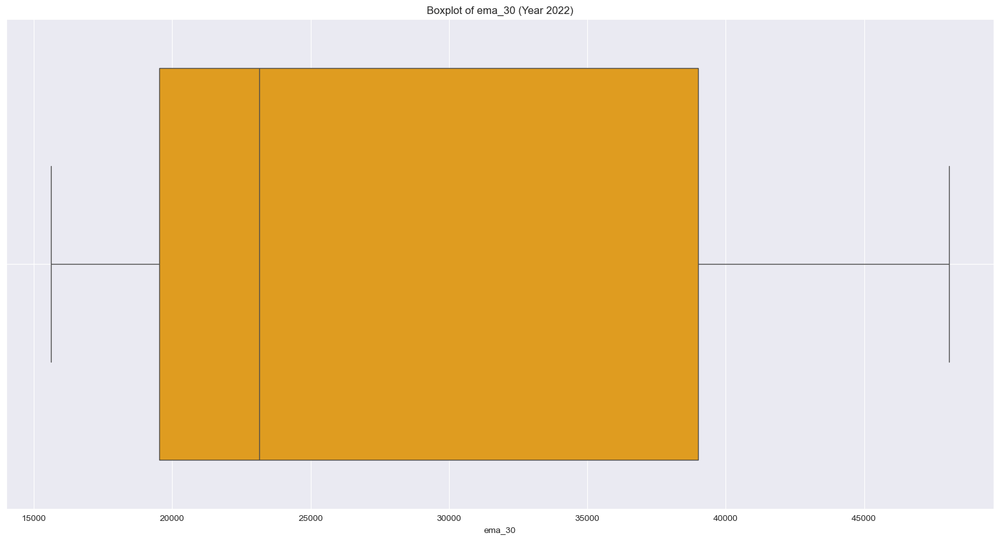


Distribution of ema_60 (Year 2022):


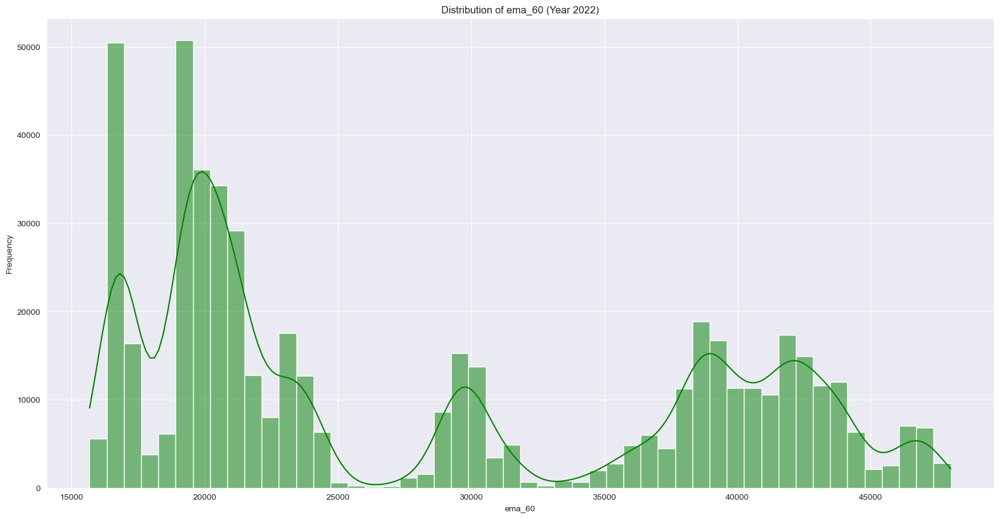


Boxplot of ema_60 (Year 2022):


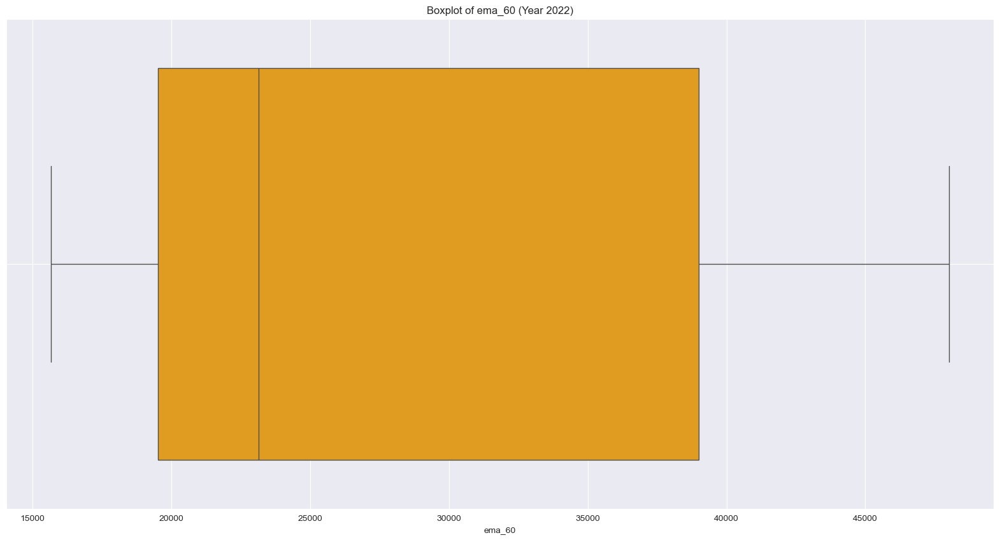


Distribution of ema_100 (Year 2022):


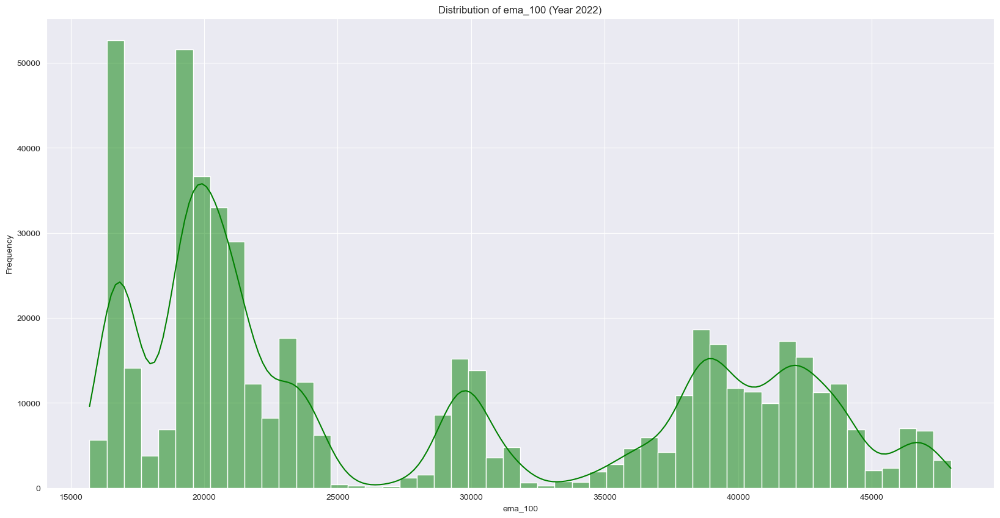


Boxplot of ema_100 (Year 2022):


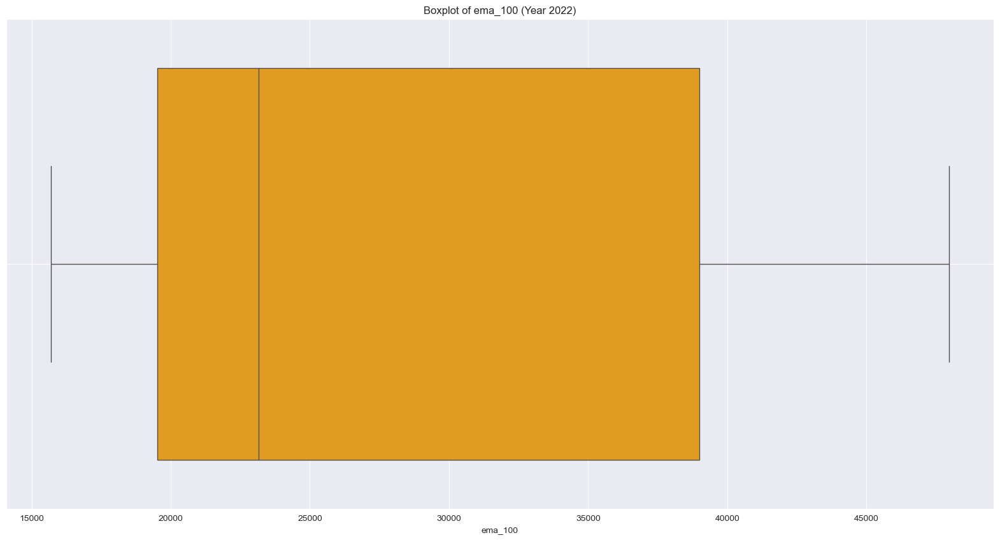


Distribution of ema_200 (Year 2022):


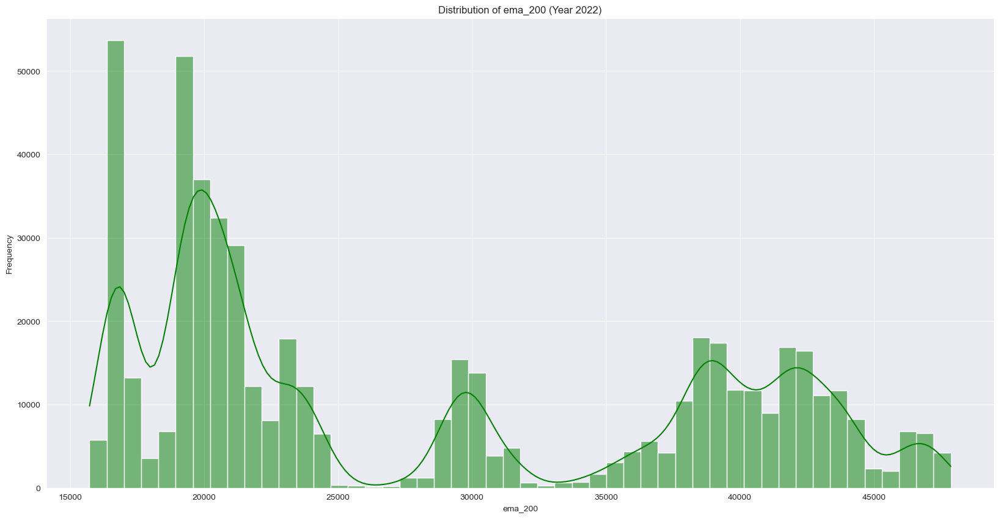


Boxplot of ema_200 (Year 2022):


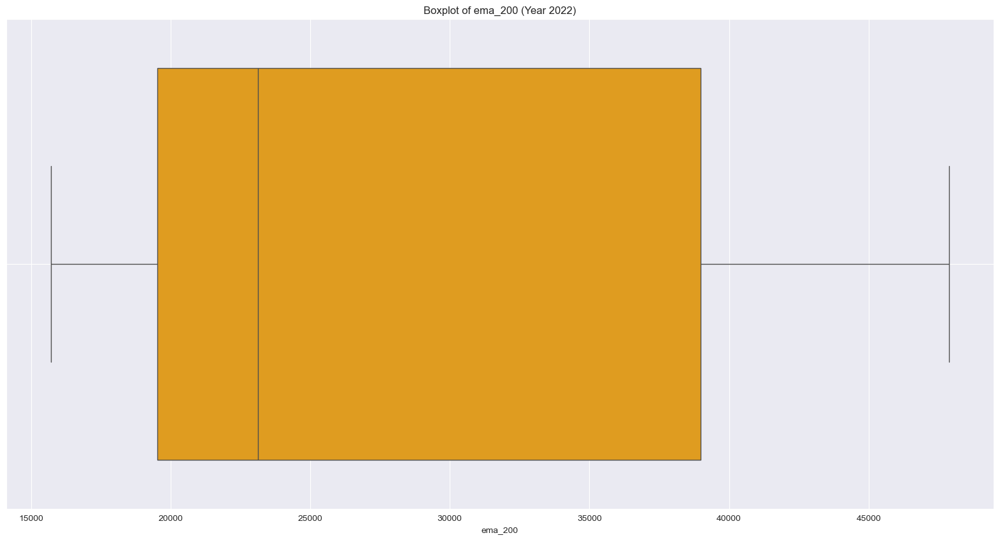


Distribution of WMA (Year 2022):


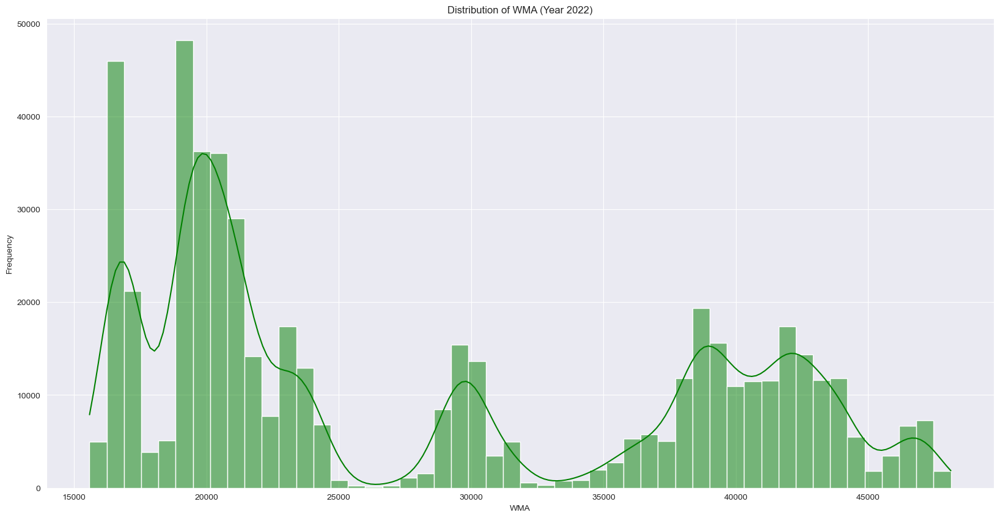


Boxplot of WMA (Year 2022):


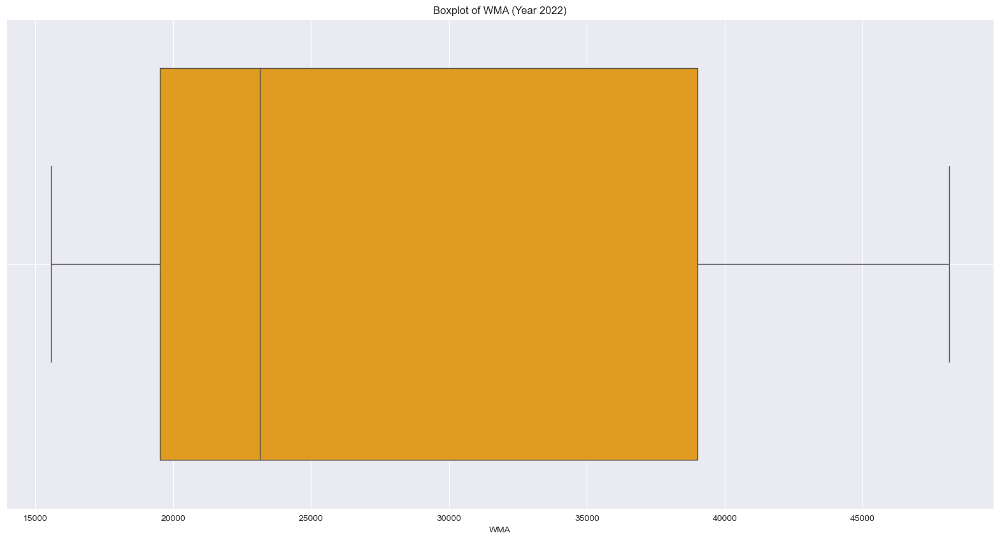


Distribution of MACD (Year 2022):


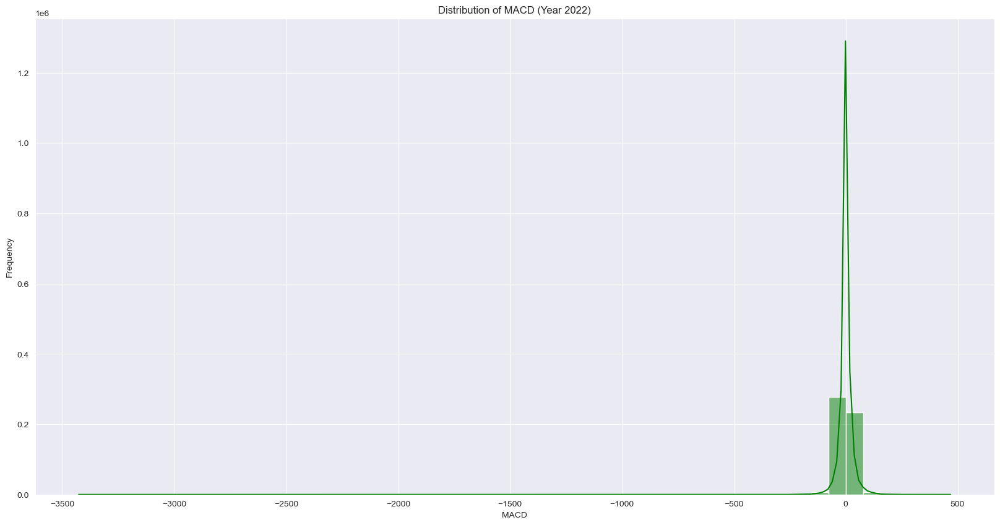


Boxplot of MACD (Year 2022):


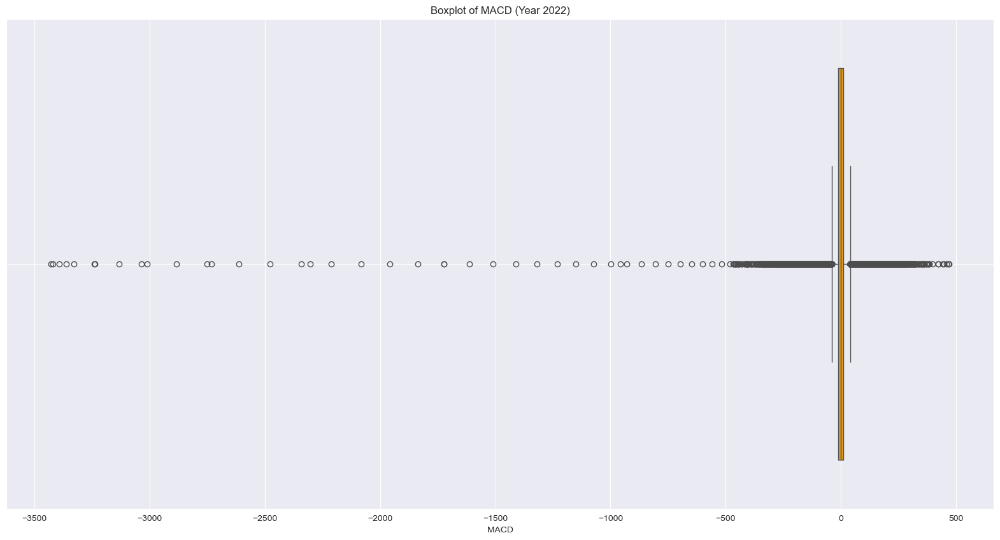


Distribution of MACD_Signal (Year 2022):


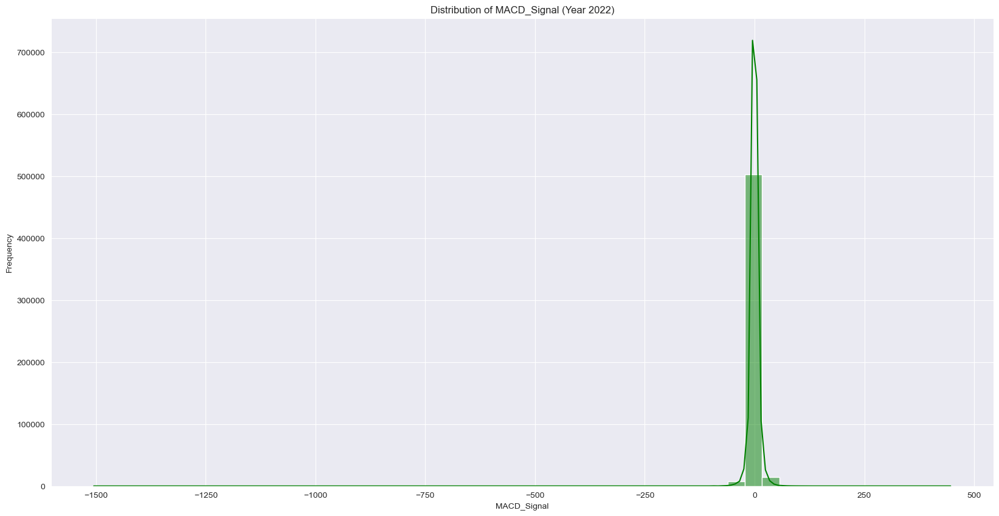


Boxplot of MACD_Signal (Year 2022):


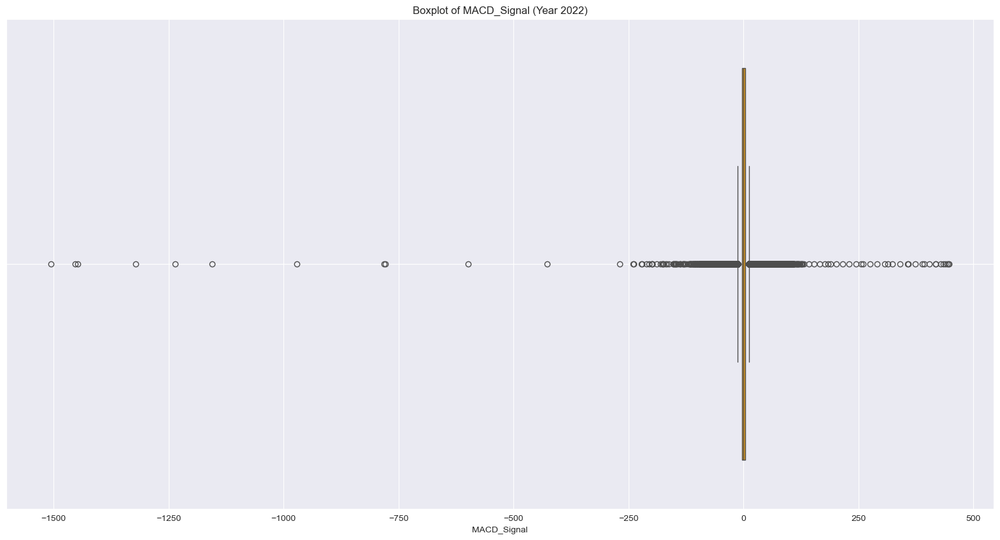


Distribution of MACD_Hist (Year 2022):


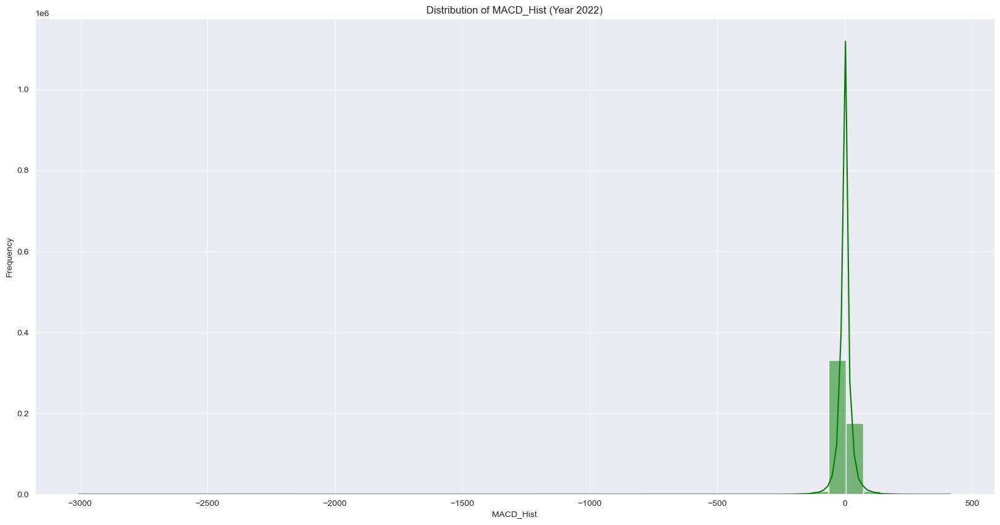


Boxplot of MACD_Hist (Year 2022):


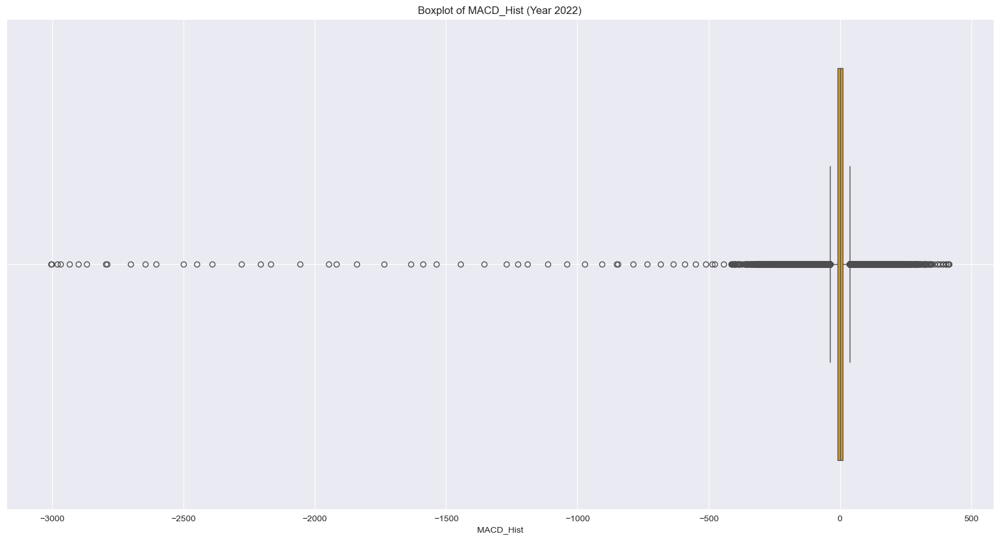


Distribution of ATR (Year 2022):


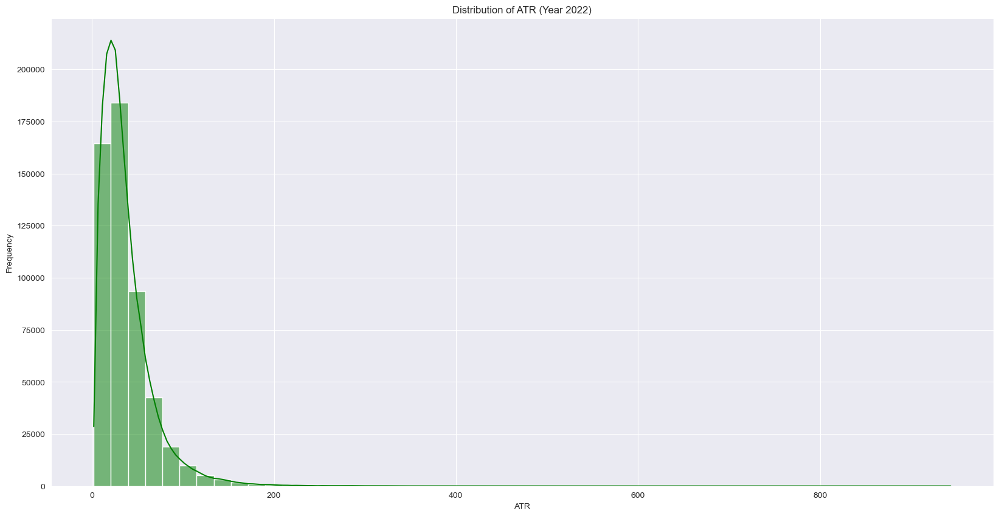


Boxplot of ATR (Year 2022):


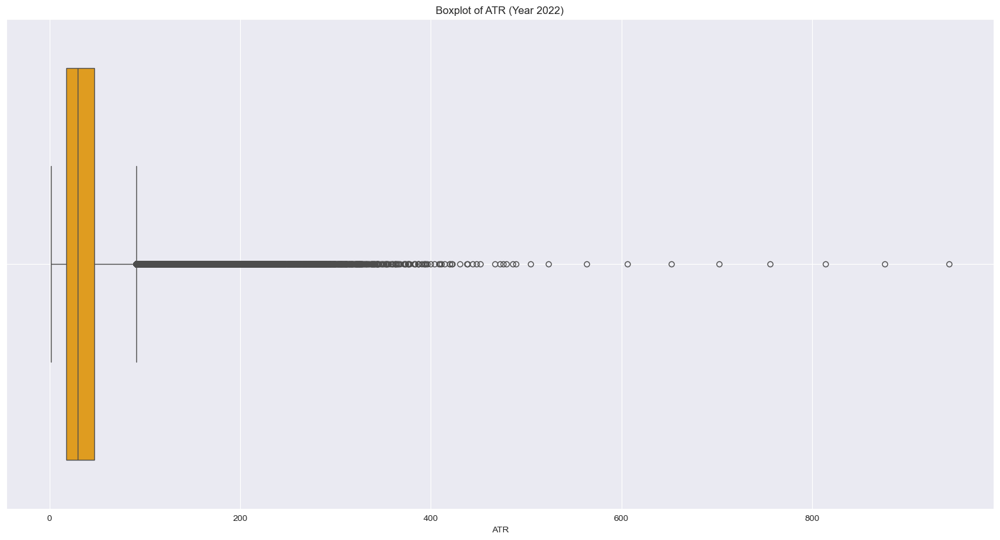


Distribution of HMA (Year 2022):


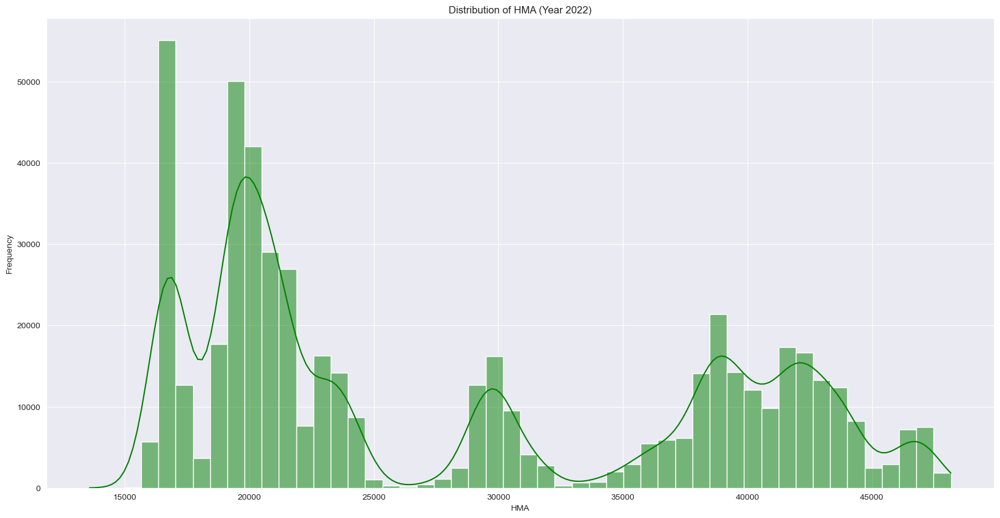


Boxplot of HMA (Year 2022):


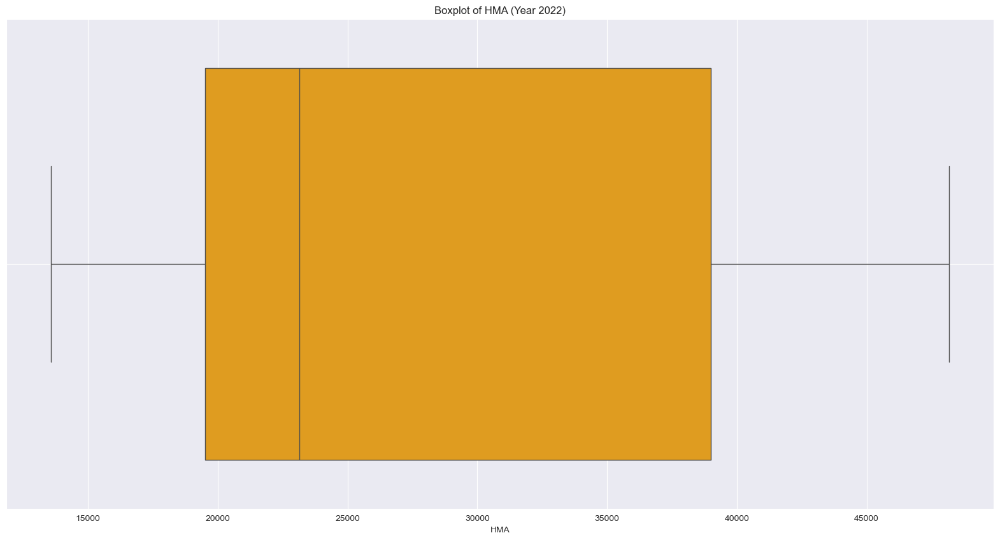


Distribution of KAMA (Year 2022):


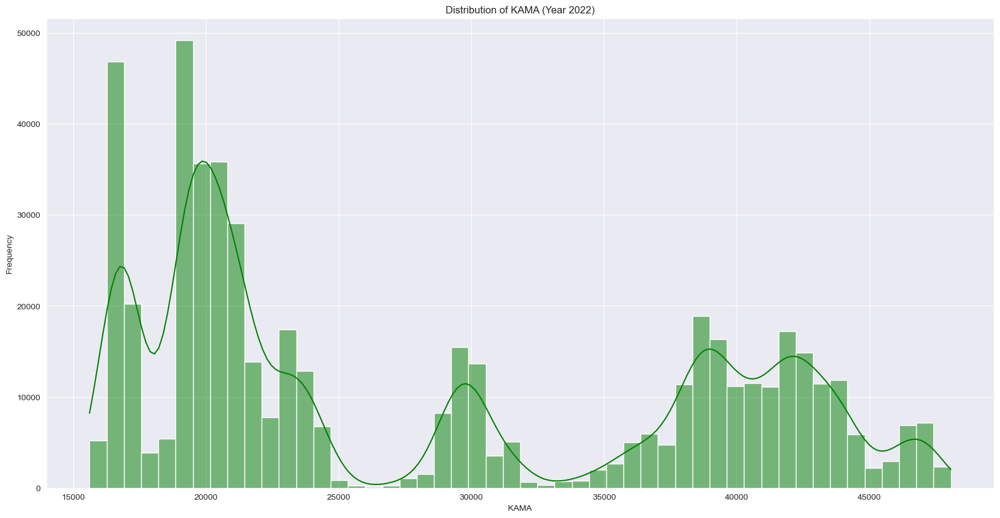


Boxplot of KAMA (Year 2022):


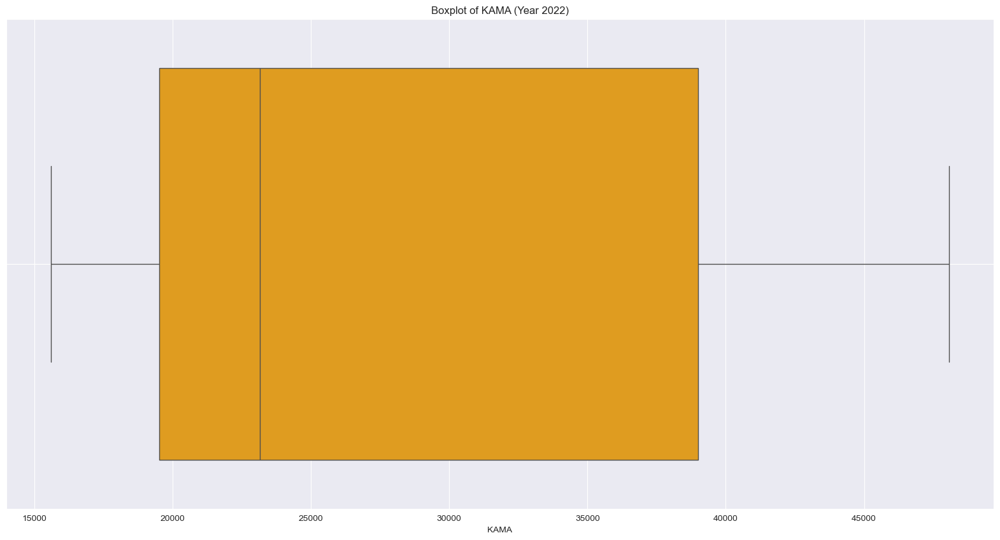


Distribution of CMO (Year 2022):


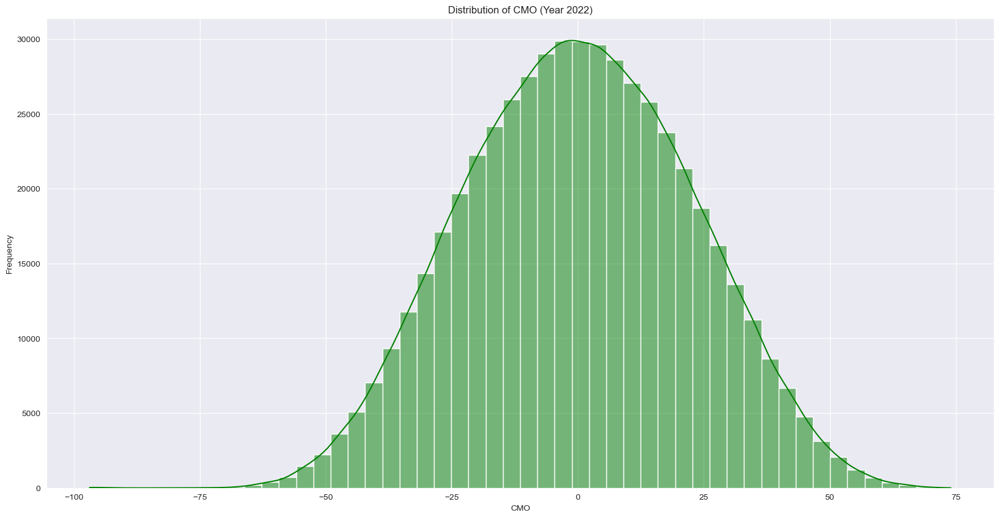


Boxplot of CMO (Year 2022):


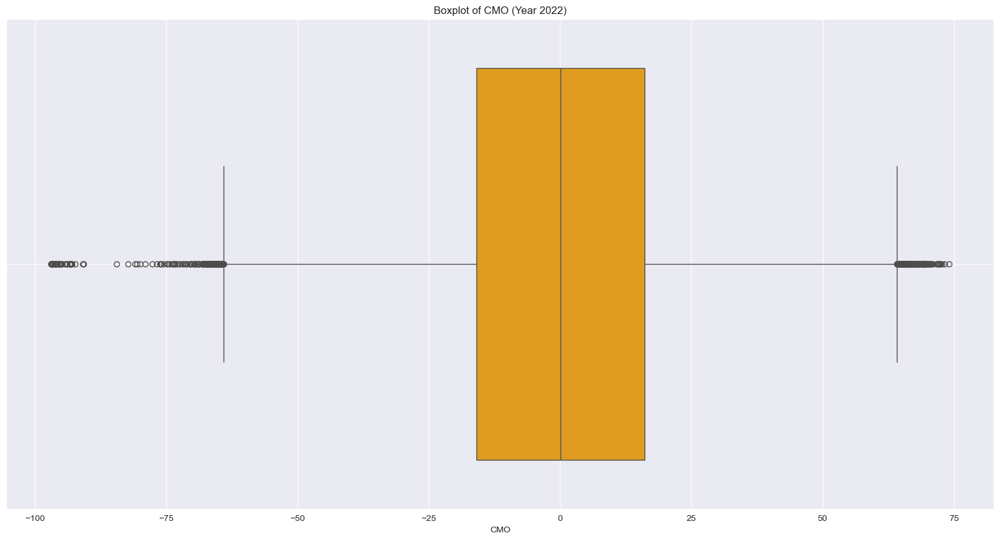


Distribution of Z-Score (Year 2022):


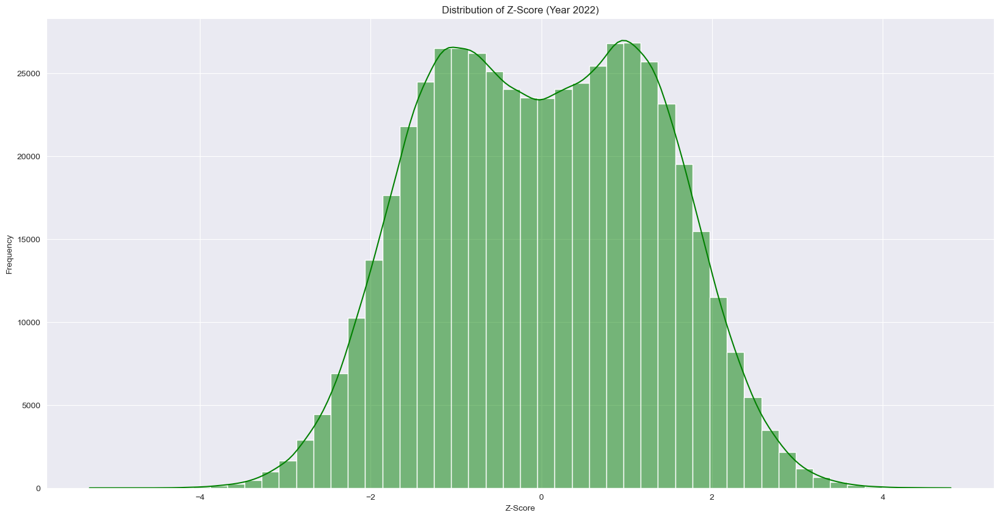


Boxplot of Z-Score (Year 2022):


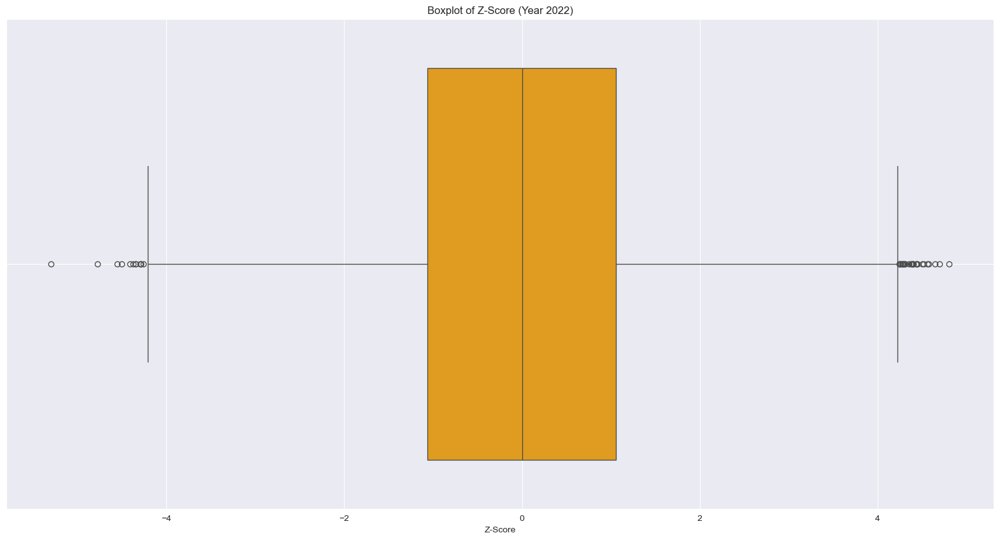


Distribution of QStick (Year 2022):


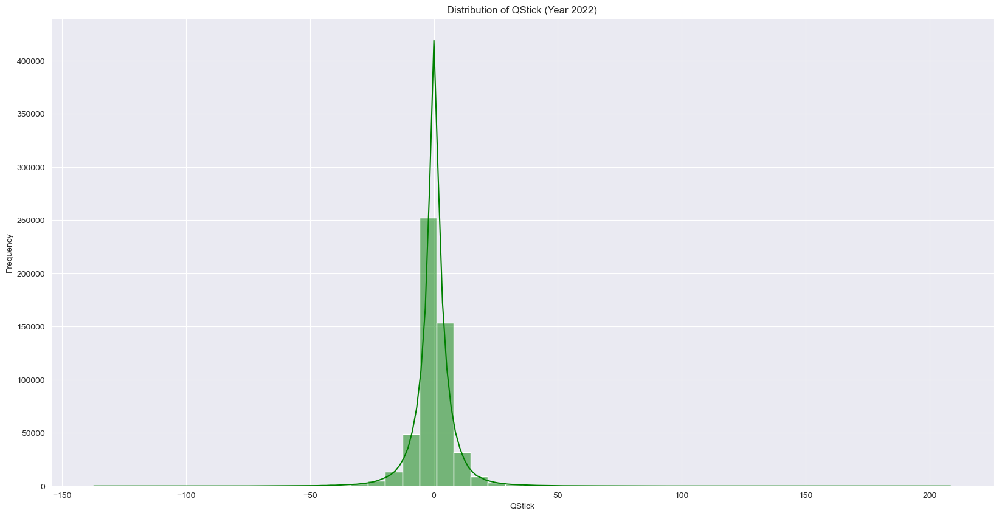


Boxplot of QStick (Year 2022):


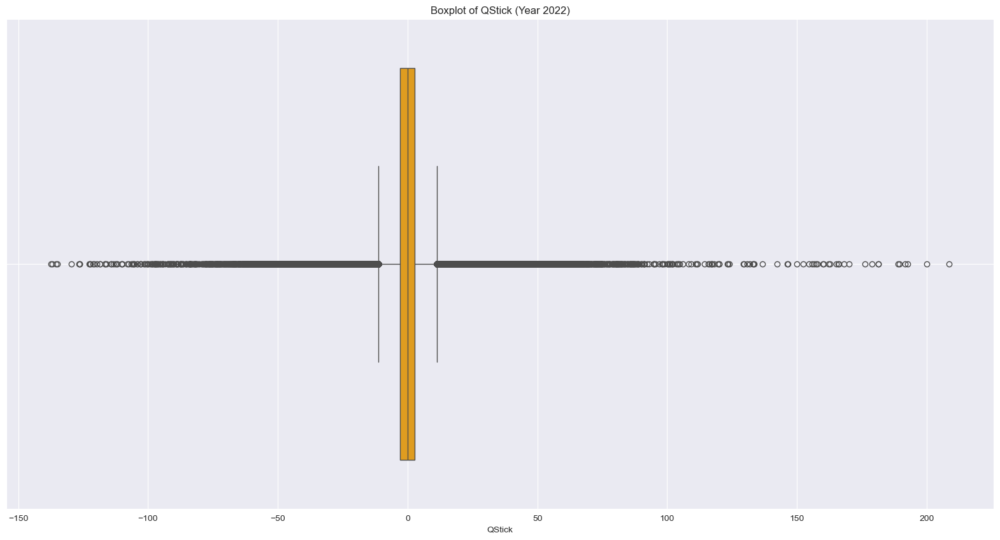


Distribution of year (Year 2022):


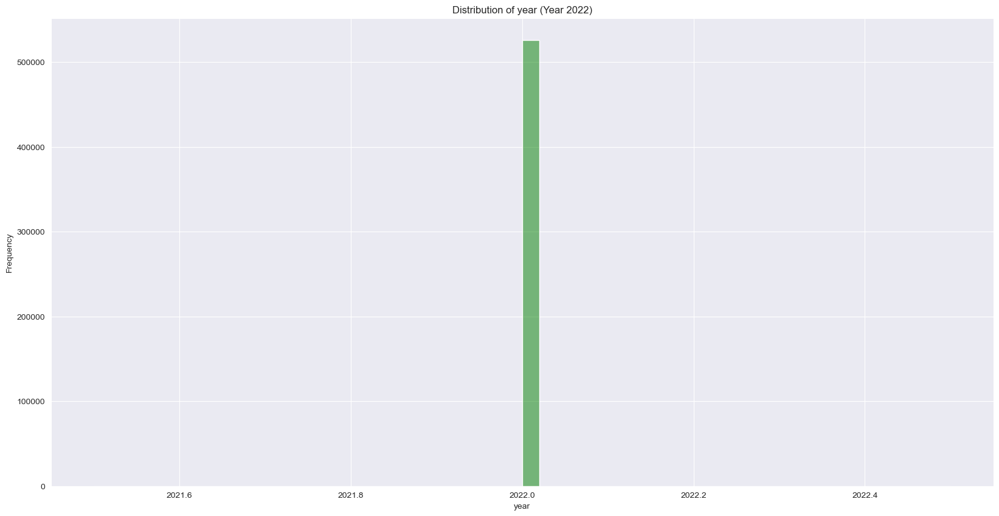


Boxplot of year (Year 2022):


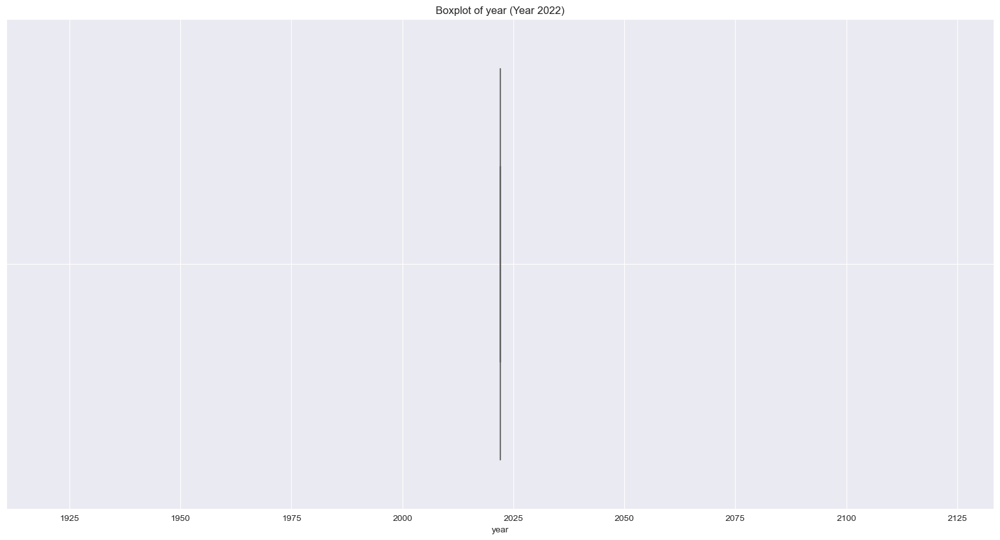


Distribution of day_of_week (Year 2022):


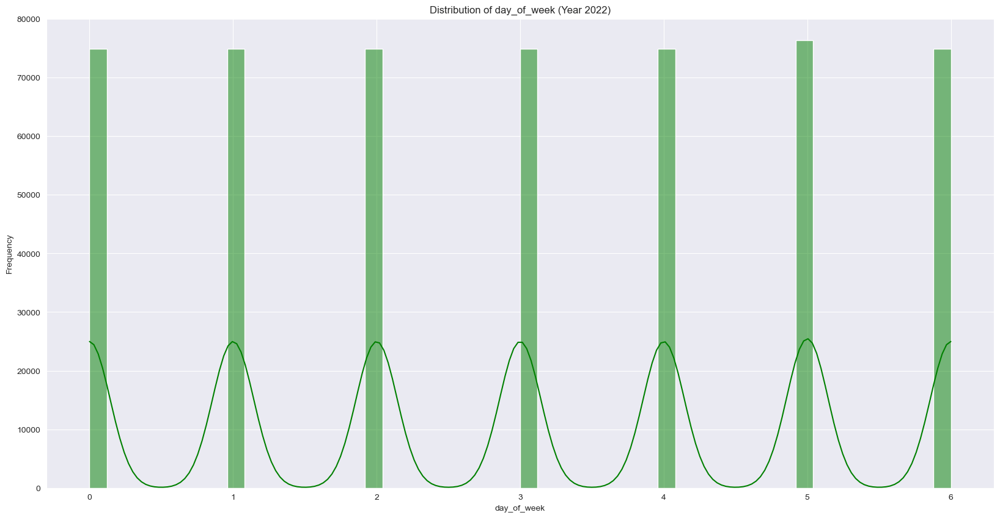


Boxplot of day_of_week (Year 2022):


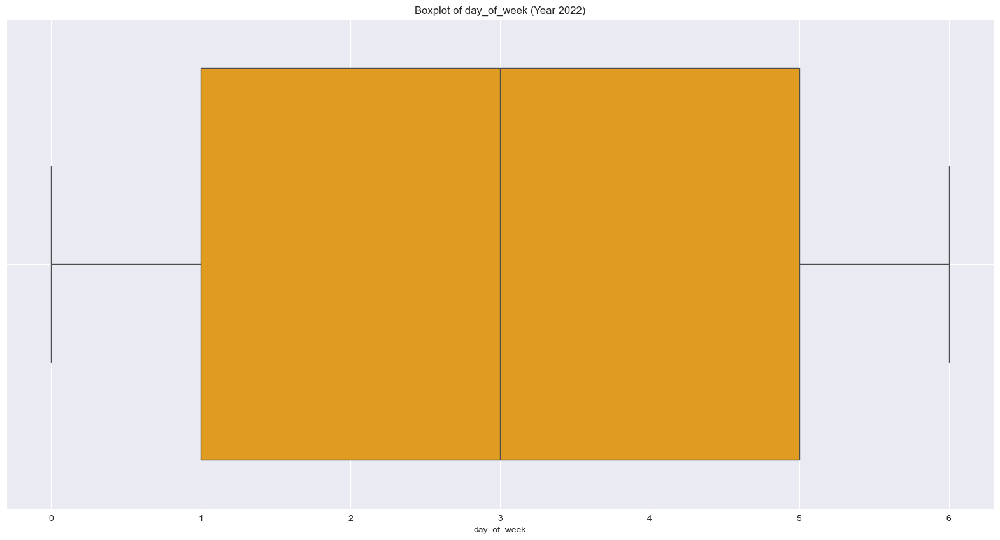


Distribution of month (Year 2022):


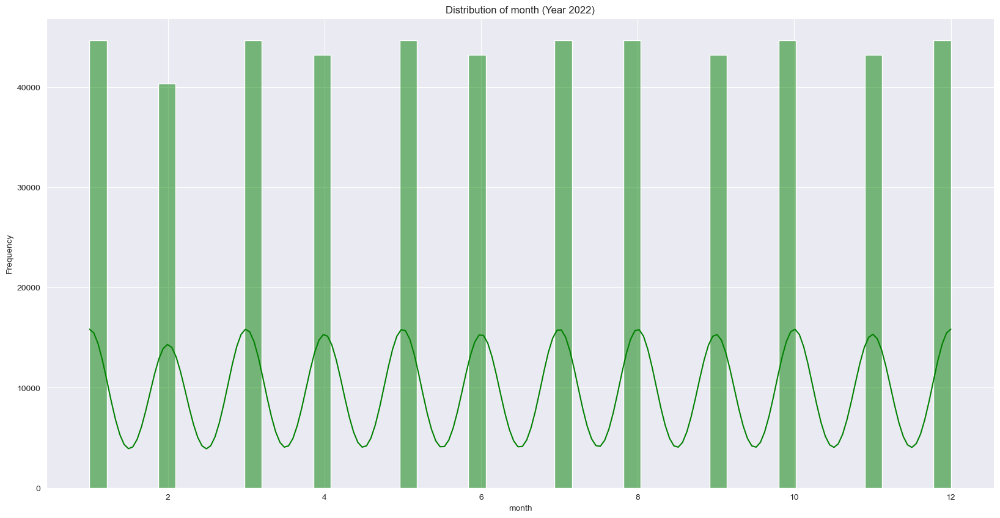


Boxplot of month (Year 2022):


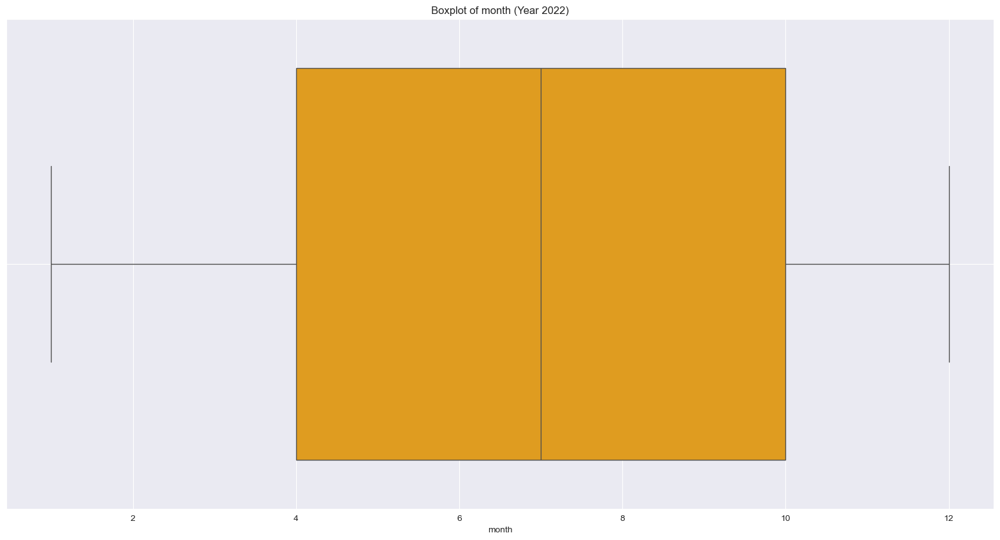


Distribution of week_of_year (Year 2022):


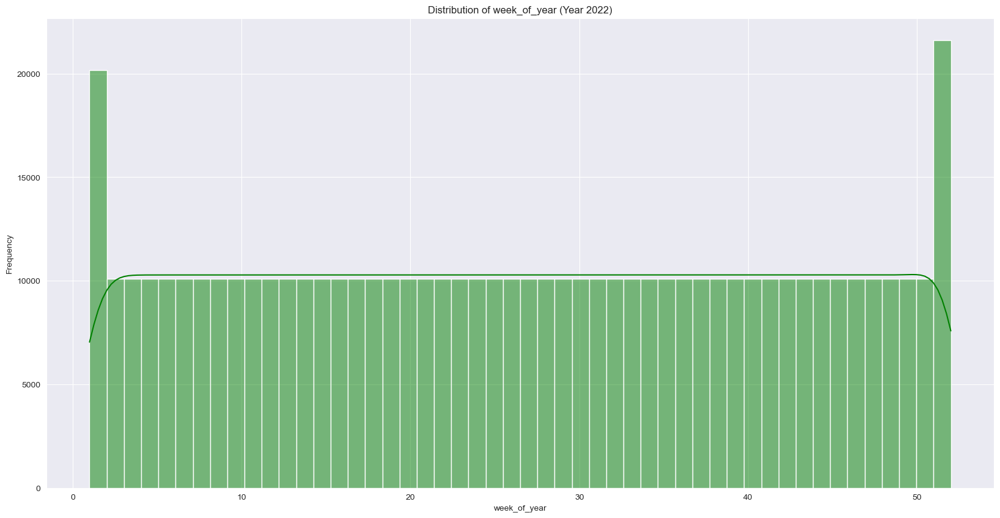


Boxplot of week_of_year (Year 2022):


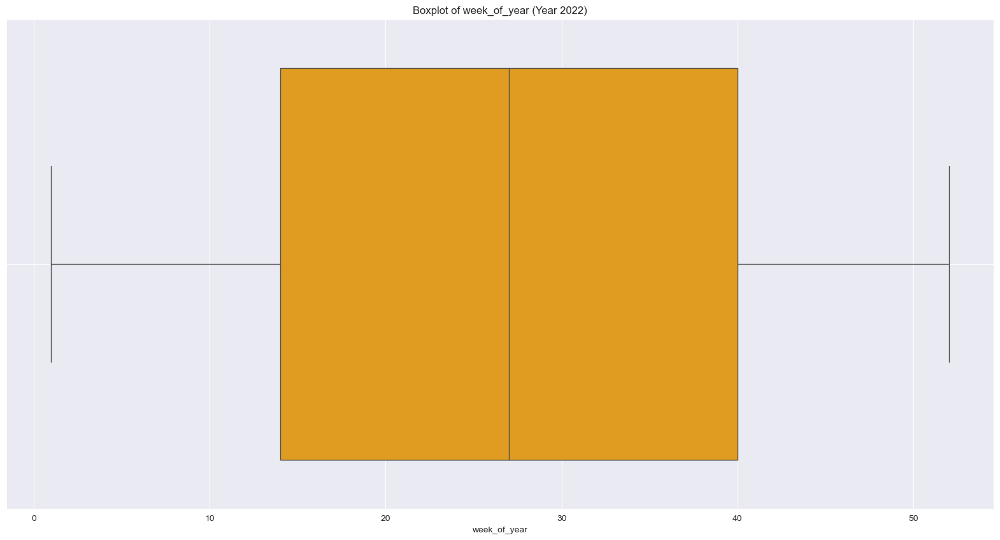


Distribution of time_delta (Year 2022):


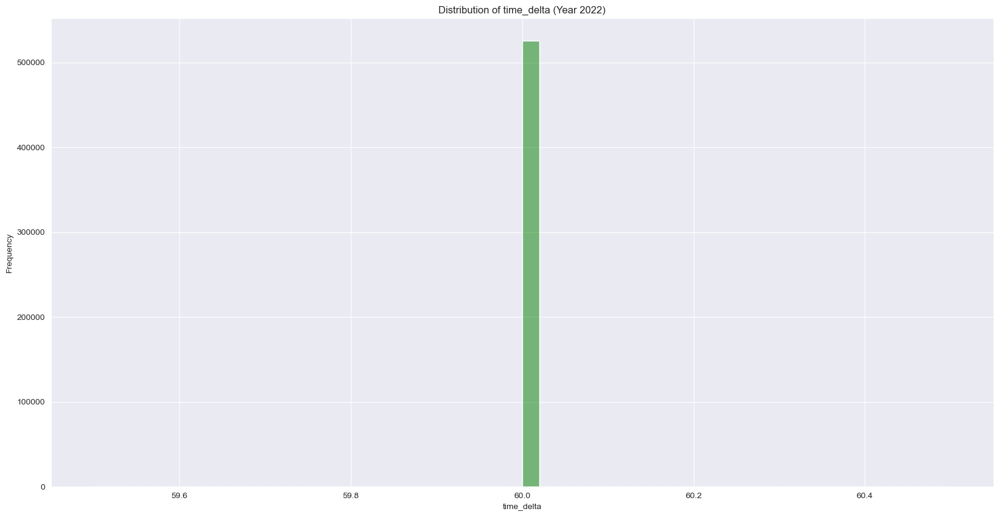


Boxplot of time_delta (Year 2022):


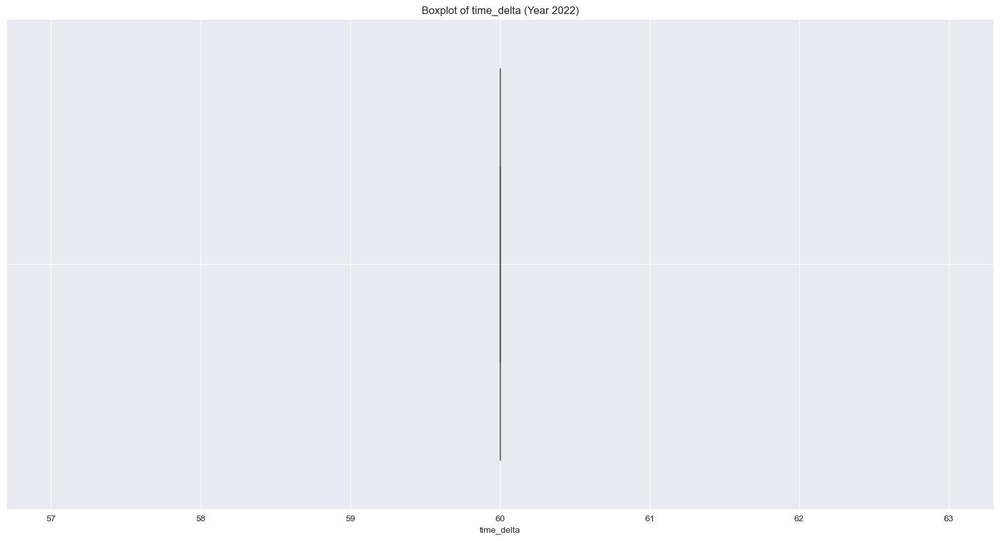


Distribution of open (Year 2023):


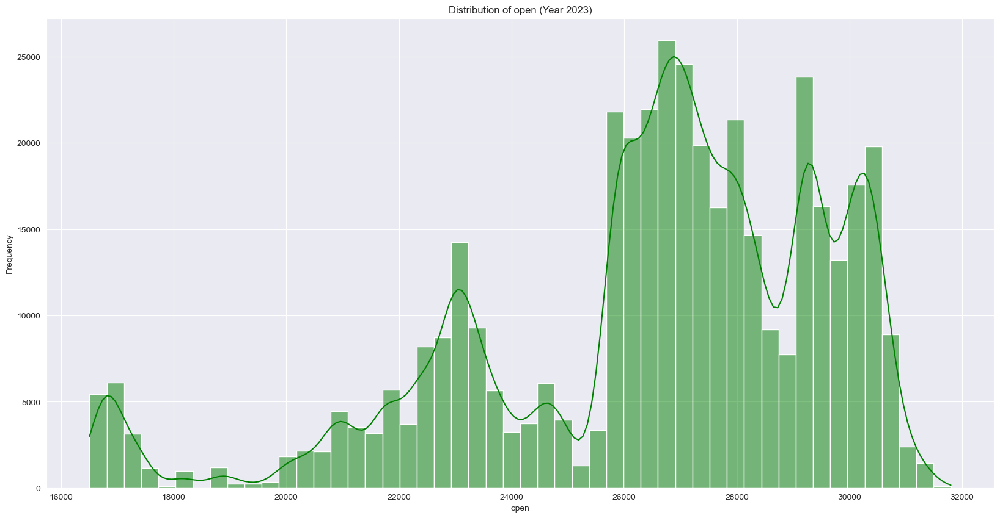


Boxplot of open (Year 2023):


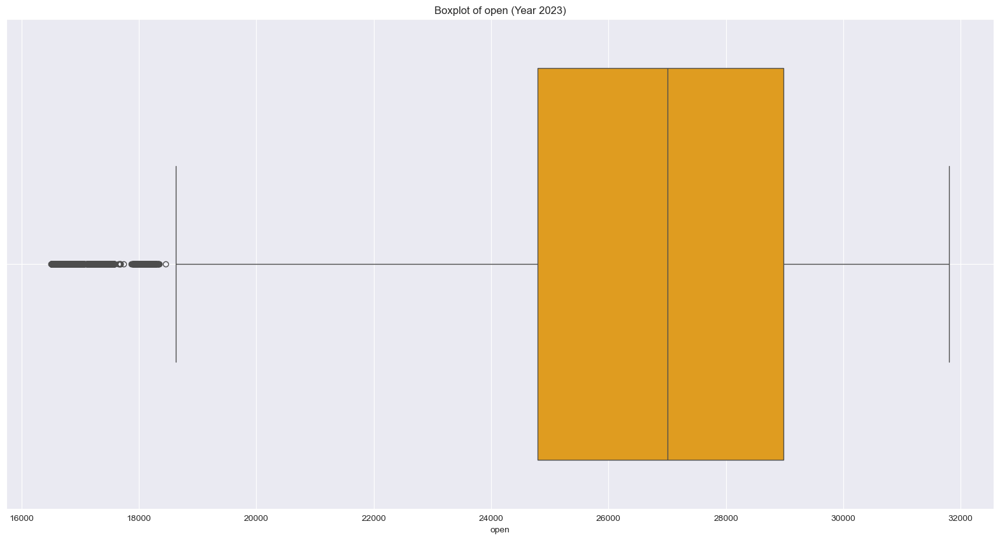


Distribution of high (Year 2023):


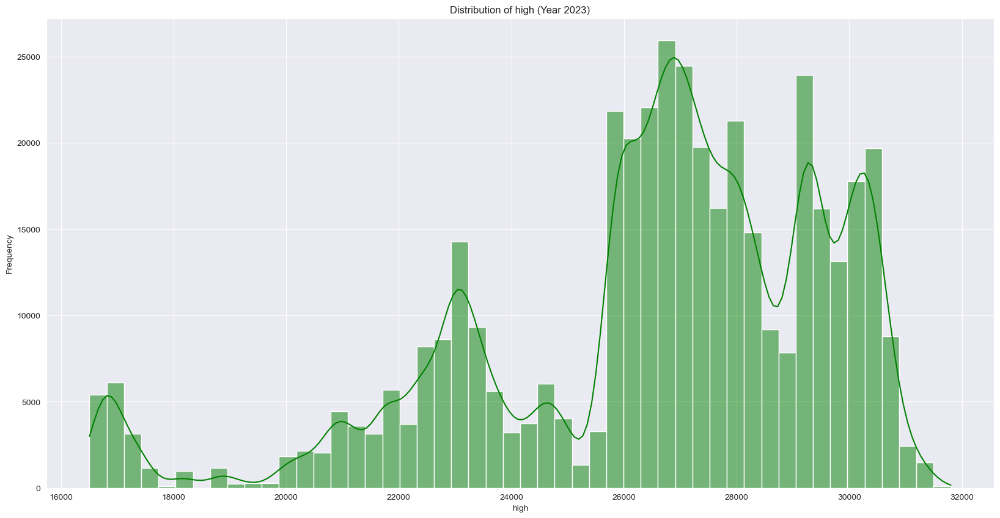


Boxplot of high (Year 2023):


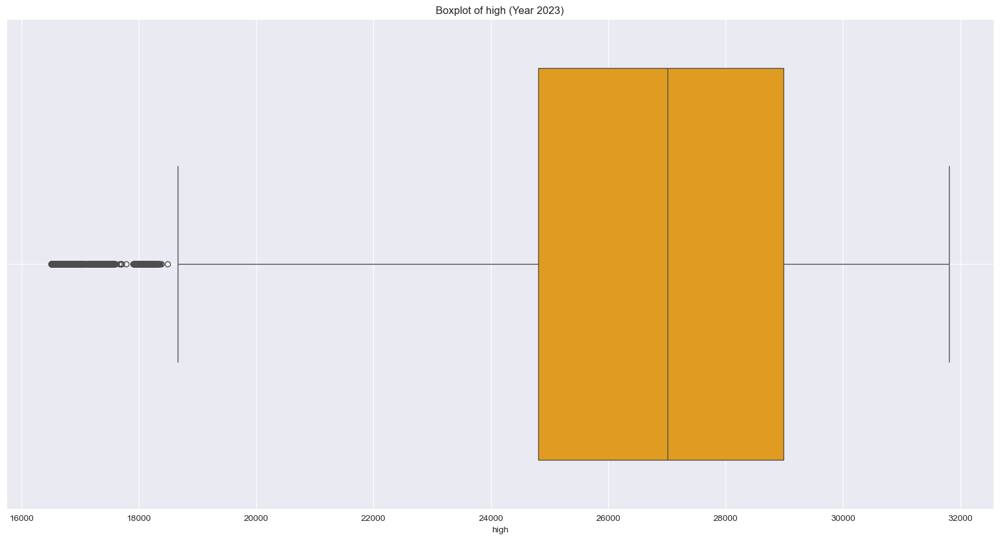


Distribution of low (Year 2023):


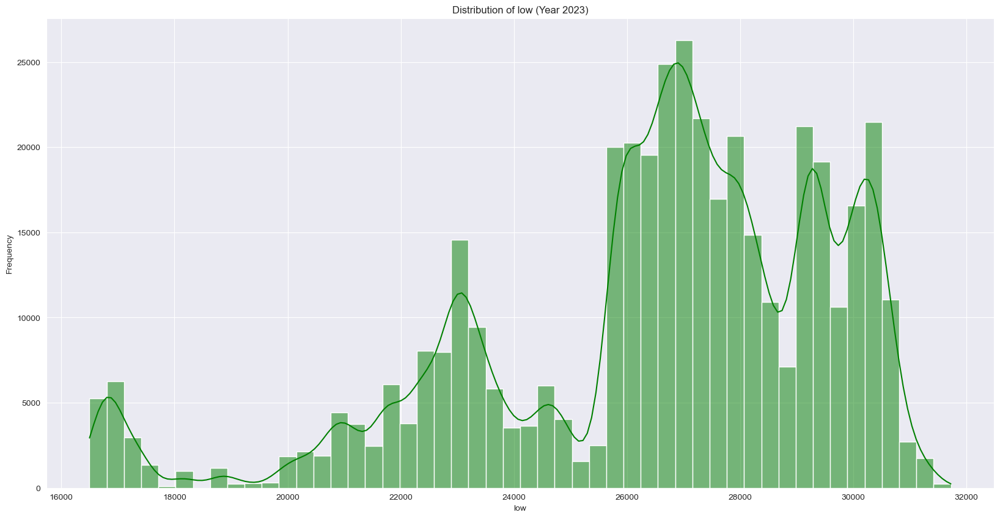


Boxplot of low (Year 2023):


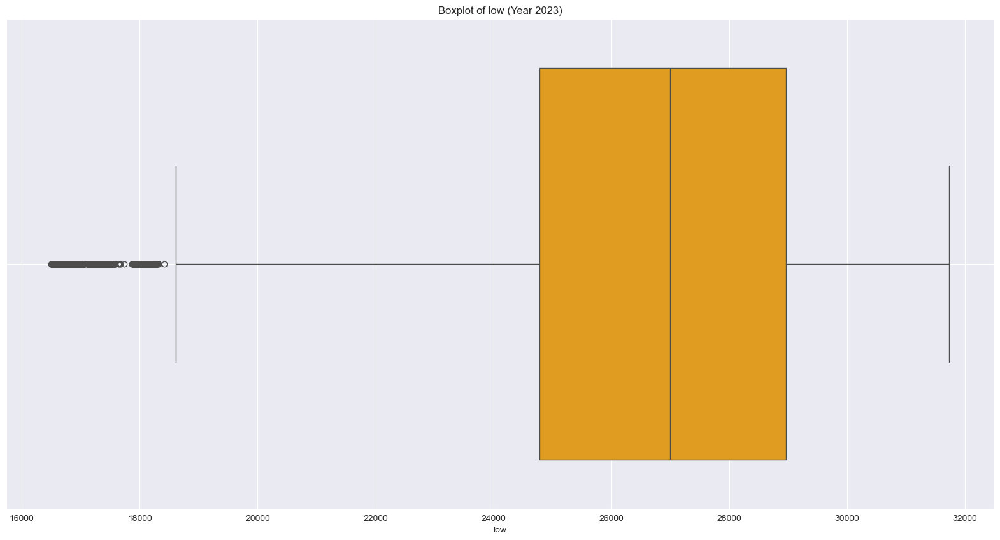


Distribution of close (Year 2023):


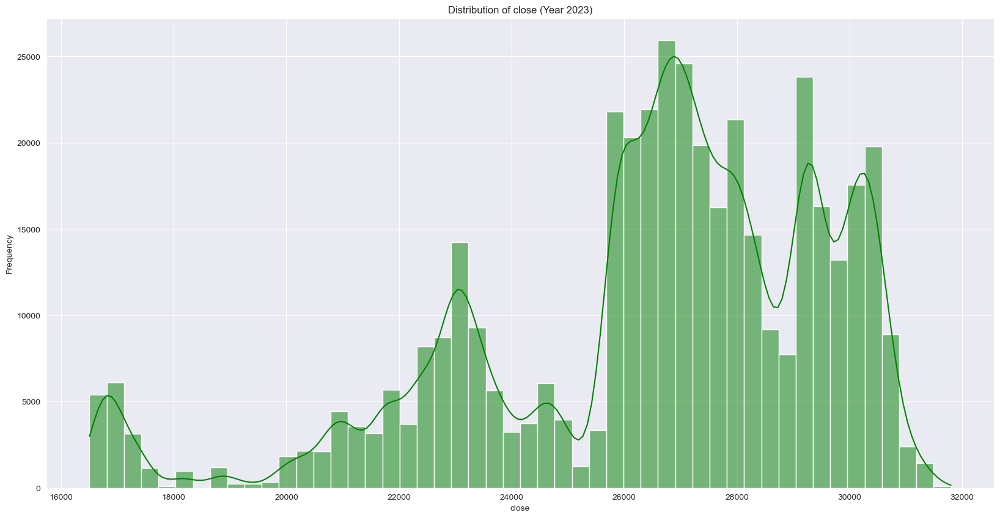


Boxplot of close (Year 2023):


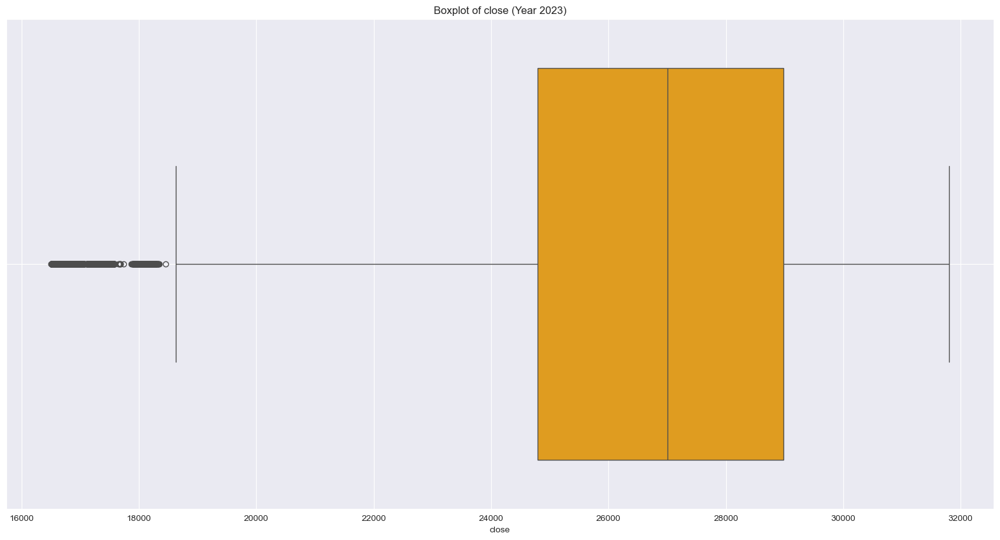


Distribution of Volume USDT (Year 2023):


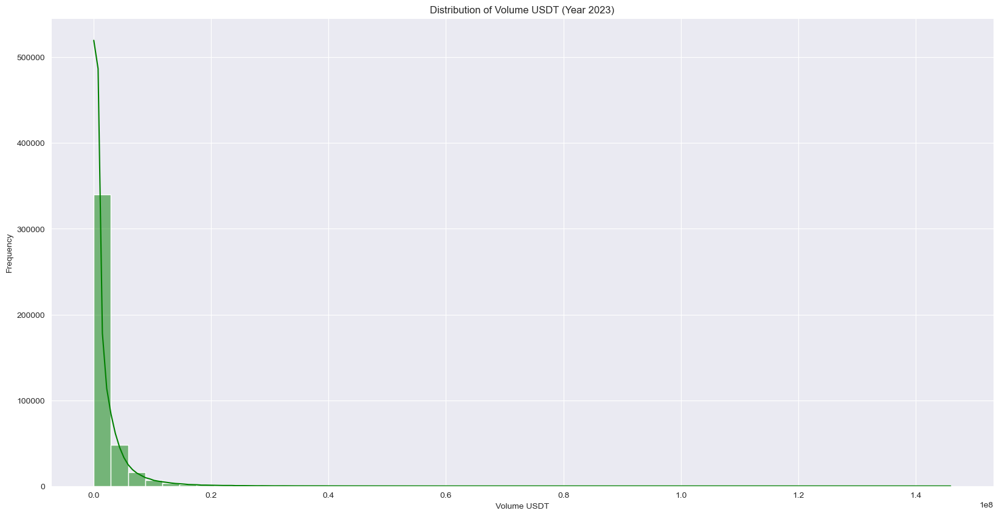


Boxplot of Volume USDT (Year 2023):


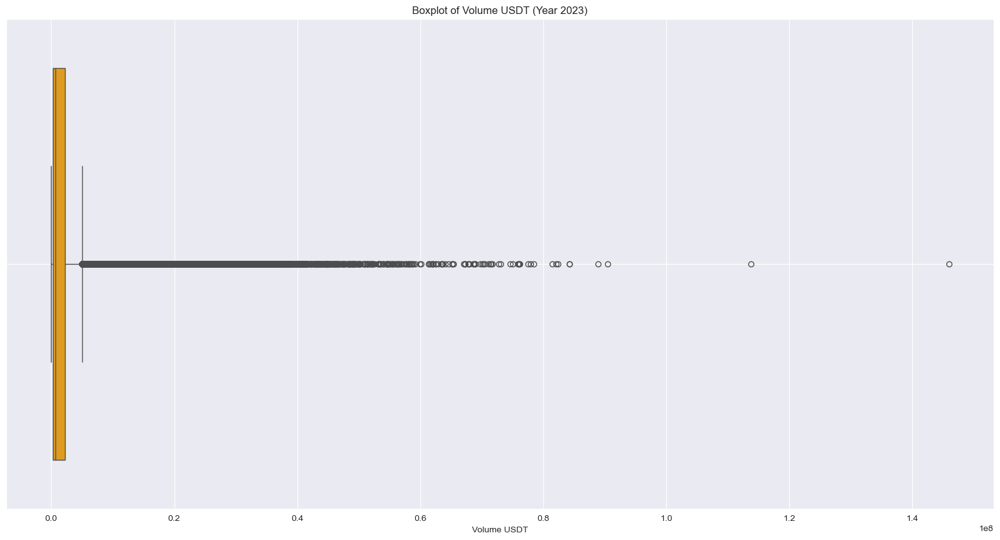


Distribution of tradecount (Year 2023):


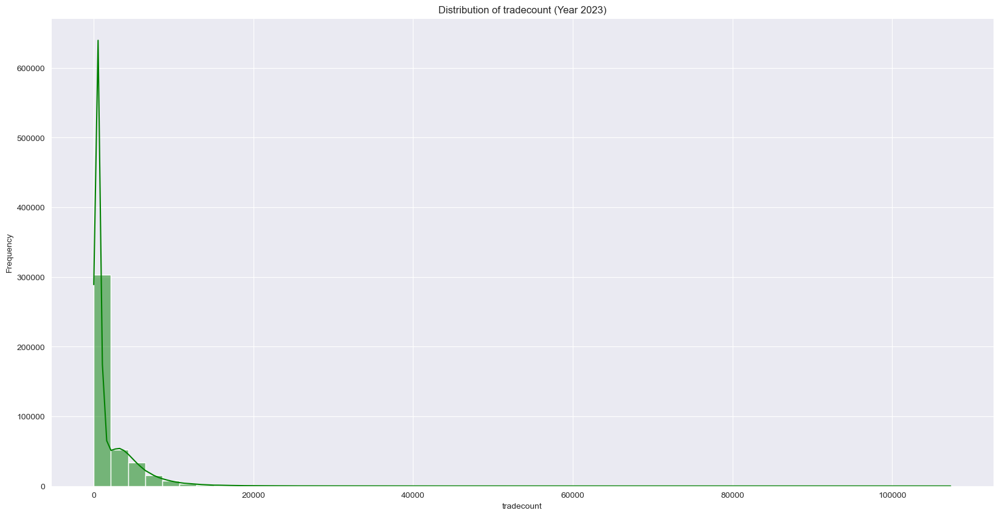


Boxplot of tradecount (Year 2023):


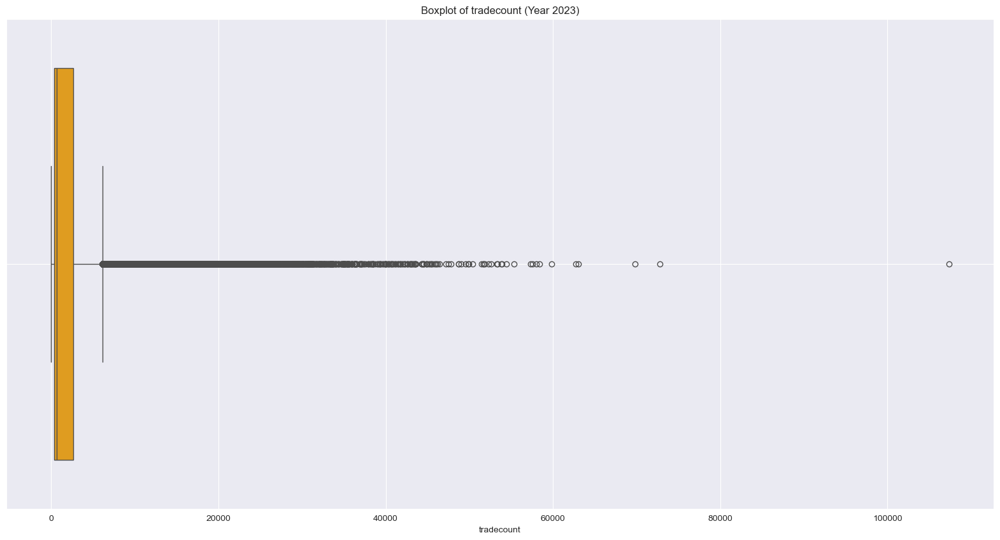


Distribution of hour (Year 2023):


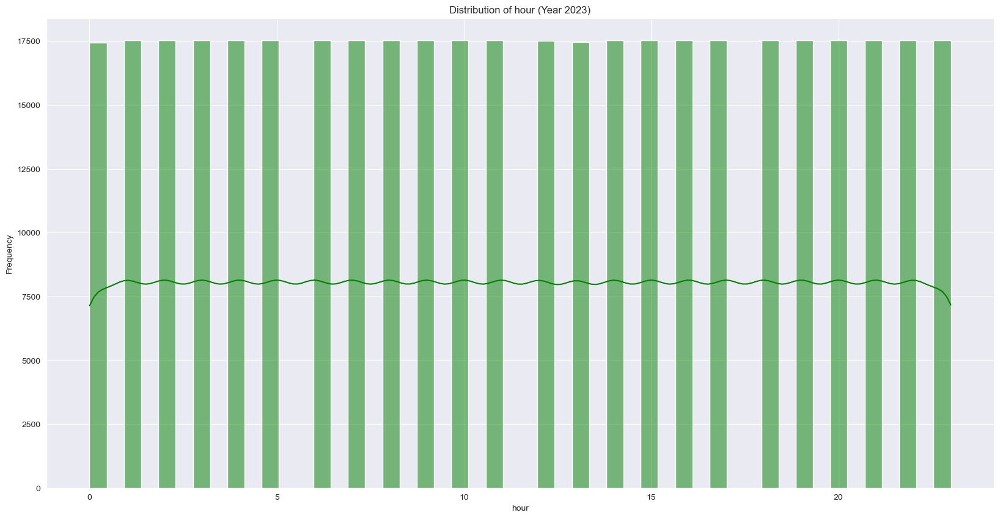


Boxplot of hour (Year 2023):


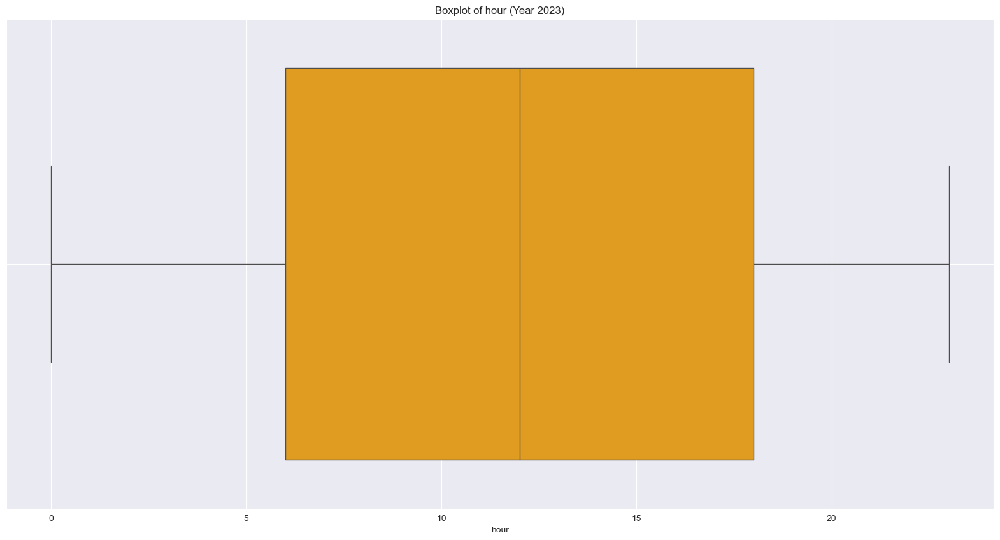


Distribution of ema_5 (Year 2023):


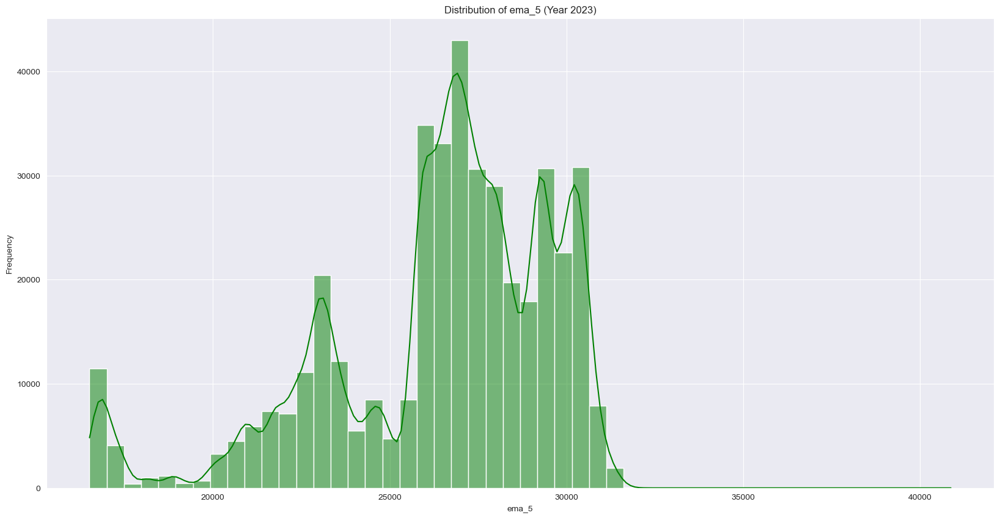


Boxplot of ema_5 (Year 2023):


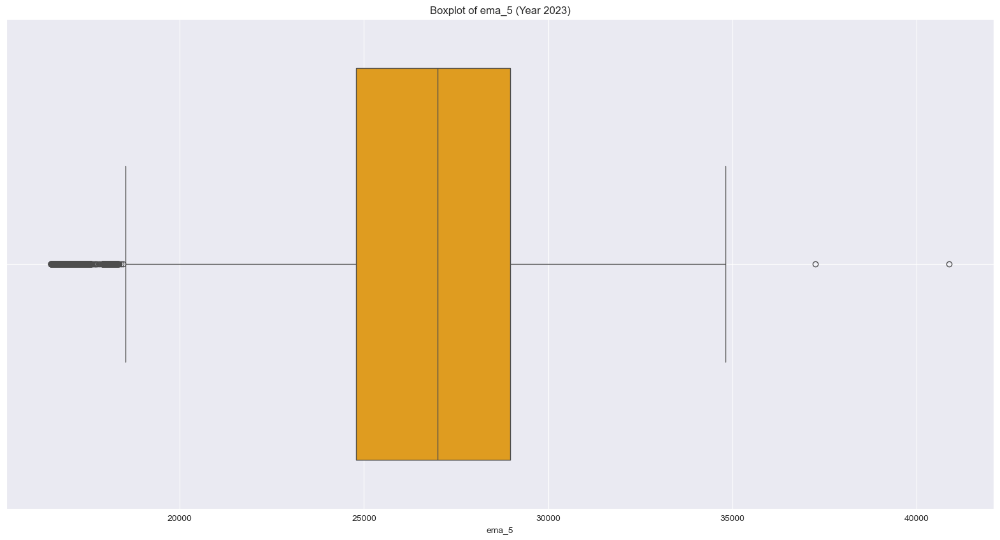


Distribution of ema_15 (Year 2023):


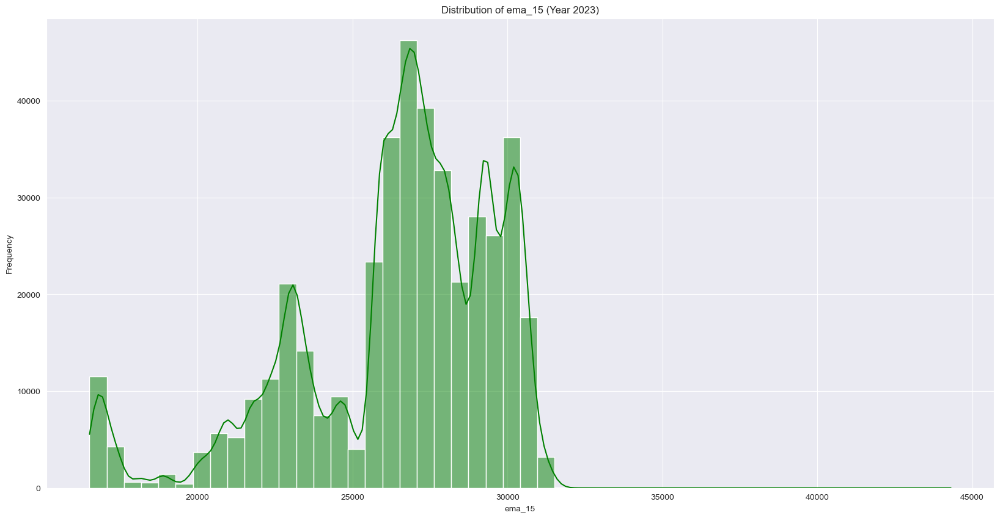


Boxplot of ema_15 (Year 2023):


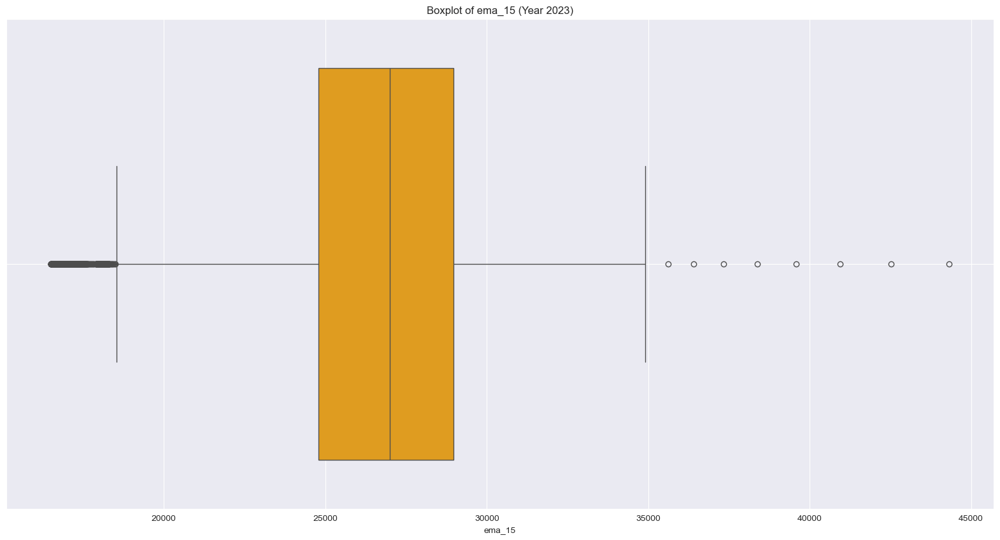


Distribution of ema_30 (Year 2023):


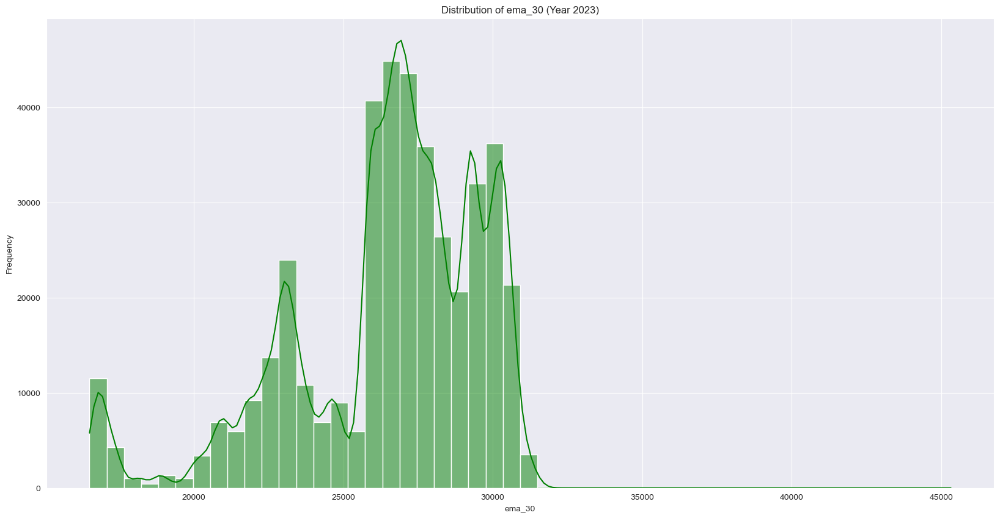


Boxplot of ema_30 (Year 2023):


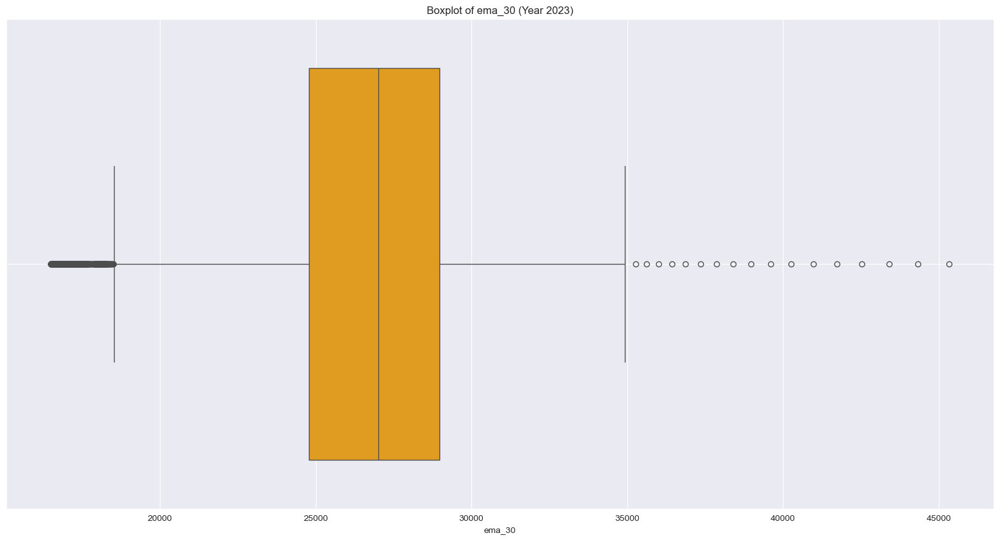


Distribution of ema_60 (Year 2023):


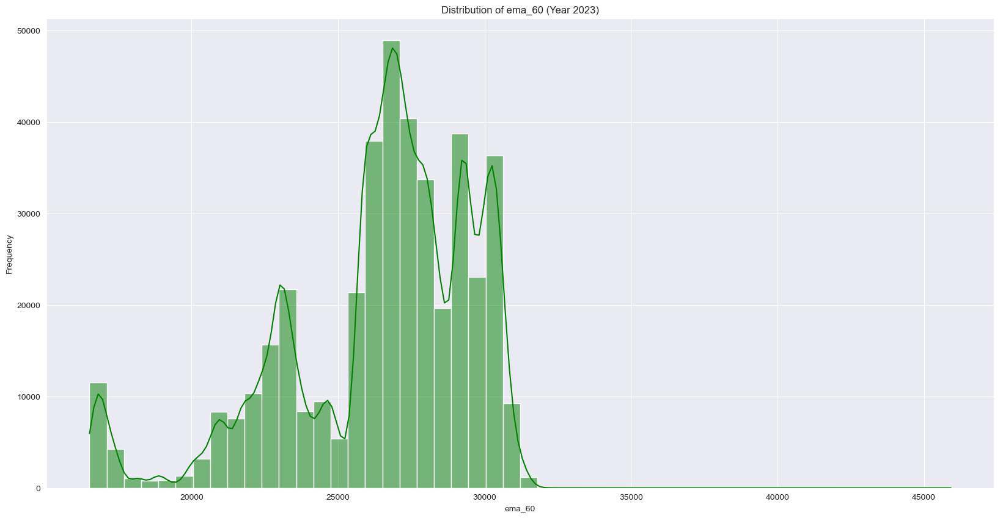


Boxplot of ema_60 (Year 2023):


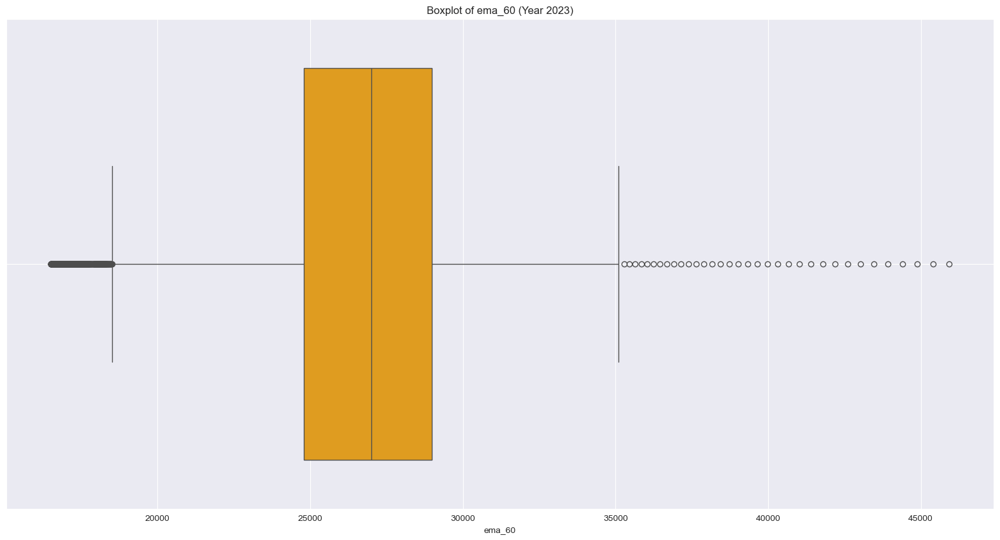


Distribution of ema_100 (Year 2023):


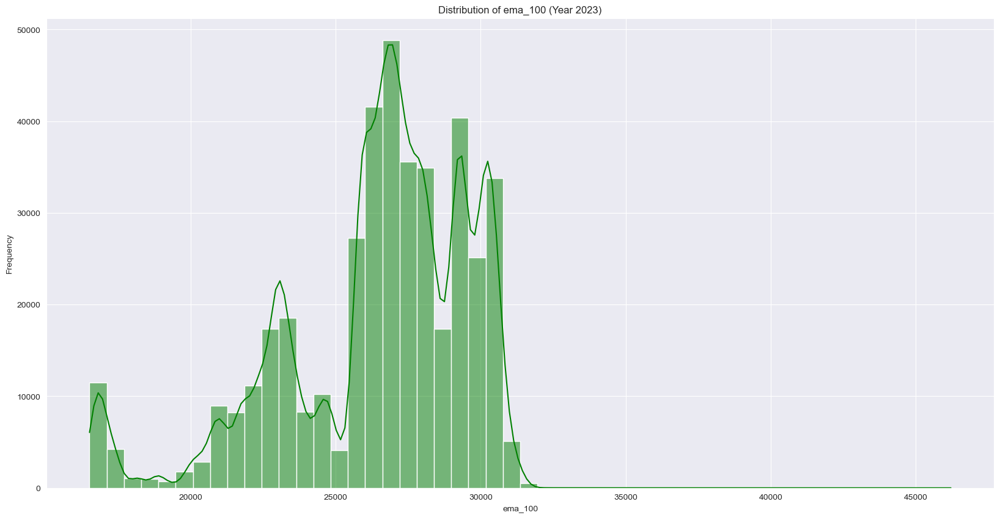


Boxplot of ema_100 (Year 2023):


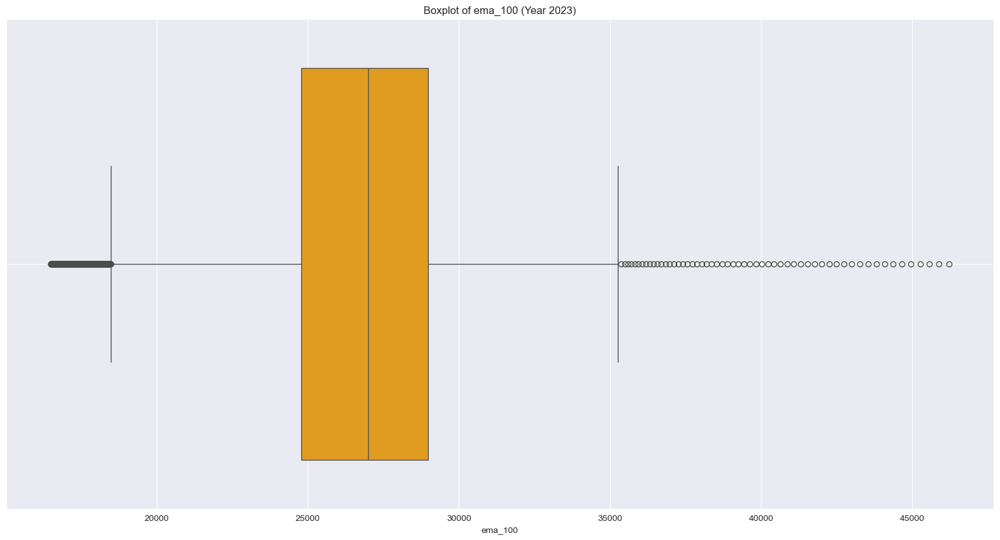


Distribution of ema_200 (Year 2023):


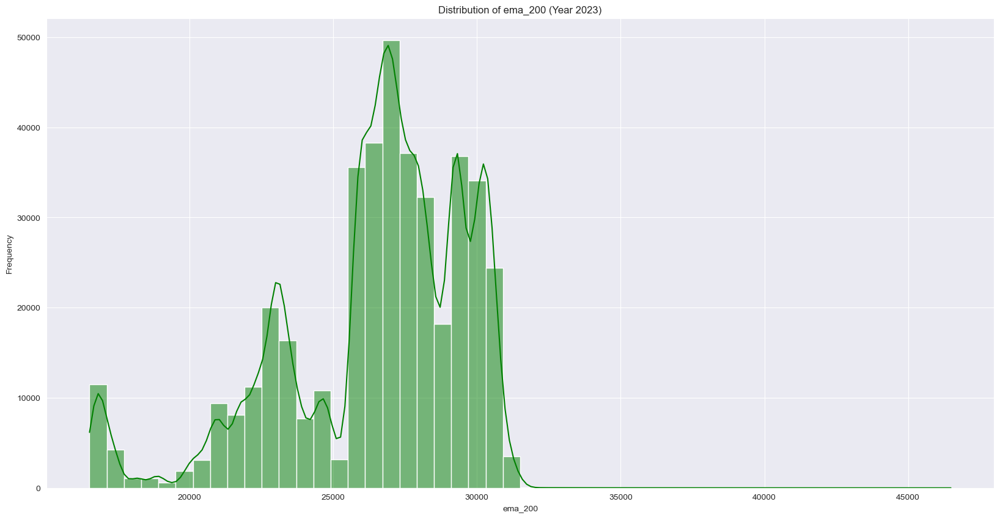


Boxplot of ema_200 (Year 2023):


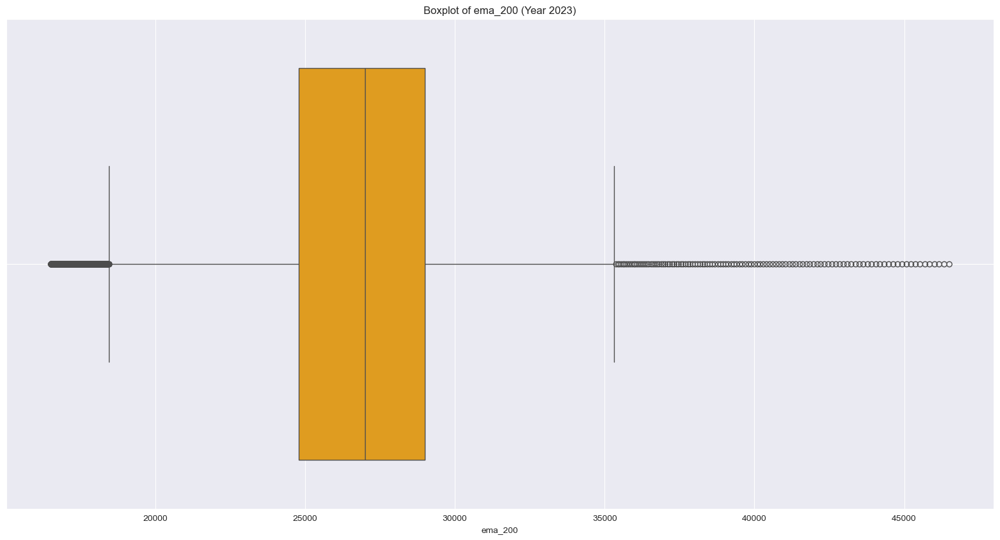


Distribution of WMA (Year 2023):


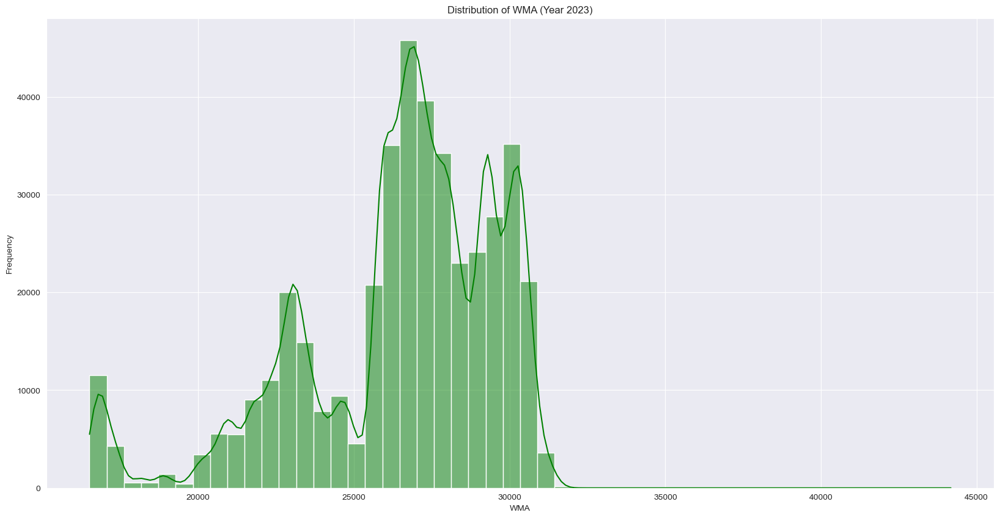


Boxplot of WMA (Year 2023):


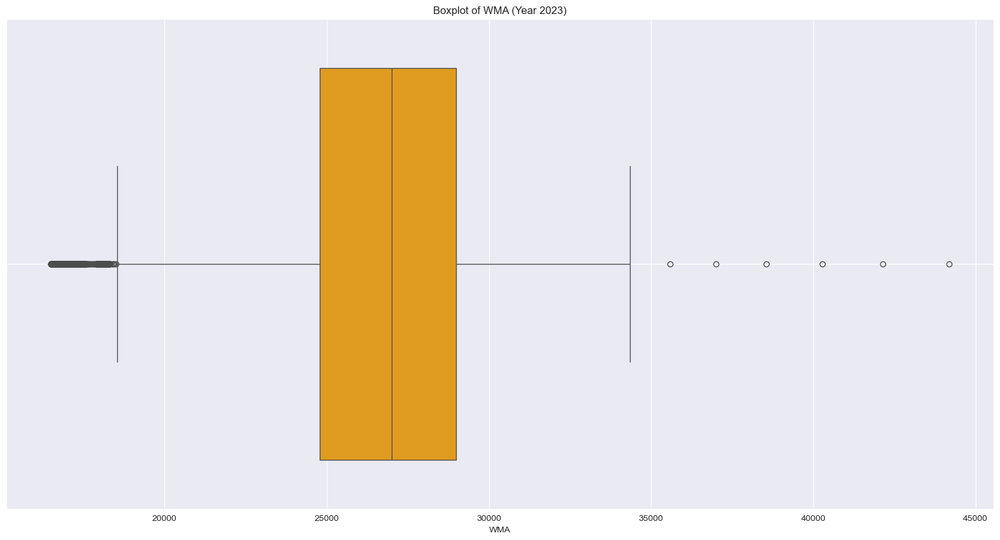


Distribution of MACD (Year 2023):


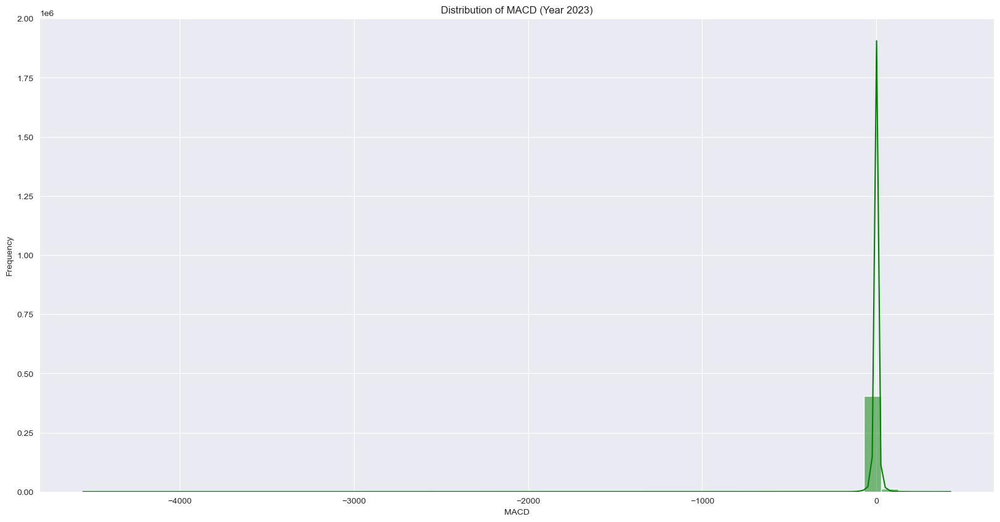


Boxplot of MACD (Year 2023):


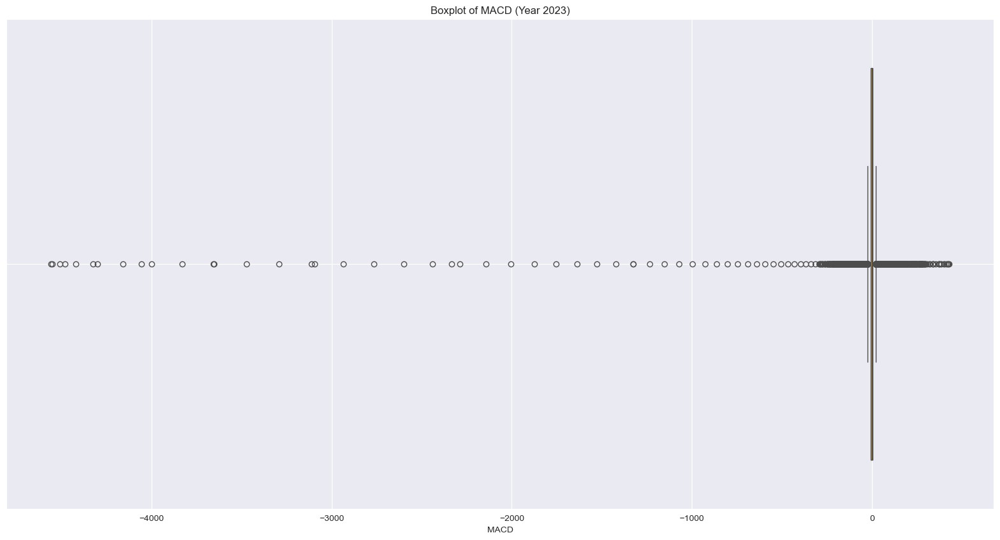


Distribution of MACD_Signal (Year 2023):


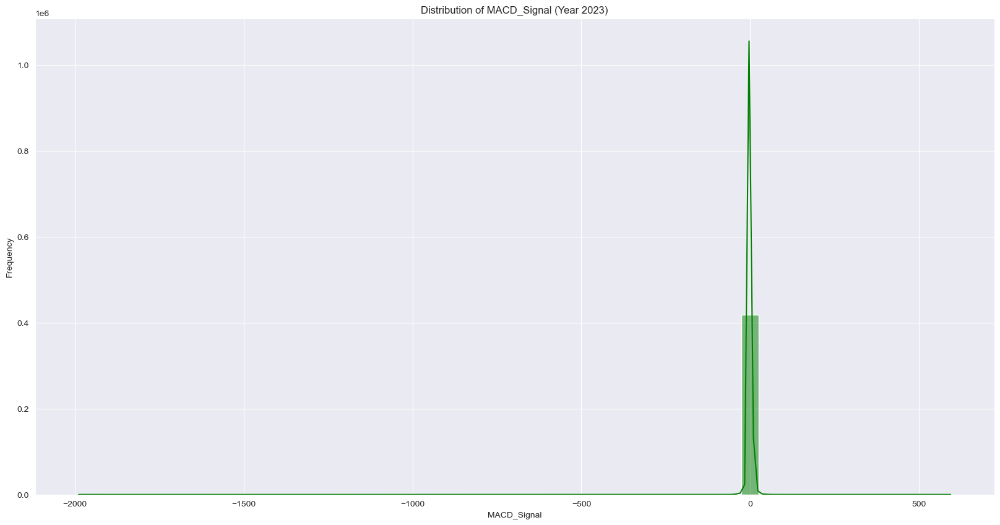


Boxplot of MACD_Signal (Year 2023):


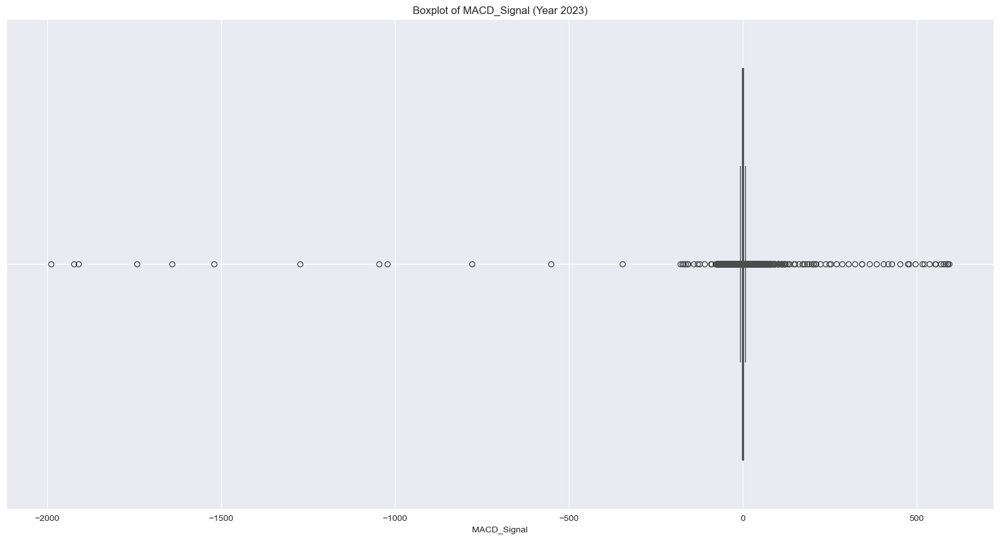


Distribution of MACD_Hist (Year 2023):


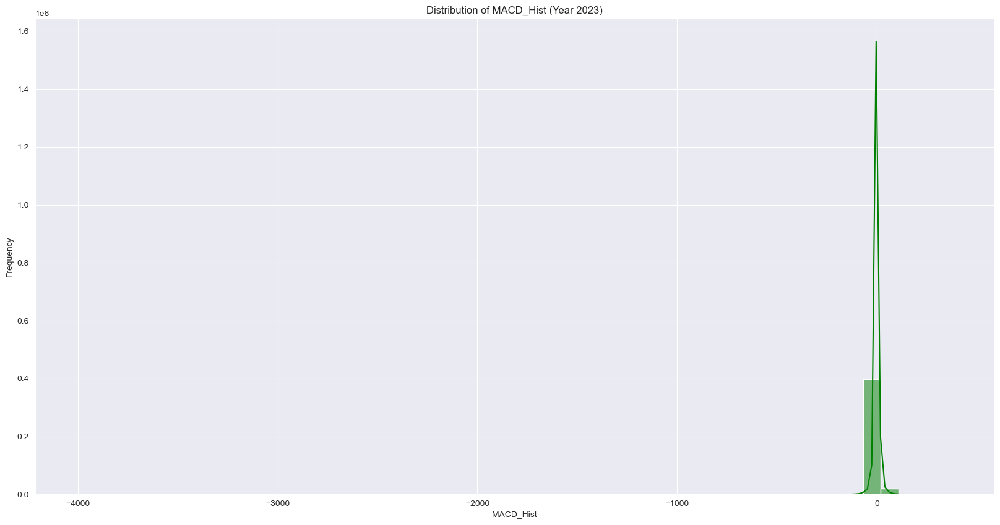


Boxplot of MACD_Hist (Year 2023):


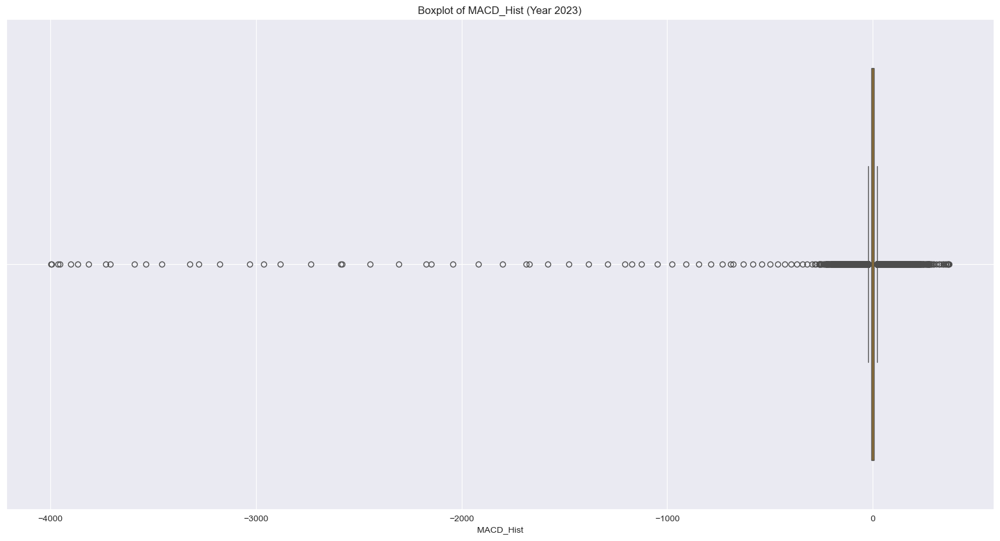


Distribution of ATR (Year 2023):


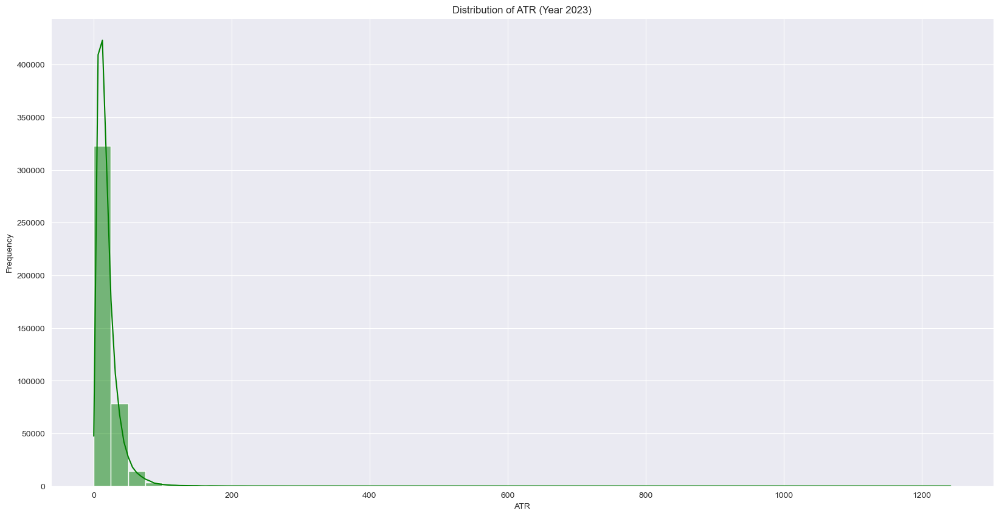


Boxplot of ATR (Year 2023):


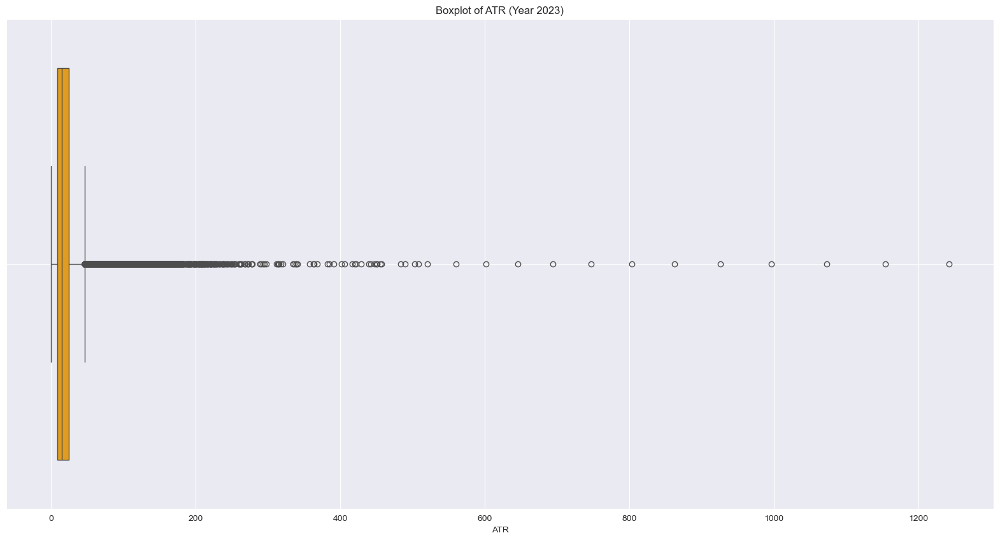


Distribution of HMA (Year 2023):


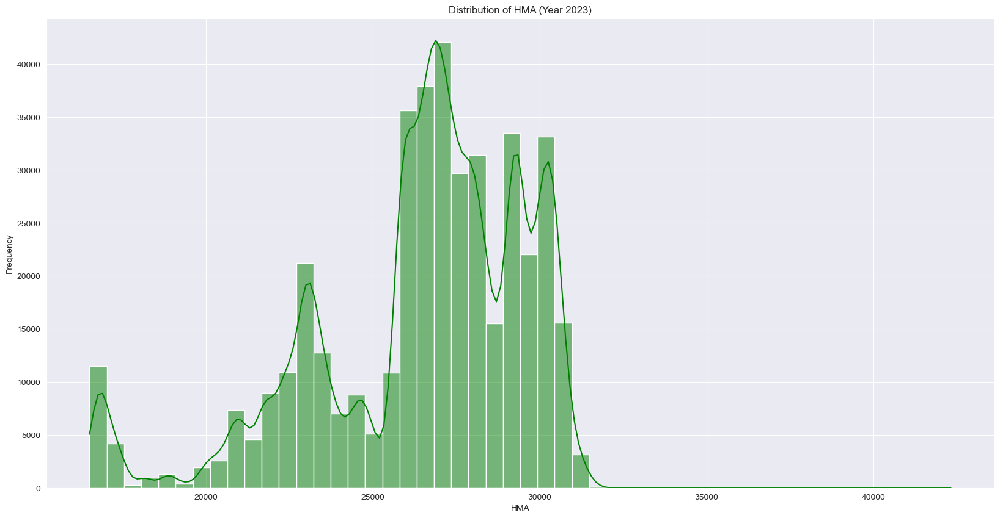


Boxplot of HMA (Year 2023):


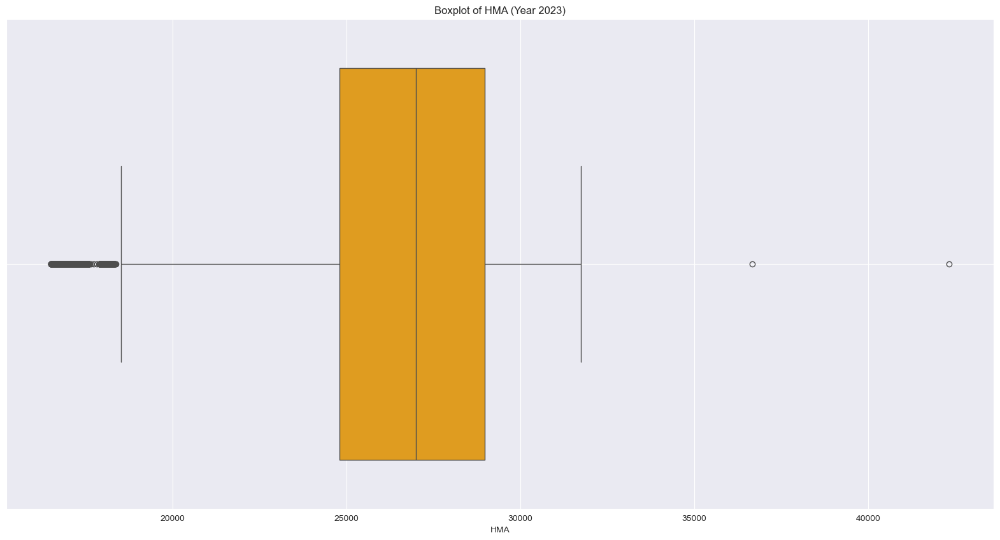


Distribution of KAMA (Year 2023):


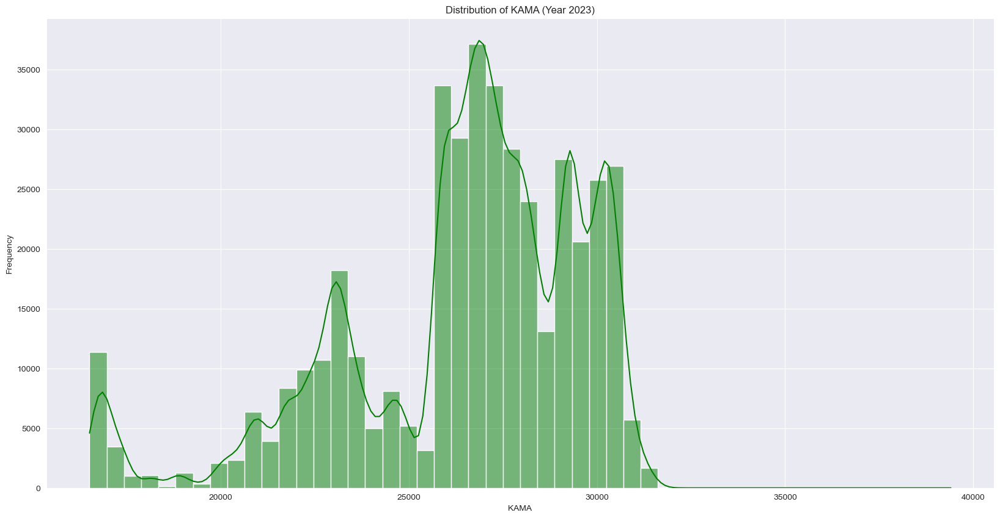


Boxplot of KAMA (Year 2023):


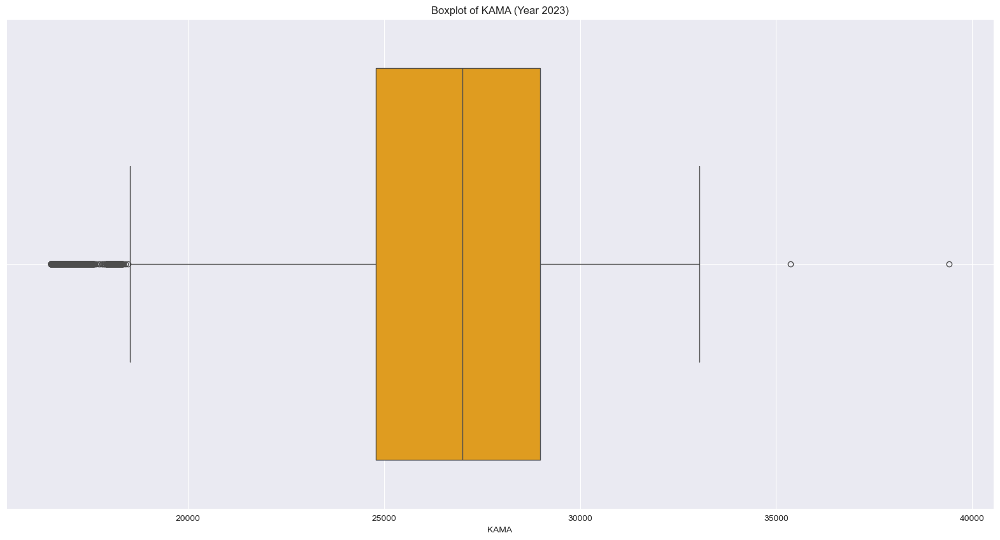


Distribution of CMO (Year 2023):


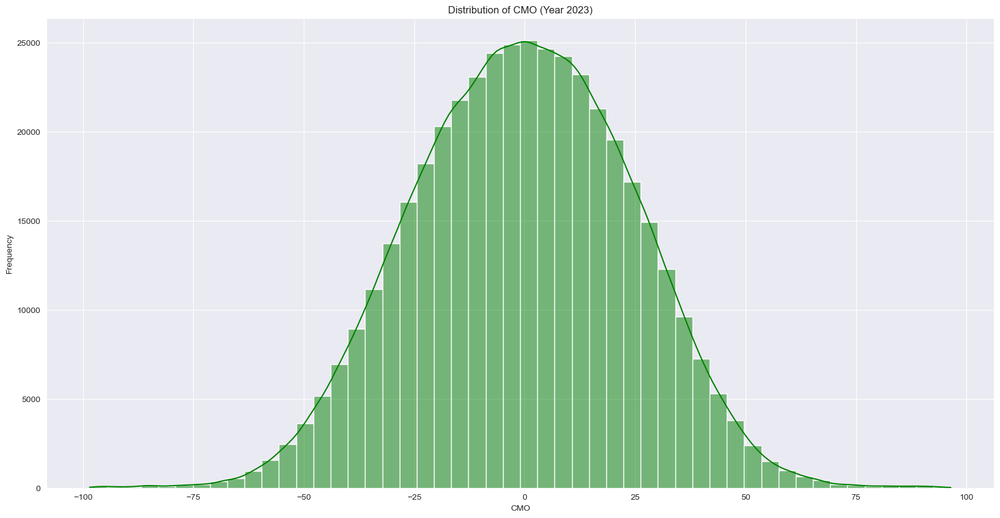


Boxplot of CMO (Year 2023):


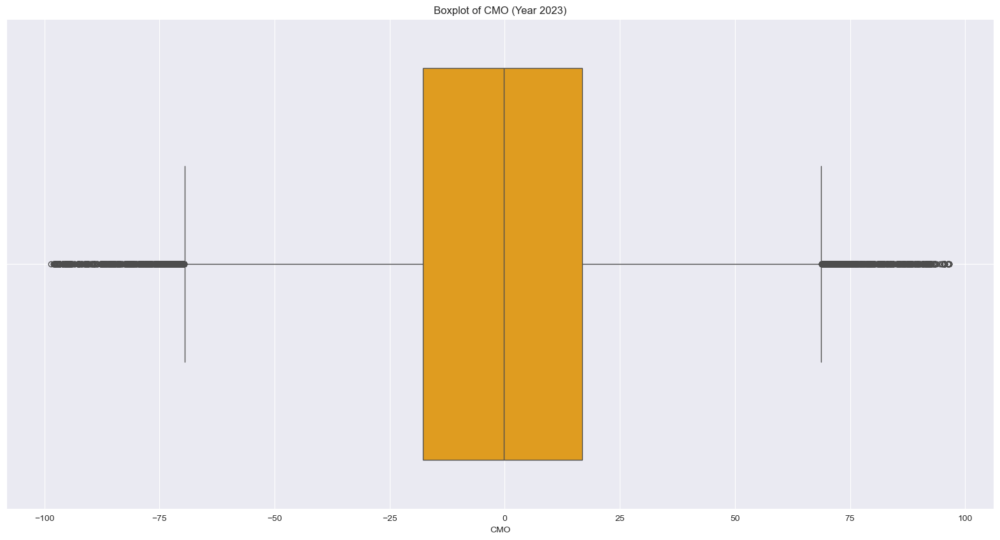


Distribution of Z-Score (Year 2023):


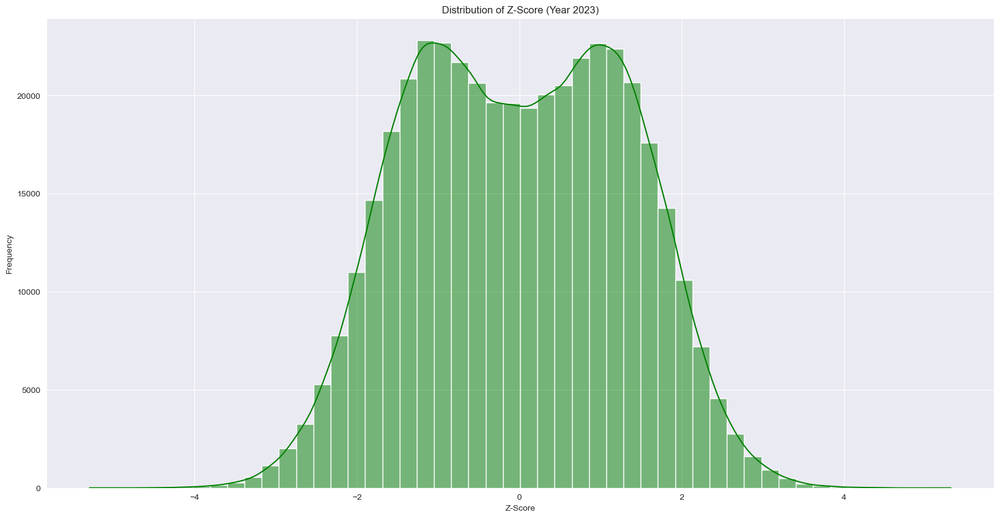


Boxplot of Z-Score (Year 2023):


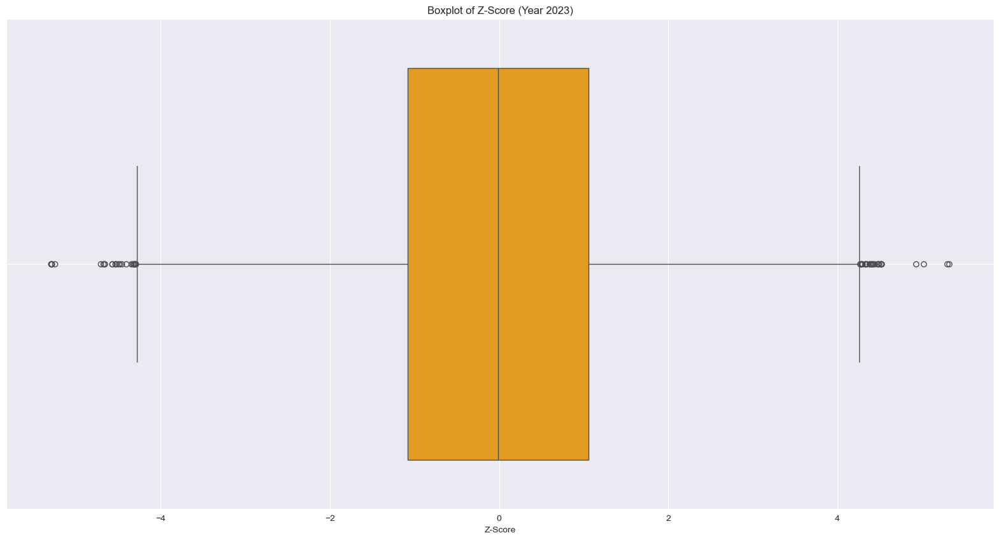


Distribution of QStick (Year 2023):


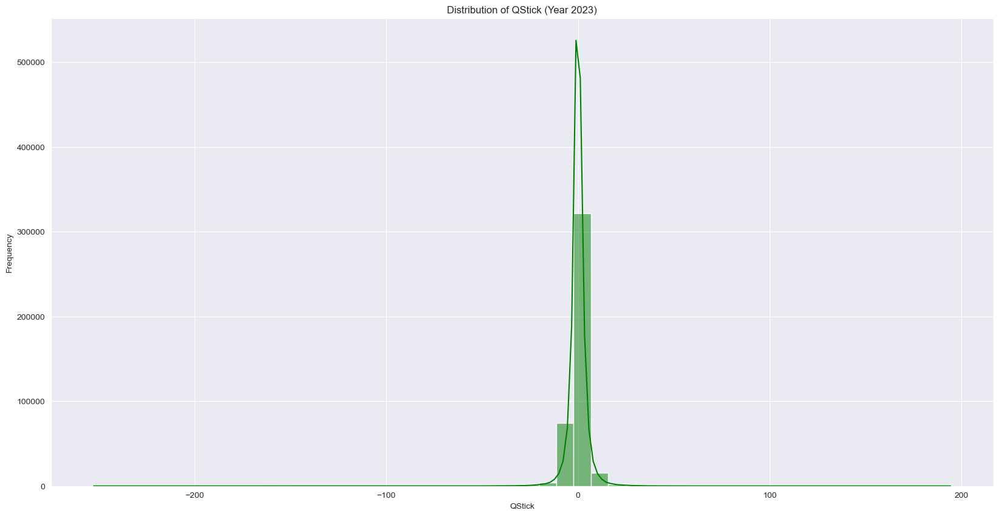


Boxplot of QStick (Year 2023):


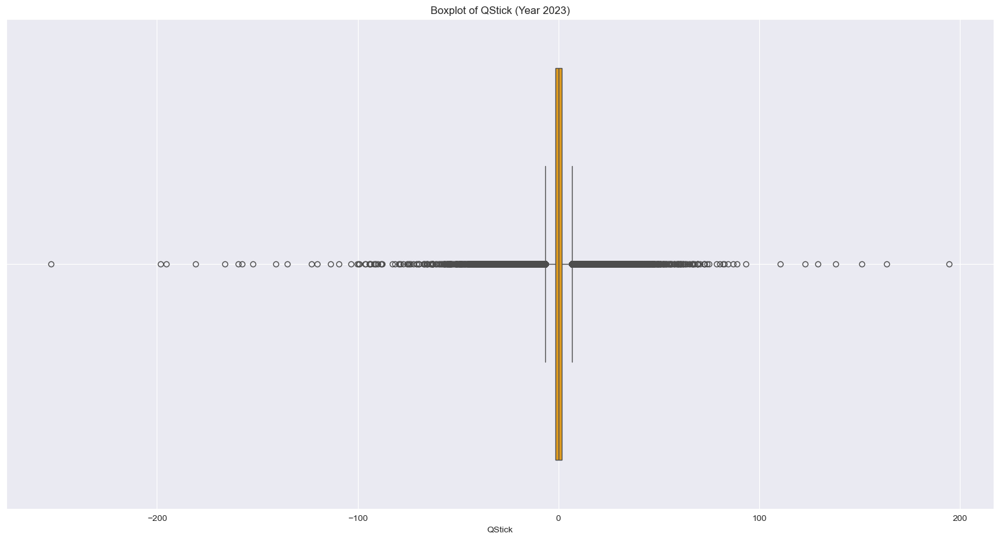


Distribution of year (Year 2023):


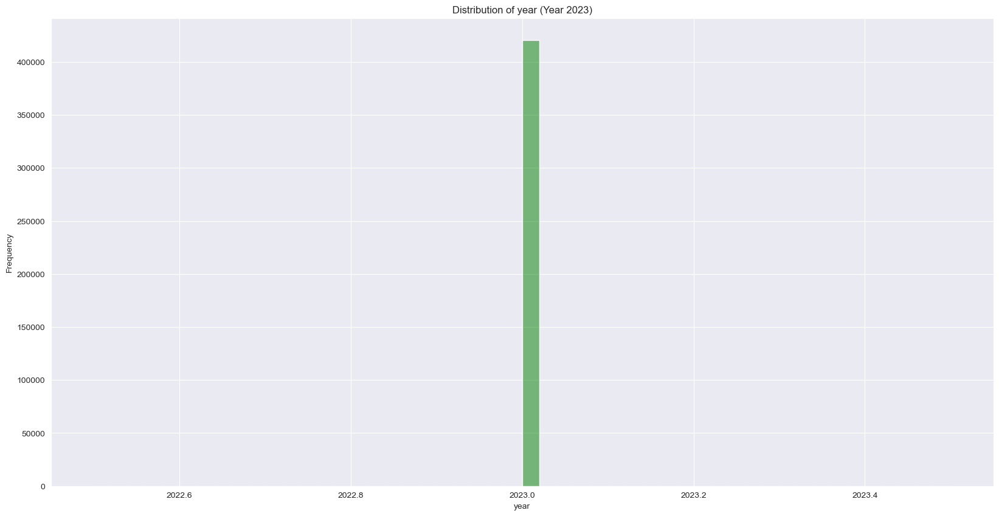


Boxplot of year (Year 2023):


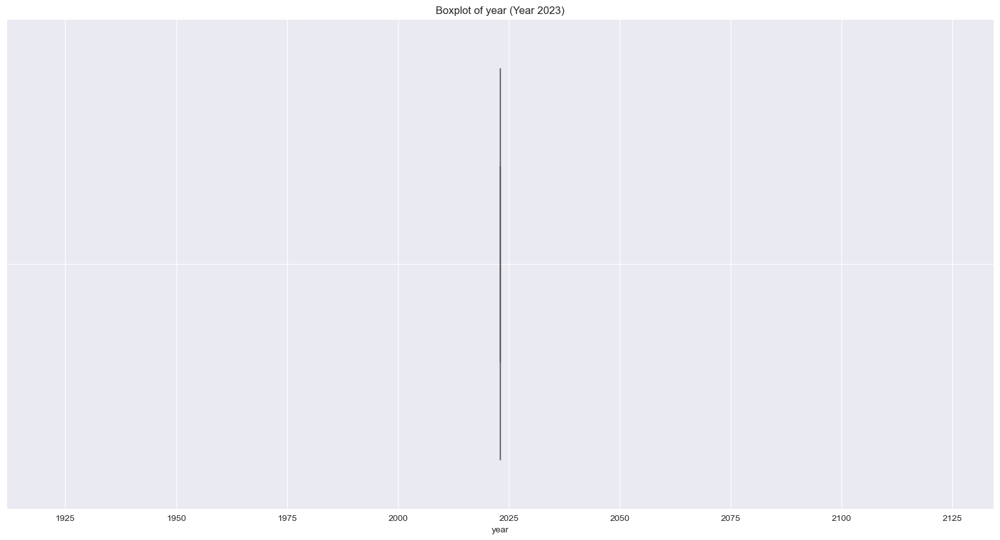


Distribution of day_of_week (Year 2023):


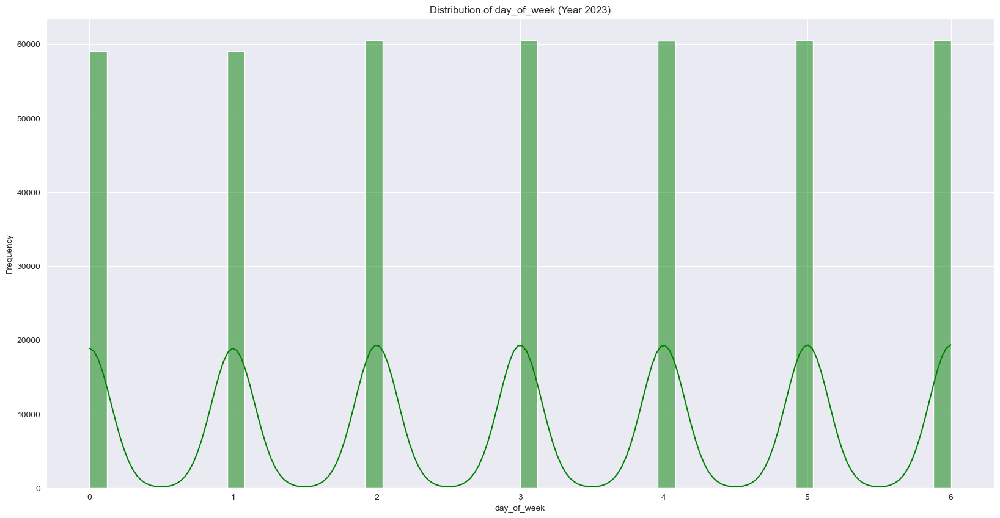


Boxplot of day_of_week (Year 2023):


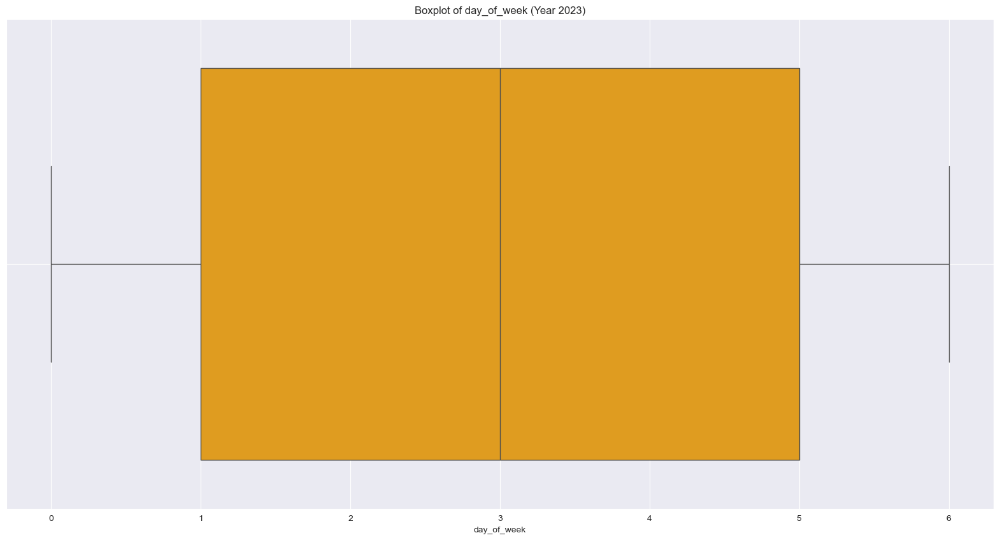


Distribution of month (Year 2023):


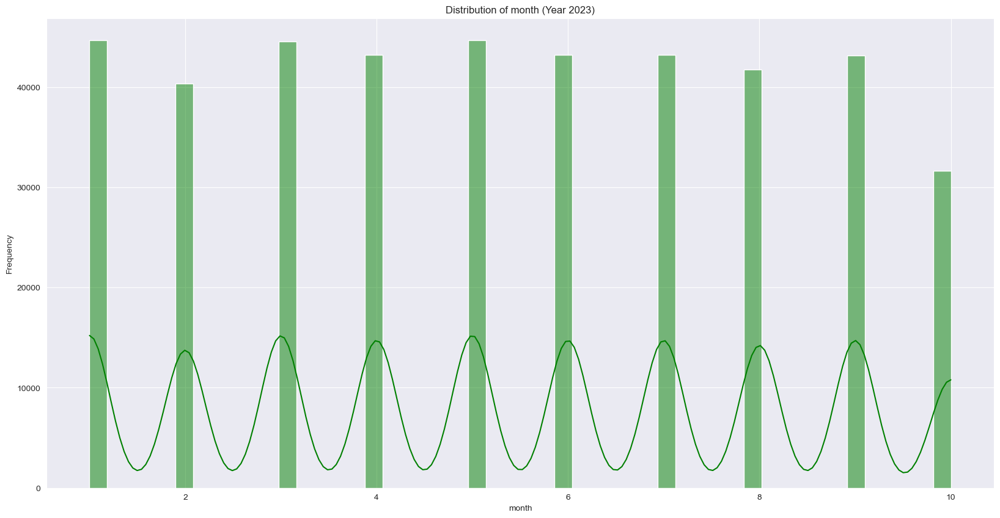


Boxplot of month (Year 2023):


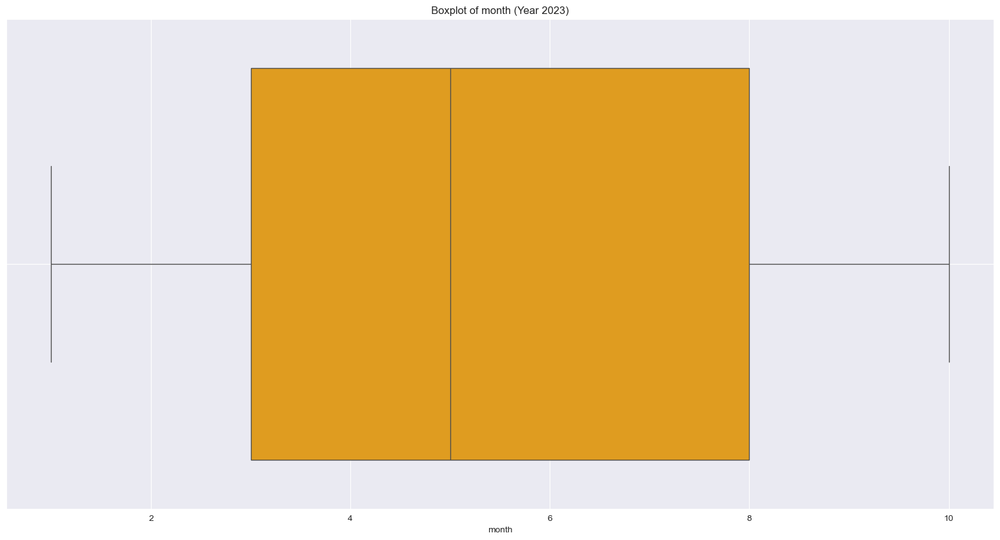


Distribution of week_of_year (Year 2023):


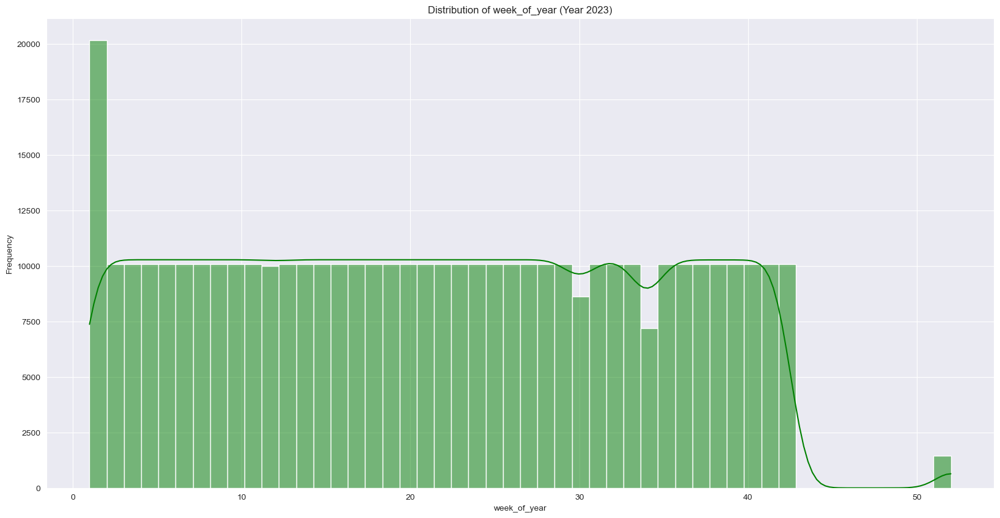


Boxplot of week_of_year (Year 2023):


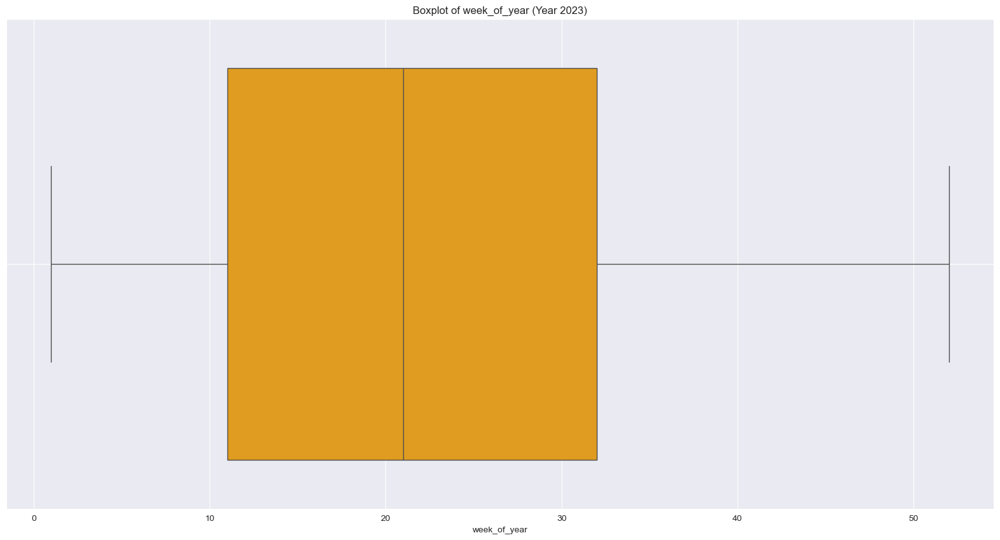


Distribution of time_delta (Year 2023):


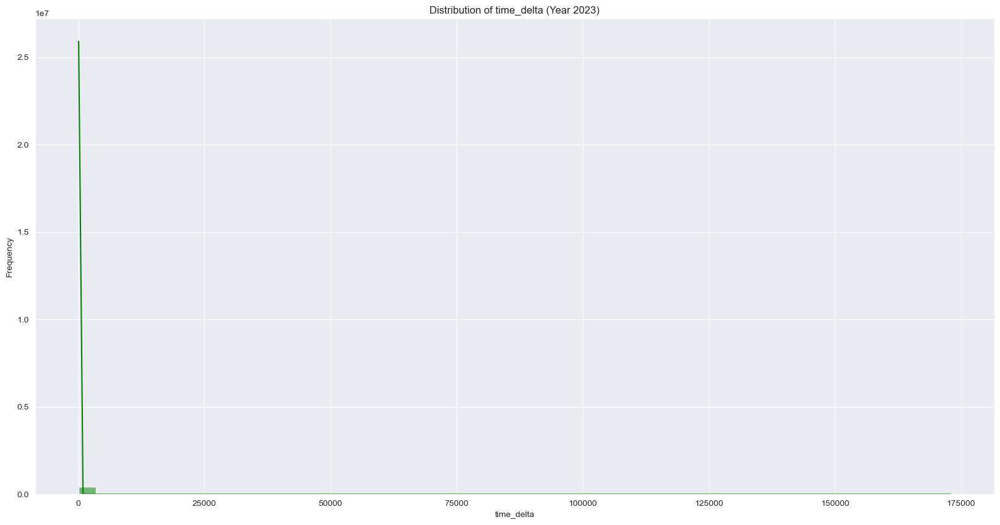


Boxplot of time_delta (Year 2023):


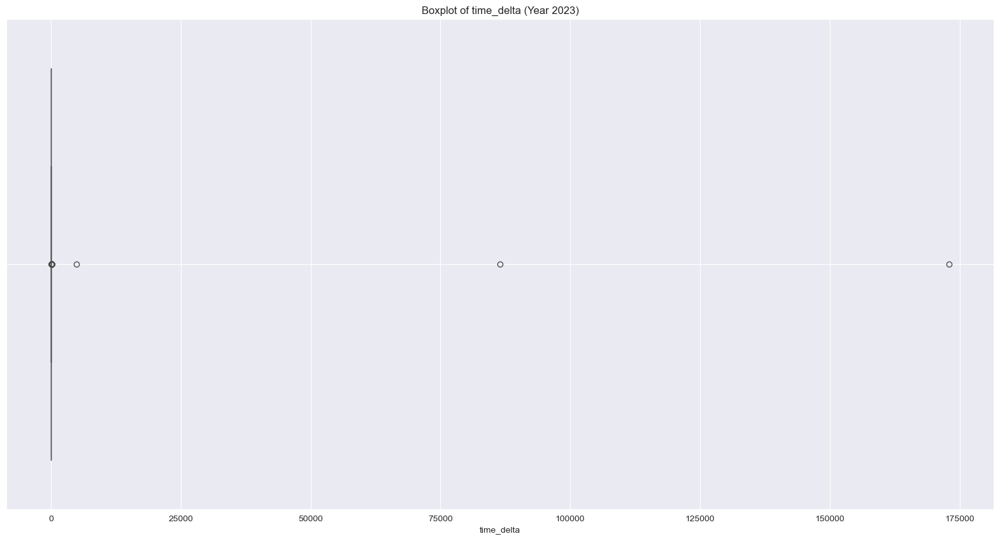

In [25]:
# Distributions and Outliers
print("\n" + "="*50)
print("DISTRIBUTIONS AND OUTLIERS")
print("="*50)

# Entire dataset distributions
numeric_columns = df.select_dtypes(include=[np.number]).columns
for col in numeric_columns:
    print(f"\nDistribution of {col} (Entire Dataset):")
    plt.figure(figsize=(20, 10))
    sns.histplot(df[col], kde=True, bins=50, color='blue')
    plt.title(f"Distribution of {col} (Entire Dataset)")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

    # Clear the plot after display
    plt.clf()  # Clear the current figure
    plt.close()  # Close the figure completely to free memory

# Per year distributions
for year, yearly_df in yearly_data.items():
    for col in numeric_columns:
        print(f"\nDistribution of {col} (Year {year}):")
        plt.figure(figsize=(20, 10))
        sns.histplot(yearly_df[col], kde=True, bins=50, color='green')
        plt.title(f"Distribution of {col} (Year {year})")
        plt.xlabel(col)
        plt.ylabel("Frequency")
        plt.grid(True)
        plt.show()

        # Clear the plot after display
        plt.clf()  # Clear the current figure
        plt.close()  # Close the figure completely to free memory

        # Boxplot for outlier detection
        print(f"\nBoxplot of {col} (Year {year}):")
        plt.figure(figsize=(20, 10))
        sns.boxplot(x=yearly_df[col], color='orange')
        plt.title(f"Boxplot of {col} (Year {year})")
        plt.xlabel(col)
        plt.grid(True)
        plt.show()

        # Clear the plot after display
        plt.clf()  # Clear the current figure
        plt.close()  # Close the figure completely to free memory

In [26]:
# Apply the tests to the entire dataset
normality_results = perform_normality_tests(df)

Skipping column 'time_delta' (Subsample has zero range).


In [27]:
# Display results
print("\nNormality Test Results (Entire Dataset):")
display(normality_results)


Normality Test Results (Entire Dataset):


,Column,Shapiro-Wilk,Shapiro p-value,Kolmogorov-Smirnov,KS p-value,Anderson-Darling,AD Statistic,AD Critical Value (5%)
0,open,Not Normal,2.575203e-38,Not Normal,0.000000e+00,Not Normal,25845.062912,0.787
1,high,Not Normal,2.460729e-38,Not Normal,0.000000e+00,Not Normal,25880.829540,0.787
2,low,Not Normal,2.696461e-38,Not Normal,0.000000e+00,Not Normal,25809.164291,0.787
3,close,Not Normal,2.569391e-38,Not Normal,0.000000e+00,Not Normal,25845.035856,0.787
4,Volume USDT,Not Normal,1.466383e-79,Not Normal,0.000000e+00,Not Normal,228224.137004,0.787
5,tradecount,Not Normal,5.617090e-75,Not Normal,0.000000e+00,Not Normal,219363.555472,0.787
6,hour,Not Normal,1.659614e-38,Not Normal,0.000000e+00,Not Normal,24310.483564,0.787
7,ema_5,Not Normal,2.568229e-38,Not Normal,0.000000e+00,Not Normal,25844.564911,0.787
8,ema_15,Not Normal,2.569860e-38,Not Normal,0.000000e+00,Not Normal,25843.551686,0.787
9,ema_30,Not Normal,2.562198e-38,Not Normal,0.000000e+00,Not Normal,25842.028230,0.787


In [28]:
# Perform the tests per year
for year, yearly_df in yearly_data.items():
    print(f"\nNormality Test Results (Year {year}):")
    yearly_normality_results = perform_normality_tests(yearly_df)
    display(yearly_normality_results)  # Display yearly results


Normality Test Results (Year 2020):
Skipping column 'year' due to zero range (all values are identical).
Skipping column 'time_delta' (Subsample has zero range).


,Column,Shapiro-Wilk,Shapiro p-value,Kolmogorov-Smirnov,KS p-value,Anderson-Darling,AD Statistic,AD Critical Value (5%)
0,open,Not Normal,6.503383e-60,Not Normal,0.000000e+00,Not Normal,34494.569497,0.787
1,high,Not Normal,6.006234e-60,Not Normal,0.000000e+00,Not Normal,34558.028417,0.787
2,low,Not Normal,7.246887e-60,Not Normal,0.000000e+00,Not Normal,34430.344665,0.787
3,close,Not Normal,6.632992e-60,Not Normal,0.000000e+00,Not Normal,34495.312135,0.787
4,Volume USDT,Not Normal,4.413268e-86,Not Normal,0.000000e+00,Not Normal,83993.861945,0.787
5,tradecount,Not Normal,8.681307e-79,Not Normal,0.000000e+00,Not Normal,51499.044650,0.787
6,hour,Not Normal,4.678985e-38,Not Normal,0.000000e+00,Not Normal,6417.938184,0.787
7,ema_5,Not Normal,6.458003e-60,Not Normal,0.000000e+00,Not Normal,34497.629451,0.787
8,ema_15,Not Normal,6.406617e-60,Not Normal,0.000000e+00,Not Normal,34502.886399,0.787
9,ema_30,Not Normal,6.362745e-60,Not Normal,0.000000e+00,Not Normal,34510.578932,0.787



Normality Test Results (Year 2021):
Skipping column 'year' due to zero range (all values are identical).
Skipping column 'time_delta' (Subsample has zero range).


,Column,Shapiro-Wilk,Shapiro p-value,Kolmogorov-Smirnov,KS p-value,Anderson-Darling,AD Statistic,AD Critical Value (5%)
0,open,Not Normal,8.307602e-36,Not Normal,0.000000e+00,Not Normal,6720.307935,0.787
1,high,Not Normal,7.895858e-36,Not Normal,0.000000e+00,Not Normal,6718.799780,0.787
2,low,Not Normal,8.163437e-36,Not Normal,0.000000e+00,Not Normal,6721.300707,0.787
3,close,Not Normal,8.177442e-36,Not Normal,0.000000e+00,Not Normal,6720.323549,0.787
4,Volume USDT,Not Normal,1.992431e-81,Not Normal,0.000000e+00,Not Normal,55635.985051,0.787
5,tradecount,Not Normal,1.872780e-78,Not Normal,0.000000e+00,Not Normal,45400.866875,0.787
6,hour,Not Normal,1.776376e-38,Not Normal,0.000000e+00,Not Normal,6366.527194,0.787
7,ema_5,Not Normal,7.825670e-36,Not Normal,0.000000e+00,Not Normal,6723.008774,0.787
8,ema_15,Not Normal,7.302454e-36,Not Normal,0.000000e+00,Not Normal,6727.950694,0.787
9,ema_30,Not Normal,7.003014e-36,Not Normal,0.000000e+00,Not Normal,6734.778542,0.787



Normality Test Results (Year 2022):
Skipping column 'year' due to zero range (all values are identical).
Skipping column 'time_delta' due to zero range (all values are identical).


,Column,Shapiro-Wilk,Shapiro p-value,Kolmogorov-Smirnov,KS p-value,Anderson-Darling,AD Statistic,AD Critical Value (5%)
0,open,Not Normal,5.251834e-55,Not Normal,0.000000e+00,Not Normal,31141.633474,0.787
1,high,Not Normal,5.292743e-55,Not Normal,0.000000e+00,Not Normal,31130.039393,0.787
2,low,Not Normal,5.266839e-55,Not Normal,0.000000e+00,Not Normal,31153.159205,0.787
3,close,Not Normal,5.317889e-55,Not Normal,0.000000e+00,Not Normal,31141.769412,0.787
4,Volume USDT,Not Normal,2.866764e-76,Not Normal,0.000000e+00,Not Normal,46975.011897,0.787
5,tradecount,Not Normal,3.158713e-68,Not Normal,0.000000e+00,Not Normal,30469.433593,0.787
6,hour,Not Normal,1.575762e-38,Not Normal,0.000000e+00,Not Normal,6402.560859,0.787
7,ema_5,Not Normal,5.286027e-55,Not Normal,0.000000e+00,Not Normal,31143.927998,0.787
8,ema_15,Not Normal,5.218903e-55,Not Normal,0.000000e+00,Not Normal,31148.232990,0.787
9,ema_30,Not Normal,5.143830e-55,Not Normal,0.000000e+00,Not Normal,31154.573067,0.787



Normality Test Results (Year 2023):
Skipping column 'year' due to zero range (all values are identical).
Skipping column 'time_delta' (Subsample has zero range).


,Column,Shapiro-Wilk,Shapiro p-value,Kolmogorov-Smirnov,KS p-value,Anderson-Darling,AD Statistic,AD Critical Value (5%)
0,open,Not Normal,9.719478e-47,Not Normal,0.000000e+00,Not Normal,9772.514741,0.787
1,high,Not Normal,9.829771e-47,Not Normal,0.000000e+00,Not Normal,9759.706847,0.787
2,low,Not Normal,9.726019e-47,Not Normal,0.000000e+00,Not Normal,9786.102076,0.787
3,close,Not Normal,9.714316e-47,Not Normal,0.000000e+00,Not Normal,9772.276757,0.787
4,Volume USDT,Not Normal,1.203408e-79,Not Normal,0.000000e+00,Not Normal,56209.211019,0.787
5,tradecount,Not Normal,9.761521e-75,Not Normal,0.000000e+00,Not Normal,50368.574385,0.787
6,hour,Not Normal,8.952761e-38,Not Normal,0.000000e+00,Not Normal,5123.535336,0.787
7,ema_5,Not Normal,1.426915e-46,Not Normal,0.000000e+00,Not Normal,9771.168650,0.787
8,ema_15,Not Normal,1.670649e-46,Not Normal,0.000000e+00,Not Normal,9767.962540,0.787
9,ema_30,Not Normal,1.488314e-46,Not Normal,0.000000e+00,Not Normal,9762.931719,0.787



TIME SERIES ANALYSIS AND SEASONALITY
Monthly Average Close Prices (Entire Dataset):


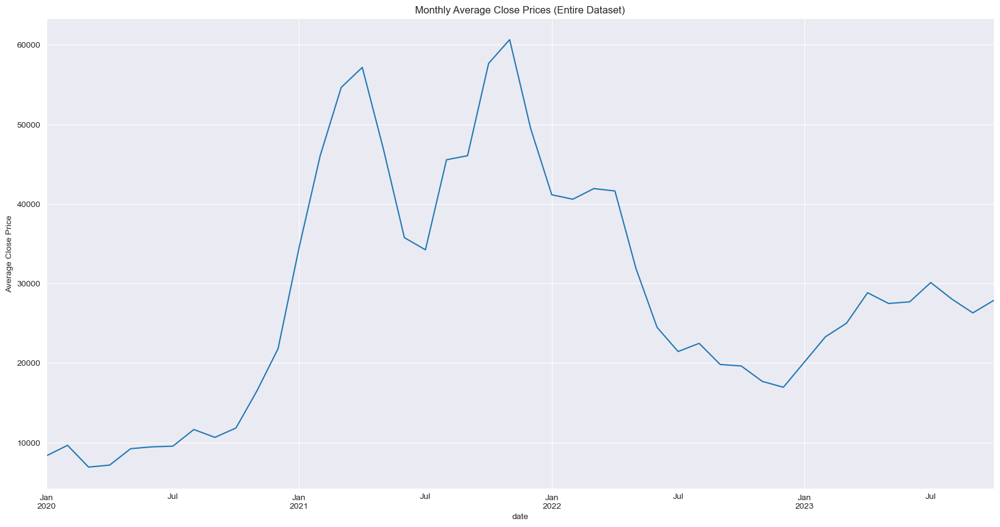

Skipping column 'time_delta' (Subsample has zero range).

Monthly Average Close Prices (Year 2020):


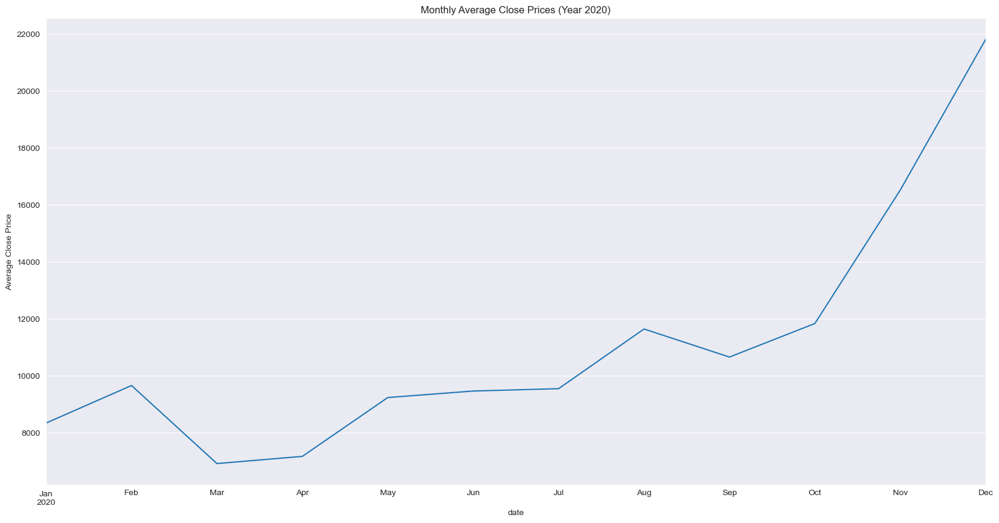


Monthly Average Close Prices (Year 2021):


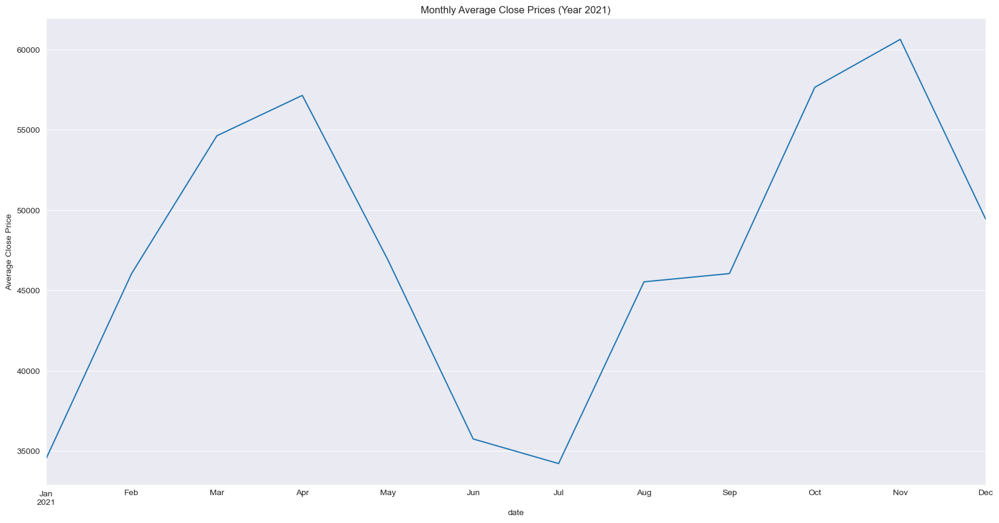


Monthly Average Close Prices (Year 2022):


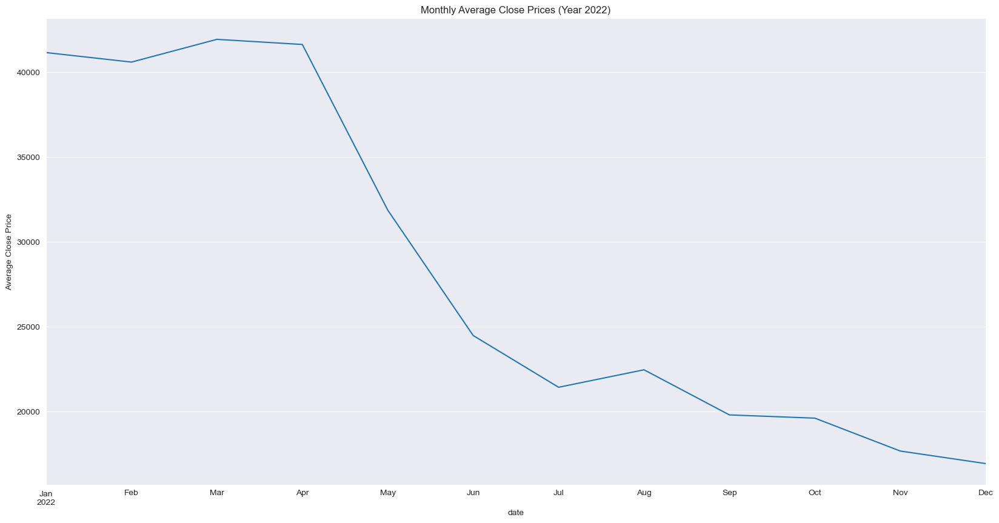


Monthly Average Close Prices (Year 2023):


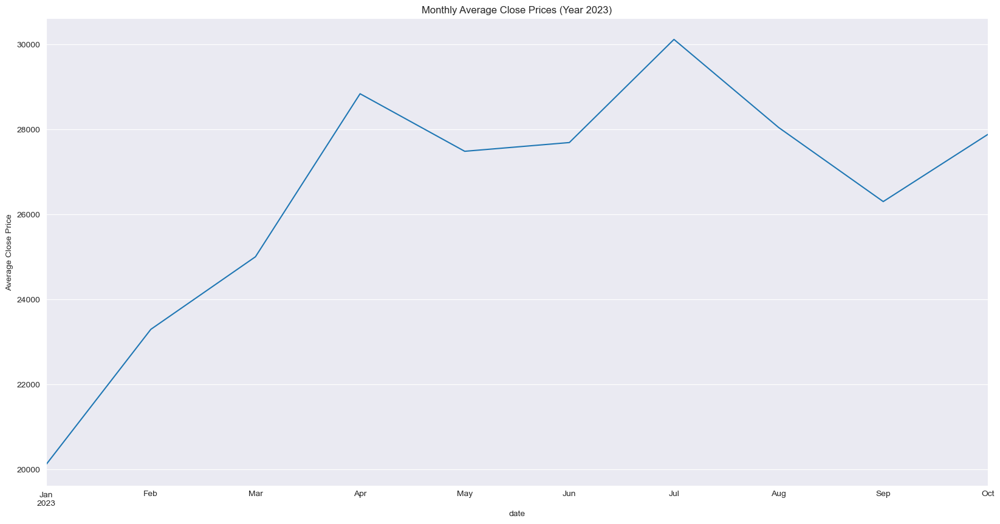


Rolling Average (30-Day) for Close Prices (Entire Dataset):


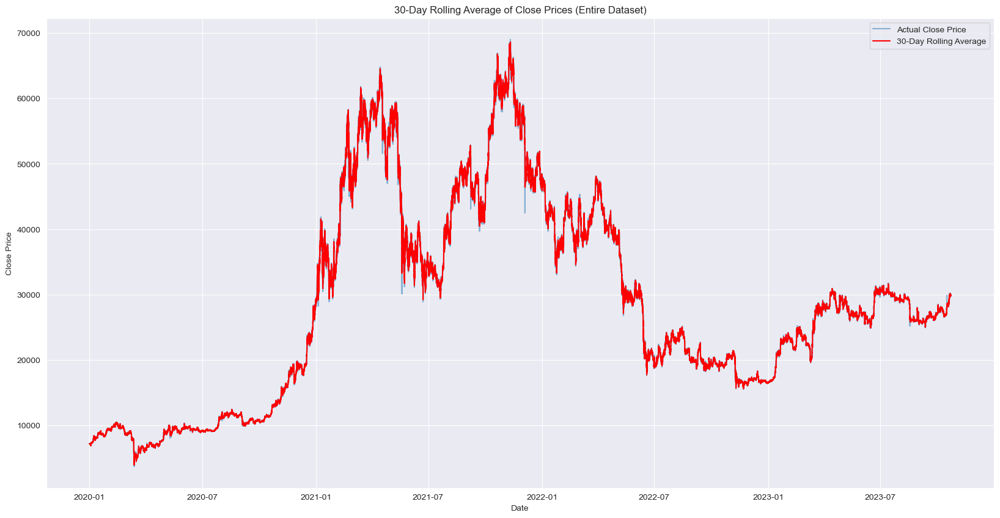

In [29]:
# Time Series and Seasonality
print("\n" + "="*50)
print("TIME SERIES ANALYSIS AND SEASONALITY")
print("="*50)

# Monthly averages for the entire dataset
print("Monthly Average Close Prices (Entire Dataset):")
monthly_avg = df.groupby(df['date'].dt.to_period("M"))['close'].mean()
monthly_avg.plot(figsize=(20, 10), title="Monthly Average Close Prices (Entire Dataset)", ylabel="Average Close Price")
plt.show()

# Clear the plot after display
plt.clf()  # Clear the current figure
plt.close()  # Close the figure completely to free memory

# Per year monthly averages# Apply the tests to the entire dataset
normality_results = perform_normality_tests(df)
for year, yearly_df in yearly_data.items():
    print(f"\nMonthly Average Close Prices (Year {year}):")
    monthly_avg_yearly = yearly_df.groupby(yearly_df['date'].dt.to_period("M"))['close'].mean()
    monthly_avg_yearly.plot(figsize=(20, 10), title=f"Monthly Average Close Prices (Year {year})", ylabel="Average Close Price")
    plt.show()

    # Clear the plot after display
    plt.clf()  # Clear the current figure
    plt.close()  # Close the figure completely to free memory

# Rolling averages for smoothing
print("\nRolling Average (30-Day) for Close Prices (Entire Dataset):")
df['close_rolling'] = df['close'].rolling(window=30).mean()
plt.figure(figsize=(20, 10))
plt.plot(df['date'], df['close'], label="Actual Close Price", alpha=0.5)
plt.plot(df['date'], df['close_rolling'], label="30-Day Rolling Average", color="red")
plt.title("30-Day Rolling Average of Close Prices (Entire Dataset)")
plt.xlabel("Date")
plt.ylabel("Close Price")
plt.legend()
plt.show()

# Clear the plot after display
plt.clf()  # Clear the current figure
plt.close()  # Close the figure completely to free memory


DATA QUALITY AND MISSING VALUES

Missing Values (Entire Dataset):
--------------------------------------------------
date              0
symbol            0
open              0
high              0
low               0
close             0
Volume USDT       0
tradecount        0
token             0
hour              0
day               0
ema_5             0
ema_15            0
ema_30            0
ema_60            0
ema_100           0
ema_200           0
WMA               0
MACD              0
MACD_Signal       0
MACD_Hist         0
ATR               0
HMA               0
KAMA              0
CMO               0
Z-Score           0
QStick            0
year              0
day_of_week       0
month             0
week_of_year      0
time_delta        0
close_rolling    29
dtype: int64


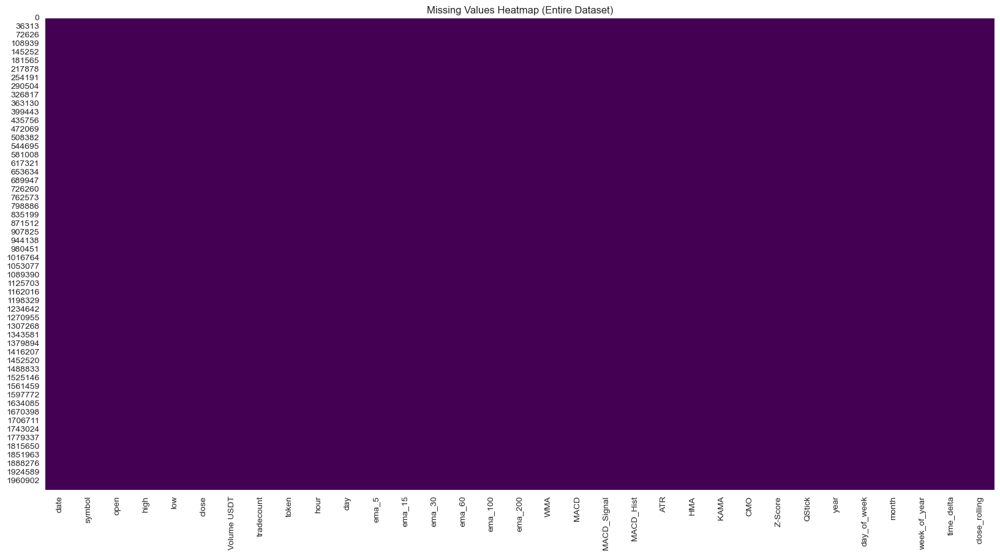


Missing Values Summary (Year 2020):
--------------------------------------------------
date            0
symbol          0
open            0
high            0
low             0
close           0
Volume USDT     0
tradecount      0
token           0
hour            0
day             0
ema_5           0
ema_15          0
ema_30          0
ema_60          0
ema_100         0
ema_200         0
WMA             0
MACD            0
MACD_Signal     0
MACD_Hist       0
ATR             0
HMA             0
KAMA            0
CMO             0
Z-Score         0
QStick          0
year            0
day_of_week     0
month           0
week_of_year    0
time_delta      0
dtype: int64

Missing Values Summary (Year 2021):
--------------------------------------------------
date            0
symbol          0
open            0
high            0
low             0
close           0
Volume USDT     0
tradecount      0
token           0
hour            0
day             0
ema_5           0
ema_15          0
e

In [30]:
# Data Quality and Missing Values
print("\n" + "="*50)
print("DATA QUALITY AND MISSING VALUES")
print("="*50)

print("\nMissing Values (Entire Dataset):")
print("-"*50)
print(df.isna().sum())

# Missing values heatmap
plt.figure(figsize=(20, 10))
sns.heatmap(df.isna(), cbar=False, cmap="viridis")
plt.title("Missing Values Heatmap (Entire Dataset)")
plt.show()

# Clear the plot after display
plt.clf()  # Clear the current figure
plt.close()  # Close the figure completely to free memory

# Per year missing values summary
for year, yearly_df in yearly_data.items():
    print(f"\nMissing Values Summary (Year {year}):")
    print("-"*50)
    print(yearly_df.isna().sum())

In [31]:
# Key Observations and Insights
print("\n" + "="*50)
print("KEY OBSERVATIONS AND INSIGHTS")
print("="*50)

# Entire dataset key observations
print("\nKey Observations for the Entire Dataset:")
print("-"*50)
print(f"Highest Close Price: {df['close'].max()} on {df.loc[df['close'].idxmax(), 'date']}")
print(f"Lowest Close Price: {df['close'].min()} on {df.loc[df['close'].idxmin(), 'date']}")
print(f"Highest Volume: {df['Volume USDT'].max()} on {df.loc[df['Volume USDT'].idxmax(), 'date']}")
print(f"Most Active Day (Trades): {df['tradecount'].max()} on {df.loc[df['tradecount'].idxmax(), 'date']}")

# Per year key observations
for year, yearly_df in yearly_data.items():
    print(f"\nKey Observations for Year {year}:")
    print("-"*50)
    print(f"Highest Close Price: {yearly_df['close'].max()} on {yearly_df.loc[yearly_df['close'].idxmax(), 'date']}")
    print(f"Lowest Close Price: {yearly_df['close'].min()} on {yearly_df.loc[yearly_df['close'].idxmin(), 'date']}")
    print(f"Highest Volume: {yearly_df['Volume USDT'].max()} on {yearly_df.loc[yearly_df['Volume USDT'].idxmax(), 'date']}")
    print(f"Most Active Day (Trades): {yearly_df['tradecount'].max()} on {yearly_df.loc[yearly_df['tradecount'].idxmax(), 'date']}")


KEY OBSERVATIONS AND INSIGHTS

Key Observations for the Entire Dataset:
--------------------------------------------------
Highest Close Price: 69000.0 on 2021-11-10 14:16:00
Lowest Close Price: 3706.96 on 2020-03-13 02:16:00
Highest Volume: 160935802 on 2020-08-02 04:38:00
Most Active Day (Trades): 107315 on 2023-03-14 12:30:00

Key Observations for Year 2020:
--------------------------------------------------
Highest Close Price: 29293.14 on 2020-12-31 00:20:00
Lowest Close Price: 3706.96 on 2020-03-13 02:16:00
Highest Volume: 160935802 on 2020-08-02 04:38:00
Most Active Day (Trades): 29025 on 2020-06-24 10:38:00

Key Observations for Year 2021:
--------------------------------------------------
Highest Close Price: 69000.0 on 2021-11-10 14:16:00
Lowest Close Price: 28235.47 on 2021-01-04 10:16:00
Highest Volume: 115549406 on 2021-11-03 18:00:00
Most Active Day (Trades): 55181 on 2021-11-03 18:00:00

Key Observations for Year 2022:
--------------------------------------------------
